# ***Spatial-RISE***

## Introduction
This notebook presents the implementation of the **Spatial-RISE** method, an extension of the Randomized Input Sampling for Explanation (RISE) algorithm, specifically adapted to handle spatial data in the context of hydrological forecasting.

The goal of **Spatial-RISE** is to generate saliency maps for machine learning models that predict groundwater levels based on historical meteorological data. Unlike the original RISE method, which was primarily designed for standard image data, **Spatial-RISE** focuses on spatially distributed features, such as precipitation and temperature values.

### Objectives
- **Saliency Map Generation**: Show which spatial regions contribute the most to model predictions.
- **Gaussian Noise Application**: Modify the input data by applying spatial Gaussian noise to simulate perturbations.
- **Model Explanation**: Provide an interpretable explanation of the model's predictions, highlighting the most influential spatial features.
- **Evaluation Metrics (Insertion/Deletion)**: Assess the quality of the generated saliency maps using **Insertion** and **Deletion** metrics. These metrics evaluate how well the saliency maps identify critical regions by measuring the impact of incrementally inserting or removing the most salient regions on the model's prediction accuracy.

This notebook will guide through the key steps of the **Spatial-RISE** implementation, including:
1. Data preparation and loading of rasterized meteorological features.
2. Application of spatial Gaussian noise to perturb input data.
3. Generation of saliency maps based on the model's response to these perturbations.
4. **Evaluation** of the saliency maps using **Insertion** and **Deletion** metrics.
5. Visualization and interpretation of the resulting saliency maps.

The code and approach used here are directly tied to the methods and extensions described in the thesis work on applying **XAI techniques** for hydrological prediction models.


In [ ]:
# Dependencies

# Specify the TensorFlow version used
# TensorFlow 2.15.0 is chosen for compatibility with Keras and other dependencies.
!pip install tensorflow==2.15.0  # cuDNN 8.9, CUDA 12.2
!pip install keras==2.15.0  # Keras for high-level neural networks
# General libraries for data manipulation and numerical computations
!pip install numpy==1.25.2  # Fundamental package for numerical computing
!pip install pandas==2.0.3  # Data manipulation and analysis
# Libraries for handling spatial and raster data
!pip install rioxarray==0.15.5  # Raster I/O with xarray
!pip install rasterio==1.3.10  # Reading and writing raster datasets
!pip install geopandas==0.13.2  # Geospatial data manipulation
# Libraries for data visualization
!pip install matplotlib==3.7.1  # Comprehensive library for static, animated, and interactive visualizations
!pip install seaborn==0.13.1  # Statistical data visualization based on Matplotlib
!pip install matplotlib_scalebar==0.8.1  # Adds a scale bar to Matplotlib plots
!pip install adjustText==1.1.1  # Helps adjust text in Matplotlib for better readability
# Libraries for scientific computing and handling NetCDF data
!pip install xarray==2023.7.0  # N-D array support with labeled axes
!pip install netCDF4==1.6.5  # Reading and writing NetCDF files
!pip install cftime==1.6.3  # Provides time handling capabilities
# Other useful libraries
!pip install imageio==2.31.6  # For reading and writing image data
!pip install cmasher==1.8.0  # Colormaps for Matplotlib
!pip install great-circle-calculator==1.3.1  # Calculate great circle distances between points
!pip install geopy==2.4.1  # For geocoding and distance calculations
!pip install scipy==1.11.4  # Scientific and technical computing


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import activations
import sys
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.models import load_model
from keras import activations
import numpy as np
import copy

#### ***Loading Data from Google Drive***

In [ ]:
#### ***Loading Data from Google Drive***

# Define the base path for data storage in Google Drive
# Change the base_path to point to the correct directory where your data is stored
base_path = "./MyDrive/Water_Resources/"

# Specify different subdirectories for various data and model types
data_path = base_path + "data/training_validation_test_splits"  # Path for training, validation, and test data
model_path = base_path + "trained_models/"  # Path for trained models
modules_path = base_path + "python_modules/"  # Path for additional Python modules
xai_path = base_path + "XAI/"  # Path for XAI-related resources
results_path = xai_path + "results/"  # Path for storing results from XAI analysis

In [ ]:
# IMPORT DATA FOR VOTTIGNASCO

# Paths to the .npy files containing the data for Vottignasco
v_test_OHE_path = data_path + '/Vottignasco_00425010001_test_month_OHE.npy'  # One-Hot Encoded test data
v_test_image_path = data_path + '/Vottignasco_00425010001_test_normalized_image_sequences.npy'  # Normalized image sequences for testing
v_test_target_dates_path = data_path + '/Vottignasco_00425010001_test_target_dates.npy'  # Target dates for the test data

# Load the NumPy arrays from the specified .npy files
vottingasco_test_OHE = np.load(v_test_OHE_path)  # Load One-Hot Encoded data
vottignasco_test_image = np.load(v_test_image_path)  # Load normalized image sequences
vottignasco_test_dates = np.load(v_test_target_dates_path)  # Load target dates for the test set


In [ ]:
print(len(vottignasco_test_dates))
print(len(vottignasco_test_image))
print(len(vottingasco_test_OHE))

105
105
105


In [ ]:
# Visualize the data for Vottignasco

# Display the One-Hot Encoded representation of the first instance in the test set
print(vottingasco_test_OHE[0], "\n")  # One-Hot Encoding of seasons for the first test instance

# Display the normalized image of the first instance in the test set
print(vottignasco_test_image[0][0], "\n")  # Normalized image sequence for the first test instance


[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] 

[[[-0.55874205 -0.63231546 -1.0530392 ]
  [-0.62497324 -0.24734885 -0.95617104]
  [-0.64852315 -0.29456472 -1.0120971 ]
  [-0.6475669   0.01120646 -0.9414161 ]
  [-0.6483382   0.04486901 -0.9291374 ]
  [-0.64837635  0.21673024 -0.7445328 ]
  [-0.6482272   0.01929929 -0.9028175 ]
  [-0.64826417 -0.35680774 -0.71746933]]

 [[-0.56017417 -0.30140942 -1.0722721 ]
  [-0.6341238  -0.3249078  -1.1285268 ]
  [-0.64822614 -0.2947506  -0.9674306 ]
  [-0.6474924   0.08621608 -0.8394658 ]
  [-0.6481902   0.17821798 -0.8374907 ]
  [-0.64775074  0.14878109 -0.8802751 ]
  [-0.6477138   0.09261598 -1.0055645 ]
  [-0.64804226  0.06027458 -1.1226149 ]]

 [[-0.64782256 -0.32245472 -1.1192324 ]
  [-0.64856017 -0.17655824 -0.96336424]
  [-0.64591223 -0.43483806 -1.0460285 ]
  [-0.6466841   0.08755382 -0.7752676 ]
  [-0.6481902   0.13593481 -0.814374  

#### ***Models Loading***

In [ ]:
from keras.models import load_model

# If you want to load the entire model, dropout_custom layer has to be defined:

mc_dropout = True

# Definizione della classe personalizzata doprout_custom
class doprout_custom(tf.keras.layers.SpatialDropout1D):
    def call(self, inputs, training=None):
        if mc_dropout:
            return super().call(inputs, training=True)
        else:
            return super().call(inputs, training=False)

In [ ]:
# Find the paths of the ensemble models for Vottignasco in Google Drive
import os

# Define the base directory for the Vottignasco models
base_dir = model_path + "seq2val/Vottignasco"  # Directory containing the models
lstm_suffix = 'time_dist_LSTM'  # Suffix used to identify LSTM model files

# Initialize lists to store model and weight paths
vott_lstm_models = []  # List to store paths of LSTM models
vott_lstm_weights = []  # List to store paths of model weights

def extract_index(filename):
    """Function to extract the final index from the filename."""
    return int(filename.split('_')[-1].split('.')[0])  # Extracts the numeric index from the filename

# Traverse the directory and add relevant files to their respective lists
for root, _, files in os.walk(base_dir):
    for filename in files:
        full_path = os.path.join(root, filename)  # Get the full path of the file
        if lstm_suffix in filename:  # Check if the file is an LSTM model
            if filename.endswith(".keras"):  # Check for model files
                vott_lstm_models.append(full_path)  # Add model path to the list
            else:  # Otherwise, it's a weights file
                vott_lstm_weights.append(full_path)  # Add weights path to the list

# Sort the model and weight paths based on the extracted index from the filenames
vott_lstm_models = sorted(vott_lstm_models, key=lambda x: extract_index(os.path.basename(x)))  # Sort models
vott_lstm_weights = sorted(vott_lstm_weights, key=lambda x: extract_index(os.path.basename(x)))  # Sort weights


In [ ]:
# List of paths for the loaded models and weights
vott_lstm_models_loaded = []  # List to store the loaded Vottignasco LSTM models
racc_lstm_models_loaded = []  # (Assuming this will be used later for another set of models)

# Loop to load the LSTM models
for i in range(10):
    print(f"Loading LSTM models {i+1}")  # Indicate the loading progress of LSTM models

    # Load VOTTIGNASCO model
    model_lstm_path = vott_lstm_models[i]  # Get the path for the current LSTM model
    # Load the CNN+LSTM model using the specified path
    model = load_model(model_lstm_path, custom_objects={"doprout_custom": doprout_custom})  # Load the model with custom objects
    # Append the loaded model to the list of loaded models
    vott_lstm_models_loaded.append(model)  # Add the loaded model to the list


In [ ]:
vott_lstm_models_loaded

## ***SPATIAL RISE***

### ***Generate Masks: Gaussian-Noise 2D***


In [ ]:
import matplotlib.pyplot as plt

# Function to generate Gaussian perturbation
def gaussian_perturbation(height, width, sigma_x, sigma_y, beta, amplitude=None):
    """
    Generates a Gaussian perturbation based on the specified parameters.

    Parameters:
    - height: Height of the perturbation matrix.
    - width: Width of the perturbation matrix.
    - sigma_x: Standard deviation along the x-axis.
    - sigma_y: Standard deviation along the y-axis.
    - beta: Scaling factor for the perturbation.
    - amplitude: Optional; defines the amplitude of the Gaussian.
                 If not provided, it defaults to (1 / (2 * π * sigma_x * sigma_y)).

    Returns:
    - perturbation: A 2D array representing the Gaussian perturbation.
    """

    # Set default amplitude if not provided
    if amplitude is None:
        amplitude = (1 / (2 * np.pi * sigma_x * sigma_y))

    # Create a grid of x and y values
    x = np.arange(0, width)  # x coordinates
    y = np.arange(0, height)  # y coordinates
    xx, yy = np.meshgrid(x, y)  # Create a meshgrid for 2D Gaussian

    # Randomly select the center of the Gaussian perturbation
    x_p = np.random.randint(0, width)  # Random x coordinate for the peak
    y_p = np.random.randint(0, height)  # Random y coordinate for the peak

    # Calculate the Gaussian perturbation
    perturbation = beta * amplitude * np.exp(-0.5 * ((xx - x_p) ** 2 / sigma_x ** 2 + (yy - y_p) ** 2 / sigma_y ** 2))

    return perturbation  # Return the generated perturbation


[[9.18273336e-11 2.73733423e-07 1.37912809e-04 1.17436285e-02
  1.69013315e-01 4.11112291e-01 1.69013315e-01 1.17436285e-02]
 [2.23363144e-10 6.65836147e-07 3.35462628e-04 2.85655008e-02
  4.11112291e-01 1.00000000e+00 4.11112291e-01 2.85655008e-02]
 [9.18273336e-11 2.73733423e-07 1.37912809e-04 1.17436285e-02
  1.69013315e-01 4.11112291e-01 1.69013315e-01 1.17436285e-02]
 [6.38048005e-12 1.90199430e-08 9.58265796e-06 8.15987835e-04
  1.17436285e-02 2.85655008e-02 1.17436285e-02 8.15987835e-04]
 [7.49299871e-14 2.23363144e-10 1.12535175e-07 9.58265796e-06
  1.37912809e-04 3.35462628e-04 1.37912809e-04 9.58265796e-06]]


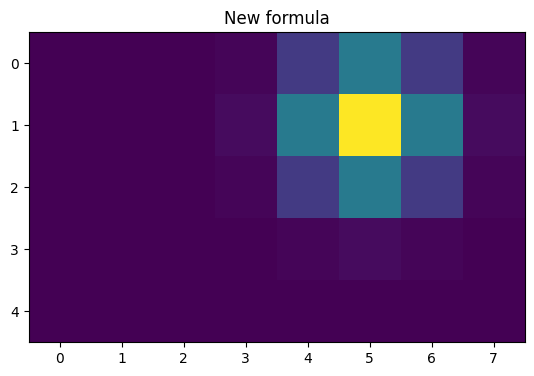

In [ ]:
# Generate a new Gaussian perturbation
new_perturbation = gaussian_perturbation(height=5, width=8, sigma_x=0.75, sigma_y=0.75, beta=1, amplitude=1.0)

# Visualize the generated Gaussian perturbation
plt.imshow(new_perturbation, cmap='viridis')  # Display the perturbation with a colormap
plt.title("New Gaussian Perturbation")  # Set the title for the plot
plt.show()  # Show the plot

# Print the perturbation matrix to console
print(new_perturbation)  # Display the values of the generated perturbation

In [ ]:
import numpy as np
from tqdm import tqdm
import random

# Function to generate N Gaussian masks
def generate_masks_gaussian(N, input_size, sigma_x, sigma_y, x1=None):
    # Create an empty array to hold the masks with shape (N, height, width, 1)
    masks = np.empty((N, *(input_size), 1))

    # Generate N masks with a progress bar
    for i in tqdm(range(N), desc='Generating masks'):
        # Randomly choose the multiplicative factor for the perturbation
        beta = random.choice([-1, 1])  # +1 for positive masks, -1 for negative masks
        # Generate a Gaussian perturbation mask
        perturbation = gaussian_perturbation(input_size[0], input_size[1], sigma_x, sigma_y, beta, amplitude=1.0)
        # Reshape the perturbation and store it in the masks array
        masks[i] = perturbation.reshape(-1, *(input_size), 1)  # Reshape for better visualization

    return masks  # Return the array of generated masks


In [ ]:
import numpy as np
import copy

# Function to add Gaussian noise to a specific channel of images
def additive_gaussianNoise_onechannel(images, masks, index_feat_to_perturb):
    masked = []  # List to store masked images

    # Iterate over all generated masks
    for mask in masks:
        # Create a deep copy of the original images
        masked_images = copy.deepcopy(images)

        # Add the mask to the specified channel of the images
        masked_images[..., index_feat_to_perturb] = np.add(
            masked_images[..., index_feat_to_perturb],
            mask[..., 0]  # Remove unnecessary dimensions
        )

        # Append the perturbed images to the list
        masked.append(masked_images)

    return masked  # Return the list of masked images


### ***RISE***

In [ ]:
def ensemble_predict(models, images, x3_exp):
    # Check the type of images; if it's a list, get the length for the ensemble
    if type(images) == list:
        len_x3 = len(images)  # Number of masked images
    else:
        len_x3 = 1  # Only one image provided
        images = np.expand_dims(images, axis=0)  # Expand dimensions to match expected input shape

    # Prepare the input for the ensemble model
    Y_test = np.stack(images)  # Stack images into a NumPy array
    Y_test_x3 = np.tile(x3_exp, (len_x3, 1, 1))  # Duplicate x3_exp for each image

    # Initialize a list to collect predictions from each model
    all_preds = []

    # Iterate through the models and gather predictions
    for model in models:  # Use the models passed as a parameter
        preds = model.predict([Y_test, Y_test_x3], verbose=0)  # Make predictions
        all_preds.append(preds)  # Store predictions

    # Convert the list of predictions into a NumPy array for easier mean calculation
    all_preds_array = np.array(all_preds)

    # Calculate the mean predictions across all models (along axis 0)
    mean_preds = np.mean(all_preds_array, axis=0)

    return mean_preds  # Return the mean predictions


In [ ]:
def explain(models, x1, x3, generate_masks_func, apply_mask_func,
            index_feat_to_perturb=None, N=1000, sigma_x=0.75, sigma_y=0.75, input_size=(5, 8)):
    """
    Implementation of RISE

    :param models: List of pretrained models.
    :param x1: Input images.
    :param x3: One-hot encoded input.
    :param generate_masks_func: Function to generate masks.
    :param apply_mask_func: Function to apply masks to images.
    :param index_feat_to_perturb: Indices of features to perturb.
    :param N: Maximum number of masks.
    :param sigma_x: Sigma for mask generation.
    :param sigma_y: Sigma for mask generation.
    :param input_size: Size of the input.
    :return: Final saliency map.
    """

    # Original prediction without masks
    pred_original = ensemble_predict(models, x1, x3)  # Average predictions of the ensemble
    #print("original pred:", pred_original)

    # Generation and application of Gaussian masks
    masks = generate_masks_func(N, input_size, sigma_x, sigma_y, x1)
    masked_images = apply_mask_func(x1, masks, index_feat_to_perturb)

    # Prediction on perturbed images with the ensemble
    preds_masked = ensemble_predict(models, masked_images, x3)
    #print("pred_masked:", preds_masked)

    diff_pred = [abs(pred_original - pred_masked) for pred_masked in preds_masked]
    #print("diff_pred:", diff_pred)

    weights_array = np.concatenate(diff_pred, axis=0)

    # Calculation of the initial saliency map
    sal = calculate_saliency_map(weights_array, masks)

    # The final saliency map is in `sal`
    print("Processo completato.", "\n")
    print("Mappa di salienza finale:")
    print(sal)
    return sal

In [ ]:
def calculate_saliency_map(weights_array, masks):
    """
    Calculates the average saliency map given a series of predictions and masks.

    :param weights_array: Array of predictions (weights of the masks).
    :param masks: Array of masks (number of masks x mask dimensions).
    :return: Average saliency map.
    """
    sal = []
    for j in range(len(masks)):
        sal_j = weights_array[j] * np.abs(masks[j])
        sal.append(sal_j.reshape(-1, 5, 8))

    # Remove extra dimensions to compute np.mean along axis=0. masks has shape (N, 5, 8, 1)
    masks_squeezed = np.squeeze(np.abs(masks))
    # Now calculate the mean along axis 0
    ev_masks = np.mean(masks_squeezed, axis=0)

    sal = (1 / ev_masks) * np.mean(sal, axis=0)  # Addition of the fraction 1/expected_value(masks)

    return sal


### ***Evaluation: Insertion/Deletion***

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

def calculate_auc(x, y):
    """
    Calculates the area under the curve (AUC) using the trapezoidal method.

    :param x: Values on the x-axis (fraction of pixels/frames inserted).
    :param y: Values on the y-axis (calculated errors).
    :return: Area under the curve.
    """
    return np.trapz(y, x)

In [ ]:
import numpy as np

def get_top_n_pixels(saliency_map, n):
    """
    Returns the coordinates of the top n most important pixels from the given saliency map.

    :param saliency_map: Saliency map (2D array).
    :param n: Number of pixels to extract.
    :return: List of tuples with the coordinates (row, col) of the most important pixels.
    """
    # Flatten the saliency map to create a 1D array
    flat_saliency = saliency_map.flatten()

    # Sort the indices of the elements in descending order of saliency
    sorted_indices = np.argsort(flat_saliency)[::-1]

    # Calculate the number of columns in the saliency map
    num_cols = saliency_map.shape[1]

    top_pixels = []
    for i in range(min(n, len(sorted_indices))):  # Ensure we don't exceed the number of pixels
        idx = sorted_indices[i]
        row, col = divmod(idx, num_cols)  # Get the 2D coordinates from the flat index
        top_pixels.append((row, col))

    return top_pixels


#### ***Insertion***

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import copy

def update_image_with_important_pixels(image, initial_image, important_indices, step):
    """
    Updates the image by inserting the most important pixels.

    :param image: Current image.
    :param initial_image: Original image.
    :param important_indices: Indices of important pixels.
    :param step: Current insertion step.
    :return: Updated image.
    """
    new_image = image.copy()
    if step < len(important_indices):
        row, col = important_indices[step]
        new_image[:, row, col, :] = initial_image[:, row, col, :]
    return new_image

def insertion(models, original_images, x3, important_indices, initial_blurred_images):
    """
    Calculates the insertion metric for a given explanation.
    """

    # Original prediction
    original_prediction = ensemble_predict(models, original_images, x3)[0]
    print("Original prediction:", original_prediction)

    # List to store instances to which pixels are added gradually. Initialized with the initial blurred instance.
    insertion_images = [initial_blurred_images]

    # Prediction on the initial image (all pixels set to zero)
    I_prime = copy.deepcopy(initial_blurred_images)

    # Gradually add the most important pixels (for each frame). Get a list with all images with pixels added gradually.
    for n in range(len(important_indices)):
        I_prime = update_image_with_important_pixels(I_prime, original_images, important_indices, n)
        insertion_images.append(I_prime)

    # Calculate predictions on instances where pixels have been gradually added
    new_predictions = ensemble_predict(models, insertion_images, x3)
    # For each of these predictions, calculate the MSE against the original instance's prediction (as in the test set). Ignore the first one which is on the original blurred image.
    errors = [mean_squared_error(original_prediction, masked_pred) for masked_pred in new_predictions[1:]]

    initial_error = mean_squared_error(original_prediction, new_predictions[0])
    print(f"Initial Prediction with Blurred Images, new prediction: {new_predictions[0]}, error: {initial_error}")
    only_inserted_pixel_new_predictions = new_predictions[1:]
    for nr_pixel, error in enumerate(errors):
        print(f"Pixel {important_indices[nr_pixel]}, new prediction: {only_inserted_pixel_new_predictions[nr_pixel]}, error: {error}")

    total_errors = [initial_error] + errors  # Initial error + errors on all inserted pixels

    # Normalize the fraction of inserted pixels
    # x = np.arange(len(total_errors)) / len(total_errors)
    x = np.linspace(0, 1, len(total_errors))

    # Calculate AUC
    auc = calculate_auc(x, total_errors)
    print(f"Area under the curve (AUC): {auc}")

    # Plot the error curve and the area under the curve (AUC)
    plt.plot(x, total_errors, label='Error curve')
    plt.fill_between(x, total_errors, color='skyblue', alpha=0.4)
    plt.text(x[-1] * 0.95, max(total_errors) * 0.9, f'AUC: {auc:.2f}',
             horizontalalignment='right')  # text on the right
    plt.xlabel('Fraction of pixels inserted')
    plt.ylabel('Mean Squared Error')
    plt.title('Insertion Metric Curve')
    plt.legend()
    plt.show()

    return total_errors, auc


In [ ]:
def get_errors_from_insertion(test_image, test_OHE, nr_instance, important_indices, initial_blurred_images, models):
    """
    Retrieves the errors from the insertion process for a specific test instance.
    """
    original_images = copy.deepcopy(test_image[nr_instance])
    print(important_indices, "\n")
    x3 = copy.deepcopy(test_OHE[nr_instance])

    errors, auc = insertion(models, original_images, x3, important_indices, initial_blurred_images)

    return errors, auc

#### ***Deletion***

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

def update_image_by_removing_pixels(image, important_indices, step):
    """
    Updates the image by removing the most important pixels.

    :param image: Current image.
    :param important_indices: Indices of the important pixels.
    :param step: Current removal step.
    :return: Updated image.
    """
    new_image = image.copy()
    if step < len(important_indices):
        row, col = important_indices[step]
        new_image[:, row, col, :] = 0  # Set the pixels to zero
    return new_image

def deletion(models, original_images, x3, important_indices):
    """
    Calculates the removal metric for a given explanation.

    :param models: List of pretrained models.
    :param original_images: Original image.
    :param x3: One-hot encoding for prediction.
    :param important_indices: Indices of the pixels in order of importance.
    :return: List of errors at each removal step.
    """
    # Original prediction
    original_prediction = ensemble_predict(models, original_images, x3).flatten()
    print("Original prediction:", original_prediction)

    # List to store images where pixels are gradually removed (for each time-step)
    deletions_images = []

    # Initialization
    I_prime = copy.deepcopy(original_images)

    # Gradually remove the most important pixels and store the instances in deletions_images
    for n in range(len(important_indices)):
        I_prime = update_image_by_removing_pixels(I_prime, important_indices, n)
        deletions_images.append(I_prime)

    # Calculate the prediction on all images where pixels have been gradually removed
    new_predictions = ensemble_predict(models, deletions_images, x3)
    # Calculate the MSE with respect to the original prediction
    errors = [mean_squared_error(original_prediction, masked_pred) for masked_pred in new_predictions]

    initial_error = 0.0
    print(f"Initial Prediction with Original Images, prediction: {original_prediction}, error: {initial_error}")
    for nr_pixel, error in enumerate(errors):
        print(f"Removed pixel {important_indices[nr_pixel]}, new prediction: {new_predictions[nr_pixel]}, error: {error}")

    total_errors = [initial_error] + errors  # Initial error + errors for all removed pixels

    # Normalize the fraction of removed pixels
    x = np.linspace(0, 1, len(total_errors))

    # Calculate the AUC
    auc = calculate_auc(x, total_errors)
    print(f"Area under the curve (AUC): {auc}")

    # Plot the error curve and area under the curve (AUC)
    plt.plot(x, total_errors, label='Error curve')
    plt.fill_between(x, total_errors, color='lightcoral', alpha=0.4)

    # Set the title with padding to the right to make space for the AUC text
    plt.title('Deletion Metric Curve', pad=10)

    # Position the AUC text to the right of the title
    plt.text(1.02, 1.02, f'AUC: {auc:.2f}',
             horizontalalignment='left',
             transform=plt.gca().transAxes,  # Coordinates with respect to the axis (from 0 to 1)
             fontsize=11)

    plt.xlabel('Fraction of pixels removed')
    plt.ylabel('Mean Squared Error')
    plt.legend()
    plt.tight_layout()  # Ensure that elements do not overlap
    plt.show()

    return total_errors, auc


In [ ]:
def get_errors_from_deletion(test_image, test_OHE, nr_instance, important_indices, models):
    original_images = copy.deepcopy(test_image[nr_instance])
    print("Important indices -> ", important_indices, "\n")
    x3 = copy.deepcopy(test_OHE[nr_instance])

    # Execute the deletion function
    errors, auc = deletion(models, original_images, x3, important_indices)

    return errors, auc

## ***Testing and Evaluation***

In [ ]:
import matplotlib.pyplot as plt

def plot_saliency_map_single(sal_map, title="Explanation for Precipitation"):
    """
    Plots a single saliency map.

    :param sal_map: Saliency map to plot.
    :param title: Title for the saliency map (default: "Explanation for Precipitation").
    """
    fig, ax = plt.subplots(figsize=(8, 6))  # Figure size

    ax.set_title(title)
    # ax.axis('off')  # Remove axes
    ax.imshow(sal_map, cmap='Reds', alpha=0.7, origin="lower")

    # Show the figure with the image
    plt.show()


In [ ]:
import imageio
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

def gif_sm(sm, test_dates):
    """
    Generates a list of images (in numpy array format) from a series of spatial saliency maps
    and the corresponding dates to create a GIF.

    Parameters:
    - sm: array of spatial saliency maps
    - test_dates: array of dates associated with the maps

    Returns:
    - image_list: list of images (numpy array format) converted from matplotlib figures
    """
    image_list = []

    # Add dates to the frames
    for i, image in enumerate(sm):
        # Create a figure with increased dimensions
        fig, ax = plt.subplots(figsize=(8, 6))  # Modify (8, 6) to increase or decrease size
        cax = ax.matshow(image[0], cmap='Reds', origin="lower")  # Use the 'Reds' colormap

        # Set the title with the instance and date
        ax.set_title(f"Spatial Saliency Map for Instance nr: {i}, Date: {test_dates[i][0].astype(str).split('T')[0]}")

        plt.axis('off')  # Remove axes

        # Convert the figure to a numpy array image
        fig.canvas.draw()  # Render the figure
        image_array = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
        image_array = image_array.reshape(fig.canvas.get_width_height()[::-1] + (3,))

        image_list.append(image_array)
        plt.close(fig)  # Close the figure

    return image_list


### ***Vottignasco: Explaination for all Test-Set instances***

In [ ]:
from tqdm import tqdm
import numpy as np

# Calculate SALIENCY MAPS only for Precipitation for ALL instances in the VOTTIGNASCO test set
vott_norm_sm_all_instances = []

models = vott_lstm_models_loaded
index_prec = 0   # Index to perturb precipitation

for i, instance in tqdm(enumerate(vottignasco_test_image), desc='Explaining instance in Test-Set'):
    print("Instance nr ->", i, "in Test-Set")
    x3 = vottingasco_test_OHE[i].copy()

    # Generate saliency map for the current instance
    saliency_map_i = explain(models, instance, x3,
                              generate_masks_gaussian,
                              additive_guassianNoise_onechannel,
                              index_prec,
                              N=1000,
                              sigma_x=0.75,
                              sigma_y=0.75)

    vott_norm_sm_all_instances.append(saliency_map_i)

Explaining istance in Test-Set: 0it [00:00, ?it/s]

Istance nr -> 0 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13942.53it/s]
Explaining istance in Test-Set: 1it [00:26, 26.39s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.14463234 0.1637443  0.20589108 0.23949595 0.18085479 0.14477996
   0.17732897 0.21194426]
  [0.15164997 0.17903444 0.24701476 0.314159   0.24027858 0.16389241
   0.18394935 0.2260567 ]
  [0.15342061 0.1812818  0.27680745 0.37786712 0.3021596  0.19028135
   0.17580694 0.19781344]
  [0.1595485  0.1699421  0.26416679 0.36576694 0.30340579 0.20485549
   0.17029922 0.1756855 ]
  [0.14704333 0.15681746 0.24638487 0.31591665 0.25018064 0.18896315
   0.17619212 0.18825199]]]
Istance nr -> 1 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8711.29it/s]
Explaining istance in Test-Set: 2it [00:51, 25.36s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09882527 0.15448978 0.22659154 0.25061435 0.1708215  0.12265119
   0.14570263 0.17434964]
  [0.10161494 0.15460833 0.25559445 0.31519674 0.22185721 0.13126654
   0.14594275 0.18970776]
  [0.10945114 0.14002595 0.25600007 0.36128164 0.27358077 0.14297547
   0.14231702 0.19192443]
  [0.12487299 0.13994909 0.24824246 0.35971084 0.29219343 0.17686643
   0.17407115 0.20411529]
  [0.1090544  0.13130383 0.24213371 0.32484365 0.25520236 0.18206103
   0.20238086 0.2201898 ]]]
Istance nr -> 2 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 15080.37it/s]
Explaining istance in Test-Set: 3it [01:19, 26.81s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.0919598  0.13765407 0.21819959 0.24283809 0.16014584 0.10008807
   0.1290602  0.17139278]
  [0.10242301 0.14645425 0.24651985 0.29658827 0.20810462 0.11901585
   0.14343553 0.2003255 ]
  [0.12230314 0.14609485 0.24824294 0.34015233 0.25869723 0.14532959
   0.15218155 0.2041641 ]
  [0.1412728  0.1435084  0.23011868 0.3312691  0.27039312 0.17787465
   0.17504488 0.1998332 ]
  [0.12354438 0.13176807 0.21729328 0.29673706 0.23717359 0.17624139
   0.1826111  0.19300805]]]
Istance nr -> 3 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13680.72it/s]
Explaining istance in Test-Set: 4it [01:41, 24.92s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10345156 0.13216769 0.21174727 0.24491743 0.16519567 0.11746561
   0.15098607 0.18898529]
  [0.11581203 0.14138179 0.24061446 0.30617068 0.21244631 0.12504493
   0.1546974  0.21702706]
  [0.12363537 0.14197787 0.25357609 0.35128819 0.26978483 0.14951454
   0.15267039 0.21031768]
  [0.12919812 0.14021495 0.24565969 0.34231029 0.2764104  0.1743968
   0.1723391  0.20770699]
  [0.11706493 0.13732722 0.24165355 0.31042643 0.24141526 0.18232817
   0.19708815 0.21171306]]]
Istance nr -> 4 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 7244.01it/s]
Explaining istance in Test-Set: 5it [02:05, 24.61s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08342032 0.13699031 0.23049643 0.26653351 0.16353053 0.09567625
   0.13667606 0.18069043]
  [0.09453533 0.14693323 0.26407179 0.32800434 0.22114015 0.11383821
   0.14888379 0.21041882]
  [0.12486359 0.15584126 0.26693308 0.35766358 0.26508892 0.14494507
   0.15612196 0.21460751]
  [0.14493524 0.15708603 0.25732217 0.35586809 0.28823034 0.1869225
   0.19153545 0.22546332]
  [0.13224077 0.1544828  0.26171029 0.33039781 0.26248103 0.19401086
   0.21097061 0.22975891]]]
Istance nr -> 5 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14905.82it/s]
Explaining istance in Test-Set: 6it [02:30, 24.76s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08893183 0.12995185 0.21545273 0.24505662 0.15787743 0.11246866
   0.15821459 0.21386993]
  [0.10068046 0.13951023 0.25296598 0.31500216 0.21333653 0.12304815
   0.16593764 0.23250692]
  [0.12376464 0.14668453 0.26976449 0.36768604 0.27590989 0.1475246
   0.15732506 0.21936086]
  [0.15353927 0.16102271 0.26499315 0.36365677 0.30263759 0.19037148
   0.18943442 0.22185189]
  [0.14718282 0.15598345 0.25601083 0.33366701 0.28831356 0.20723721
   0.21551075 0.22810777]]]
Istance nr -> 6 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13893.02it/s]
Explaining istance in Test-Set: 7it [02:52, 23.70s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09195902 0.13911294 0.2282666  0.26307095 0.17536288 0.11759654
   0.16332916 0.20422798]
  [0.10506723 0.14668061 0.25866035 0.32193892 0.21378644 0.12254761
   0.17117078 0.23426211]
  [0.12706674 0.15228328 0.2675871  0.37341371 0.27640493 0.14950475
   0.17333547 0.23931009]
  [0.15521884 0.16337643 0.25960504 0.3641318  0.30024142 0.19835227
   0.20205617 0.24244686]
  [0.14854772 0.16145604 0.25014103 0.32428231 0.27332705 0.20850685
   0.21619771 0.23921367]]]
Istance nr -> 7 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14114.20it/s]
Explaining istance in Test-Set: 8it [03:17, 24.13s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08757241 0.13643207 0.22629312 0.27927036 0.19169108 0.12353629
   0.16746667 0.22053574]
  [0.09656639 0.13651146 0.24206562 0.32760023 0.24082702 0.13740636
   0.17746636 0.24866919]
  [0.12750174 0.14685917 0.25650416 0.37504442 0.30325929 0.17292026
   0.17741611 0.2435347 ]
  [0.16472476 0.16195795 0.2687743  0.39251016 0.32751234 0.21151528
   0.20861203 0.23736963]
  [0.15385543 0.15779374 0.27112711 0.36161476 0.28231697 0.20256657
   0.22720744 0.24359213]]]
Istance nr -> 8 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13871.57it/s]
Explaining istance in Test-Set: 9it [03:39, 23.53s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07866381 0.13309923 0.23118744 0.27547149 0.18743295 0.12524371
   0.1680054  0.21479835]
  [0.10269924 0.14802234 0.25887931 0.33685647 0.23180714 0.14179548
   0.18705685 0.24312907]
  [0.13486549 0.16924023 0.28262632 0.38857645 0.30559806 0.1777222
   0.18927427 0.24623377]
  [0.15384033 0.17328659 0.27909146 0.39918177 0.3538711  0.23680186
   0.21637733 0.25258512]
  [0.13022155 0.15670117 0.27282194 0.36956051 0.31493517 0.23288963
   0.23282279 0.26142645]]]
Istance nr -> 9 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8044.73it/s]
Explaining istance in Test-Set: 10it [04:03, 23.80s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08524184 0.14838206 0.24810389 0.28665013 0.19706403 0.12214881
   0.17536    0.24147303]
  [0.10504616 0.15391703 0.27419    0.34895923 0.24488452 0.13569414
   0.18329385 0.26456823]
  [0.14181357 0.16711503 0.2833571  0.39793344 0.30420522 0.16730958
   0.18502769 0.26163733]
  [0.17301867 0.18126363 0.28543561 0.40038709 0.33543727 0.21903278
   0.22536654 0.26098976]
  [0.15788792 0.1717824  0.28216547 0.37459035 0.30786636 0.23179032
   0.249763   0.26226821]]]
Istance nr -> 10 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 10841.05it/s]
Explaining istance in Test-Set: 11it [04:27, 23.86s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09726223 0.14382351 0.23556504 0.27986127 0.187333   0.12868116
   0.1819279  0.23278857]
  [0.11517035 0.16501689 0.28017074 0.34093898 0.23393704 0.14461412
   0.19369159 0.25986171]
  [0.14511343 0.18638857 0.2990075  0.39323328 0.29851958 0.17388923
   0.19067516 0.25824557]
  [0.16891114 0.19217395 0.30401452 0.40998056 0.34929957 0.23267405
   0.2309748  0.26798792]
  [0.15629668 0.18669065 0.31116017 0.39411366 0.32448177 0.2449922
   0.25223849 0.26818977]]]
Istance nr -> 11 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13263.80it/s]
Explaining istance in Test-Set: 12it [04:50, 23.34s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08259025 0.13161096 0.22972065 0.26905062 0.1664479  0.10389873
   0.17088682 0.23119232]
  [0.10803772 0.15632327 0.27870654 0.35118248 0.23068045 0.12973345
   0.19198393 0.26202085]
  [0.1513579  0.17465996 0.29459921 0.41234097 0.30261506 0.172837
   0.20026193 0.26021535]
  [0.18710054 0.18819884 0.29562004 0.42009369 0.34016924 0.23404157
   0.24409217 0.27424774]
  [0.17546816 0.17777473 0.29603576 0.39418791 0.31882586 0.24783495
   0.26810077 0.28320033]]]
Istance nr -> 12 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14784.97it/s]
Explaining istance in Test-Set: 13it [05:14, 23.62s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10231553 0.15898079 0.25465539 0.28045411 0.18389213 0.13029213
   0.18275426 0.23173292]
  [0.13961005 0.19091125 0.30061093 0.35505382 0.23665636 0.14579683
   0.19496239 0.26535122]
  [0.17694864 0.20335617 0.30922406 0.41210729 0.31127538 0.17802584
   0.19456141 0.26644525]
  [0.18882641 0.20355775 0.30360087 0.40874034 0.34101234 0.23161533
   0.24170821 0.29073153]
  [0.15823856 0.19116893 0.30807401 0.38292237 0.31249295 0.23951131
   0.26675303 0.29473482]]]
Istance nr -> 13 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14330.39it/s]
Explaining istance in Test-Set: 14it [05:36, 23.16s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09252502 0.14826759 0.2337942  0.26160347 0.16714901 0.11673528
   0.17694957 0.22927958]
  [0.11823156 0.17466517 0.27797038 0.33422886 0.22042298 0.13079258
   0.18486684 0.25467496]
  [0.16478882 0.19341082 0.2961637  0.40021967 0.29336156 0.16974233
   0.20331708 0.2637786 ]
  [0.19238179 0.19559218 0.29132916 0.4063654  0.33617028 0.24167432
   0.26548313 0.29324186]
  [0.17072073 0.18836689 0.31126534 0.39575909 0.32635894 0.26802944
   0.29790112 0.30692157]]]
Istance nr -> 14 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 7782.45it/s]
Explaining istance in Test-Set: 15it [06:00, 23.39s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10715642 0.16850411 0.2512979  0.26472697 0.17819122 0.13159665
   0.18674847 0.23998225]
  [0.1347073  0.19516169 0.29600617 0.34263132 0.23116425 0.14701028
   0.20059221 0.27518746]
  [0.17199647 0.20480903 0.30880442 0.41437127 0.30955463 0.17778395
   0.20922664 0.29016733]
  [0.20551577 0.21590922 0.31127662 0.42195012 0.35847457 0.25177928
   0.26039998 0.30731166]
  [0.190942   0.21209663 0.3269727  0.40853344 0.3463698  0.27602555
   0.29822134 0.32178249]]]
Istance nr -> 15 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 10564.68it/s]
Explaining istance in Test-Set: 16it [06:24, 23.69s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09855767 0.15586816 0.24503197 0.2770725  0.18872698 0.13787319
   0.18262578 0.23984916]
  [0.13464991 0.18143067 0.29081636 0.35948055 0.25263765 0.15592828
   0.19905747 0.26515125]
  [0.17966879 0.1949775  0.30981731 0.43313827 0.34772599 0.20332134
   0.21216909 0.2777257 ]
  [0.20185513 0.20226967 0.30066677 0.42071365 0.36935343 0.26526606
   0.25947543 0.30402201]
  [0.18254182 0.19221179 0.30936323 0.39970781 0.33048836 0.26938791
   0.28939284 0.31447858]]]
Istance nr -> 16 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13506.96it/s]
Explaining istance in Test-Set: 17it [06:46, 23.13s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.12531255 0.17796722 0.26544104 0.2984982  0.20635101 0.14551951
   0.19457627 0.23187264]
  [0.15412951 0.19099333 0.28700116 0.35336695 0.25596432 0.1718317
   0.21075332 0.26418924]
  [0.18702663 0.20508819 0.31523711 0.42181718 0.32668542 0.21481906
   0.22088628 0.26721231]
  [0.19605941 0.20287445 0.3117608  0.422685   0.35502552 0.25688493
   0.2432289  0.26344816]
  [0.16910315 0.19399857 0.32408196 0.40995149 0.34044958 0.26107388
   0.25808066 0.27438322]]]
Istance nr -> 17 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14689.54it/s]
Explaining istance in Test-Set: 18it [07:10, 23.30s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10240602 0.1603404  0.26739206 0.31555901 0.20499986 0.12896067
   0.18315678 0.23372641]
  [0.12904593 0.17724271 0.30752893 0.3811641  0.25548606 0.14273985
   0.19541693 0.2647612 ]
  [0.17283804 0.1972146  0.31778798 0.43628603 0.33605142 0.18564489
   0.21164592 0.28735582]
  [0.21020366 0.21407729 0.31361033 0.44490579 0.39073412 0.26476463
   0.26732504 0.31773351]
  [0.20699655 0.21760274 0.32653128 0.4256224  0.36684199 0.29123098
   0.30911936 0.3323895 ]]]
Istance nr -> 18 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13385.58it/s]
Explaining istance in Test-Set: 19it [07:33, 23.28s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10151505 0.16102238 0.24761683 0.28274865 0.18723007 0.1235348
   0.16982668 0.21794524]
  [0.13405139 0.1914138  0.28673286 0.33837236 0.22477604 0.13109575
   0.17973732 0.24757333]
  [0.17264347 0.19872507 0.29364641 0.38969674 0.28331753 0.15115086
   0.17341406 0.24573341]
  [0.19869092 0.20147431 0.29844983 0.41490948 0.34524219 0.22594975
   0.22976527 0.27066245]
  [0.18581424 0.20158624 0.31614134 0.40563319 0.3435852  0.26443032
   0.28110274 0.29898806]]]
Istance nr -> 19 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 6107.19it/s]
Explaining istance in Test-Set: 20it [07:56, 23.21s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.15962102 0.20848168 0.29093996 0.3161884  0.21241256 0.15601409
   0.1952917  0.23576014]
  [0.17743794 0.22619807 0.32334146 0.38551377 0.26121514 0.16145963
   0.1979692  0.25768892]
  [0.20821073 0.22481451 0.32970741 0.45395458 0.35646158 0.19702696
   0.19685478 0.25614489]
  [0.25009883 0.24546583 0.33600112 0.45740679 0.39958339 0.26197312
   0.25526145 0.29912892]
  [0.23180701 0.24335759 0.33748737 0.43074464 0.36773919 0.27601748
   0.30730611 0.33911154]]]
Istance nr -> 20 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12983.65it/s]
Explaining istance in Test-Set: 21it [08:21, 23.62s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.13117495 0.18847747 0.28046877 0.30303351 0.20253857 0.13557173
   0.17239193 0.211188  ]
  [0.1457469  0.19797279 0.30918201 0.36886917 0.25451326 0.15157222
   0.17975082 0.23634435]
  [0.16684109 0.19419604 0.3146382  0.42966815 0.32880113 0.18449885
   0.18552566 0.24483779]
  [0.18453084 0.18377034 0.29538941 0.43060134 0.3702533  0.24444448
   0.23535613 0.26910999]
  [0.1688613  0.17168548 0.28077938 0.39192091 0.33779758 0.26552188
   0.27796652 0.28601934]]]
Istance nr -> 21 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11905.86it/s]
Explaining istance in Test-Set: 22it [08:43, 23.22s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10021174 0.16953661 0.27490314 0.32043366 0.2037456  0.13571842
   0.18141785 0.22570513]
  [0.11970067 0.18266648 0.30314706 0.38247862 0.27340297 0.15924849
   0.1857859  0.24298318]
  [0.15527776 0.18985364 0.2991018  0.41729548 0.35012716 0.20413238
   0.17800599 0.23751974]
  [0.17348789 0.17747432 0.28132045 0.41671881 0.37753177 0.25372282
   0.23217634 0.26587183]
  [0.15640774 0.17225935 0.29744393 0.40168228 0.34464432 0.25872872
   0.27361195 0.29296761]]]
Istance nr -> 22 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12499.94it/s]
Explaining istance in Test-Set: 23it [09:08, 23.67s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10554007 0.16631483 0.27475511 0.32117091 0.21464447 0.13601612
   0.16918841 0.21792052]
  [0.11733072 0.17981945 0.32344594 0.41350085 0.29134092 0.17099665
   0.19143374 0.24118911]
  [0.14480436 0.17381232 0.33115773 0.47557884 0.36559368 0.2053076
   0.19556574 0.24183464]
  [0.16797173 0.15678284 0.28488957 0.44813628 0.386139   0.25210922
   0.23445905 0.25634871]
  [0.15989196 0.15255662 0.27219882 0.39370736 0.34126565 0.26291497
   0.27848224 0.29891991]]]
Istance nr -> 23 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13473.64it/s]
Explaining istance in Test-Set: 24it [09:36, 25.20s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09863198 0.15450018 0.27204499 0.3258186  0.22215313 0.1475511
   0.18281168 0.22709041]
  [0.1035131  0.16285576 0.31744988 0.42666882 0.29972357 0.16488416
   0.18735263 0.24874048]
  [0.12966094 0.163254   0.32371149 0.49589367 0.36750091 0.17476781
   0.16817056 0.22909389]
  [0.16089192 0.16012453 0.27206873 0.43596732 0.37785751 0.2243046
   0.21014942 0.23842931]
  [0.14990905 0.15485909 0.25891989 0.3778204  0.32788628 0.23797929
   0.25440813 0.26773261]]]
Istance nr -> 24 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8643.61it/s]
Explaining istance in Test-Set: 25it [09:59, 24.42s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08498971 0.15573396 0.28784485 0.33109341 0.22765707 0.1520035
   0.19190226 0.23848551]
  [0.1051239  0.17477912 0.32940996 0.41315647 0.30378585 0.19031788
   0.21425941 0.26208949]
  [0.13341002 0.15867333 0.30287249 0.4589545  0.3605258  0.21521501
   0.21391485 0.25906474]
  [0.15937532 0.1387635  0.24994711 0.42229459 0.35594499 0.22628574
   0.22002792 0.25530381]
  [0.15274398 0.13578218 0.2400954  0.3644071  0.31500659 0.23342369
   0.24547615 0.27989387]]]
Istance nr -> 25 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 7982.84it/s]
Explaining istance in Test-Set: 26it [10:23, 24.39s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07621762 0.13510507 0.25042352 0.31440823 0.23255565 0.15515186
   0.18090698 0.21150836]
  [0.08621252 0.13820034 0.28174407 0.40754003 0.31351798 0.18561992
   0.18890548 0.22722551]
  [0.10952115 0.12868845 0.27729827 0.45585101 0.38061722 0.22023395
   0.19574822 0.23301155]
  [0.13979217 0.11960514 0.24135408 0.42248139 0.38270708 0.26049722
   0.23011387 0.25083874]
  [0.14482676 0.11945283 0.22250555 0.35561965 0.32378726 0.25628065
   0.25031539 0.2641193 ]]]
Istance nr -> 26 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13179.15it/s]
Explaining istance in Test-Set: 27it [10:47, 24.25s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.21077589 0.22423466 0.29174051 0.35777876 0.26599763 0.20952422
   0.23121595 0.29064062]
  [0.23729085 0.26067836 0.35906522 0.44711168 0.34125413 0.25049715
   0.26910494 0.32344058]
  [0.25354128 0.24873227 0.35151449 0.49728958 0.41835377 0.30174775
   0.303464   0.33748999]
  [0.23657923 0.21613112 0.29033836 0.42725496 0.39368147 0.30462775
   0.30374564 0.32127056]
  [0.20513491 0.20256428 0.27000364 0.34869839 0.33028373 0.29110398
   0.30355062 0.30160105]]]
Istance nr -> 27 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11210.37it/s]
Explaining istance in Test-Set: 28it [11:09, 23.65s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08298997 0.14089328 0.24979398 0.32174856 0.22838061 0.15552052
   0.18288986 0.2223539 ]
  [0.08897013 0.14872517 0.28213593 0.39620626 0.30461543 0.18426017
   0.20213451 0.24410611]
  [0.1229013  0.14953154 0.28344687 0.43130737 0.36232233 0.21516488
   0.20206668 0.23697473]
  [0.15296406 0.13296124 0.24902788 0.41288984 0.36997824 0.24936512
   0.23239864 0.24755376]
  [0.15232595 0.13120196 0.22364063 0.34620043 0.31742849 0.25271609
   0.25331054 0.25264293]]]
Istance nr -> 28 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11516.49it/s]
Explaining istance in Test-Set: 29it [11:34, 23.81s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07524243 0.11292323 0.22680549 0.29822526 0.21191315 0.13913623
   0.16082146 0.20695162]
  [0.07731428 0.11422016 0.24801501 0.37394865 0.28328846 0.17745653
   0.19218467 0.24704257]
  [0.0953108  0.10905438 0.23493358 0.41163579 0.34608599 0.2057742
   0.18640655 0.22870111]
  [0.13165129 0.1161672  0.21138357 0.37180278 0.34253412 0.22288677
   0.20293482 0.22747581]
  [0.1392586  0.12364329 0.21132481 0.33204468 0.29851594 0.22255676
   0.21830723 0.22776834]]]
Istance nr -> 29 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14233.61it/s]
Explaining istance in Test-Set: 30it [11:55, 23.20s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09012436 0.12293131 0.23424666 0.3201802  0.21593051 0.13397026
   0.15114055 0.20046227]
  [0.08271309 0.10945938 0.25119316 0.39845032 0.28818019 0.15084744
   0.16598573 0.22484323]
  [0.09662014 0.11373264 0.23302217 0.4016091  0.33445649 0.1656114
   0.16034637 0.21171071]
  [0.14793279 0.13372986 0.20149731 0.34363628 0.31729491 0.19844499
   0.18744242 0.21351515]
  [0.15636484 0.14619279 0.19889366 0.28009158 0.25990101 0.2109238
   0.213433   0.2136968 ]]]
Istance nr -> 30 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11918.31it/s]
Explaining istance in Test-Set: 31it [12:20, 23.63s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08701967 0.12387624 0.22077212 0.27877338 0.19567895 0.12720365
   0.15446221 0.18166152]
  [0.10390965 0.13560437 0.25769384 0.37516875 0.28862389 0.17104106
   0.18122152 0.21354519]
  [0.13246016 0.13444301 0.26007106 0.43500349 0.34958006 0.20282293
   0.19274325 0.21012441]
  [0.16133673 0.12631794 0.21881167 0.38022039 0.3308565  0.21258677
   0.20349637 0.21240712]
  [0.14377136 0.11363986 0.18536616 0.29073485 0.2541973  0.19556106
   0.21007263 0.21113851]]]
Istance nr -> 31 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14424.72it/s]
Explaining istance in Test-Set: 32it [12:44, 23.74s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.2346114  0.25918703 0.30589787 0.34852489 0.30862344 0.26735618
   0.27578869 0.3013627 ]
  [0.24860199 0.28225871 0.34701415 0.40879052 0.36830218 0.30287306
   0.30224178 0.34740619]
  [0.26604757 0.28247445 0.33313871 0.41730724 0.38576464 0.32312588
   0.31814338 0.33072785]
  [0.27995708 0.26895011 0.30255713 0.36445677 0.36425381 0.32128848
   0.30907176 0.29051878]
  [0.26872557 0.24232186 0.26329294 0.3079239  0.31414293 0.30167765
   0.29811035 0.27555614]]]
Istance nr -> 32 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8323.91it/s]
Explaining istance in Test-Set: 33it [13:06, 23.20s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06790119 0.09986674 0.19979067 0.27921412 0.20433674 0.13167826
   0.15710312 0.19079274]
  [0.07005821 0.10133544 0.23672698 0.36061995 0.26366712 0.14879915
   0.16776945 0.21684421]
  [0.08521713 0.10477083 0.23888563 0.39665698 0.3101663  0.16665226
   0.16881304 0.21856791]
  [0.11041826 0.1075222  0.19282772 0.32150094 0.28164136 0.18392481
   0.17152885 0.18878083]
  [0.10819097 0.10048096 0.16612741 0.25088614 0.21936513 0.17294702
   0.17280875 0.16430876]]]
Istance nr -> 33 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13815.96it/s]
Explaining istance in Test-Set: 34it [13:31, 23.67s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.1111215  0.14218789 0.20641877 0.25441053 0.20972106 0.16010638
   0.17810078 0.19610885]
  [0.11994875 0.14451218 0.22651332 0.31061761 0.25369578 0.16822105
   0.17569455 0.20723269]
  [0.1500273  0.14330383 0.24287801 0.38464197 0.30319222 0.18896365
   0.18460327 0.21068063]
  [0.17930008 0.14285355 0.2002085  0.31893417 0.27663321 0.2050047
   0.19945545 0.20927561]
  [0.16529988 0.13458446 0.16523585 0.22107021 0.20590161 0.19910954
   0.21269864 0.21684952]]]
Istance nr -> 34 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11659.49it/s]
Explaining istance in Test-Set: 35it [13:53, 23.37s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07608051 0.11688959 0.20373319 0.26375734 0.19520937 0.13171251
   0.15823186 0.20064333]
  [0.08624729 0.11676893 0.22140708 0.32702634 0.24210591 0.14315324
   0.1560797  0.1911731 ]
  [0.0951025  0.11560289 0.24006457 0.3848545  0.28677212 0.14932554
   0.14018111 0.16632784]
  [0.11375592 0.10341586 0.17976479 0.30713527 0.25471122 0.1558558
   0.15293045 0.17388948]
  [0.11631936 0.09758722 0.14121125 0.21229617 0.19415559 0.16801019
   0.18795957 0.19860267]]]
Istance nr -> 35 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 15202.65it/s]
Explaining istance in Test-Set: 36it [14:17, 23.56s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.16993311 0.18532728 0.22576924 0.26777253 0.21717637 0.1868942
   0.19542777 0.19970485]
  [0.18145412 0.20468779 0.26265407 0.31364494 0.26696517 0.20439295
   0.20043556 0.21915565]
  [0.19109327 0.19949674 0.27220401 0.35442595 0.31099594 0.23790605
   0.21751928 0.21489038]
  [0.19100029 0.18250576 0.24842934 0.31894336 0.27856269 0.2377216
   0.21804906 0.20494971]
  [0.18998868 0.1808699  0.23060942 0.2707862  0.23825753 0.2161061
   0.21878288 0.21535565]]]
Istance nr -> 36 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 15056.77it/s]
Explaining istance in Test-Set: 37it [14:41, 23.64s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07213172 0.10584615 0.20230987 0.25853351 0.17526675 0.11883008
   0.14448733 0.17713296]
  [0.08174198 0.10698503 0.21248971 0.29716702 0.21057888 0.12878056
   0.13200926 0.16329656]
  [0.08385252 0.10101763 0.18904129 0.30141675 0.24535609 0.15106472
   0.12772495 0.14880767]
  [0.09610364 0.09338078 0.15565976 0.25240734 0.23123589 0.1623118
   0.13559398 0.14492964]
  [0.10360769 0.0886016  0.12953218 0.18432075 0.17595889 0.15002462
   0.15156297 0.15748724]]]
Istance nr -> 37 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13481.31it/s]
Explaining istance in Test-Set: 38it [15:04, 23.42s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07825169 0.11149905 0.19150828 0.25413917 0.18099895 0.11051424
   0.1162373  0.13777539]
  [0.08198978 0.10916001 0.21064125 0.31340884 0.22530111 0.12637261
   0.13042548 0.15489787]
  [0.08582467 0.10381791 0.20843902 0.3371061  0.26159822 0.13990905
   0.12805342 0.14590014]
  [0.09588055 0.09416293 0.16585945 0.27775979 0.24649613 0.15248854
   0.14169871 0.14942022]
  [0.09555947 0.0886376  0.14039723 0.20661469 0.18758735 0.1575593
   0.17601622 0.17025505]]]
Istance nr -> 38 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12937.84it/s]
Explaining istance in Test-Set: 39it [15:28, 23.53s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06465052 0.09074304 0.17564694 0.24146145 0.17683666 0.10414201
   0.12541075 0.15376756]
  [0.06932191 0.09169644 0.19148962 0.29896961 0.2263296  0.11783458
   0.11944717 0.14792125]
  [0.06933493 0.08731044 0.19214306 0.32664011 0.25159795 0.12829802
   0.10269092 0.1211388 ]
  [0.08241493 0.08599367 0.15484468 0.2682149  0.22406409 0.13778422
   0.11933708 0.12959419]
  [0.08350923 0.08337845 0.12557333 0.19780151 0.17484886 0.14406362
   0.15790606 0.16145762]]]
Istance nr -> 39 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13872.58it/s]
Explaining istance in Test-Set: 40it [15:51, 23.24s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.1087146  0.11793945 0.17247553 0.24457976 0.191496   0.13850998
   0.14756433 0.15753825]
  [0.11185209 0.13607269 0.21377001 0.28799012 0.21452129 0.15406824
   0.15900206 0.17850716]
  [0.11577027 0.14381957 0.22868512 0.31927621 0.25268837 0.18302206
   0.17733599 0.19567415]
  [0.12625287 0.12928137 0.19151921 0.2821261  0.25894986 0.1910699
   0.18052951 0.19223273]
  [0.1349359  0.12306625 0.16032502 0.21822869 0.2021379  0.17136487
   0.18702444 0.19360519]]]
Istance nr -> 40 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12484.91it/s]
Explaining istance in Test-Set: 41it [16:14, 23.43s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07405829 0.09475053 0.18556807 0.26150812 0.19632132 0.12219216
   0.12100915 0.14364933]
  [0.08001814 0.10211745 0.20250201 0.30351398 0.23189461 0.12610097
   0.11445672 0.14372554]
  [0.08498032 0.10560339 0.19476726 0.31614937 0.25674047 0.12466899
   0.09460132 0.12031254]
  [0.10871103 0.11303475 0.16092046 0.26040947 0.23235086 0.14283168
   0.12440516 0.13298578]
  [0.10584878 0.11051631 0.14804277 0.20126196 0.18461277 0.16169499
   0.16948464 0.16340969]]]
Istance nr -> 41 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13557.26it/s]
Explaining istance in Test-Set: 42it [16:38, 23.49s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06652282 0.09017188 0.18319107 0.27386238 0.20525825 0.12884191
   0.13515884 0.16923353]
  [0.06545298 0.09222734 0.20504955 0.32437707 0.24767342 0.12728208
   0.11884023 0.16367855]
  [0.0701495  0.09262535 0.19423706 0.33205495 0.27401116 0.13532823
   0.10059934 0.13103014]
  [0.0905893  0.09025385 0.15408165 0.27524059 0.24739502 0.15637006
   0.12664147 0.13510084]
  [0.09548894 0.09290192 0.13362907 0.2004421  0.17666071 0.1567358
   0.16781254 0.1650698 ]]]
Istance nr -> 42 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 5942.65it/s]
Explaining istance in Test-Set: 43it [17:01, 23.43s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06032361 0.10192854 0.19269007 0.25078851 0.18134462 0.10911396
   0.11753299 0.16352636]
  [0.05720792 0.09660755 0.20823527 0.30518977 0.22192372 0.11646919
   0.11455277 0.15739052]
  [0.06902051 0.08828448 0.19906873 0.33438879 0.25485841 0.13448268
   0.1113326  0.1341232 ]
  [0.09647735 0.08840084 0.16368519 0.28948608 0.2450881  0.15440002
   0.13156596 0.14246499]
  [0.1017129  0.09309657 0.1463293  0.22139969 0.18810809 0.15776496
   0.16959966 0.17456652]]]
Istance nr -> 43 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13475.42it/s]
Explaining istance in Test-Set: 44it [17:27, 24.11s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06993073 0.09901607 0.18371091 0.25607929 0.18882101 0.10795299
   0.10616961 0.12746297]
  [0.08038703 0.1091497  0.21574333 0.32012455 0.22945729 0.12136391
   0.11097565 0.12749485]
  [0.08895332 0.1144195  0.23539505 0.37536267 0.28758304 0.15028718
   0.12652689 0.13605312]
  [0.10713655 0.10618228 0.17763032 0.29884332 0.26952282 0.17233848
   0.14779487 0.148963  ]
  [0.10723532 0.09770737 0.13616027 0.21000101 0.20576947 0.16825013
   0.16696683 0.16387133]]]
Istance nr -> 44 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13031.82it/s]
Explaining istance in Test-Set: 45it [17:49, 23.62s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09005836 0.10642647 0.1824648  0.24035501 0.17867677 0.11366039
   0.11629574 0.13145641]
  [0.09165001 0.10704181 0.19702136 0.2961468  0.22750581 0.11933362
   0.1112631  0.13426893]
  [0.08871492 0.09840583 0.1896999  0.31737972 0.25720329 0.12531286
   0.09521886 0.11708535]
  [0.10740126 0.10563752 0.16302294 0.27035509 0.23570359 0.14441496
   0.11637442 0.12128327]
  [0.10592786 0.11054504 0.14605841 0.20807224 0.18507903 0.15146802
   0.1596011  0.15281736]]]
Istance nr -> 45 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8501.08it/s]
Explaining istance in Test-Set: 46it [18:14, 23.95s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.0596635  0.09355483 0.1776765  0.23555244 0.17678459 0.11285215
   0.11493923 0.14331911]
  [0.0594288  0.08813647 0.18366731 0.28481316 0.21586309 0.11849409
   0.11431826 0.1487693 ]
  [0.07394193 0.08877325 0.18473813 0.31327146 0.24975075 0.12862621
   0.10972842 0.1319508 ]
  [0.09627818 0.08884242 0.15430195 0.27124324 0.2337806  0.14129813
   0.11986785 0.13263724]
  [0.08642161 0.07959481 0.13725828 0.21360405 0.17712862 0.13913023
   0.1471523  0.16115028]]]
Istance nr -> 46 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12927.39it/s]
Explaining istance in Test-Set: 47it [18:39, 24.23s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.0692719  0.09553187 0.17225397 0.23458667 0.18410633 0.11115757
   0.11596831 0.15364018]
  [0.06113351 0.09069097 0.18462837 0.27754349 0.21680038 0.11731271
   0.1093272  0.1508873 ]
  [0.06762483 0.08417843 0.16968073 0.28940646 0.23837292 0.12335434
   0.09349901 0.123853  ]
  [0.08989456 0.0852825  0.13391032 0.24881127 0.23395853 0.14419052
   0.11867108 0.12900949]
  [0.08535462 0.08316702 0.12571511 0.20288977 0.18556136 0.14812612
   0.15977217 0.15942235]]]
Istance nr -> 47 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13634.87it/s]
Explaining istance in Test-Set: 48it [19:02, 23.76s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06115066 0.085009   0.1755935  0.23542614 0.17154798 0.10561559
   0.11886491 0.15949313]
  [0.06391004 0.08390368 0.1944406  0.29543072 0.2153305  0.11318535
   0.11373878 0.15220521]
  [0.07067972 0.08782384 0.19601609 0.31944002 0.24037822 0.1166383
   0.10237433 0.12864318]
  [0.09864587 0.09456048 0.16858975 0.28003781 0.22470052 0.13328188
   0.1204439  0.13340578]
  [0.11074    0.10253633 0.14862867 0.22154935 0.18163136 0.14078253
   0.15282478 0.15414919]]]
Istance nr -> 48 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14140.23it/s]
Explaining istance in Test-Set: 49it [19:28, 24.63s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06217969 0.08235249 0.15269865 0.21888451 0.15704341 0.09450377
   0.10997958 0.15478241]
  [0.06735485 0.09122839 0.17586268 0.26081413 0.19415904 0.10556384
   0.10907461 0.15677138]
  [0.08282746 0.09329989 0.17938691 0.28472552 0.22648635 0.12617284
   0.10790271 0.135013  ]
  [0.10601359 0.09710667 0.16259096 0.25823266 0.21853179 0.14794528
   0.12869788 0.132979  ]
  [0.09596483 0.09870351 0.15969509 0.22576203 0.19166924 0.15105069
   0.14954895 0.15341998]]]
Istance nr -> 49 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13306.68it/s]
Explaining istance in Test-Set: 50it [19:51, 24.10s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06768316 0.10013124 0.16998784 0.22399857 0.15475295 0.09811635
   0.12583518 0.16944642]
  [0.07177921 0.09449859 0.18142365 0.27080067 0.19448398 0.1096294
   0.12000599 0.15692924]
  [0.09295586 0.10138747 0.19240879 0.30138786 0.23305485 0.13143706
   0.11476161 0.12854281]
  [0.12590359 0.10427606 0.16730425 0.27896892 0.24708557 0.15798461
   0.13364894 0.13349124]
  [0.13211029 0.10800558 0.16734612 0.25427228 0.22205821 0.16539769
   0.17069764 0.16780253]]]
Istance nr -> 50 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8956.31it/s]
Explaining istance in Test-Set: 51it [20:15, 23.86s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11998194 0.11757763 0.17569013 0.23657676 0.17725049 0.12275329
   0.14338284 0.16990235]
  [0.10995843 0.11312581 0.18842424 0.28308083 0.22133131 0.12622567
   0.13458179 0.17891442]
  [0.11017382 0.11377569 0.20139977 0.31787851 0.25862509 0.13885849
   0.10966662 0.14681721]
  [0.12199036 0.12195079 0.1847865  0.2895124  0.2489248  0.159127
   0.12688661 0.15193723]
  [0.11062572 0.11870942 0.16878524 0.23440021 0.19661659 0.15659282
   0.16130773 0.18266945]]]
Istance nr -> 51 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12450.18it/s]
Explaining istance in Test-Set: 52it [20:40, 24.42s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07547452 0.10815296 0.18529398 0.23788384 0.17500101 0.12606989
   0.14602188 0.17189197]
  [0.06781007 0.095357   0.19145991 0.27635998 0.20525511 0.119409
   0.12031881 0.15308028]
  [0.09127245 0.0928953  0.18815486 0.31072757 0.24901812 0.1246272
   0.09875682 0.12715866]
  [0.13295686 0.10554804 0.17753003 0.29752318 0.26494445 0.15584674
   0.13013211 0.14908994]
  [0.13590909 0.1218373  0.18896063 0.26969504 0.22706137 0.16490021
   0.17396843 0.18416778]]]
Istance nr -> 52 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12875.72it/s]
Explaining istance in Test-Set: 53it [21:02, 23.73s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.05752489 0.09512723 0.17320593 0.21463881 0.15041098 0.09903435
   0.12127944 0.16264673]
  [0.06502385 0.10723631 0.19486717 0.26129038 0.19163043 0.11255599
   0.11724262 0.1592531 ]
  [0.07732508 0.10283689 0.19495589 0.30156836 0.23687538 0.12758538
   0.11395485 0.14470369]
  [0.1063102  0.09922013 0.1784675  0.28874121 0.24448857 0.14308118
   0.13041656 0.14775064]
  [0.1050768  0.09824001 0.17841866 0.25252301 0.19809673 0.14028421
   0.15255424 0.16764596]]]
Istance nr -> 53 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 10365.32it/s]
Explaining istance in Test-Set: 54it [21:27, 23.94s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.04905895 0.09282047 0.16855619 0.20965564 0.14516997 0.09503494
   0.12095943 0.15949551]
  [0.0555917  0.091109   0.18013233 0.24561961 0.17403163 0.10192163
   0.11819668 0.15414101]
  [0.08348076 0.08872907 0.16650194 0.263869   0.21281713 0.11544737
   0.10715983 0.13489534]
  [0.12014583 0.09525443 0.16084577 0.26106104 0.2369918  0.15086529
   0.12850959 0.13758855]
  [0.12247227 0.09840615 0.17356735 0.24905663 0.21186392 0.15792293
   0.16090578 0.15876253]]]
Istance nr -> 54 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 15000.55it/s]
Explaining istance in Test-Set: 55it [21:51, 24.01s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07374185 0.1168541  0.18476932 0.21368564 0.14868965 0.10055695
   0.12912297 0.15889111]
  [0.08541647 0.12841346 0.21673226 0.26373067 0.19259885 0.12019906
   0.13612333 0.16448806]
  [0.10238996 0.11778237 0.20542872 0.28527059 0.23393105 0.1586547
   0.15592305 0.17098441]
  [0.12018351 0.10714585 0.17493339 0.26012778 0.23163472 0.17490946
   0.17344903 0.18153482]
  [0.11695382 0.10639523 0.17274805 0.23870906 0.19933893 0.15548091
   0.17773806 0.1841027 ]]]
Istance nr -> 55 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14791.75it/s]
Explaining istance in Test-Set: 56it [22:14, 23.63s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08646262 0.10423429 0.14860895 0.19393715 0.14852717 0.1169102
   0.13069983 0.16018631]
  [0.09588744 0.11281492 0.16448401 0.22173971 0.17393263 0.13059242
   0.13520235 0.1658373 ]
  [0.11577642 0.11278328 0.15804277 0.23328217 0.20539857 0.14884939
   0.13956118 0.15662675]
  [0.14220783 0.11260926 0.14810711 0.21589492 0.20183827 0.15461852
   0.14560439 0.1456459 ]
  [0.13968084 0.11439123 0.16173232 0.21673927 0.18747908 0.16401297
   0.16386239 0.15300425]]]
Istance nr -> 56 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12161.60it/s]
Explaining istance in Test-Set: 57it [22:38, 23.84s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09540602 0.10567347 0.15662654 0.19294411 0.15132153 0.11953164
   0.14481632 0.1817301 ]
  [0.08512524 0.10323437 0.16615649 0.22443445 0.16873739 0.11273755
   0.12965234 0.16981866]
  [0.09906082 0.10877134 0.1703354  0.24728358 0.19642957 0.10784931
   0.10563768 0.14557444]
  [0.13718269 0.1274938  0.16826653 0.23903978 0.20511674 0.12592385
   0.12443812 0.15327643]
  [0.14467346 0.13898809 0.17342522 0.22091234 0.1828731  0.13517435
   0.15019291 0.17490444]]]
Istance nr -> 57 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14440.96it/s]
Explaining istance in Test-Set: 58it [23:00, 23.28s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.05677956 0.08443143 0.16197245 0.21769281 0.15718451 0.11241978
   0.15005185 0.18799909]
  [0.06912117 0.08941195 0.16793753 0.24335534 0.17624657 0.10572603
   0.13627919 0.19046304]
  [0.10836666 0.10163002 0.17728165 0.28431646 0.21390809 0.11618716
   0.11564212 0.16151502]
  [0.15241268 0.11923625 0.1751069  0.27907349 0.22430297 0.13957276
   0.12899364 0.15417445]
  [0.15026621 0.12450644 0.18697562 0.25842863 0.20318005 0.14478701
   0.15425898 0.18038829]]]
Istance nr -> 58 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8175.98it/s]
Explaining istance in Test-Set: 59it [23:23, 23.31s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.05514936 0.09507479 0.17004847 0.20321112 0.14238544 0.10201691
   0.13545561 0.16924343]
  [0.07104798 0.10497071 0.17970362 0.23116546 0.17303541 0.11342315
   0.13433321 0.17119762]
  [0.10436113 0.11277208 0.17969886 0.25252994 0.21185209 0.1268043
   0.12244292 0.14919883]
  [0.13234011 0.11924616 0.18203533 0.25689554 0.21908987 0.14271017
   0.13571521 0.14748472]
  [0.12881615 0.12040538 0.18852738 0.24624283 0.19355452 0.14590582
   0.15829632 0.16596558]]]
Istance nr -> 59 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14760.31it/s]
Explaining istance in Test-Set: 60it [23:47, 23.50s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06735391 0.09350787 0.16485439 0.21032838 0.13824214 0.08639781
   0.12296835 0.17181239]
  [0.07414743 0.09873534 0.17492918 0.24122705 0.16939575 0.10259659
   0.13054853 0.17842716]
  [0.11299156 0.11496746 0.17890566 0.26193763 0.20611881 0.12032829
   0.12173076 0.1555272 ]
  [0.15561558 0.13090671 0.1798998  0.25351029 0.21935811 0.14865517
   0.13983581 0.1550969 ]
  [0.15905748 0.13514139 0.1918331  0.24745357 0.20329353 0.16017683
   0.16904193 0.17294104]]]
Istance nr -> 60 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11343.71it/s]
Explaining istance in Test-Set: 61it [24:10, 23.27s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.0630798  0.09722659 0.17153279 0.19824504 0.13312075 0.09857161
   0.14105721 0.18364517]
  [0.07264123 0.10495713 0.18833432 0.24173997 0.16884728 0.11144727
   0.1384033  0.17791488]
  [0.103137   0.11601085 0.18375798 0.26351736 0.20597733 0.13345955
   0.13398682 0.16322201]
  [0.14423384 0.12630388 0.1830558  0.26752109 0.22880892 0.16053626
   0.16321512 0.18837291]
  [0.14808208 0.12653033 0.18983558 0.25415341 0.21399637 0.16219714
   0.17787772 0.19840329]]]
Istance nr -> 61 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13215.90it/s]
Explaining istance in Test-Set: 62it [24:34, 23.59s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11765188 0.13245416 0.17855743 0.21151533 0.15531021 0.11693187
   0.13913883 0.17441075]
  [0.12311904 0.13932067 0.20182724 0.25102077 0.19159825 0.1436537
   0.16061541 0.19028889]
  [0.14058755 0.14569733 0.20642681 0.26210948 0.21919641 0.17321621
   0.16709082 0.16831364]
  [0.1640223  0.14256116 0.19035373 0.25950247 0.22871392 0.18735018
   0.17000588 0.15269988]
  [0.16441956 0.14763599 0.20251262 0.26101136 0.22528401 0.18613553
   0.1740836  0.16324326]]]
Istance nr -> 62 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12724.97it/s]
Explaining istance in Test-Set: 63it [24:57, 23.13s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09565157 0.13513309 0.20320837 0.2289239  0.1610387  0.11671495
   0.144304   0.17971883]
  [0.11286296 0.13704558 0.20716229 0.26550258 0.19471485 0.13425595
   0.15255729 0.19014649]
  [0.13893989 0.13901762 0.20378225 0.28867881 0.233953   0.15948429
   0.15599933 0.17821172]
  [0.17067688 0.15092445 0.20614213 0.29267274 0.25925343 0.18885759
   0.18361572 0.1970172 ]
  [0.15626687 0.14612567 0.2098858  0.27467541 0.22936435 0.18692862
   0.20098642 0.21440213]]]
Istance nr -> 63 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12429.59it/s]
Explaining istance in Test-Set: 64it [25:21, 23.55s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.06180973 0.09724727 0.16191277 0.20208119 0.14390407 0.09889461
   0.12168803 0.15010352]
  [0.08305391 0.11483567 0.18963308 0.2600918  0.18793644 0.1098184
   0.12755074 0.1620334 ]
  [0.12084673 0.13024386 0.20348986 0.29211518 0.22433934 0.13320928
   0.14121543 0.17305062]
  [0.15997007 0.1402695  0.19683924 0.27535296 0.23051794 0.16932968
   0.17316037 0.18516409]
  [0.15212668 0.13638153 0.19962415 0.25868893 0.21874891 0.17680623
   0.18491464 0.18622001]]]
Istance nr -> 64 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13692.60it/s]
Explaining istance in Test-Set: 65it [25:43, 23.02s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.0739284  0.11708007 0.17292634 0.2077038  0.14276239 0.10250144
   0.13285641 0.17159078]
  [0.09136972 0.12290858 0.19305679 0.2586165  0.17885353 0.11056501
   0.12641192 0.16901186]
  [0.12445435 0.12634046 0.19647953 0.29445645 0.21781953 0.13028221
   0.12665882 0.15485694]
  [0.1618568  0.13589487 0.19293458 0.28537234 0.2404245  0.17192688
   0.16455708 0.1769198 ]
  [0.16179753 0.14334256 0.20245328 0.27007319 0.23024623 0.18265147
   0.18759899 0.19498186]]]
Istance nr -> 65 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8249.26it/s]
Explaining istance in Test-Set: 66it [26:07, 23.49s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07025908 0.10897031 0.1629646  0.17179647 0.1164723  0.08749547
   0.11934839 0.16451648]
  [0.08477582 0.11380542 0.16745514 0.20614446 0.15351249 0.09769375
   0.12050931 0.17368214]
  [0.12053278 0.12400461 0.1682087  0.23308473 0.20188256 0.13078021
   0.13255907 0.16798195]
  [0.16259408 0.13722132 0.16729818 0.23555334 0.23062755 0.17358403
   0.16265526 0.17128406]
  [0.15683736 0.14279824 0.18932196 0.24546707 0.22083664 0.18496026
   0.18799262 0.18748627]]]
Istance nr -> 66 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13386.52it/s]
Explaining istance in Test-Set: 67it [26:32, 23.76s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08274558 0.1235285  0.1893998  0.21464018 0.14817415 0.0972038
   0.12246245 0.15823959]
  [0.09935579 0.13779759 0.21858206 0.27784293 0.19083122 0.11232616
   0.12823419 0.16653615]
  [0.13029669 0.13818818 0.20249649 0.28640144 0.21046032 0.12618167
   0.12780054 0.16403142]
  [0.1671261  0.13458644 0.17220299 0.25355699 0.21522826 0.15056848
   0.147758   0.17132969]
  [0.15166145 0.13312543 0.18344809 0.2478332  0.20522993 0.16208903
   0.17637268 0.1910638 ]]]
Istance nr -> 67 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14106.04it/s]
Explaining istance in Test-Set: 68it [26:55, 23.46s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07833496 0.10945049 0.16720205 0.20483157 0.13908332 0.08883164
   0.12323883 0.16949149]
  [0.09348109 0.11289061 0.1776487  0.24279954 0.17463706 0.1079429
   0.13376804 0.17537246]
  [0.12225966 0.11946307 0.1738182  0.26072401 0.20780042 0.12993836
   0.13392531 0.1630336 ]
  [0.15274809 0.13112838 0.17761301 0.26650392 0.24052742 0.17297522
   0.16531124 0.17992581]
  [0.15152248 0.13358815 0.19744517 0.26719462 0.22663157 0.17941139
   0.18902276 0.19903333]]]
Istance nr -> 68 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13588.93it/s]
Explaining istance in Test-Set: 69it [27:19, 23.75s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07417243 0.10696837 0.17277708 0.21654969 0.15484032 0.09872648
   0.12008674 0.15368789]
  [0.08378371 0.10664217 0.1784884  0.25314413 0.18803602 0.10913708
   0.1282402  0.16754205]
  [0.11993491 0.11138104 0.17054055 0.27237067 0.2234127  0.1236026
   0.12656885 0.15985363]
  [0.16793461 0.13263018 0.16724508 0.26226307 0.23893163 0.16404956
   0.15652908 0.16359165]
  [0.16135954 0.13724262 0.18844991 0.26070623 0.23169796 0.19240939
   0.18820651 0.17920579]]]
Istance nr -> 69 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13654.89it/s]
Explaining istance in Test-Set: 70it [27:41, 23.17s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08584605 0.09756239 0.15150949 0.19574779 0.14079066 0.10707364
   0.14598594 0.1843599 ]
  [0.09015769 0.10537813 0.16914714 0.23810801 0.17584084 0.10682371
   0.12937572 0.17521858]
  [0.12190559 0.11850822 0.17922708 0.27200035 0.22192805 0.12382521
   0.11472564 0.15206069]
  [0.17332368 0.14337551 0.17749899 0.26391818 0.23591464 0.16137245
   0.14711295 0.16351311]
  [0.16898477 0.15252824 0.19199115 0.24868013 0.21291451 0.17908519
   0.19041568 0.19818683]]]
Istance nr -> 70 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 10045.52it/s]
Explaining istance in Test-Set: 71it [28:05, 23.37s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11537085 0.13599849 0.19435355 0.23678917 0.15851366 0.10991929
   0.13522099 0.17158482]
  [0.12242094 0.13876697 0.20342552 0.28269518 0.20841519 0.13041398
   0.14317138 0.1854295 ]
  [0.15732581 0.14505013 0.20865582 0.31748564 0.26665627 0.17799356
   0.16043286 0.17804227]
  [0.18472638 0.1447247  0.19574906 0.29366638 0.26345761 0.21310265
   0.18657825 0.17939678]
  [0.20836223 0.16055442 0.19878993 0.27061616 0.23969574 0.20718822
   0.20002164 0.19131726]]]
Istance nr -> 71 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14205.41it/s]
Explaining istance in Test-Set: 72it [28:36, 25.70s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08276925 0.11964865 0.20052697 0.24816558 0.16078892 0.10540497
   0.13986464 0.18029907]
  [0.09845859 0.12492643 0.22435132 0.31575379 0.23070825 0.13577478
   0.15150519 0.19616854]
  [0.13808518 0.13446002 0.23709129 0.37160625 0.31251872 0.18443805
   0.15913746 0.19754311]
  [0.17756595 0.13649104 0.20277985 0.34088368 0.32814612 0.22300691
   0.19057934 0.20740565]
  [0.18146219 0.14150069 0.20055509 0.29979897 0.29401808 0.24039603
   0.23436301 0.23741314]]]
Istance nr -> 72 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12064.14it/s]
Explaining istance in Test-Set: 73it [29:00, 25.31s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11666401 0.12838818 0.19740941 0.24017179 0.17714335 0.14441248
   0.16289809 0.18122154]
  [0.11644483 0.12466686 0.21255289 0.30153151 0.226605   0.1429522
   0.15086611 0.20257644]
  [0.14059018 0.13547075 0.22261731 0.36443962 0.29904509 0.15903492
   0.13359183 0.19453945]
  [0.19487081 0.17094816 0.21547768 0.3452464  0.32360463 0.19468615
   0.15712655 0.18949681]
  [0.20888889 0.18943286 0.22106094 0.30689196 0.2928194  0.21740758
   0.20088815 0.21327079]]]
Istance nr -> 73 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12578.32it/s]
Explaining istance in Test-Set: 74it [29:23, 24.55s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10606297 0.13185091 0.19289667 0.23603324 0.17070917 0.11928332
   0.14142043 0.17033566]
  [0.12808085 0.16152057 0.24169228 0.30830804 0.24139746 0.15948623
   0.16001202 0.18935074]
  [0.1619088  0.17234741 0.2555487  0.37438948 0.33132061 0.209878
   0.17639361 0.19753192]
  [0.17066989 0.14486235 0.23123847 0.39097439 0.36294202 0.24395572
   0.19985797 0.20420037]
  [0.13836206 0.12478323 0.19849937 0.34584823 0.3263715  0.24242235
   0.22883729 0.2297889 ]]]
Istance nr -> 74 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14638.94it/s]
Explaining istance in Test-Set: 75it [29:52, 25.79s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09842736 0.12842714 0.18785381 0.21859637 0.15879512 0.11466834
   0.12227681 0.13472358]
  [0.11472625 0.14499668 0.22147073 0.29215744 0.22282379 0.12755747
   0.11681242 0.13937788]
  [0.13486128 0.14830011 0.24555449 0.35575037 0.2892934  0.15852585
   0.11690672 0.13871258]
  [0.13829182 0.14012921 0.23185918 0.34706538 0.29888073 0.18593007
   0.14257929 0.15191681]
  [0.11304101 0.12134251 0.19146389 0.28786184 0.24755406 0.1780863
   0.16218219 0.1646997 ]]]
Istance nr -> 75 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14883.87it/s]
Explaining istance in Test-Set: 76it [30:20, 26.63s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10917279 0.13222198 0.19099253 0.22062362 0.15644246 0.10335036
   0.10809556 0.13094681]
  [0.13372297 0.15658175 0.23002343 0.28784686 0.20971339 0.1168421
   0.11640163 0.14135124]
  [0.13929919 0.15581173 0.23912235 0.33710256 0.27122824 0.14713208
   0.12167008 0.13398778]
  [0.14118641 0.13469388 0.20628719 0.31866529 0.28096508 0.17876874
   0.14831082 0.15169546]
  [0.12988974 0.12299829 0.17598515 0.26041169 0.23453705 0.17432672
   0.17199027 0.17888769]]]
Istance nr -> 76 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13692.60it/s]
Explaining istance in Test-Set: 77it [30:44, 25.79s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09823417 0.13435049 0.19467726 0.22551316 0.14506935 0.08179563
   0.08944912 0.12276399]
  [0.11556617 0.14745893 0.23107239 0.29706958 0.20979222 0.10194927
   0.09452214 0.12787531]
  [0.12908409 0.14589924 0.23768296 0.35147084 0.29216813 0.14719849
   0.10460847 0.11668663]
  [0.12389119 0.13189483 0.2069402  0.31778616 0.30210352 0.18196495
   0.13570829 0.13201504]
  [0.10314702 0.11702414 0.18288459 0.26068399 0.24357553 0.17707704
   0.16534927 0.16475279]]]
Istance nr -> 77 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13782.82it/s]
Explaining istance in Test-Set: 78it [31:06, 24.68s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11515909 0.15198273 0.20291103 0.23038646 0.16798767 0.11719849
   0.1130385  0.12714049]
  [0.12646283 0.1647839  0.25158729 0.3182168  0.23676063 0.13563941
   0.1182132  0.13960171]
  [0.14133875 0.16527245 0.27198874 0.38841957 0.31259426 0.15989107
   0.11306185 0.13087301]
  [0.15338943 0.15558011 0.23038962 0.34360573 0.30080535 0.18246577
   0.13142866 0.13977444]
  [0.12742362 0.13327587 0.17980157 0.25661163 0.24010844 0.18289247
   0.16155715 0.16868744]]]
Istance nr -> 78 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8767.16it/s]
Explaining istance in Test-Set: 79it [31:33, 25.28s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08161016 0.11939471 0.21232653 0.25764787 0.16446316 0.09418859
   0.10366832 0.12113469]
  [0.09603689 0.13812865 0.25963887 0.33477646 0.2334067  0.11942296
   0.11159867 0.12946267]
  [0.12726652 0.14984513 0.26796937 0.38236996 0.296317   0.14800112
   0.11705116 0.13423124]
  [0.13958989 0.13981082 0.22993059 0.35581915 0.31466567 0.18099494
   0.13434026 0.13399084]
  [0.11504259 0.11128978 0.18146528 0.28267061 0.25643935 0.17818104
   0.15509478 0.15145417]]]
Istance nr -> 79 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13065.68it/s]
Explaining istance in Test-Set: 80it [31:57, 25.03s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09283065 0.1463386  0.23897932 0.27202063 0.17468246 0.11431456
   0.12770438 0.14957903]
  [0.10445652 0.15661097 0.2696936  0.35814493 0.26011001 0.14209466
   0.12379539 0.14791965]
  [0.11906513 0.15371566 0.2758458  0.42090463 0.33760116 0.16949568
   0.11124805 0.12865539]
  [0.12056714 0.12820913 0.24035649 0.39407394 0.32718242 0.17909443
   0.12706141 0.13138062]
  [0.10705428 0.10793151 0.19730596 0.30153742 0.25867626 0.18648447
   0.16910693 0.1595357 ]]]
Istance nr -> 80 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13578.63it/s]
Explaining istance in Test-Set: 81it [32:20, 24.35s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10030258 0.16624272 0.25605987 0.28684344 0.19809181 0.13017664
   0.14812552 0.17908929]
  [0.11101926 0.17762023 0.30945481 0.40489619 0.2799009  0.14804893
   0.14667017 0.17743519]
  [0.11447648 0.16318094 0.32320915 0.48680816 0.36627758 0.17115364
   0.13930301 0.16264919]
  [0.10584619 0.12570108 0.26837704 0.44029457 0.37364143 0.20607172
   0.15258875 0.15483932]
  [0.09018478 0.09645137 0.20293176 0.33530615 0.28845517 0.20291599
   0.18797242 0.18278827]]]
Istance nr -> 81 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8192.62it/s]
Explaining istance in Test-Set: 82it [32:45, 24.54s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.1550399  0.19705738 0.26293874 0.29139063 0.24315333 0.18689606
   0.18230634 0.18323671]
  [0.15104544 0.19271301 0.30409199 0.38620153 0.30523052 0.19016994
   0.16315493 0.17800812]
  [0.17556106 0.19924222 0.31267902 0.47307441 0.38374316 0.20372813
   0.1419178  0.1410292 ]
  [0.19389028 0.21056494 0.27961899 0.42046969 0.38608812 0.23604931
   0.16466525 0.14699177]
  [0.18653324 0.20604184 0.24024997 0.30265535 0.28234208 0.22080119
   0.19922288 0.18502185]]]
Istance nr -> 82 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13112.28it/s]
Explaining istance in Test-Set: 83it [33:10, 24.60s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.1044974  0.15461036 0.26804286 0.33610001 0.24406453 0.15889602
   0.16120242 0.17720868]
  [0.1154999  0.16032735 0.30023858 0.41583945 0.30071577 0.17517812
   0.16666156 0.18761433]
  [0.12632524 0.14962936 0.30027303 0.48533751 0.3802758  0.20413277
   0.15380054 0.15828683]
  [0.12847913 0.12339754 0.24232108 0.44053507 0.38920473 0.22421064
   0.15300551 0.14299511]
  [0.11823717 0.10860873 0.19305325 0.33948137 0.31493522 0.21780961
   0.17952159 0.17602252]]]
Istance nr -> 83 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 15404.38it/s]
Explaining istance in Test-Set: 84it [33:33, 24.05s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.1588585  0.19374192 0.29564965 0.35323398 0.25713034 0.19599707
   0.23010029 0.27224932]
  [0.18287591 0.2172626  0.35707689 0.47591628 0.35568997 0.22481517
   0.21577276 0.23837662]
  [0.18568829 0.20717377 0.38700585 0.5695479  0.44210164 0.2541549
   0.21500657 0.22265661]
  [0.16941682 0.16626196 0.29924998 0.47950119 0.42245033 0.25531679
   0.2113039  0.22196745]
  [0.15503483 0.15168027 0.24145399 0.37288167 0.35319587 0.23829681
   0.20485931 0.2158991 ]]]
Istance nr -> 84 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13837.52it/s]
Explaining istance in Test-Set: 85it [33:57, 24.09s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.17720492 0.21602708 0.28881704 0.36742237 0.30666434 0.22712822
   0.22654755 0.24634587]
  [0.17768053 0.2228406  0.34310966 0.48168629 0.37936717 0.25551483
   0.24477301 0.25903915]
  [0.18039007 0.21454552 0.34725466 0.54121637 0.43363343 0.28126291
   0.24416918 0.24103606]
  [0.18802358 0.18211092 0.27930135 0.43712453 0.40315703 0.28931711
   0.23427375 0.21834808]
  [0.18237258 0.1661061  0.22822512 0.33609255 0.32807225 0.26533399
   0.23156347 0.21763985]]]
Istance nr -> 85 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12285.92it/s]
Explaining istance in Test-Set: 86it [34:19, 23.52s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10641173 0.1472027  0.26632606 0.35720376 0.24600327 0.1511914
   0.1566488  0.18813152]
  [0.10897538 0.1671425  0.33358757 0.47325314 0.34470605 0.17723595
   0.15982722 0.1933555 ]
  [0.12063984 0.15528849 0.33735502 0.5386642  0.42866048 0.2093139
   0.14376928 0.16544759]
  [0.13587668 0.1279075  0.24789271 0.4558334  0.39212097 0.21718962
   0.15048948 0.16300768]
  [0.12816528 0.11534435 0.19118076 0.33802773 0.29285841 0.2050855
   0.18524804 0.19136552]]]
Istance nr -> 86 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 7495.65it/s]
Explaining istance in Test-Set: 87it [34:42, 23.52s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.12040598 0.16785519 0.27689531 0.34270074 0.24071778 0.15736922
   0.18445542 0.21033058]
  [0.12719252 0.17009432 0.31807117 0.44216193 0.32491409 0.1735423
   0.16819796 0.19745981]
  [0.14341632 0.16058873 0.3175432  0.50905414 0.41010729 0.20918607
   0.15565975 0.16748899]
  [0.15180188 0.13503448 0.24620898 0.44675814 0.40771712 0.23800216
   0.16572093 0.16429517]
  [0.13143229 0.11976709 0.20274629 0.35113716 0.33649649 0.24663485
   0.20172266 0.18665751]]]
Istance nr -> 87 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 3212.57it/s]
Explaining istance in Test-Set: 88it [35:08, 24.25s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.27332993 0.27660531 0.33020315 0.42679778 0.3521899  0.2896014
   0.27901336 0.27654589]
  [0.26734907 0.2764807  0.3831171  0.53456787 0.4211299  0.29271918
   0.26387301 0.26925469]
  [0.25478561 0.28247746 0.40389586 0.58649405 0.48141627 0.29857995
   0.23748842 0.23813202]
  [0.2558163  0.29239917 0.38098803 0.53961954 0.47750903 0.31671783
   0.23990872 0.22493425]
  [0.24994227 0.28905547 0.34270763 0.4388844  0.40245895 0.29553002
   0.2317242  0.21784624]]]
Istance nr -> 88 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11412.26it/s]
Explaining istance in Test-Set: 89it [35:30, 23.46s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11180753 0.18778895 0.31422796 0.37625197 0.24597154 0.1544851
   0.19607565 0.25028172]
  [0.10829216 0.17956634 0.35042574 0.48816722 0.35500517 0.18850435
   0.19490652 0.25555582]
  [0.12034858 0.15867867 0.34403294 0.57217117 0.47037537 0.23645092
   0.17700627 0.2125154 ]
  [0.12931283 0.13209124 0.26577117 0.50634577 0.47808276 0.27528331
   0.19932887 0.20061529]
  [0.10576408 0.10738539 0.20199755 0.3775092  0.36876246 0.28117171
   0.26575969 0.2442988 ]]]
Istance nr -> 89 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14417.48it/s]
Explaining istance in Test-Set: 90it [35:54, 23.75s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08555043 0.14287059 0.26464516 0.3339473  0.22358035 0.1271137
   0.15182779 0.20664859]
  [0.08375162 0.13610303 0.29312061 0.42306108 0.30304763 0.14668775
   0.14803421 0.20210927]
  [0.10260107 0.13168042 0.30678196 0.52085958 0.42646263 0.18614208
   0.12754749 0.14797081]
  [0.13160601 0.13383992 0.27746065 0.48975705 0.43555536 0.22630675
   0.14491812 0.14084158]
  [0.12599494 0.12460955 0.21835763 0.36546106 0.33378647 0.22222328
   0.19375637 0.1922353 ]]]
Istance nr -> 90 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 10344.66it/s]
Explaining istance in Test-Set: 91it [36:17, 23.29s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09697047 0.1477718  0.27377497 0.35790437 0.24821815 0.14634598
   0.16725146 0.20862651]
  [0.08748664 0.14852684 0.31774684 0.45052124 0.33491747 0.16863168
   0.14719466 0.19187236]
  [0.09638341 0.14277902 0.33081095 0.52711248 0.41472989 0.18526087
   0.11867039 0.15095292]
  [0.12139546 0.13380065 0.26288441 0.46282829 0.40701371 0.21123553
   0.13865597 0.15467309]
  [0.13015996 0.12342525 0.1898836  0.32930384 0.32129429 0.22243133
   0.18731897 0.18929922]]]
Istance nr -> 91 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8477.13it/s]
Explaining istance in Test-Set: 92it [36:40, 23.26s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07792742 0.13619216 0.28643914 0.35476457 0.23097741 0.13001125
   0.18022218 0.25658327]
  [0.08966693 0.14747712 0.32041715 0.45647943 0.31861702 0.15667841
   0.17464367 0.24028277]
  [0.11553632 0.15196615 0.33736705 0.55179496 0.44738927 0.21900865
   0.15505615 0.19176831]
  [0.13307749 0.13134479 0.27302746 0.48738852 0.4513044  0.26223909
   0.16903225 0.183091  ]
  [0.1147696  0.10375122 0.19067131 0.34758706 0.34391759 0.25550452
   0.22113307 0.23434341]]]
Istance nr -> 92 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14008.70it/s]
Explaining istance in Test-Set: 93it [37:04, 23.38s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09103998 0.15335125 0.28460752 0.34647081 0.24435559 0.13528222
   0.16328216 0.2164062 ]
  [0.09357944 0.1568559  0.32893629 0.45181526 0.33889517 0.15843133
   0.15356685 0.21384184]
  [0.10442406 0.14135939 0.33657959 0.55328535 0.45941047 0.20813953
   0.13150531 0.15619213]
  [0.12662099 0.127054   0.28424965 0.49119786 0.45372804 0.24780807
   0.1537346  0.16145644]
  [0.11636137 0.10394609 0.21346661 0.36053172 0.34120889 0.24346204
   0.20425972 0.20278515]]]
Istance nr -> 93 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 6475.54it/s]
Explaining istance in Test-Set: 94it [37:27, 23.49s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.07769662 0.12909955 0.24790446 0.32363283 0.22780579 0.14037741
   0.16062223 0.21316523]
  [0.08268444 0.11713042 0.26806455 0.40925623 0.29125794 0.14566941
   0.13882941 0.19425021]
  [0.10126729 0.11330969 0.28318397 0.49495722 0.3769093  0.16802007
   0.11526676 0.15061263]
  [0.13033499 0.11980062 0.25666657 0.46498132 0.39880845 0.21191817
   0.14371926 0.16291013]
  [0.12926341 0.12743966 0.20669349 0.33926177 0.31367796 0.2197456
   0.19581527 0.21022672]]]
Istance nr -> 94 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 11066.82it/s]
Explaining istance in Test-Set: 95it [37:51, 23.66s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.09684581 0.13528534 0.24820882 0.33119142 0.23511342 0.13319623
   0.13597515 0.17948755]
  [0.09666161 0.13173537 0.28143768 0.41746269 0.29852404 0.14474479
   0.12082072 0.15892993]
  [0.10655701 0.12306658 0.27401523 0.47516166 0.36294354 0.15549338
   0.10355183 0.12559345]
  [0.13710559 0.13320092 0.23198691 0.42007075 0.36773118 0.18871885
   0.13631248 0.13902905]
  [0.1336077  0.136775   0.19374868 0.31139685 0.28811549 0.2122042
   0.19677874 0.18455705]]]
Istance nr -> 95 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 10502.88it/s]
Explaining istance in Test-Set: 96it [38:16, 24.07s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.08410491 0.15342427 0.27591004 0.33140387 0.21967794 0.13412488
   0.17359122 0.22982331]
  [0.09370887 0.14819342 0.32016419 0.45101796 0.30216794 0.14073042
   0.15656963 0.22095412]
  [0.10414318 0.13657143 0.32372273 0.53187154 0.41283155 0.17815664
   0.1312446  0.17097605]
  [0.12537669 0.12040614 0.25505234 0.47843066 0.44621606 0.2355318
   0.15364463 0.16972184]
  [0.1266566  0.1029971  0.18534353 0.35851188 0.36558719 0.24372294
   0.21088071 0.2192899 ]]]
Istance nr -> 96 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13334.30it/s]
Explaining istance in Test-Set: 97it [38:39, 23.55s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10174763 0.16451078 0.25883935 0.32277272 0.22556676 0.12766803
   0.15251633 0.20568852]
  [0.09254036 0.13857065 0.27445441 0.41007646 0.3029267  0.15693719
   0.14798314 0.19139223]
  [0.09511911 0.12407354 0.28312594 0.48163792 0.37615701 0.18523308
   0.14813867 0.17714643]
  [0.11002171 0.11100088 0.24802069 0.43941254 0.38025522 0.22126354
   0.16889585 0.17870307]
  [0.10136604 0.10012847 0.20421034 0.33648794 0.2995141  0.23071427
   0.21816235 0.21899219]]]
Istance nr -> 97 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 14263.24it/s]
Explaining istance in Test-Set: 98it [39:03, 23.93s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11479163 0.17803735 0.29021514 0.35299646 0.23443498 0.13882897
   0.15319993 0.19585853]
  [0.10792397 0.1704239  0.33634674 0.45937259 0.31297316 0.14876984
   0.14441472 0.19727344]
  [0.1100006  0.14759475 0.33210704 0.53416392 0.41082825 0.17923661
   0.12253012 0.15980486]
  [0.12087903 0.13907373 0.26901173 0.46758349 0.40571308 0.22194605
   0.15789387 0.17250852]
  [0.11348844 0.12970646 0.21592408 0.34812674 0.31661254 0.24159458
   0.22553737 0.22786415]]]
Istance nr -> 98 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12882.20it/s]
Explaining istance in Test-Set: 99it [39:27, 23.88s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10370256 0.14688201 0.23712609 0.2888999  0.197104   0.12298532
   0.13972467 0.1733226 ]
  [0.11489652 0.16906663 0.28893914 0.39064357 0.27759837 0.14270556
   0.12661892 0.16110989]
  [0.12375788 0.17086991 0.31865172 0.48215549 0.37305915 0.17240694
   0.11185753 0.13593782]
  [0.1219777  0.1437105  0.28696191 0.46063044 0.39076935 0.21010881
   0.14613181 0.1524974 ]
  [0.09987352 0.11444614 0.24065654 0.37635004 0.32474966 0.22644487
   0.2011865  0.19375063]]]
Istance nr -> 99 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 6844.52it/s]
Explaining istance in Test-Set: 100it [39:59, 26.25s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.11841478 0.17307372 0.27151939 0.31381609 0.22188196 0.13700538
   0.14545384 0.19126449]
  [0.12221102 0.17185985 0.29763318 0.3892617  0.28594662 0.16214417
   0.1566394  0.19352642]
  [0.12350064 0.15812786 0.3071079  0.47258154 0.37513862 0.19099808
   0.1587208  0.17528557]
  [0.12966896 0.13643696 0.26629123 0.45085857 0.37994474 0.20755114
   0.16648987 0.17419203]
  [0.11836308 0.11626251 0.21314812 0.36281405 0.31808729 0.21676955
   0.19666978 0.20010615]]]
Istance nr -> 100 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 7427.36it/s]
Explaining istance in Test-Set: 101it [40:23, 25.59s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10198451 0.17288991 0.28475776 0.31899076 0.2016246  0.12070686
   0.1479445  0.19333244]
  [0.11285718 0.17567878 0.31059327 0.39719294 0.27568171 0.14044354
   0.13992744 0.17730046]
  [0.12006088 0.15947827 0.30082997 0.46121922 0.36557119 0.17092879
   0.1370574  0.15969932]
  [0.11379677 0.13619239 0.27734391 0.45302891 0.37817349 0.19761062
   0.15841597 0.17131468]
  [0.0887122  0.10922568 0.23389573 0.3750655  0.30922711 0.2037177
   0.18354241 0.18987542]]]
Istance nr -> 101 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13381.91it/s]
Explaining istance in Test-Set: 102it [40:49, 25.67s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.093539   0.15442583 0.27331556 0.32565832 0.2021315  0.10285252
   0.14203599 0.2013639 ]
  [0.09750758 0.15974421 0.31354368 0.41295677 0.27340931 0.11471845
   0.12652489 0.18213713]
  [0.11097173 0.14751354 0.30560559 0.46597842 0.35382737 0.14556009
   0.10558727 0.13404522]
  [0.12605357 0.13038286 0.25831879 0.43162042 0.38223009 0.20863744
   0.14673984 0.1525371 ]
  [0.10736685 0.11700812 0.2343115  0.36969751 0.3313979  0.22477757
   0.20557571 0.20806592]]]
Istance nr -> 102 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 13808.36it/s]
Explaining istance in Test-Set: 103it [41:12, 24.78s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10455475 0.17283007 0.28450655 0.31292114 0.21085392 0.13150261
   0.15346832 0.18995564]
  [0.10572334 0.18249645 0.32803003 0.40413821 0.2826351  0.14062245
   0.14090556 0.18604575]
  [0.10757654 0.16639267 0.32459018 0.46730583 0.36445076 0.16904444
   0.12498378 0.14865313]
  [0.11230959 0.13567638 0.27663444 0.43611435 0.3737467  0.21757976
   0.15630448 0.16027404]
  [0.09026201 0.10649722 0.22795689 0.35129757 0.3034237  0.22554554
   0.20155068 0.20119124]]]
Istance nr -> 103 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 8469.66it/s]
Explaining istance in Test-Set: 104it [41:36, 24.55s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10172445 0.16178569 0.26543989 0.30739319 0.19458883 0.10321213
   0.13294248 0.17549673]
  [0.11735821 0.17126056 0.29969271 0.3777703  0.26048156 0.12267437
   0.12024857 0.17062659]
  [0.12744985 0.16343847 0.30338891 0.43537262 0.3421982  0.16487695
   0.11230064 0.15332137]
  [0.12141433 0.14121265 0.27767737 0.42811325 0.37267659 0.2075252
   0.15308099 0.16594413]
  [0.0967155  0.11199417 0.23295636 0.36218028 0.32421725 0.22434164
   0.20903479 0.20681531]]]
Istance nr -> 104 in Test-Set



Generating masks: 100%|██████████| 1000/1000 [00:00<00:00, 12024.40it/s]
Explaining istance in Test-Set: 105it [41:59, 24.00s/it]

Processo completato. 

Mappa di salienza finale:
[[[0.10956557 0.17275373 0.26201377 0.29042115 0.19320883 0.11650199
   0.13573133 0.18065377]
  [0.11727536 0.18409134 0.31344839 0.37975535 0.25905201 0.12916111
   0.12641547 0.17337991]
  [0.1281133  0.16758496 0.32934654 0.46361817 0.35733916 0.16983878
   0.12622357 0.15580367]
  [0.1321163  0.13568343 0.27884531 0.43885078 0.3731676  0.21721634
   0.16194787 0.16916894]
  [0.10800754 0.11048179 0.23240543 0.36225886 0.3156293  0.23337439
   0.20998791 0.20627265]]]


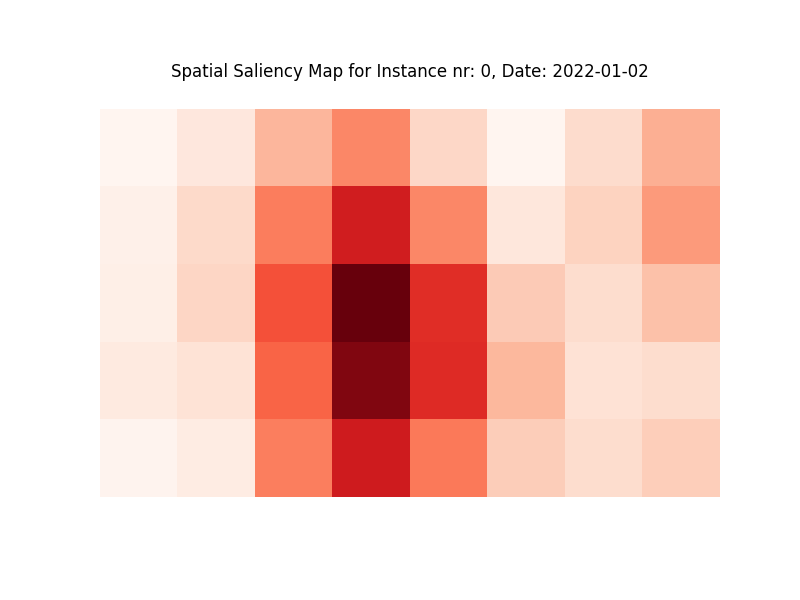

In [ ]:
import numpy as np
import imageio
from IPython.display import Image, display

# Load the saliency maps from the .npy file
vott_norm_sm_all_instances = np.load("/content/vott_norm_sm_all_instances.npy")

# Generate the list of images for the GIF using saliency maps and corresponding test dates
image_list = gif_sm(vott_norm_sm_all_instances, vottignasco_test_dates)

# Create the GIF and temporarily save it in memory
gif_filename = '/tmp/animation.gif'
fps = 2.0  # Frames per second for the GIF
imageio.mimsave(gif_filename, image_list, fps=fps)

# Display the GIF
with open(gif_filename, 'rb') as file:
    display(Image(file.read()))

#### ***Evaluation: Insertion/Deletion***

In [ ]:
# Calculate the indices of the most important pixels for each instance in order of importance

n_pixel = 40
important_indices = [get_top_n_pixels(sm[0], n_pixel) for sm in vott_norma_sm_all_instances]

print(important_indices[0])  # List of the top 40 most important pixels for the 105 instances of the Vottignasco Test Set

[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (3, 2), (4, 4), (1, 2), (4, 2), (1, 4), (0, 3), (1, 7), (0, 7), (0, 2), (3, 5), (2, 7), (2, 5), (4, 5), (4, 7), (1, 6), (2, 1), (0, 4), (1, 1), (0, 6), (4, 6), (2, 6), (3, 7), (3, 6), (3, 1), (1, 5), (0, 1), (3, 0), (4, 1), (2, 0), (1, 0), (4, 0), (0, 5), (0, 0)]


##### ***Insertion***

Insertion 8 top pixel for Istance nr 0 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (3, 2), (4, 4), (1, 2), (4, 2), (1, 4), (0, 3), (1, 7), (0, 7), (0, 2), (3, 5), (2, 7), (2, 5), (4, 5), (4, 7), (1, 6), (2, 1), (0, 4), (1, 1), (0, 6), (4, 6), (2, 6), (3, 7), (3, 6), (3, 1), (1, 5), (0, 1), (3, 0), (4, 1), (2, 0), (1, 0), (4, 0), (0, 5), (0, 0)] 

Original prediction: [0.23269777]
Initial Prediction with Blurred Images, new prediction: [0.70830506], error: 0.22620227932929993
Pixel (2, 3), new prediction: [0.7497652], error: 0.2673587203025818
Pixel (3, 3), new prediction: [0.78313684], error: 0.3029831647872925
Pixel (4, 3), new prediction: [0.6758246], error: 0.19636136293411255
Pixel (1, 3), new prediction: [0.707473], error: 0.22541148960590363
Pixel (3, 4), new prediction: [0.6294948], error: 0.15744785964488983
Pixel (2, 4), new prediction: [0.6682354], error: 0.18969303369522095
Pixel (2, 2), new prediction: [0.669931], error: 0.19117288291454315
Pixel (3, 2), new p

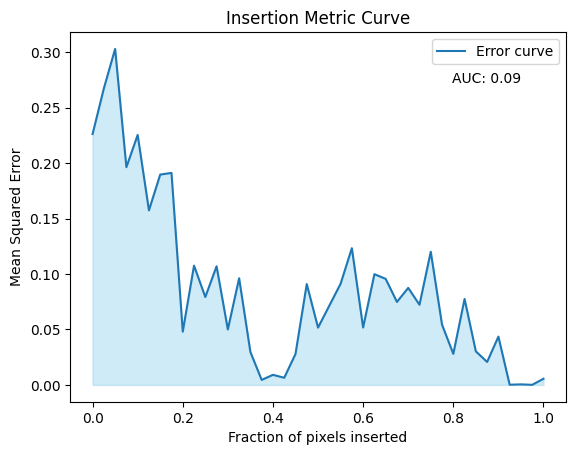

Errors: [0.22620228, 0.26735872, 0.30298316, 0.19636136, 0.22541149, 0.15744786, 0.18969303, 0.19117288, 0.048062857, 0.107562974, 0.079290405, 0.10697701, 0.050024558, 0.09620347, 0.029708726, 0.0045298645, 0.009103996, 0.006455212, 0.02787111, 0.09094119, 0.051671267, 0.0714578, 0.09118549, 0.12329601, 0.05172782, 0.099867746, 0.095632575, 0.07484303, 0.08747833, 0.07228572, 0.12010933, 0.05433527, 0.027995972, 0.07750822, 0.030242618, 0.020727308, 0.0435527, 0.00018161662, 0.00049244985, 8.675255e-05, 0.0055962172]
AUC: 0.08744342885620428
############################################################# 

Insertion 8 top pixel for Istance nr 1 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (1, 2), (4, 4), (0, 3), (3, 2), (4, 2), (0, 2), (1, 4), (4, 7), (3, 7), (4, 6), (2, 7), (1, 7), (4, 5), (3, 5), (0, 7), (3, 6), (0, 4), (1, 1), (0, 1), (1, 6), (0, 6), (2, 5), (2, 6), (2, 1), (3, 1), (4, 1), (1, 5), (3, 0), (0, 5), (2, 0), (4, 0), (1, 0), (0, 0)] 

Original prediction: [0.

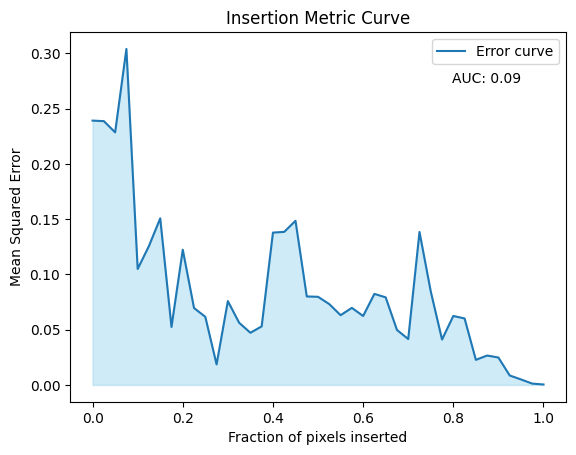

Errors: [0.23916306, 0.23870307, 0.2285408, 0.30403906, 0.10493912, 0.12570389, 0.1507499, 0.052469272, 0.122341976, 0.06955212, 0.06164923, 0.018573774, 0.07586403, 0.05626258, 0.0472016, 0.05298342, 0.13783154, 0.13850579, 0.14851451, 0.080073036, 0.07973701, 0.07311229, 0.06311208, 0.06972647, 0.062392697, 0.08237697, 0.07923526, 0.049755182, 0.041523032, 0.13839902, 0.08455748, 0.041075457, 0.06239746, 0.060150743, 0.022705847, 0.026592532, 0.024806006, 0.008560893, 0.004974649, 0.0012012235, 0.00038941528]
AUC: 0.08526668019912906
############################################################# 

Insertion 8 top pixel for Istance nr 2 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (1, 2), (0, 3), (4, 4), (3, 2), (0, 2), (4, 2), (1, 4), (2, 7), (1, 7), (3, 7), (4, 7), (4, 6), (3, 5), (4, 5), (3, 6), (0, 7), (0, 4), (2, 6), (1, 1), (2, 1), (2, 5), (3, 1), (1, 6), (3, 0), (0, 1), (4, 1), (0, 6), (4, 0), (2, 0), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original prediction: [0.3207960

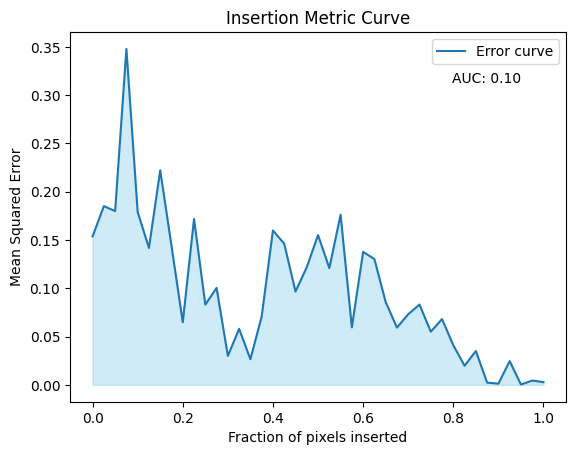

Errors: [0.15378974, 0.18510911, 0.17999126, 0.34782502, 0.17898895, 0.14181918, 0.22214803, 0.14397612, 0.064859495, 0.17171821, 0.08310818, 0.10044829, 0.030073034, 0.058087032, 0.026609866, 0.0708356, 0.15988408, 0.14626138, 0.09669897, 0.121883914, 0.15513067, 0.12099135, 0.17610364, 0.059616346, 0.13772136, 0.13030253, 0.08578645, 0.059379157, 0.07318673, 0.083193466, 0.055150542, 0.06815158, 0.04105954, 0.019873034, 0.03508559, 0.0023744865, 0.0013177487, 0.024652053, 0.0004128672, 0.004533201, 0.0028811106]
AUC: 0.09856708783772775
############################################################# 

Insertion 8 top pixel for Istance nr 3 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (3, 2), (0, 3), (4, 2), (4, 4), (1, 2), (1, 7), (1, 4), (0, 2), (4, 7), (2, 7), (3, 7), (4, 6), (0, 7), (4, 5), (3, 5), (3, 6), (0, 4), (1, 6), (2, 6), (0, 6), (2, 5), (2, 1), (1, 1), (3, 1), (4, 1), (0, 1), (3, 0), (1, 5), (2, 0), (0, 5), (4, 0), (1, 0), (0, 0)] 

Original prediction: [0.3832

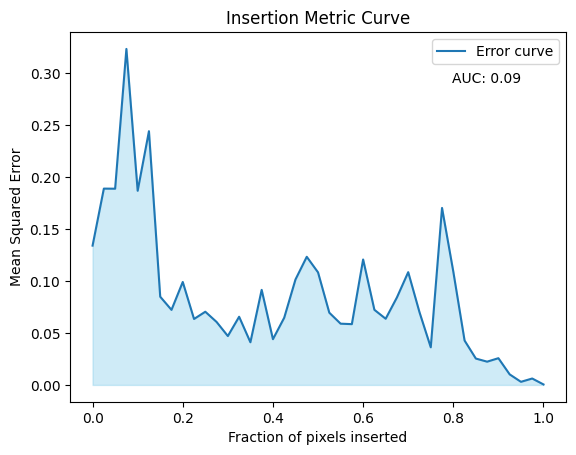

Errors: [0.1339053, 0.18872362, 0.18862985, 0.32300547, 0.18665148, 0.24390872, 0.08480229, 0.072155684, 0.09896382, 0.06338976, 0.07036444, 0.060531363, 0.04699476, 0.065537855, 0.041022517, 0.0913852, 0.04397206, 0.064606935, 0.101380624, 0.12317758, 0.10819959, 0.069430254, 0.058882885, 0.058431163, 0.12059207, 0.07219896, 0.06361612, 0.08414773, 0.108402215, 0.06990544, 0.03616127, 0.17012997, 0.108917534, 0.042668987, 0.02534284, 0.02235806, 0.025696898, 0.010140416, 0.002983266, 0.006162012, 0.0004674878]
AUC: 0.08726895238505677
############################################################# 

Insertion 8 top pixel for Istance nr 4 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 2), (0, 3), (2, 4), (1, 2), (4, 4), (4, 2), (3, 2), (0, 2), (4, 7), (3, 7), (1, 4), (2, 7), (4, 6), (1, 7), (4, 5), (3, 6), (3, 5), (0, 7), (0, 4), (3, 1), (2, 6), (2, 1), (4, 1), (1, 6), (1, 1), (2, 5), (3, 0), (0, 1), (0, 6), (4, 0), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original prediction: [0.5105428

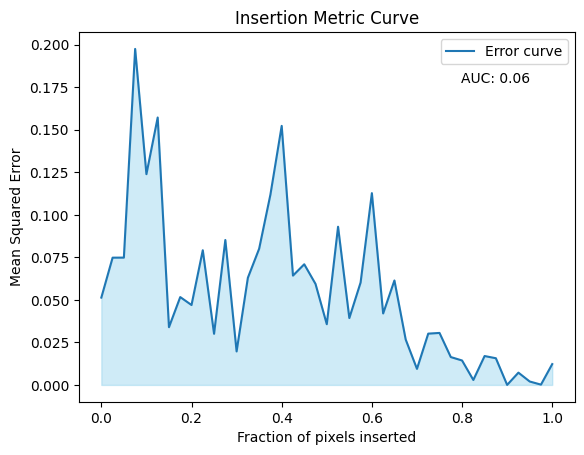

Errors: [0.051335752, 0.07481113, 0.074845076, 0.19752698, 0.12390639, 0.15720227, 0.03393923, 0.051648296, 0.046978198, 0.079171784, 0.030061787, 0.08519885, 0.019690724, 0.06300201, 0.080069564, 0.11189696, 0.15228592, 0.064272545, 0.07093145, 0.059375674, 0.035689175, 0.09299301, 0.039308734, 0.060214527, 0.11274262, 0.042016514, 0.06139964, 0.02669202, 0.009431759, 0.030147832, 0.030567348, 0.016381655, 0.014370433, 0.0029067076, 0.016984534, 0.01569011, 1.0207566e-05, 0.0072212173, 0.002015456, 0.0001705598, 0.012252744]
AUC: 0.055639079087995924
############################################################# 

Insertion 8 top pixel for Istance nr 5 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (2, 2), (3, 2), (4, 2), (1, 2), (0, 3), (1, 7), (4, 7), (3, 7), (2, 7), (4, 6), (0, 2), (0, 7), (1, 4), (4, 5), (3, 5), (3, 6), (1, 6), (3, 1), (0, 6), (0, 4), (2, 6), (4, 1), (3, 0), (2, 5), (4, 0), (2, 1), (1, 1), (0, 1), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original predic

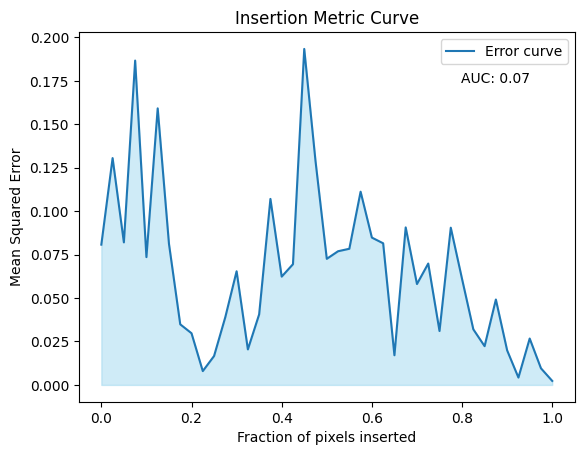

Errors: [0.08071555, 0.13052183, 0.08202388, 0.1866453, 0.073542655, 0.15914445, 0.081199944, 0.034872245, 0.029735819, 0.007952678, 0.016628318, 0.03905031, 0.06540721, 0.020440036, 0.04060107, 0.107040256, 0.0623239, 0.069460824, 0.1933449, 0.12884045, 0.07256233, 0.07692286, 0.07834966, 0.11119146, 0.084777676, 0.08150122, 0.017070118, 0.09063401, 0.05806276, 0.069845974, 0.031023245, 0.09047094, 0.060949232, 0.031988643, 0.022299917, 0.04915251, 0.01988, 0.004238097, 0.026695546, 0.009563981, 0.002304902]
AUC: 0.06643666243180632
############################################################# 

Insertion 8 top pixel for Istance nr 6 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (2, 2), (0, 3), (3, 2), (1, 2), (4, 2), (3, 7), (2, 7), (4, 7), (1, 7), (0, 2), (4, 6), (1, 4), (4, 5), (0, 7), (3, 6), (3, 5), (0, 4), (2, 6), (1, 6), (3, 1), (0, 6), (4, 1), (3, 0), (2, 1), (2, 5), (4, 0), (1, 1), (0, 1), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original prediction: [0.5920057]


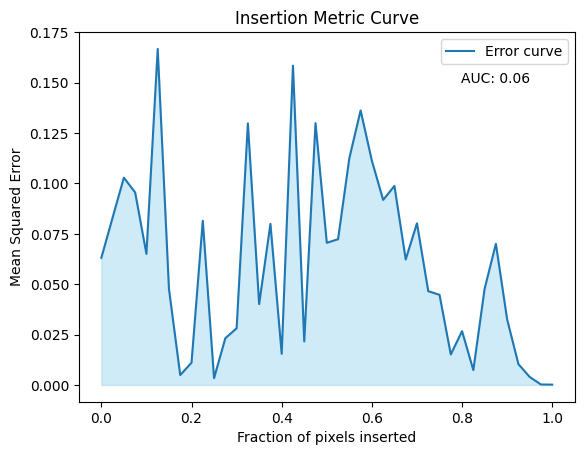

Errors: [0.063076295, 0.08303754, 0.10286183, 0.095544085, 0.065027796, 0.16675936, 0.047553968, 0.0049027195, 0.011052847, 0.08146689, 0.0033587022, 0.023181349, 0.028098904, 0.1298133, 0.040117074, 0.07994073, 0.015429457, 0.15846863, 0.021601487, 0.12992705, 0.070548095, 0.07231608, 0.11251806, 0.13624024, 0.11125113, 0.09182788, 0.09875598, 0.062254135, 0.08020806, 0.046526477, 0.044726826, 0.0151241245, 0.026684795, 0.00736036, 0.047695905, 0.07005479, 0.0324765, 0.0103177745, 0.0039575957, 0.00021792675, 0.00014116935]
AUC: 0.06152037968276999
############################################################# 

Insertion 8 top pixel for Istance nr 7 
[(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (4, 2), (3, 2), (2, 2), (1, 7), (4, 7), (2, 7), (1, 2), (1, 4), (3, 7), (4, 6), (0, 2), (0, 7), (3, 5), (3, 6), (4, 5), (0, 4), (1, 6), (2, 6), (2, 5), (0, 6), (3, 0), (3, 1), (4, 1), (4, 0), (2, 1), (1, 5), (1, 1), (0, 1), (2, 0), (0, 5), (1, 0), (0, 0)] 

Original predicti

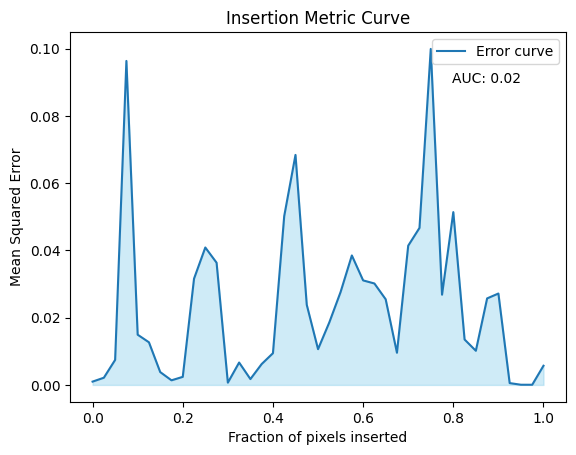

Errors: [0.0009843863, 0.0021395078, 0.007435928, 0.09632485, 0.014933586, 0.012674794, 0.0038198077, 0.0013704692, 0.0023996008, 0.031590357, 0.040860713, 0.036335737, 0.0006762647, 0.006656461, 0.0017428596, 0.0062087486, 0.009430104, 0.050190143, 0.0683815, 0.023815822, 0.010629844, 0.0185847, 0.027615203, 0.038491078, 0.03107368, 0.03016017, 0.025465945, 0.00957079, 0.04140084, 0.046683718, 0.09989495, 0.026829835, 0.05137603, 0.013506048, 0.0101527665, 0.025721898, 0.027175188, 0.000543248, 5.3874057e-05, 4.8558308e-05, 0.0057035554]
AUC: 0.023882739864075117
############################################################# 

Insertion 8 top pixel for Istance nr 8 
[(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (2, 2), (3, 2), (0, 3), (4, 2), (4, 7), (1, 2), (3, 7), (2, 7), (1, 7), (3, 5), (4, 5), (4, 6), (1, 4), (0, 2), (3, 6), (0, 7), (2, 6), (0, 4), (1, 6), (2, 5), (3, 1), (2, 1), (0, 6), (4, 1), (3, 0), (1, 1), (1, 5), (2, 0), (0, 1), (4, 0), (0, 5), (1, 0), (0, 0)] 

Or

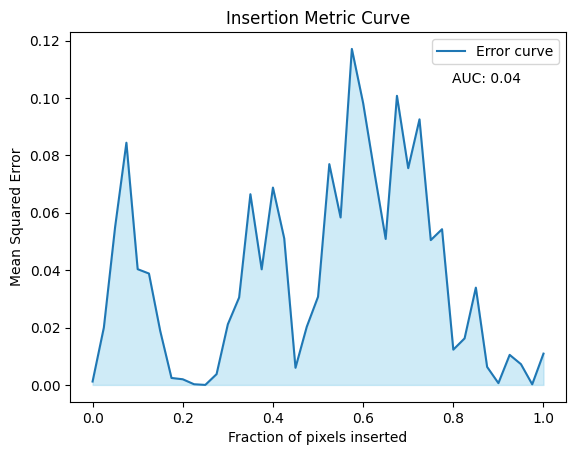

Errors: [0.0011834493, 0.019981533, 0.05507288, 0.08440603, 0.040336967, 0.038819063, 0.018817624, 0.0024271603, 0.0019710774, 0.00023619694, 2.9230728e-06, 0.0037611595, 0.021140879, 0.030466849, 0.06645816, 0.04028759, 0.06878248, 0.0510766, 0.005967241, 0.02026604, 0.030729756, 0.07694075, 0.058361564, 0.11709046, 0.09824024, 0.074146315, 0.050873823, 0.10075111, 0.075534046, 0.09254982, 0.050469883, 0.0542673, 0.012293757, 0.016217059, 0.03390981, 0.0062720403, 0.00062192994, 0.01047496, 0.00723712, 0.0002074271, 0.010909663]
AUC: 0.03858785479569633
############################################################# 

Insertion 8 top pixel for Istance nr 9 
[(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (3, 2), (2, 2), (4, 2), (1, 2), (1, 7), (4, 7), (2, 7), (3, 7), (4, 6), (0, 2), (1, 4), (0, 7), (4, 5), (3, 6), (3, 5), (0, 4), (2, 6), (1, 6), (3, 1), (0, 6), (3, 0), (4, 1), (2, 5), (2, 1), (4, 0), (1, 1), (0, 1), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original pre

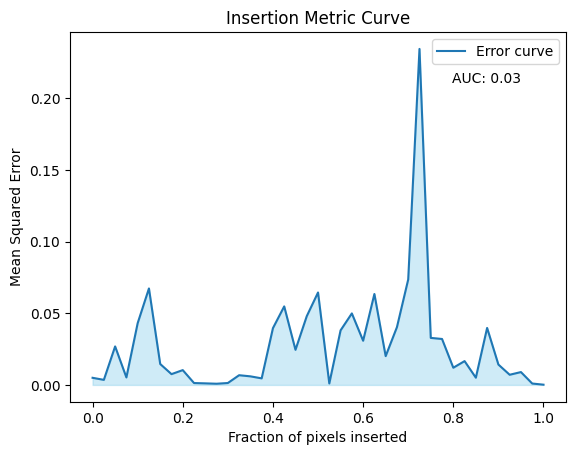

Errors: [0.004966337, 0.0035323007, 0.026852198, 0.005228594, 0.043066185, 0.0672995, 0.01459672, 0.0075287637, 0.0103340065, 0.0013118894, 0.0010877096, 0.0008299248, 0.0013338283, 0.0067767156, 0.005983662, 0.0045780013, 0.039606504, 0.0547778, 0.024498178, 0.047957234, 0.06447861, 0.001032249, 0.03806134, 0.049885776, 0.03082439, 0.06343197, 0.020085318, 0.04030324, 0.07356357, 0.23438247, 0.032806218, 0.03205571, 0.011995169, 0.01661424, 0.0050473977, 0.039752092, 0.014214379, 0.00709112, 0.008961584, 0.0009771363, 0.0001650854]
AUC: 0.02888273483258671
############################################################# 

Insertion 8 top pixel for Istance nr 10 
[(3, 3), (4, 3), (2, 3), (3, 4), (1, 3), (4, 4), (4, 2), (3, 2), (2, 2), (2, 4), (1, 2), (0, 3), (4, 7), (3, 7), (1, 7), (2, 7), (4, 6), (4, 5), (0, 2), (1, 4), (0, 7), (3, 5), (3, 6), (1, 6), (3, 1), (2, 6), (0, 4), (4, 1), (2, 1), (0, 6), (2, 5), (3, 0), (1, 1), (4, 0), (2, 0), (1, 5), (0, 1), (0, 5), (1, 0), (0, 0)] 

Original

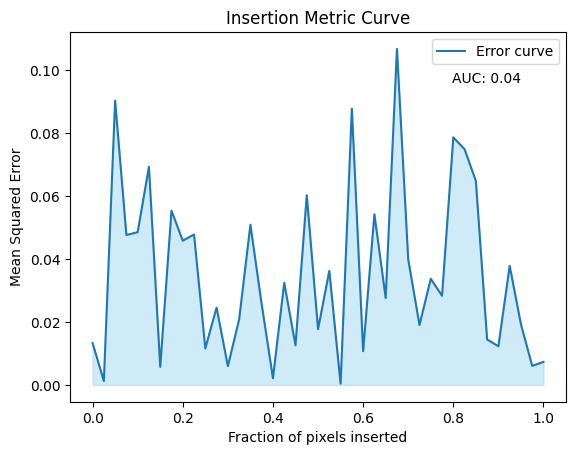

Errors: [0.013299809, 0.0012272183, 0.090312704, 0.047611825, 0.048531283, 0.069285594, 0.005733836, 0.055360455, 0.045811635, 0.047779642, 0.01158014, 0.02456586, 0.0059537026, 0.020802863, 0.05087756, 0.025643725, 0.0021359914, 0.032426894, 0.012602344, 0.060268275, 0.017716015, 0.03623952, 0.00038308962, 0.0877614, 0.010714769, 0.054218132, 0.027621027, 0.10672699, 0.039853644, 0.01903568, 0.03370299, 0.02832095, 0.07864788, 0.07486507, 0.064772055, 0.014420393, 0.012303196, 0.037821267, 0.019241678, 0.006047217, 0.0073187533]
AUC: 0.03598084476543591
############################################################# 

Insertion 8 top pixel for Istance nr 11 
[(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (4, 2), (3, 2), (2, 2), (4, 7), (1, 2), (3, 7), (0, 3), (4, 6), (1, 7), (2, 7), (4, 5), (3, 6), (3, 5), (0, 7), (1, 4), (0, 2), (2, 6), (1, 6), (3, 1), (3, 0), (4, 1), (4, 0), (2, 1), (2, 5), (0, 6), (0, 4), (1, 1), (2, 0), (0, 1), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original pr

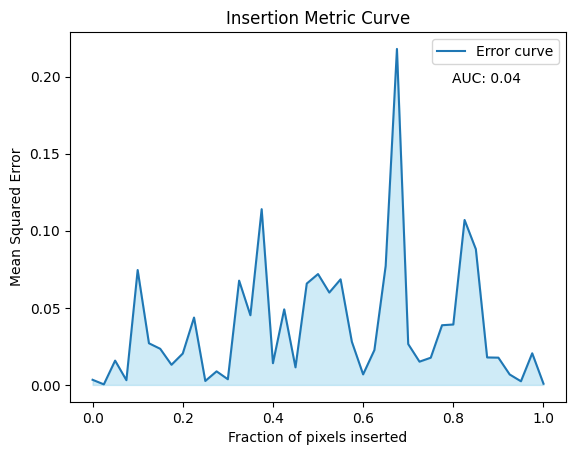

Errors: [0.003328744, 0.00036150502, 0.015770234, 0.0030695645, 0.07453128, 0.027017752, 0.023432916, 0.013064166, 0.020361865, 0.043701205, 0.00256013, 0.008803429, 0.003675212, 0.06765691, 0.04518492, 0.114008285, 0.014083938, 0.049021665, 0.011406167, 0.06574688, 0.071912974, 0.059925802, 0.068498455, 0.028007695, 0.0068406137, 0.022603538, 0.07718481, 0.21794517, 0.026497867, 0.015089853, 0.01765506, 0.03872217, 0.039192747, 0.10699779, 0.08806202, 0.017829884, 0.01768566, 0.006786336, 0.0023619907, 0.020523172, 0.0007780365]
AUC: 0.03889587560843212
############################################################# 

Insertion 8 top pixel for Istance nr 12 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (2, 2), (4, 2), (3, 2), (1, 2), (4, 7), (3, 7), (0, 3), (4, 6), (2, 7), (1, 7), (0, 2), (3, 6), (4, 5), (1, 4), (0, 7), (3, 5), (3, 1), (2, 1), (1, 6), (2, 6), (4, 1), (1, 1), (3, 0), (0, 4), (0, 6), (2, 5), (2, 0), (0, 1), (4, 0), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original pr

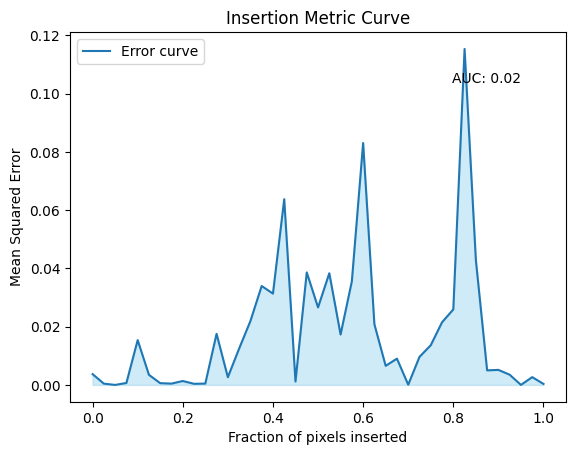

Errors: [0.00371121, 0.00044131413, 6.688546e-07, 0.00066848437, 0.015380231, 0.003458272, 0.000599045, 0.0004512058, 0.0013479803, 0.00038302195, 0.00045908976, 0.017547656, 0.0026390324, 0.012476117, 0.021924578, 0.033965833, 0.03135339, 0.063769616, 0.0011772282, 0.0386301, 0.026611334, 0.038344644, 0.017309248, 0.035568386, 0.08305516, 0.02082541, 0.0065566413, 0.009027395, 7.0066584e-05, 0.009633437, 0.013630438, 0.02150593, 0.02593137, 0.11536162, 0.042932034, 0.0049979915, 0.0051614977, 0.0035052316, 5.2649157e-06, 0.0026763545, 0.0003422467]
AUC: 0.018285226372245233
############################################################# 

Insertion 8 top pixel for Istance nr 13 
[(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (4, 2), (4, 7), (4, 6), (2, 2), (2, 4), (3, 7), (3, 2), (1, 2), (4, 5), (3, 6), (2, 7), (0, 3), (1, 7), (3, 5), (0, 2), (0, 7), (1, 4), (2, 6), (3, 1), (2, 1), (3, 0), (4, 1), (1, 6), (0, 6), (1, 1), (4, 0), (2, 5), (0, 4), (2, 0), (0, 1), (1, 5), (1, 0), (0, 5), 

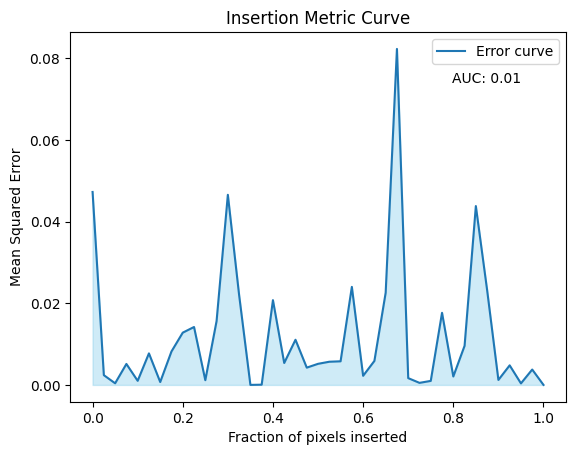

Errors: [0.047250405, 0.0023885476, 0.00040096065, 0.0051365113, 0.0010075985, 0.0077240285, 0.00071047095, 0.008199562, 0.012801642, 0.014186295, 0.0011586874, 0.015635686, 0.0465559, 0.021997873, 7.0669157e-06, 5.606408e-05, 0.02075674, 0.005374315, 0.011059942, 0.0042343186, 0.0051663723, 0.0056776027, 0.0057859756, 0.024006609, 0.0022325036, 0.0058781505, 0.022573743, 0.082278565, 0.0016651682, 0.000504218, 0.0009875831, 0.017663376, 0.002066632, 0.0095773805, 0.043799397, 0.023221133, 0.0012218662, 0.004792342, 0.000375454, 0.0037679542, 1.3331048e-06]
AUC: 0.011656502554433247
############################################################# 

Insertion 8 top pixel for Istance nr 14 
[(3, 3), (2, 3), (4, 3), (3, 4), (4, 4), (1, 3), (4, 2), (4, 7), (3, 2), (2, 4), (2, 2), (3, 7), (4, 6), (1, 2), (2, 7), (4, 5), (1, 7), (0, 3), (3, 6), (3, 5), (0, 2), (0, 7), (1, 4), (3, 1), (4, 1), (2, 6), (3, 0), (2, 1), (1, 6), (1, 1), (4, 0), (0, 6), (0, 4), (2, 5), (2, 0), (0, 1), (1, 5), (1, 0), 

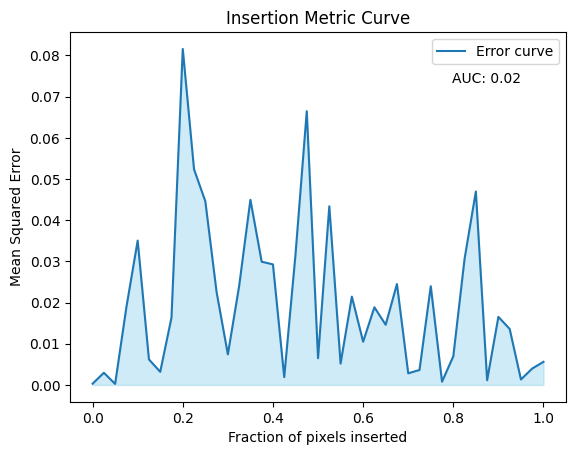

Errors: [0.00029928001, 0.002951055, 0.00025016765, 0.018884912, 0.035047103, 0.006194976, 0.0031735082, 0.016359037, 0.081589974, 0.052350204, 0.044613622, 0.02256144, 0.007422067, 0.023989195, 0.044951864, 0.02991932, 0.029268589, 0.001888814, 0.03162929, 0.0664734, 0.0064820554, 0.04338479, 0.005187017, 0.021440912, 0.010494503, 0.0188564, 0.0146079995, 0.024502153, 0.0028269184, 0.0036283873, 0.023973152, 0.00079241034, 0.0069522914, 0.030638065, 0.046976984, 0.0011408131, 0.016528748, 0.013590218, 0.0013269669, 0.0039813896, 0.005609586]
AUC: 0.020494628639426082
############################################################# 

Insertion 8 top pixel for Istance nr 15 
[(2, 3), (3, 3), (4, 3), (3, 4), (1, 3), (2, 4), (4, 4), (4, 7), (2, 2), (4, 2), (3, 7), (3, 2), (1, 2), (4, 6), (2, 7), (0, 3), (4, 5), (3, 5), (1, 7), (3, 6), (1, 4), (0, 2), (0, 7), (2, 6), (2, 5), (3, 1), (3, 0), (1, 6), (2, 1), (4, 1), (0, 4), (0, 6), (4, 0), (1, 1), (2, 0), (1, 5), (0, 1), (0, 5), (1, 0), (0, 0)]

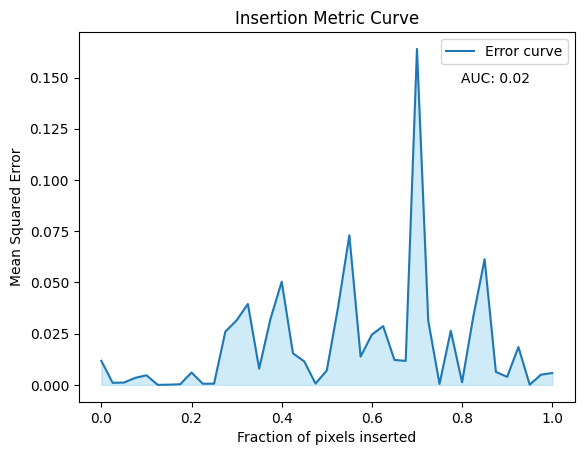

Errors: [0.011778253, 0.0010403154, 0.0011565458, 0.0034477785, 0.004716204, 4.3515458e-05, 0.00012535747, 0.0003392408, 0.006051556, 0.00057352736, 0.0006229977, 0.026001984, 0.031518232, 0.039506167, 0.0079325875, 0.032100953, 0.050396636, 0.015428746, 0.011488409, 0.0006648523, 0.0070354757, 0.03791106, 0.07302956, 0.01380974, 0.024573056, 0.02869615, 0.01220229, 0.011722791, 0.16396695, 0.03132585, 0.00048641907, 0.026424393, 0.0012949455, 0.033472933, 0.061342523, 0.006357572, 0.0039464966, 0.018470857, 0.00012599761, 0.005015435, 0.005801392]
AUC: 0.020078898218707765
############################################################# 

Insertion 8 top pixel for Istance nr 16 
[(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (4, 2), (2, 2), (3, 2), (0, 3), (1, 2), (4, 7), (2, 7), (0, 2), (1, 7), (3, 7), (4, 5), (4, 6), (3, 5), (1, 4), (3, 6), (0, 7), (2, 6), (2, 5), (1, 6), (0, 4), (2, 1), (3, 1), (3, 0), (0, 6), (4, 1), (1, 1), (2, 0), (0, 1), (1, 5), (4, 0), (1, 0), (0, 5), (

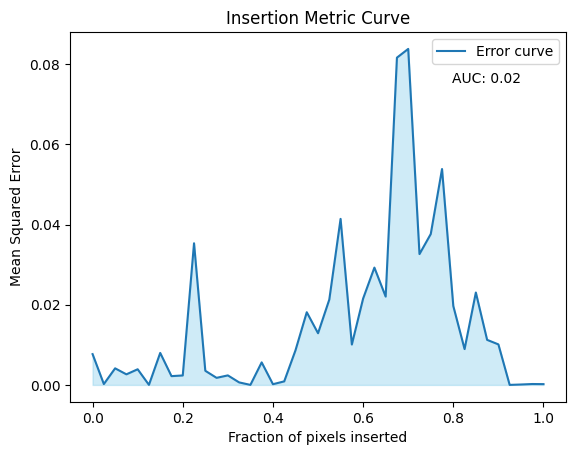

Errors: [0.007685877, 0.00021947105, 0.004141131, 0.0026423037, 0.0039080977, 1.4956689e-05, 0.007983505, 0.0021943161, 0.0023615563, 0.035343718, 0.0035268688, 0.0017666592, 0.002379043, 0.00063056033, 7.766671e-06, 0.005625436, 0.0001796899, 0.00088531367, 0.008638681, 0.01813807, 0.0128967585, 0.021302644, 0.041428614, 0.010088965, 0.021553367, 0.029272974, 0.022036735, 0.08165785, 0.08383075, 0.03264743, 0.03765113, 0.05386488, 0.019681592, 0.00894099, 0.023057405, 0.011242712, 0.010114246, 6.383613e-06, 0.00010368573, 0.00022513907, 0.00019911477]
AUC: 0.015653347338502502
############################################################# 

Insertion 8 top pixel for Istance nr 17 
[(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (4, 7), (4, 2), (2, 2), (3, 7), (0, 3), (3, 2), (4, 6), (1, 2), (4, 5), (2, 7), (0, 2), (3, 6), (3, 5), (1, 7), (1, 4), (0, 7), (4, 1), (3, 1), (2, 6), (3, 0), (4, 0), (0, 4), (2, 1), (1, 6), (2, 5), (0, 6), (1, 1), (2, 0), (0, 1), (1, 5), (1, 0), (0, 5

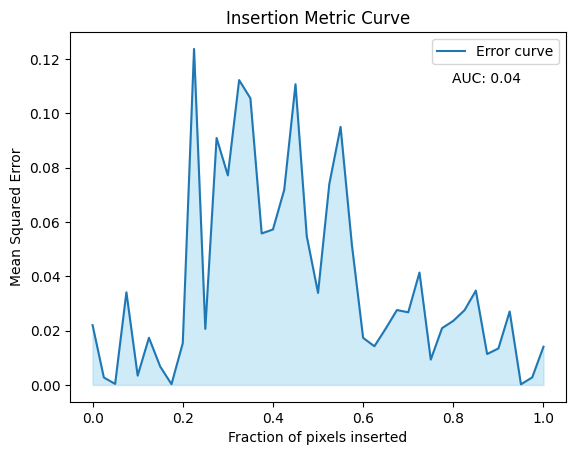

Errors: [0.022009261, 0.0027312553, 0.0003762213, 0.034105618, 0.003428982, 0.017360242, 0.0067578186, 0.00027416708, 0.015368805, 0.12367872, 0.020619672, 0.09089903, 0.07713067, 0.11220973, 0.105498806, 0.05575555, 0.05722117, 0.07181266, 0.11069037, 0.05471323, 0.033869497, 0.07395794, 0.09498353, 0.05166057, 0.017315287, 0.014237441, 0.020719951, 0.027570313, 0.026729057, 0.0413729, 0.00932304, 0.020887645, 0.023591947, 0.02752892, 0.0347119, 0.011373852, 0.013424641, 0.027038192, 0.00022014974, 0.0027810023, 0.014055728]
AUC: 0.0387990744668059
############################################################# 

Insertion 8 top pixel for Istance nr 18 
[(3, 3), (4, 3), (2, 3), (3, 4), (4, 4), (1, 3), (4, 2), (4, 7), (3, 2), (2, 2), (1, 2), (2, 4), (0, 3), (4, 6), (3, 7), (4, 5), (0, 2), (1, 7), (2, 7), (3, 6), (3, 5), (1, 4), (0, 7), (4, 1), (3, 1), (2, 1), (3, 0), (1, 1), (0, 4), (4, 0), (1, 6), (2, 6), (2, 0), (0, 6), (0, 1), (2, 5), (1, 0), (1, 5), (0, 5), (0, 0)] 

Original predict

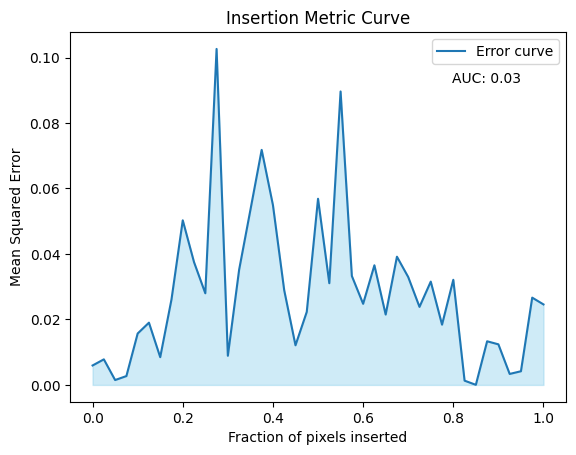

Errors: [0.0059425044, 0.007813212, 0.0014915408, 0.0027067764, 0.015708318, 0.01901733, 0.00847866, 0.026110474, 0.050285853, 0.03749873, 0.02799126, 0.10263409, 0.008907982, 0.03518008, 0.05343618, 0.07180062, 0.05491879, 0.028909998, 0.012106915, 0.022308607, 0.056864906, 0.031066725, 0.0896417, 0.03327715, 0.02477784, 0.036545984, 0.021492418, 0.039166342, 0.032956343, 0.023841161, 0.031558983, 0.018408502, 0.03211469, 0.0013024807, 2.826006e-05, 0.0133293, 0.012399964, 0.0033550553, 0.004177919, 0.02665972, 0.024592848]
AUC: 0.028388463344890626
############################################################# 

Insertion 8 top pixel for Istance nr 19 
[(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (4, 7), (4, 2), (3, 2), (2, 2), (1, 2), (0, 3), (4, 6), (3, 7), (0, 2), (4, 5), (3, 5), (1, 4), (1, 7), (2, 7), (3, 6), (3, 0), (3, 1), (4, 1), (0, 7), (4, 0), (1, 1), (2, 1), (0, 4), (0, 1), (2, 0), (1, 6), (2, 5), (2, 6), (0, 6), (1, 0), (1, 5), (0, 0), (0, 5)] 

Original predic

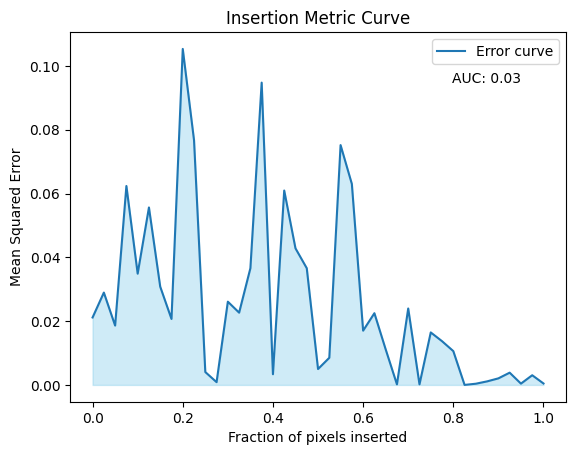

Errors: [0.021145351, 0.028952537, 0.018607378, 0.06236581, 0.0348834, 0.05563328, 0.030807836, 0.020682886, 0.10534367, 0.076714545, 0.0040388745, 0.00086762547, 0.026099477, 0.022655955, 0.036592647, 0.0947793, 0.0033520937, 0.06094264, 0.042818736, 0.036594085, 0.0049858293, 0.008511655, 0.07518696, 0.06301862, 0.01701632, 0.02248796, 0.011156862, 0.0001699998, 0.023960788, 0.00017731838, 0.016457757, 0.013712619, 0.010600539, 1.8322911e-06, 0.0003782101, 0.0011134945, 0.0020599067, 0.0038431103, 0.0004067028, 0.0030361637, 0.0004544325]
AUC: 0.026295383036267595
############################################################# 

Insertion 8 top pixel for Istance nr 20 
[(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (2, 2), (1, 2), (0, 3), (3, 2), (4, 7), (4, 2), (0, 2), (4, 6), (3, 7), (4, 5), (1, 4), (2, 7), (3, 5), (1, 7), (3, 6), (0, 7), (0, 4), (1, 1), (2, 1), (0, 1), (2, 6), (3, 0), (2, 5), (3, 1), (1, 6), (0, 6), (4, 1), (4, 0), (2, 0), (1, 5), (1, 0), (0, 5), (0, 0)] 


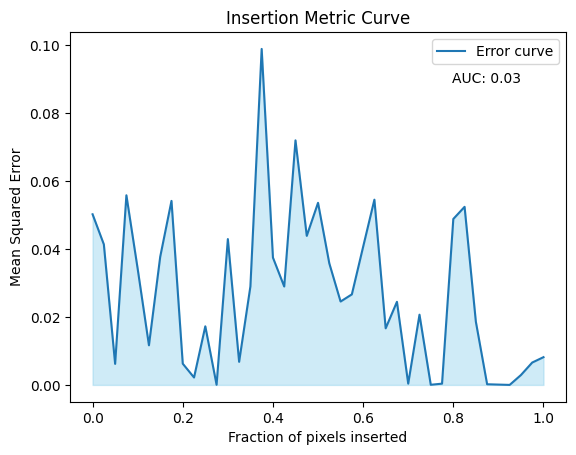

Errors: [0.050199706, 0.04134754, 0.006192687, 0.055786826, 0.034167994, 0.011660314, 0.037701964, 0.05413614, 0.0062490823, 0.0021880607, 0.017241374, 4.100336e-05, 0.042903412, 0.0067968187, 0.028966008, 0.09884238, 0.037455324, 0.028952619, 0.07194789, 0.043850206, 0.053569444, 0.03575776, 0.02453323, 0.026639402, 0.04062392, 0.05449083, 0.01665066, 0.02444844, 0.00038120436, 0.020659987, 4.3377953e-05, 0.00037379735, 0.04881656, 0.052391317, 0.018607134, 0.00019601331, 9.7635726e-05, 4.425747e-06, 0.0029126492, 0.0065862746, 0.008164421]
AUC: 0.02708484446320654
############################################################# 

Insertion 8 top pixel for Istance nr 21 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (1, 2), (2, 2), (4, 2), (4, 7), (3, 2), (0, 2), (4, 6), (1, 4), (3, 7), (4, 5), (3, 5), (1, 7), (2, 7), (3, 6), (0, 7), (2, 5), (0, 4), (2, 1), (1, 6), (1, 1), (0, 6), (2, 6), (3, 1), (3, 0), (4, 1), (0, 1), (1, 5), (4, 0), (2, 0), (0, 5), (1, 0), (0, 0)] 


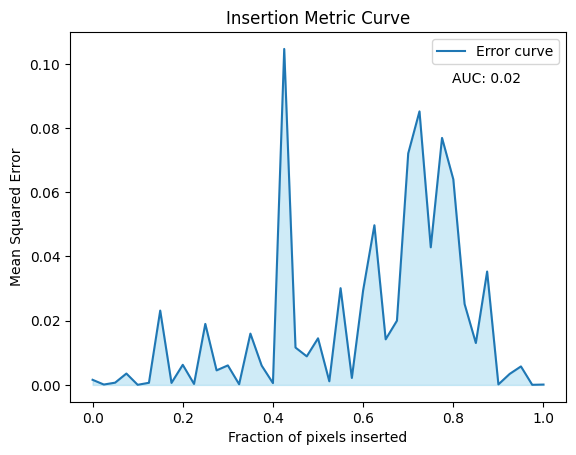

Errors: [0.0015951702, 0.00011840798, 0.0007033933, 0.003543362, 3.5383044e-05, 0.0006682162, 0.023149071, 0.00062472763, 0.0062632165, 0.0003073958, 0.019007582, 0.0045339074, 0.006081008, 0.00021104825, 0.015981343, 0.006017302, 0.00056338357, 0.10464394, 0.011641412, 0.008900963, 0.014518993, 0.0011277489, 0.0301356, 0.0021761663, 0.029443957, 0.049728967, 0.014202188, 0.020003008, 0.07210216, 0.08519909, 0.04285878, 0.07693298, 0.064049006, 0.025205972, 0.013050626, 0.035315506, 0.0001613193, 0.0034288494, 0.005760867, 3.7342452e-05, 0.000112742586]
AUC: 0.019982203516156004
############################################################# 

Insertion 8 top pixel for Istance nr 22 
[(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (4, 4), (2, 2), (1, 2), (0, 3), (4, 7), (1, 4), (3, 2), (4, 6), (0, 2), (4, 2), (4, 5), (3, 7), (3, 5), (2, 7), (1, 7), (3, 6), (0, 7), (0, 4), (2, 5), (2, 6), (1, 6), (1, 1), (2, 1), (1, 5), (0, 6), (3, 0), (0, 1), (4, 0), (3, 1), (4, 1), (2, 0), (0, 5), (1, 

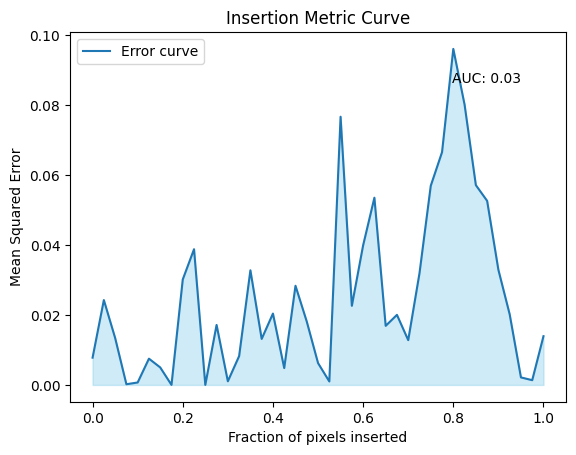

Errors: [0.007801994, 0.024285486, 0.0134564005, 0.00019439441, 0.0006991631, 0.007512802, 0.0050076963, 1.2362385e-05, 0.03017835, 0.03883809, 2.8433224e-06, 0.017169164, 0.0010442372, 0.008253993, 0.032798897, 0.0131675415, 0.020414088, 0.004818083, 0.028371748, 0.018136673, 0.006256633, 0.0009951274, 0.07674172, 0.022644833, 0.03994444, 0.05356616, 0.016904293, 0.020047052, 0.012813742, 0.031960484, 0.05698647, 0.06660486, 0.09614491, 0.08020374, 0.05717507, 0.052671973, 0.032926746, 0.020214364, 0.0021535528, 0.0013576001, 0.013946847]
AUC: 0.025588754976342897
############################################################# 

Insertion 8 top pixel for Istance nr 23 
[(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (4, 4), (0, 3), (2, 2), (1, 2), (1, 4), (3, 2), (0, 2), (4, 7), (4, 2), (4, 6), (1, 7), (3, 7), (4, 5), (2, 7), (0, 7), (3, 5), (0, 4), (3, 6), (1, 6), (0, 6), (2, 5), (2, 6), (1, 5), (2, 1), (1, 1), (3, 0), (3, 1), (4, 1), (0, 1), (4, 0), (0, 5), (2, 0), (1, 0), (0, 0)] 



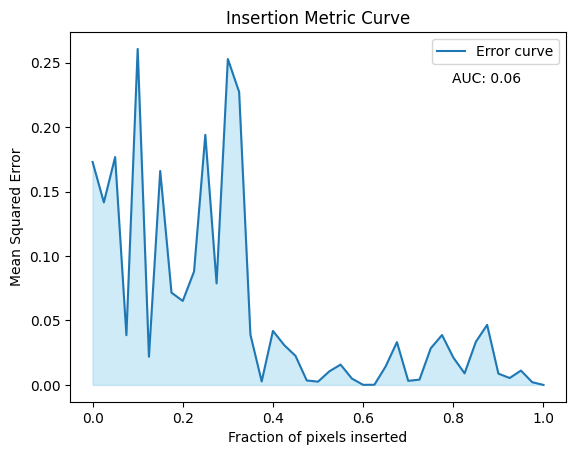

Errors: [0.1730079, 0.14165664, 0.17679593, 0.038563192, 0.26073533, 0.021904388, 0.16604613, 0.07156807, 0.06519333, 0.08798244, 0.19409509, 0.07877695, 0.2528987, 0.22736435, 0.039098687, 0.0026972769, 0.041890986, 0.030903365, 0.022559147, 0.003460088, 0.0025485682, 0.010524261, 0.015776673, 0.004958107, 5.979725e-05, 0.0001421796, 0.01438876, 0.033205513, 0.0031626115, 0.004115357, 0.02847159, 0.038706075, 0.021277526, 0.0090026185, 0.03346491, 0.046597652, 0.008771972, 0.005370112, 0.011145696, 0.0021214436, 3.6026256e-07]
AUC: 0.057612640911247584
############################################################# 

Insertion 8 top pixel for Istance nr 24 
[(2, 3), (3, 3), (1, 3), (4, 3), (2, 4), (3, 4), (0, 3), (1, 2), (4, 4), (1, 4), (2, 2), (0, 2), (4, 7), (1, 7), (2, 7), (3, 7), (3, 2), (4, 6), (4, 2), (0, 7), (4, 5), (0, 4), (3, 5), (3, 6), (2, 5), (1, 6), (2, 6), (0, 6), (1, 5), (1, 1), (3, 0), (2, 1), (0, 1), (4, 0), (0, 5), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original pre

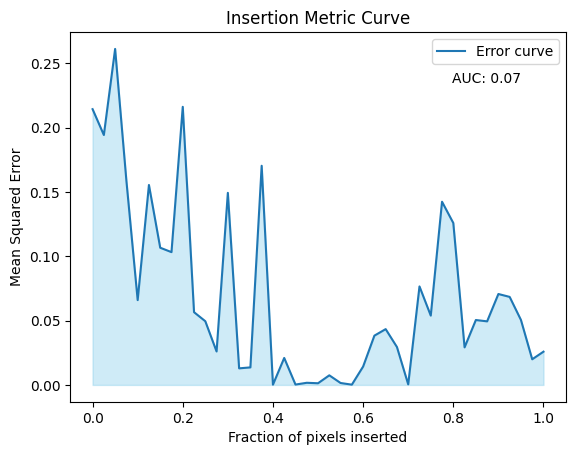

Errors: [0.21441294, 0.19432068, 0.26125067, 0.15878293, 0.065948166, 0.1554611, 0.10667579, 0.10324781, 0.21623363, 0.056559954, 0.049528092, 0.026010482, 0.14934646, 0.012889476, 0.013633402, 0.17040366, 0.00018558286, 0.020968199, 0.00028098925, 0.0016633639, 0.0013016118, 0.0074641826, 0.001498907, 0.00020043575, 0.014290889, 0.038318574, 0.043388292, 0.029473972, 0.00041930986, 0.07658526, 0.053901132, 0.14243042, 0.125892, 0.029196823, 0.05046458, 0.049428817, 0.07069274, 0.068441555, 0.050519817, 0.019947425, 0.025856864]
AUC: 0.06893455144163455
############################################################# 

Insertion 8 top pixel for Istance nr 25 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (4, 4), (0, 3), (1, 4), (1, 2), (2, 2), (4, 7), (3, 5), (4, 5), (3, 7), (0, 2), (4, 6), (3, 2), (2, 7), (0, 4), (3, 6), (1, 7), (4, 2), (2, 5), (0, 7), (2, 6), (1, 6), (1, 5), (0, 6), (0, 5), (4, 0), (3, 0), (1, 1), (0, 1), (2, 1), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original pre

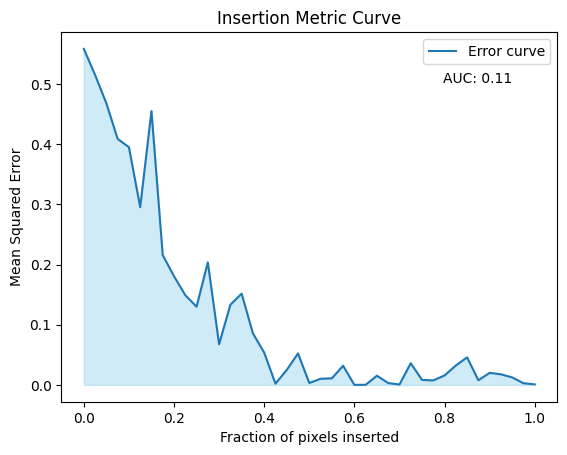

Errors: [0.5582895, 0.51503855, 0.46786597, 0.4087973, 0.39505434, 0.2954164, 0.45511138, 0.2157199, 0.18058088, 0.14913622, 0.12997064, 0.20364201, 0.067655675, 0.1332076, 0.15166876, 0.08564395, 0.053672656, 0.002126443, 0.024897818, 0.052312654, 0.003225645, 0.010220938, 0.010940476, 0.03187423, 9.880653e-05, 0.00023066021, 0.015300929, 0.0031026963, 0.00067447714, 0.03599772, 0.008311787, 0.007487436, 0.015748745, 0.03229488, 0.045769468, 0.007783315, 0.020048639, 0.017623553, 0.012504908, 0.0027971317, 0.0009082856]
AUC: 0.11372886158897019
############################################################# 

Insertion 8 top pixel for Istance nr 26 
[(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (1, 2), (0, 3), (2, 2), (4, 3), (1, 4), (2, 7), (4, 4), (1, 7), (3, 7), (3, 5), (3, 6), (4, 6), (2, 6), (2, 5), (4, 7), (0, 2), (4, 5), (0, 7), (3, 2), (4, 2), (1, 6), (0, 4), (1, 1), (2, 0), (1, 5), (2, 1), (1, 0), (3, 0), (0, 6), (0, 1), (3, 1), (0, 0), (0, 5), (4, 0), (4, 1)] 

Original prediction:

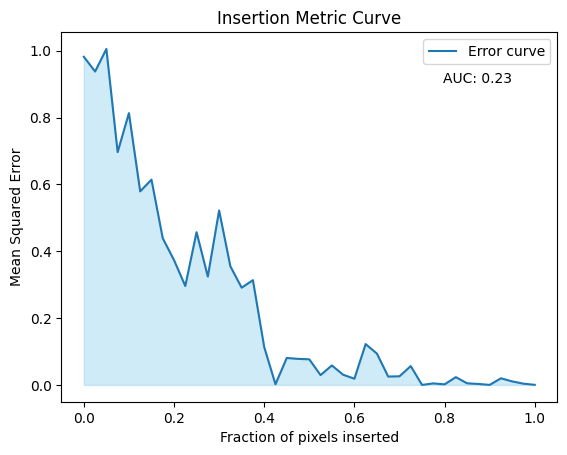

Errors: [0.9818773, 0.93769616, 1.0052904, 0.6965955, 0.8131829, 0.5790661, 0.61421037, 0.4389145, 0.37352824, 0.2960171, 0.45699614, 0.32421806, 0.52190804, 0.35493708, 0.2909589, 0.31342906, 0.11350426, 0.0020280872, 0.080615945, 0.07797565, 0.07665846, 0.02936638, 0.058289155, 0.030578105, 0.018594518, 0.12219004, 0.09371641, 0.02505177, 0.025835322, 0.056377634, 3.3120796e-05, 0.00454295, 0.001699497, 0.02325506, 0.004844208, 0.002886709, 2.933215e-05, 0.01980363, 0.010544302, 0.0037838572, 0.00026964012]
AUC: 0.23475566204870119
############################################################# 

Insertion 8 top pixel for Istance nr 27 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (4, 6), (4, 5), (4, 7), (0, 2), (3, 5), (3, 2), (3, 7), (1, 7), (2, 7), (3, 6), (0, 4), (4, 2), (0, 7), (2, 5), (1, 6), (2, 6), (1, 5), (0, 6), (0, 5), (3, 0), (4, 0), (2, 1), (1, 1), (0, 1), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.1841855]

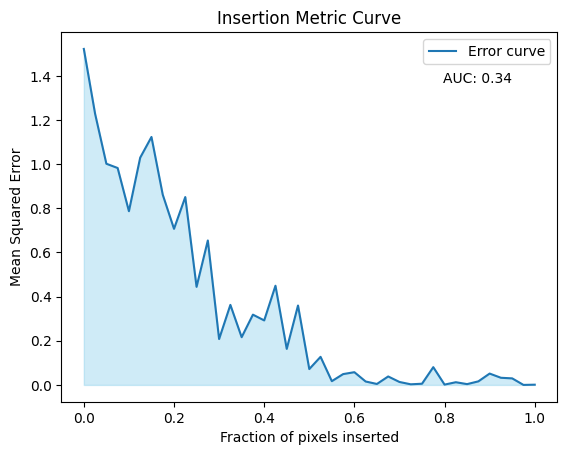

Errors: [1.5218593, 1.2279671, 1.0018324, 0.98250175, 0.78688353, 1.0294021, 1.1230682, 0.86172277, 0.70709187, 0.85090333, 0.4442087, 0.6543183, 0.2078301, 0.3625102, 0.21623057, 0.31830648, 0.29216993, 0.44924745, 0.1632592, 0.35965222, 0.07190812, 0.12720406, 0.016995566, 0.049020134, 0.05769915, 0.0154685145, 0.00429919, 0.03832086, 0.013351867, 0.0028031876, 0.005395826, 0.08047189, 0.0014626407, 0.012228668, 0.0036351546, 0.016177082, 0.05142103, 0.03237608, 0.029672291, 4.2426927e-05, 0.0010600055]
AUC: 0.33576299084670613
############################################################# 

Insertion 8 top pixel for Istance nr 28 
[(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (4, 3), (4, 4), (0, 3), (1, 4), (1, 2), (1, 7), (2, 2), (2, 7), (4, 7), (3, 7), (0, 2), (3, 5), (4, 5), (4, 6), (0, 4), (3, 2), (4, 2), (0, 7), (2, 5), (3, 6), (1, 6), (2, 6), (1, 5), (0, 6), (4, 0), (0, 5), (3, 0), (4, 1), (3, 1), (1, 1), (0, 1), (2, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.405175]
Init

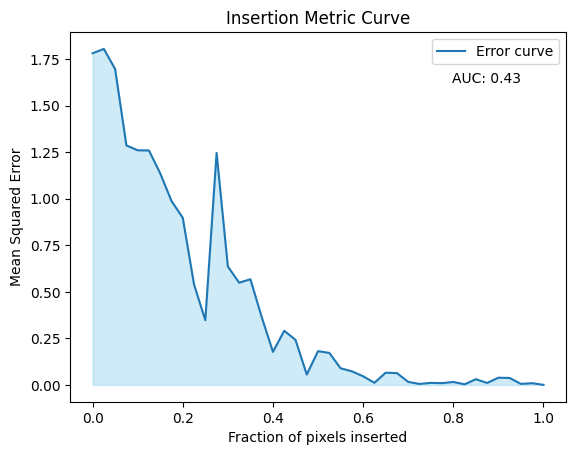

Errors: [1.78151, 1.8046285, 1.6964519, 1.2864082, 1.2602328, 1.2592515, 1.136239, 0.9880729, 0.89752966, 0.53959453, 0.34742615, 1.2459327, 0.6361449, 0.5491606, 0.56757843, 0.36516842, 0.17751242, 0.2909131, 0.24208897, 0.05589866, 0.18150738, 0.17196761, 0.08942896, 0.07320866, 0.046509378, 0.01156447, 0.06560598, 0.06357328, 0.016221872, 0.0052323528, 0.011020999, 0.009542006, 0.015928717, 0.003271944, 0.030722776, 0.010651068, 0.03876234, 0.037378903, 0.0054993667, 0.009324387, 0.0002454014]
AUC: 0.42835083948448305
############################################################# 

Insertion 8 top pixel for Istance nr 29 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (4, 4), (1, 2), (0, 2), (2, 2), (1, 7), (0, 4), (4, 7), (3, 7), (4, 6), (2, 7), (4, 5), (3, 2), (0, 7), (4, 2), (3, 5), (3, 6), (1, 6), (2, 5), (2, 6), (4, 0), (0, 6), (1, 5), (3, 0), (4, 1), (0, 5), (3, 1), (0, 1), (2, 1), (1, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [2.5344748]
Initial Pred

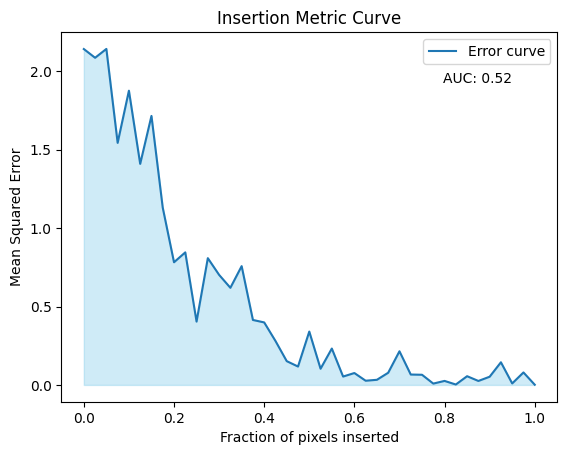

Errors: [2.1416452, 2.0859776, 2.1424067, 1.5435114, 1.8761433, 1.4094423, 1.7152798, 1.1304165, 0.7821855, 0.845158, 0.40386352, 0.80822915, 0.701817, 0.6192972, 0.7574162, 0.41420406, 0.39856222, 0.28034982, 0.15157314, 0.117228016, 0.34021872, 0.103278756, 0.23194756, 0.05341463, 0.075856544, 0.026728842, 0.032685608, 0.07761941, 0.21455212, 0.066274665, 0.064776756, 0.008515846, 0.025537124, 0.002570654, 0.05562178, 0.025288329, 0.052279446, 0.14440498, 0.009442124, 0.07952982, 0.0013339022]
AUC: 0.5236273666843773
############################################################# 

Insertion 8 top pixel for Istance nr 30 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (1, 4), (0, 3), (2, 2), (1, 2), (4, 4), (0, 2), (3, 2), (1, 7), (3, 5), (3, 7), (4, 7), (2, 7), (4, 6), (3, 6), (2, 5), (0, 4), (4, 5), (2, 6), (4, 2), (0, 7), (1, 6), (1, 5), (3, 0), (0, 6), (4, 0), (1, 1), (2, 1), (2, 0), (0, 5), (3, 1), (0, 1), (4, 1), (1, 0), (0, 0)] 

Original prediction: [2.773721]
Initial Predict

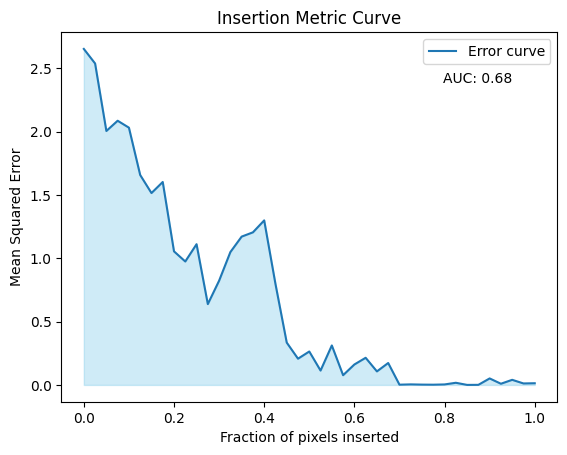

Errors: [2.6543803, 2.5392685, 2.0061865, 2.0870173, 2.0323596, 1.6583955, 1.5157753, 1.60322, 1.0550452, 0.97509116, 1.1117741, 0.6385209, 0.8231909, 1.0494915, 1.171615, 1.2054373, 1.2998139, 0.79776776, 0.3344295, 0.20720288, 0.26411042, 0.11350835, 0.31181845, 0.07681776, 0.16143474, 0.21439709, 0.106827766, 0.17314836, 0.0019199542, 0.0042193993, 0.002427642, 0.0017848138, 0.0038023149, 0.016967852, 0.00015684184, 0.00060446956, 0.051275376, 0.009330603, 0.040278498, 0.011649696, 0.013302985]
AUC: 0.6752981203884701
############################################################# 

Insertion 8 top pixel for Istance nr 31 
[(2, 3), (1, 3), (2, 4), (1, 4), (3, 3), (3, 4), (0, 3), (1, 7), (1, 2), (2, 2), (2, 7), (2, 5), (3, 5), (2, 6), (4, 4), (3, 6), (0, 4), (4, 3), (0, 2), (1, 5), (3, 2), (1, 6), (4, 5), (0, 7), (4, 6), (3, 7), (2, 1), (1, 1), (3, 0), (0, 6), (4, 7), (3, 1), (4, 0), (0, 5), (2, 0), (4, 2), (0, 1), (1, 0), (4, 1), (0, 0)] 

Original prediction: [2.643118]
Initial Predi

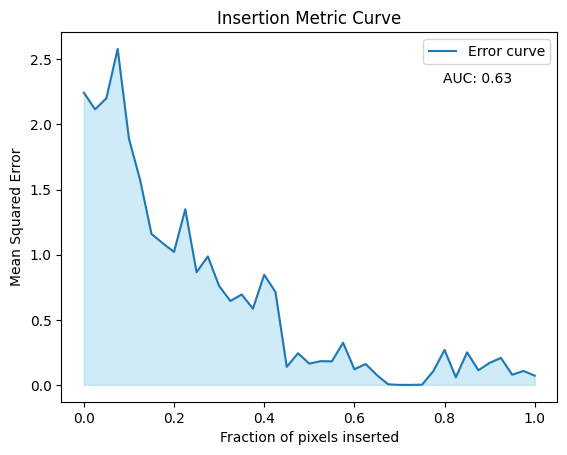

Errors: [2.2445467, 2.1165082, 2.201631, 2.5803306, 1.8914634, 1.5714667, 1.1596248, 1.0879594, 1.021761, 1.3493102, 0.86547315, 0.98673624, 0.7600682, 0.6446566, 0.69451106, 0.5861229, 0.84595275, 0.7136087, 0.13910279, 0.24346577, 0.16384639, 0.18231438, 0.18114962, 0.32371706, 0.12019838, 0.16083601, 0.074908815, 0.004656785, 0.00010601472, 0.00012962283, 0.001656312, 0.105419636, 0.26898602, 0.058350533, 0.2503568, 0.11250107, 0.16971743, 0.20764394, 0.078220375, 0.107498355, 0.071136914]
AUC: 0.6297452137850996
############################################################# 

Insertion 8 top pixel for Istance nr 32 
[(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (0, 3), (1, 4), (4, 3), (2, 2), (1, 2), (4, 4), (2, 7), (1, 7), (0, 4), (0, 2), (3, 2), (0, 7), (3, 7), (3, 5), (4, 5), (4, 6), (3, 6), (2, 6), (1, 6), (2, 5), (4, 2), (4, 7), (0, 6), (1, 5), (0, 5), (3, 0), (4, 0), (3, 1), (2, 1), (1, 1), (4, 1), (0, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [3.0524397]
Initial Predictio

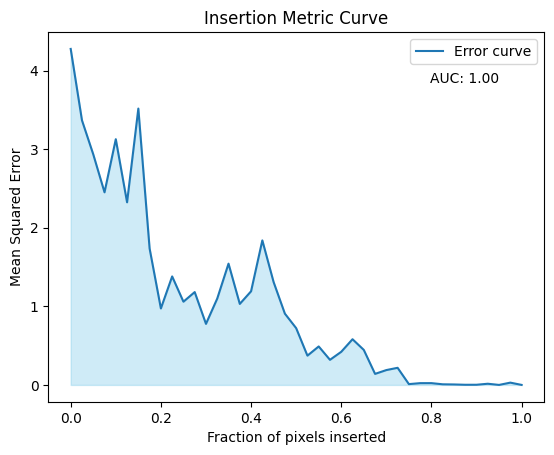

Errors: [4.275336, 3.3665833, 2.9344802, 2.4508321, 3.1268396, 2.323787, 3.516375, 1.735504, 0.97296214, 1.3805195, 1.0590276, 1.1813394, 0.7769187, 1.0991094, 1.5430384, 1.0308084, 1.1915046, 1.8389913, 1.3084569, 0.9068191, 0.7226129, 0.37242076, 0.48949984, 0.31948808, 0.42161137, 0.58139217, 0.44556043, 0.14047198, 0.18897301, 0.21784034, 0.010294224, 0.022514908, 0.022743154, 0.00787887, 0.005835837, 0.0018853858, 0.00211837, 0.015011669, 3.8914477e-06, 0.029151132, 0.00016644986]
AUC: 0.9974739046650938
############################################################# 

Insertion 8 top pixel for Istance nr 33 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (1, 4), (2, 2), (1, 2), (4, 3), (4, 7), (4, 6), (2, 7), (0, 4), (3, 7), (1, 7), (0, 2), (4, 4), (3, 5), (3, 2), (3, 6), (4, 5), (0, 7), (2, 5), (2, 6), (3, 0), (0, 6), (1, 6), (1, 5), (4, 0), (4, 2), (0, 5), (2, 0), (1, 1), (2, 1), (3, 1), (0, 1), (4, 1), (1, 0), (0, 0)] 

Original prediction: [2.945435]
Initial Prediction with B

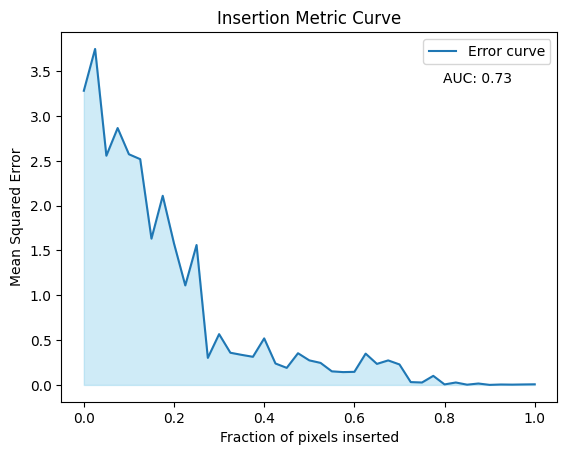

Errors: [3.281887, 3.7487435, 2.5572546, 2.8660474, 2.5735795, 2.518908, 1.6319354, 2.1101472, 1.5779114, 1.1102053, 1.561105, 0.30170557, 0.56657356, 0.35907522, 0.33543843, 0.31384164, 0.51922536, 0.23908891, 0.19035107, 0.35357663, 0.27402452, 0.2457874, 0.15157779, 0.14308164, 0.14602491, 0.3491757, 0.23469767, 0.27352002, 0.22871351, 0.031539526, 0.027119976, 0.10115453, 0.005610854, 0.027176937, 0.0026521357, 0.015777241, 0.00050261046, 0.0047620866, 0.0032882204, 0.005302571, 0.006948048]
AUC: 0.7337655186245684
############################################################# 

Insertion 8 top pixel for Istance nr 34 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (2, 2), (1, 2), (4, 3), (0, 2), (0, 7), (4, 7), (0, 4), (4, 4), (1, 7), (4, 6), (3, 2), (3, 7), (4, 5), (2, 7), (0, 6), (1, 6), (3, 5), (3, 6), (2, 5), (1, 5), (4, 2), (2, 6), (0, 5), (0, 1), (1, 1), (4, 0), (2, 1), (3, 0), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.966044]
Initial Predict

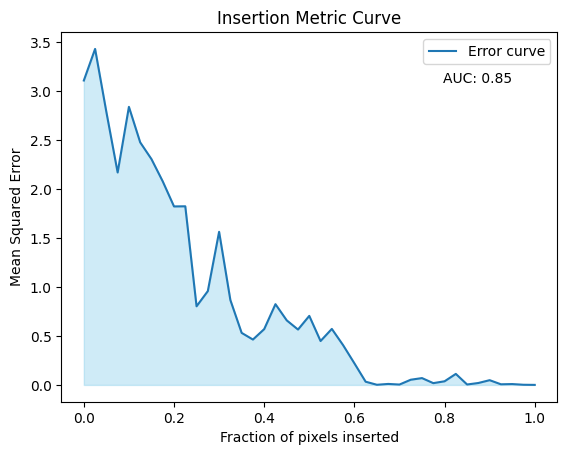

Errors: [3.110333, 3.4331768, 2.7887402, 2.1704879, 2.8412757, 2.4785001, 2.3073442, 2.0797932, 1.8238081, 1.8251729, 0.80339915, 0.9587846, 1.5646262, 0.8672743, 0.5318361, 0.46355546, 0.57021093, 0.82511747, 0.6595582, 0.56594527, 0.7055125, 0.44861454, 0.5724138, 0.40641665, 0.22111882, 0.032824118, 0.0015205378, 0.01011331, 0.00384776, 0.0530429, 0.06979961, 0.018228924, 0.037122045, 0.11267963, 0.00431158, 0.019762987, 0.04847001, 0.0064496747, 0.008806326, 0.0016690864, 0.0003461458]
AUC: 0.8474167698761449
############################################################# 

Insertion 8 top pixel for Istance nr 35 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (2, 2), (4, 3), (0, 3), (1, 4), (1, 2), (3, 2), (4, 4), (2, 5), (3, 5), (4, 2), (0, 2), (1, 7), (4, 6), (3, 6), (2, 6), (0, 4), (4, 5), (4, 7), (2, 7), (3, 7), (1, 1), (1, 5), (1, 6), (0, 7), (2, 1), (0, 6), (2, 0), (3, 0), (4, 0), (0, 5), (0, 1), (3, 1), (1, 0), (4, 1), (0, 0)] 

Original prediction: [2.8324628]
Initial Prediction w

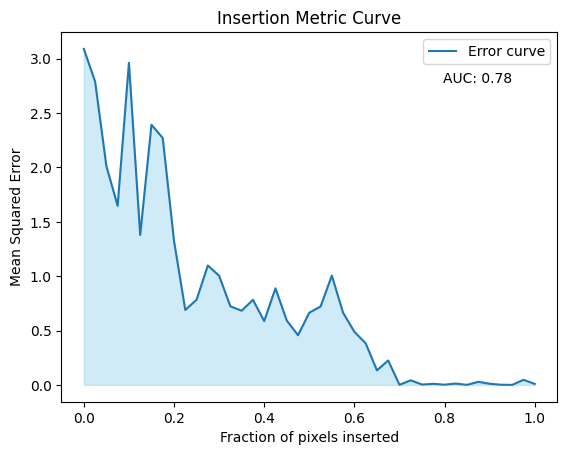

Errors: [3.0896072, 2.789379, 2.0126703, 1.6465852, 2.9612155, 1.3787363, 2.3923655, 2.2705886, 1.3250442, 0.6894121, 0.7831024, 1.098067, 1.0041556, 0.72279817, 0.6824481, 0.7827642, 0.5872876, 0.8882254, 0.59266466, 0.45703515, 0.66405797, 0.72089446, 1.0051185, 0.663511, 0.4888305, 0.38287145, 0.13442793, 0.22473723, 0.0009798883, 0.04256383, 0.0034357705, 0.010317072, 0.0022525496, 0.012435606, 0.000588677, 0.02864379, 0.010573456, 0.0017828603, 0.00034233273, 0.047090452, 0.0093369605]
AUC: 0.7764868059370201
############################################################# 

Insertion 8 top pixel for Istance nr 36 
[(2, 3), (1, 3), (0, 3), (3, 3), (2, 4), (3, 4), (1, 2), (1, 4), (0, 2), (2, 2), (4, 3), (0, 7), (4, 4), (0, 4), (1, 7), (3, 5), (4, 7), (3, 2), (4, 6), (2, 5), (4, 5), (2, 7), (3, 7), (0, 6), (3, 6), (1, 6), (4, 2), (1, 5), (2, 6), (0, 5), (1, 1), (0, 1), (4, 0), (2, 1), (3, 0), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.6933098]
Initial Prediction 

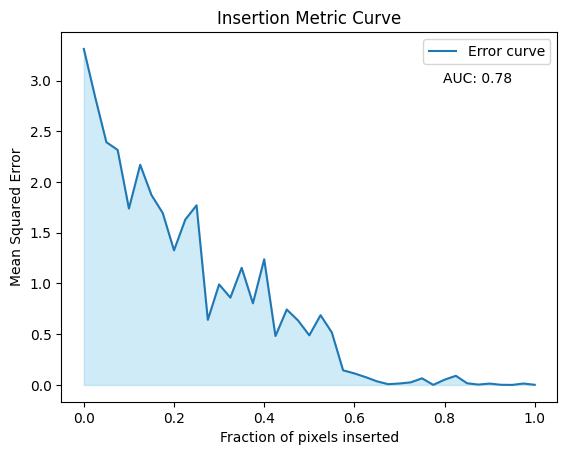

Errors: [3.312621, 2.8400662, 2.3930783, 2.3168006, 1.7388617, 2.1703146, 1.8720771, 1.6947954, 1.326944, 1.6297176, 1.7710285, 0.6417049, 0.99108213, 0.8606351, 1.1549301, 0.8048333, 1.2386065, 0.4819061, 0.7435311, 0.6358277, 0.48902074, 0.6876292, 0.5169054, 0.14384073, 0.11368723, 0.076860584, 0.03556423, 0.007223507, 0.014218927, 0.025313282, 0.065072365, 0.00038355874, 0.05158216, 0.08988428, 0.016178295, 0.0034057065, 0.01317181, 0.0014253149, 2.8298095e-05, 0.013758067, 0.0010851006]
AUC: 0.7832186981002451
############################################################# 

Insertion 8 top pixel for Istance nr 37 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (1, 2), (2, 2), (4, 3), (0, 2), (4, 4), (0, 4), (4, 6), (4, 7), (3, 2), (4, 5), (1, 7), (3, 5), (3, 7), (2, 7), (3, 6), (4, 2), (2, 5), (0, 7), (1, 6), (2, 6), (1, 5), (0, 6), (0, 1), (0, 5), (1, 1), (2, 1), (3, 0), (4, 0), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.3763683]
Initial Prediction

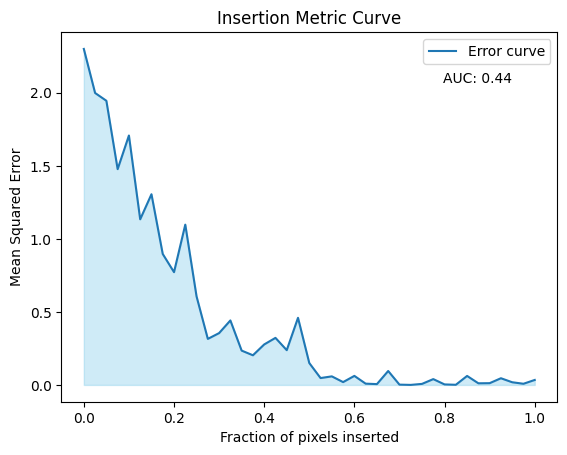

Errors: [2.3002048, 1.9985628, 1.94525, 1.4771727, 1.7074549, 1.1338844, 1.3053641, 0.8965955, 0.77195156, 1.0972383, 0.6059837, 0.31509975, 0.35479304, 0.44144776, 0.2349433, 0.20297915, 0.27709302, 0.32215813, 0.23796187, 0.45938867, 0.14992097, 0.046995718, 0.05861322, 0.019392963, 0.061854843, 0.008686545, 0.005582209, 0.0953695, 0.0019440992, 0.00016906849, 0.0071062157, 0.03982188, 0.0033973078, 0.000916712, 0.061525952, 0.011129693, 0.01200465, 0.04576722, 0.018337373, 0.00792121, 0.034016494]
AUC: 0.4402222701930441
############################################################# 

Insertion 8 top pixel for Istance nr 38 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (1, 4), (3, 4), (4, 3), (2, 2), (1, 2), (0, 4), (0, 2), (4, 4), (4, 7), (4, 6), (3, 2), (0, 7), (1, 7), (4, 5), (3, 5), (3, 7), (2, 5), (4, 2), (0, 6), (2, 7), (1, 6), (3, 6), (1, 5), (0, 5), (2, 6), (1, 1), (0, 1), (2, 1), (3, 1), (4, 0), (4, 1), (3, 0), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.5443656]
Initial P

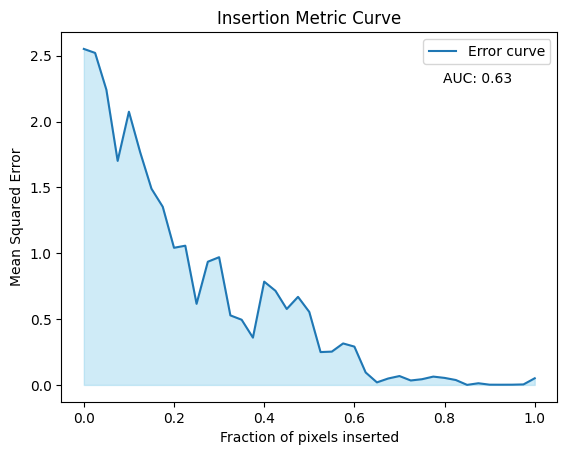

Errors: [2.5515378, 2.5212648, 2.2417092, 1.701217, 2.0746372, 1.7663082, 1.4900675, 1.3529851, 1.0414486, 1.0572647, 0.6158621, 0.93550956, 0.9699214, 0.52815294, 0.49505386, 0.35919225, 0.7843709, 0.71469045, 0.57659584, 0.6687704, 0.5542379, 0.24949433, 0.2529776, 0.31503057, 0.29104123, 0.09475908, 0.019342, 0.048838872, 0.06747706, 0.033821005, 0.043414466, 0.063215025, 0.053369787, 0.037312005, 0.00028924187, 0.012730323, 0.0018061706, 0.0015464743, 0.0017866676, 0.0038362627, 0.050546236]
AUC: 0.6335597489087378
############################################################# 

Insertion 8 top pixel for Istance nr 39 
[(2, 3), (1, 3), (3, 3), (3, 4), (2, 4), (0, 3), (2, 2), (4, 3), (1, 4), (1, 2), (4, 4), (2, 7), (4, 7), (3, 7), (3, 2), (0, 4), (3, 5), (4, 6), (2, 5), (3, 6), (1, 7), (2, 6), (0, 2), (4, 5), (4, 2), (1, 6), (0, 7), (1, 5), (0, 6), (2, 1), (0, 5), (1, 1), (4, 0), (3, 1), (3, 0), (4, 1), (0, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.323326]
Initial Predict

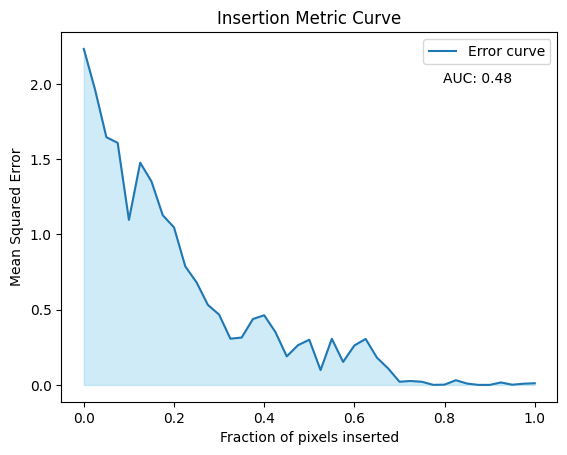

Errors: [2.231961, 1.9600713, 1.645752, 1.6081566, 1.09642, 1.47613, 1.3517262, 1.1272739, 1.0464531, 0.78735423, 0.68135464, 0.53213274, 0.46704456, 0.30718672, 0.31475723, 0.43787703, 0.4628522, 0.35072306, 0.18967387, 0.26419717, 0.3002571, 0.09855716, 0.30671805, 0.15276723, 0.2622277, 0.30550408, 0.18119924, 0.10902083, 0.021189388, 0.02627489, 0.020715764, 0.0004917656, 0.0018375136, 0.031208778, 0.00896865, 0.00029620895, 0.00011920059, 0.016498033, 0.001452228, 0.008138525, 0.011178441]
AUC: 0.477053716721639
############################################################# 

Insertion 8 top pixel for Istance nr 40 
[(2, 3), (1, 3), (0, 3), (3, 3), (2, 4), (3, 4), (1, 4), (1, 2), (4, 3), (0, 4), (2, 2), (0, 2), (4, 4), (4, 6), (4, 7), (4, 5), (3, 2), (4, 2), (1, 7), (0, 7), (3, 5), (3, 7), (1, 5), (2, 5), (3, 6), (0, 5), (0, 6), (2, 7), (1, 6), (3, 1), (4, 1), (3, 0), (4, 0), (2, 1), (1, 1), (0, 1), (2, 6), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.2478237]
Initial Predicti

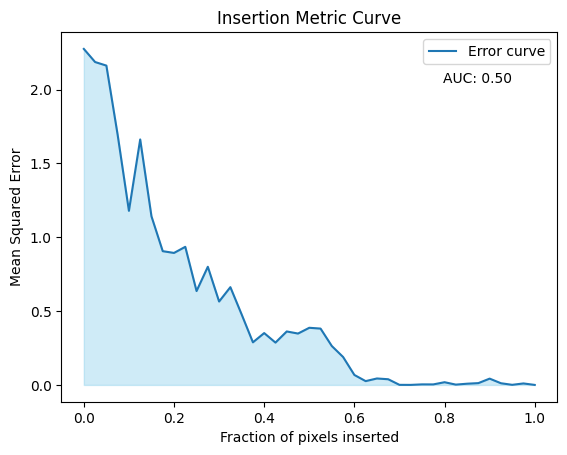

Errors: [2.2750068, 2.1862495, 2.1621354, 1.6935146, 1.1788895, 1.6619781, 1.141698, 0.90560806, 0.8937, 0.93504703, 0.63559395, 0.79993385, 0.56475353, 0.6619588, 0.4772912, 0.28851697, 0.351011, 0.2866094, 0.36202848, 0.34787065, 0.38688058, 0.38145858, 0.26323703, 0.1891114, 0.06750432, 0.025722548, 0.0436384, 0.038482424, 0.00048035948, 0.00021812564, 0.0036566046, 0.003459569, 0.018327171, 0.002086013, 0.008238285, 0.012247341, 0.042633608, 0.011420215, 0.0006701991, 0.010023312, 3.0334842e-05]
AUC: 0.5045350642605626
############################################################# 

Insertion 8 top pixel for Istance nr 41 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (1, 4), (3, 4), (0, 4), (1, 2), (4, 3), (2, 2), (0, 2), (4, 4), (0, 7), (4, 6), (4, 7), (1, 7), (4, 5), (3, 5), (3, 2), (2, 5), (0, 6), (3, 7), (4, 2), (2, 7), (0, 5), (1, 5), (3, 6), (1, 6), (2, 6), (4, 0), (4, 1), (2, 1), (1, 1), (3, 0), (3, 1), (0, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [2.0883684]
Initial Pr

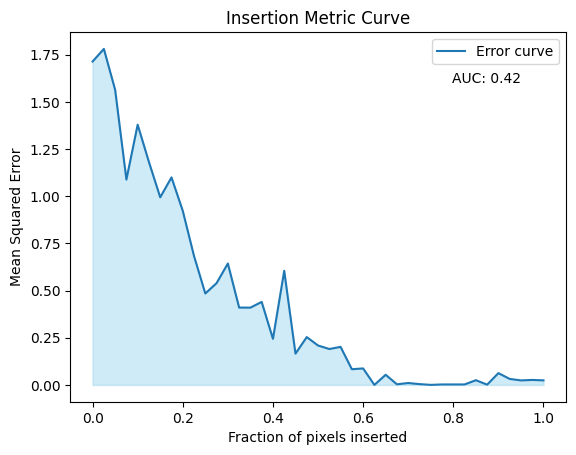

Errors: [1.7138319, 1.780627, 1.5644524, 1.0884471, 1.3791139, 1.1810477, 0.99431396, 1.0997438, 0.92260283, 0.68282455, 0.48455405, 0.5395243, 0.64337695, 0.4099371, 0.4095922, 0.43987808, 0.24426757, 0.60461473, 0.16585037, 0.25355616, 0.20887844, 0.19037624, 0.20165206, 0.083177894, 0.08743889, 8.888315e-05, 0.053872738, 0.0032019785, 0.010117723, 0.0042811064, 0.00026609312, 0.0024558462, 0.0024833814, 0.002491372, 0.025075324, 0.001360716, 0.062493563, 0.031825554, 0.023975423, 0.026499128, 0.024136353]
AUC: 0.41948303453973496
############################################################# 

Insertion 8 top pixel for Istance nr 42 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (1, 2), (2, 2), (0, 2), (4, 4), (0, 4), (4, 7), (4, 6), (3, 2), (0, 7), (4, 5), (1, 7), (3, 5), (4, 2), (3, 7), (2, 5), (2, 7), (3, 6), (0, 6), (1, 5), (1, 6), (2, 6), (0, 5), (0, 1), (4, 0), (1, 1), (3, 0), (4, 1), (3, 1), (2, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [2.0067182]


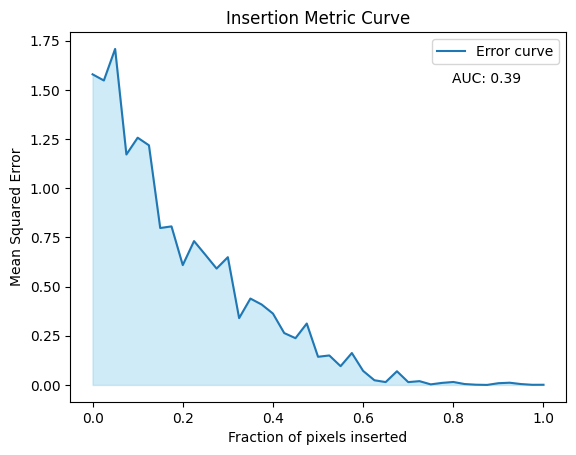

Errors: [1.5792854, 1.5479636, 1.7084466, 1.1717283, 1.2570637, 1.2184143, 0.79787976, 0.8061302, 0.60932696, 0.73133224, 0.6621185, 0.5917012, 0.64954454, 0.3397426, 0.43916047, 0.40882963, 0.36289948, 0.2637819, 0.23770607, 0.3122148, 0.14312159, 0.14987925, 0.095430255, 0.16220796, 0.07133348, 0.023825848, 0.014448795, 0.069508396, 0.014297103, 0.019201532, 0.002814054, 0.010364107, 0.015026103, 0.0045324466, 0.0011021625, 4.1460342e-05, 0.008753537, 0.01123983, 0.0043980186, 0.00061780744, 0.00079965836]
AUC: 0.3932042754546274
############################################################# 

Insertion 8 top pixel for Istance nr 43 
[(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (0, 3), (2, 2), (1, 4), (1, 2), (4, 3), (4, 4), (0, 4), (0, 2), (3, 2), (3, 5), (4, 5), (4, 6), (4, 7), (2, 5), (3, 7), (3, 6), (4, 2), (2, 7), (1, 7), (0, 7), (2, 6), (1, 5), (2, 1), (1, 6), (1, 1), (0, 5), (4, 0), (3, 0), (3, 1), (0, 6), (0, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.1258378]
I

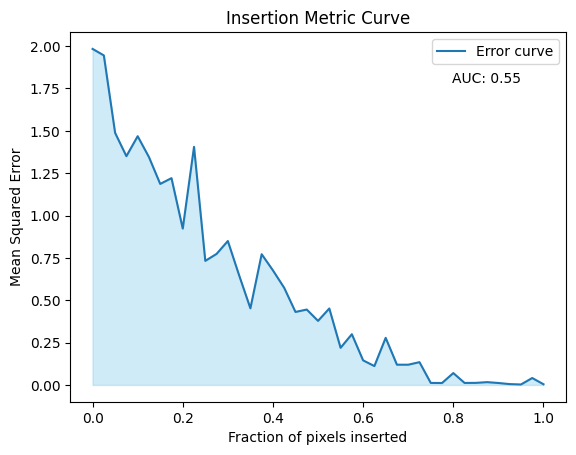

Errors: [1.9832671, 1.9449977, 1.4876424, 1.3501381, 1.4680521, 1.3449941, 1.1863831, 1.2205735, 0.9227178, 1.4054335, 0.7322692, 0.77338463, 0.84941596, 0.64707386, 0.45209032, 0.77154356, 0.6761386, 0.5728831, 0.43073776, 0.4448878, 0.37809306, 0.45118827, 0.21899337, 0.29933545, 0.14486878, 0.11128851, 0.2779715, 0.11940105, 0.11931168, 0.13434507, 0.011793783, 0.011280512, 0.06995244, 0.011715099, 0.01212018, 0.016403817, 0.011409618, 0.0048595527, 0.0025912693, 0.040702548, 0.003975938]
AUC: 0.5530651043984108
############################################################# 

Insertion 8 top pixel for Istance nr 44 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (1, 2), (2, 2), (4, 4), (0, 2), (0, 4), (3, 2), (4, 6), (4, 7), (4, 5), (4, 2), (3, 5), (1, 7), (0, 7), (2, 5), (3, 7), (1, 5), (2, 7), (3, 6), (0, 6), (0, 5), (1, 6), (4, 1), (3, 0), (1, 1), (0, 1), (4, 0), (3, 1), (2, 1), (2, 6), (1, 0), (0, 0), (2, 0)] 

Original prediction: [1.9465679]
Initial Prediction

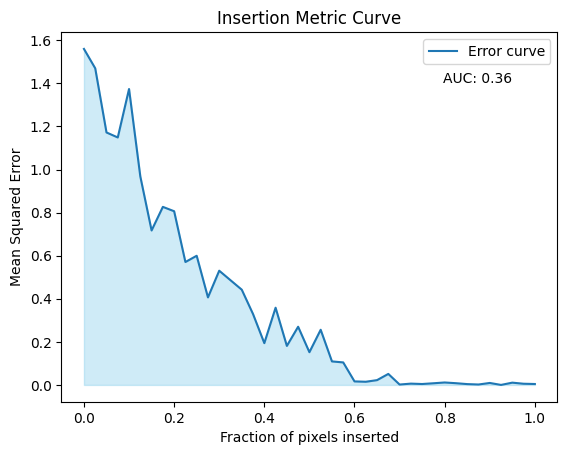

Errors: [1.5600214, 1.4700444, 1.1721454, 1.1489111, 1.3739717, 0.96795344, 0.717155, 0.82668465, 0.8064145, 0.57065445, 0.59967947, 0.40642348, 0.5302705, 0.48612797, 0.44213077, 0.32899487, 0.19398062, 0.3584877, 0.1811632, 0.27012122, 0.15198332, 0.25609466, 0.10918487, 0.10445785, 0.01634829, 0.014679724, 0.022259384, 0.051096078, 0.0017730686, 0.0060074306, 0.0042027365, 0.0076795034, 0.0113387015, 0.008027086, 0.003825623, 0.0019209468, 0.009106251, 3.4681005e-05, 0.010539773, 0.005492491, 0.0042394167]
AUC: 0.36073743174783884
############################################################# 

Insertion 8 top pixel for Istance nr 45 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (2, 2), (1, 2), (0, 2), (4, 4), (0, 4), (4, 7), (3, 2), (1, 7), (4, 6), (0, 7), (3, 5), (4, 5), (4, 2), (3, 7), (2, 7), (2, 5), (3, 6), (1, 5), (0, 6), (1, 6), (0, 5), (2, 6), (3, 0), (0, 1), (3, 1), (2, 1), (1, 1), (4, 0), (4, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [1.8833463]

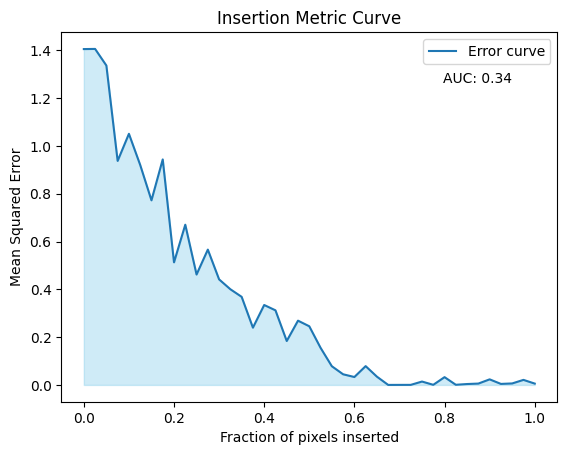

Errors: [1.4056381, 1.406287, 1.336757, 0.9375888, 1.051005, 0.9207166, 0.7726288, 0.94381964, 0.51312447, 0.6705314, 0.46205595, 0.5663238, 0.44173232, 0.4004052, 0.36866957, 0.23963702, 0.33450148, 0.31219906, 0.18384254, 0.2689442, 0.24547037, 0.15536289, 0.078253984, 0.044533413, 0.033118766, 0.07867734, 0.0345545, 1.8285515e-05, 0.00015402105, 0.00022781211, 0.014102944, 0.0004558389, 0.032537844, 0.0005927506, 0.0037265564, 0.0056522735, 0.02331822, 0.0042245113, 0.006214376, 0.021103404, 0.005582993]
AUC: 0.3404670097110284
############################################################# 

Insertion 8 top pixel for Istance nr 46 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (4, 4), (1, 2), (0, 4), (0, 2), (2, 2), (4, 6), (4, 7), (0, 7), (1, 7), (4, 5), (3, 5), (3, 2), (3, 7), (4, 2), (2, 7), (2, 5), (3, 6), (1, 5), (0, 6), (0, 5), (1, 6), (0, 1), (2, 6), (1, 1), (3, 0), (4, 0), (3, 1), (2, 1), (4, 1), (0, 0), (2, 0), (1, 0)] 

Original prediction: [1.949839]
Ini

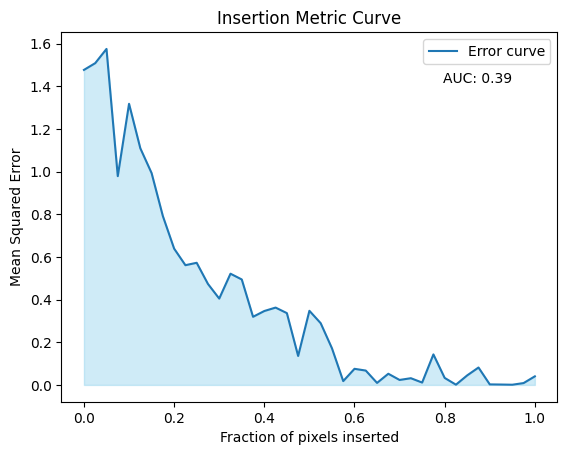

Errors: [1.4772209, 1.5088918, 1.5756097, 0.9790693, 1.3182839, 1.1098024, 0.99351996, 0.79178256, 0.6391348, 0.56144655, 0.5727449, 0.4735615, 0.40485808, 0.5215149, 0.4945301, 0.31945828, 0.34660396, 0.36264214, 0.33674613, 0.13582169, 0.3476038, 0.28948388, 0.17182092, 0.017927084, 0.075526804, 0.06732436, 0.009428159, 0.052397702, 0.023323936, 0.03148658, 0.0110944575, 0.14309579, 0.03285419, 0.0011351751, 0.04485812, 0.08162638, 0.0024669413, 0.0017981747, 0.0009243145, 0.008702974, 0.040226884]
AUC: 0.39049065418075773
############################################################# 

Insertion 8 top pixel for Istance nr 47 
[(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (4, 3), (1, 4), (2, 2), (1, 2), (4, 4), (0, 2), (0, 4), (3, 2), (0, 7), (4, 7), (4, 6), (1, 7), (4, 2), (4, 5), (3, 7), (3, 5), (2, 7), (3, 6), (0, 6), (2, 5), (1, 6), (1, 5), (4, 0), (0, 5), (4, 1), (2, 6), (3, 0), (3, 1), (2, 1), (0, 1), (1, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.9107243]
Initial 

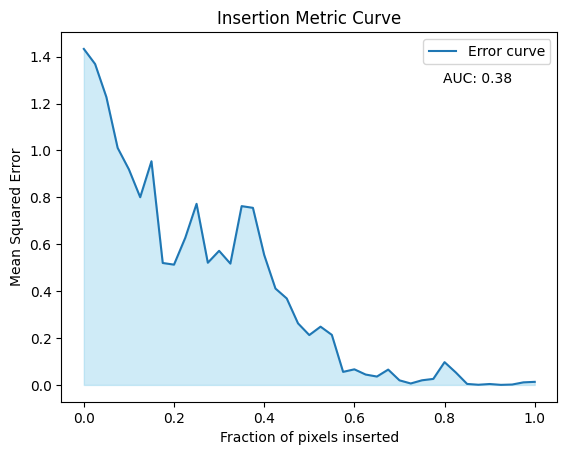

Errors: [1.4328642, 1.3685027, 1.2275571, 1.0108678, 0.91902786, 0.8004329, 0.95384496, 0.51999205, 0.5129284, 0.6276397, 0.77228636, 0.52102065, 0.5718425, 0.51731557, 0.7624777, 0.75518167, 0.55433017, 0.41099, 0.368776, 0.26262343, 0.21267904, 0.24843355, 0.21348113, 0.055655524, 0.06652723, 0.044261582, 0.0357311, 0.06539395, 0.01956363, 0.0061879787, 0.019778576, 0.025660412, 0.09712649, 0.05305311, 0.004246623, 0.0007344922, 0.0038940555, 0.0002701885, 0.0016839737, 0.010979139, 0.013087994]
AUC: 0.3836488833097974
############################################################# 

Insertion 8 top pixel for Istance nr 48 
[(2, 3), (1, 3), (3, 3), (2, 4), (4, 3), (0, 3), (3, 4), (1, 4), (4, 4), (2, 2), (1, 2), (3, 2), (4, 2), (0, 4), (1, 7), (0, 7), (4, 7), (0, 2), (4, 5), (4, 6), (3, 5), (2, 7), (3, 7), (3, 6), (2, 5), (0, 6), (1, 6), (2, 6), (3, 0), (1, 5), (4, 1), (3, 1), (4, 0), (0, 5), (2, 1), (1, 1), (2, 0), (0, 1), (1, 0), (0, 0)] 

Original prediction: [1.8289688]
Initial Pred

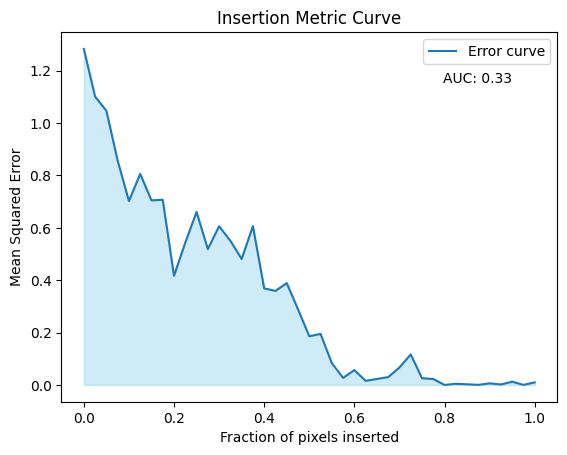

Errors: [1.2833306, 1.101399, 1.0472537, 0.8568822, 0.7022787, 0.80589175, 0.704929, 0.707201, 0.416789, 0.54356426, 0.6605852, 0.51878655, 0.605926, 0.5505521, 0.4811495, 0.6065146, 0.36870867, 0.35914496, 0.38902193, 0.28875956, 0.18594281, 0.1948359, 0.08314104, 0.026805999, 0.05662796, 0.015491296, 0.022791432, 0.029822795, 0.06669491, 0.11655593, 0.025599036, 0.022457134, 5.038192e-06, 0.0043593976, 0.0023861653, 0.00022351074, 0.006028682, 0.0016799256, 0.012415806, 0.00017058782, 0.009737605]
AUC: 0.3308976754982723
############################################################# 

Insertion 8 top pixel for Istance nr 49 
[(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (4, 6), (0, 2), (0, 7), (4, 7), (4, 2), (3, 2), (4, 5), (3, 5), (1, 7), (0, 4), (3, 6), (3, 7), (4, 0), (2, 5), (2, 7), (3, 0), (0, 6), (1, 6), (2, 6), (1, 5), (4, 1), (3, 1), (2, 1), (0, 1), (0, 5), (1, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.796648]
Initial Pre

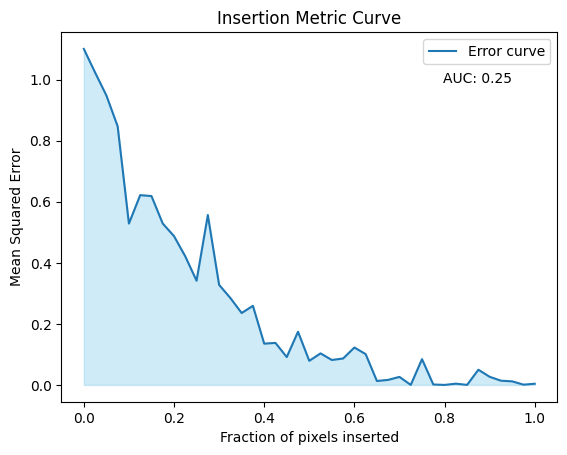

Errors: [1.1006042, 1.0232258, 0.94827414, 0.847204, 0.5286517, 0.62162787, 0.6186591, 0.52860874, 0.48740232, 0.4210035, 0.3413327, 0.5564417, 0.32780525, 0.2846698, 0.2356004, 0.25907767, 0.13526307, 0.13766147, 0.091330364, 0.17417738, 0.07902434, 0.10329301, 0.08170173, 0.086584404, 0.122501686, 0.10101066, 0.012847176, 0.016526464, 0.02629325, 2.6776866e-05, 0.08441154, 0.001453064, 1.1831295e-05, 0.004128751, 0.00012959026, 0.04977444, 0.026627943, 0.013852809, 0.011693897, 0.000847924, 0.0038861297]
AUC: 0.24857508113345828
############################################################# 

Insertion 8 top pixel for Istance nr 50 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (4, 3), (1, 4), (2, 2), (4, 4), (1, 2), (3, 2), (4, 7), (1, 7), (0, 4), (0, 2), (0, 7), (4, 2), (4, 6), (3, 5), (4, 5), (3, 7), (2, 7), (0, 6), (2, 5), (1, 6), (3, 6), (1, 5), (0, 5), (3, 0), (3, 1), (0, 0), (4, 1), (0, 1), (2, 1), (1, 1), (4, 0), (2, 0), (1, 0), (2, 6)] 

Original prediction: [1.6443821]
In

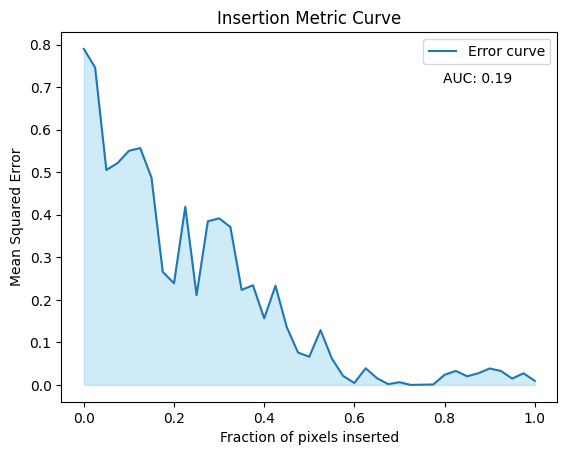

Errors: [0.7897843, 0.74609864, 0.5051033, 0.52171314, 0.5503355, 0.5567836, 0.48739758, 0.26576698, 0.2388664, 0.4187963, 0.21103472, 0.38455153, 0.3916443, 0.37117213, 0.22333744, 0.2342764, 0.15663244, 0.23303449, 0.13601021, 0.076147, 0.066226, 0.12879163, 0.06218824, 0.021175195, 0.00463798, 0.039141174, 0.015938016, 0.00181711, 0.00640035, 6.160605e-06, 0.00054549536, 0.0009945257, 0.02383943, 0.03297578, 0.020345012, 0.027521739, 0.038657546, 0.032872647, 0.014914581, 0.027436253, 0.0097135985]
AUC: 0.19187189633448726
############################################################# 

Insertion 8 top pixel for Istance nr 51 
[(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (1, 4), (1, 2), (4, 2), (2, 2), (0, 2), (4, 7), (3, 2), (0, 4), (4, 6), (0, 7), (4, 5), (3, 5), (1, 7), (3, 7), (0, 6), (4, 0), (3, 0), (3, 6), (2, 7), (0, 5), (2, 5), (4, 1), (1, 6), (1, 5), (0, 1), (3, 1), (2, 6), (1, 1), (2, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [1.7324073]
Initial

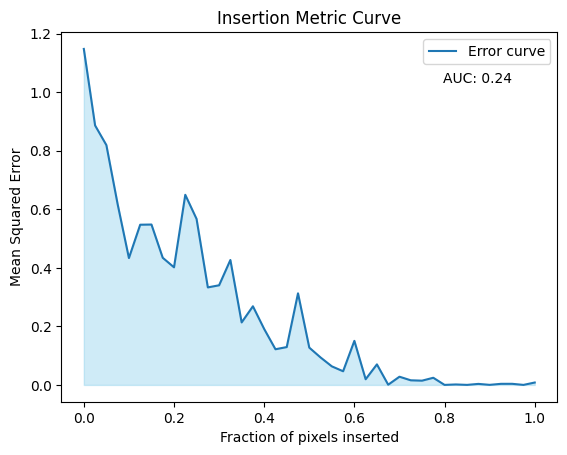

Errors: [1.1476922, 0.88626164, 0.819191, 0.61726993, 0.4333723, 0.54722506, 0.5478567, 0.43431938, 0.4017345, 0.6493874, 0.5670681, 0.3331211, 0.34034917, 0.42671964, 0.21351121, 0.26863644, 0.1909805, 0.12185591, 0.12929489, 0.31291243, 0.12740704, 0.09382855, 0.06343503, 0.046680704, 0.150507, 0.019407343, 0.07016252, 0.0007484697, 0.028047351, 0.015788833, 0.014545766, 0.024455467, 7.893521e-05, 0.0015809045, 0.00013419006, 0.0034990304, 0.00024121763, 0.0037130767, 0.0037889774, 8.3037245e-05, 0.008209983]
AUC: 0.2371787975600455
############################################################# 

Insertion 8 top pixel for Istance nr 52 
[(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (2, 2), (1, 2), (1, 4), (3, 2), (4, 2), (0, 2), (4, 7), (0, 7), (1, 7), (4, 6), (0, 4), (3, 7), (2, 7), (3, 5), (4, 5), (3, 6), (2, 5), (0, 6), (1, 6), (2, 6), (1, 5), (1, 1), (3, 0), (4, 0), (2, 1), (3, 1), (0, 5), (4, 1), (0, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.367974]

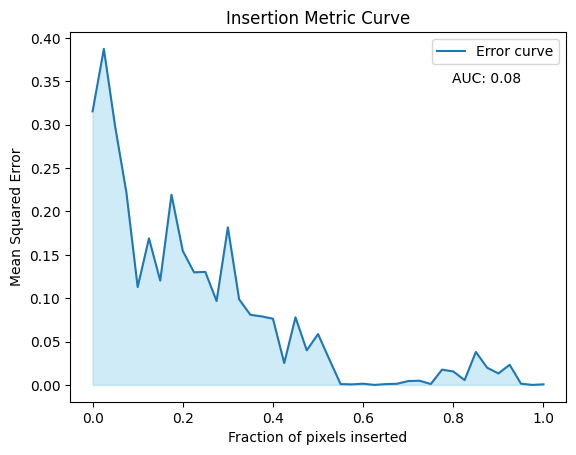

Errors: [0.3154434, 0.38747427, 0.2980642, 0.221855, 0.11287451, 0.1690154, 0.12030453, 0.21934597, 0.15454066, 0.12987928, 0.13034928, 0.09674294, 0.18174103, 0.09869665, 0.08085786, 0.07905222, 0.07633745, 0.025243763, 0.07794436, 0.039922807, 0.05864064, 0.029543515, 0.0009762347, 0.0006311472, 0.0014134672, 3.4608034e-05, 0.0009618365, 0.00133744, 0.004461523, 0.004865721, 0.0010424043, 0.017615229, 0.015533789, 0.0055709924, 0.038043153, 0.019882891, 0.01325776, 0.023256697, 0.0014279624, 3.442594e-05, 0.00067747734]
AUC: 0.07742085283898632
############################################################# 

Insertion 8 top pixel for Istance nr 53 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (1, 2), (1, 4), (4, 2), (0, 2), (2, 2), (4, 6), (3, 2), (0, 7), (4, 7), (4, 5), (1, 7), (3, 5), (0, 4), (3, 7), (2, 7), (3, 6), (4, 0), (0, 6), (3, 0), (1, 6), (2, 5), (2, 6), (1, 5), (4, 1), (3, 1), (0, 5), (0, 1), (1, 1), (2, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction

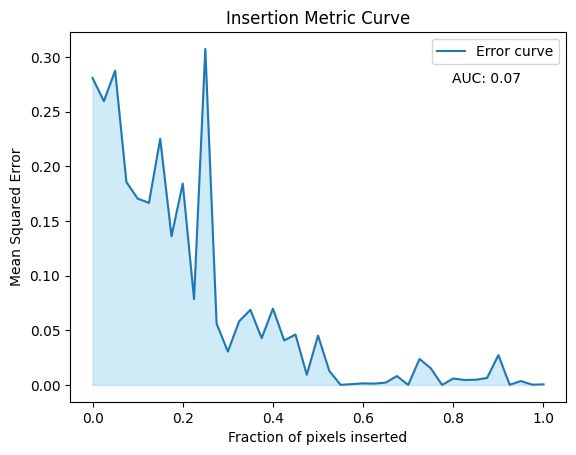

Errors: [0.28085828, 0.25968298, 0.28752244, 0.18569303, 0.17051242, 0.16657661, 0.2251821, 0.13606262, 0.18427384, 0.07846455, 0.30748147, 0.056192107, 0.030512227, 0.058235925, 0.06872959, 0.042836867, 0.06984491, 0.040705726, 0.04611006, 0.009327402, 0.04517428, 0.012804056, 9.758037e-05, 0.0007201857, 0.0014630328, 0.0011834985, 0.0021215423, 0.00814343, 1.5943371e-05, 0.023774613, 0.015284889, 1.0104233e-05, 0.00589822, 0.0044952524, 0.0047344696, 0.0064103105, 0.027303958, 0.00014423672, 0.0035526569, 0.00024105102, 0.0005088783]
AUC: 0.06820509524695807
############################################################# 

Insertion 8 top pixel for Istance nr 54 
[(2, 3), (1, 3), (3, 3), (4, 3), (2, 4), (3, 4), (1, 2), (0, 3), (2, 2), (4, 4), (1, 4), (0, 2), (4, 7), (3, 7), (4, 6), (3, 2), (3, 5), (3, 6), (4, 2), (2, 7), (1, 7), (0, 7), (2, 5), (2, 6), (4, 5), (0, 4), (1, 6), (0, 6), (1, 1), (1, 5), (3, 0), (2, 1), (4, 0), (0, 1), (3, 1), (4, 1), (2, 0), (0, 5), (1, 0), (0, 0)] 

Origi

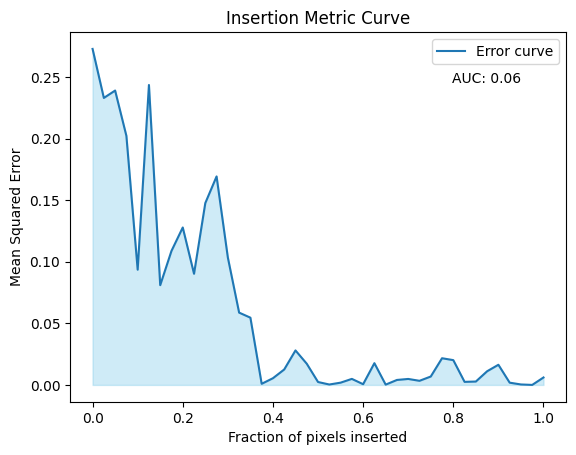

Errors: [0.2727475, 0.23296534, 0.23895852, 0.20217417, 0.09353994, 0.24347007, 0.08097295, 0.10879408, 0.1278015, 0.09021496, 0.14761841, 0.16924267, 0.10342124, 0.058690187, 0.05459359, 0.0009015009, 0.0054441304, 0.012537163, 0.027998101, 0.017202076, 0.0023639956, 0.0003313673, 0.0018349391, 0.0048957025, 0.0005878385, 0.017659431, 0.00024052567, 0.0040364205, 0.0048495196, 0.003341177, 0.0068200026, 0.021659099, 0.020131567, 0.0024800082, 0.002748721, 0.01109172, 0.016362224, 0.0018259627, 0.00036856093, 7.672606e-06, 0.006036237]
AUC: 0.056989222563424854
############################################################# 

Insertion 8 top pixel for Istance nr 55 
[(2, 3), (1, 3), (4, 3), (3, 3), (2, 4), (3, 4), (0, 3), (4, 4), (1, 4), (1, 7), (1, 2), (4, 5), (4, 6), (4, 2), (0, 7), (2, 2), (2, 7), (3, 5), (4, 7), (2, 5), (0, 2), (0, 4), (3, 2), (3, 7), (3, 6), (3, 0), (4, 0), (2, 6), (1, 6), (0, 6), (1, 5), (0, 5), (2, 0), (4, 1), (1, 1), (2, 1), (3, 1), (0, 1), (1, 0), (0, 0)] 

Orig

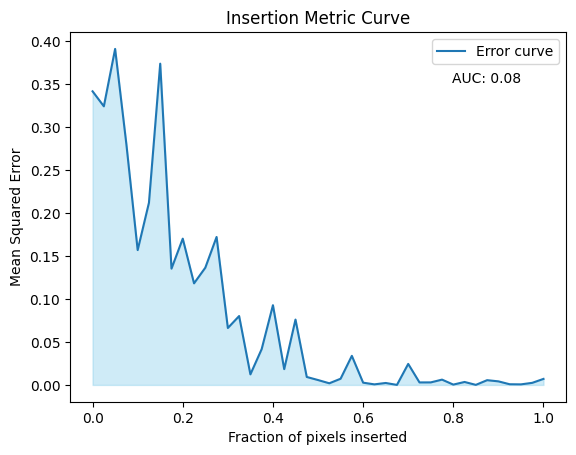

Errors: [0.34146073, 0.32401392, 0.39075905, 0.27976173, 0.15679601, 0.21183036, 0.3736129, 0.13523869, 0.17011556, 0.118147835, 0.13632879, 0.17207155, 0.066209555, 0.08010519, 0.012296335, 0.041645184, 0.09273926, 0.018360239, 0.07599884, 0.00926623, 0.005680666, 0.0019041286, 0.0071953884, 0.03381829, 0.0026221757, 0.00064790837, 0.0022618494, 2.8488657e-05, 0.024437016, 0.002901472, 0.0029395197, 0.0061627044, 0.00037414776, 0.0034382446, 5.8974143e-05, 0.0055223755, 0.004144223, 0.0007816784, 0.00064220425, 0.0024158154, 0.0070058]
AUC: 0.0786876929414575
############################################################# 

Insertion 8 top pixel for Istance nr 56 
[(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (0, 7), (4, 7), (4, 2), (2, 2), (1, 7), (1, 4), (3, 2), (1, 2), (0, 2), (3, 7), (0, 4), (4, 6), (2, 7), (0, 6), (4, 0), (4, 1), (3, 0), (4, 5), (1, 6), (3, 1), (3, 5), (3, 6), (0, 5), (1, 5), (2, 1), (2, 5), (0, 1), (2, 6), (1, 1), (2, 0), (0, 0), (1, 0)] 

Origi

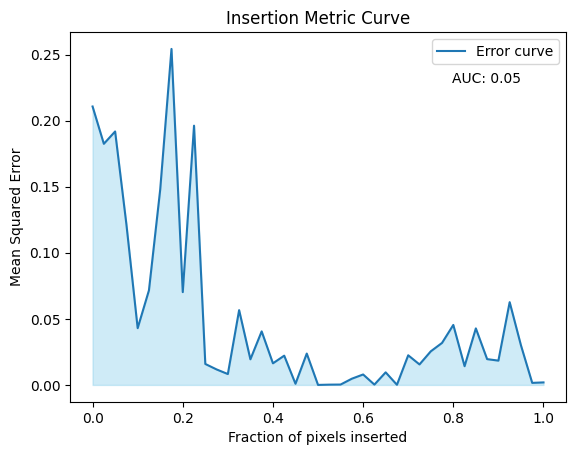

Errors: [0.2106753, 0.18244974, 0.19178043, 0.121572435, 0.042942237, 0.07154824, 0.1478911, 0.25424004, 0.07022089, 0.19616131, 0.015863728, 0.0117229195, 0.00822775, 0.056593526, 0.019388583, 0.040512532, 0.016343502, 0.0221396, 0.0008821845, 0.023724826, 3.198295e-06, 0.00020394454, 0.00028084937, 0.004705363, 0.007901466, 0.00024389109, 0.009519544, 0.00010561005, 0.022421813, 0.015504415, 0.025404707, 0.03178499, 0.04538091, 0.014163147, 0.04277358, 0.019523667, 0.0183794, 0.062625885, 0.029991638, 0.0015495792, 0.0019015286]
AUC: 0.048824040448198505
############################################################# 

Insertion 8 top pixel for Istance nr 57 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (0, 3), (2, 4), (4, 4), (1, 7), (0, 7), (4, 2), (4, 7), (2, 2), (1, 4), (3, 2), (1, 2), (0, 2), (2, 7), (0, 4), (4, 6), (3, 7), (3, 0), (4, 0), (0, 6), (4, 5), (3, 5), (1, 6), (3, 6), (4, 1), (3, 1), (2, 5), (2, 6), (0, 5), (2, 0), (1, 5), (2, 1), (1, 1), (0, 1), (1, 0), (0, 0)] 

Original 

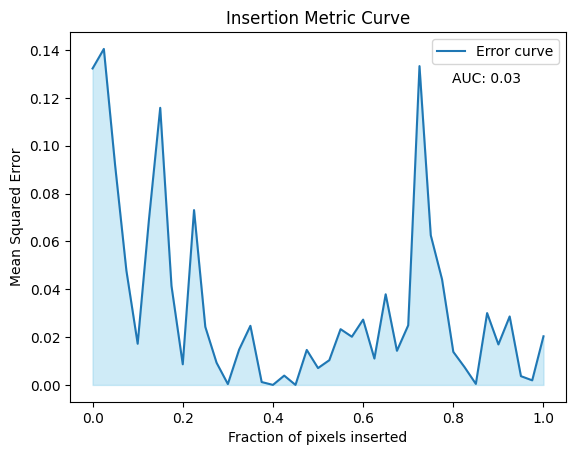

Errors: [0.13231726, 0.14049235, 0.091791175, 0.04778186, 0.01721202, 0.069097355, 0.115868494, 0.04138602, 0.008625855, 0.07310278, 0.02427735, 0.009267011, 0.0003625484, 0.014770714, 0.024718318, 0.0012055325, 1.2071141e-05, 0.003897746, 4.8300717e-06, 0.014630889, 0.0070441873, 0.0103442855, 0.023312978, 0.020151125, 0.027310222, 0.011022876, 0.037909392, 0.014274534, 0.02492525, 0.13331169, 0.062580794, 0.04416623, 0.013826667, 0.007413433, 0.0004273301, 0.030037196, 0.016933056, 0.028631607, 0.0036634128, 0.0019190037, 0.020336952]
AUC: 0.032350932616100184
############################################################# 

Insertion 8 top pixel for Istance nr 58 
[(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (2, 4), (0, 3), (4, 4), (4, 2), (3, 2), (1, 2), (2, 2), (1, 4), (1, 7), (0, 2), (0, 7), (4, 7), (4, 6), (2, 7), (3, 7), (4, 5), (3, 5), (0, 4), (3, 6), (0, 6), (1, 6), (3, 0), (4, 0), (2, 5), (2, 6), (4, 1), (3, 1), (1, 5), (2, 1), (1, 1), (2, 0), (0, 5), (0, 1), (1, 0), (0, 0)] 

Ori

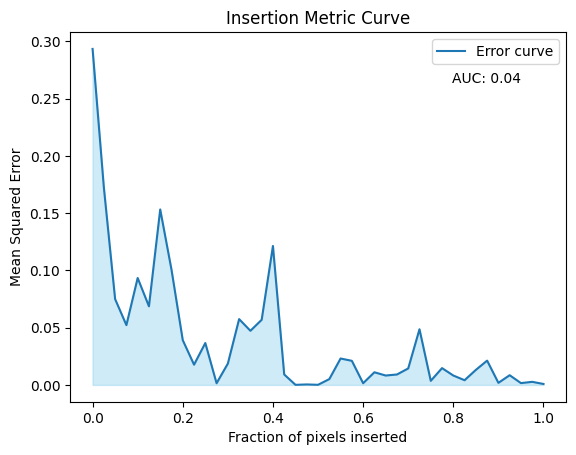

Errors: [0.29335767, 0.17249416, 0.0749269, 0.05221961, 0.09336858, 0.06865048, 0.1531897, 0.100666106, 0.039088316, 0.017678194, 0.036578007, 0.0014651492, 0.018628117, 0.05747156, 0.047274094, 0.05686286, 0.12131503, 0.009114443, 8.158368e-05, 0.0004198617, 0.00010110913, 0.005087197, 0.023073373, 0.021049961, 0.001486683, 0.011043837, 0.008207239, 0.0091108475, 0.014387158, 0.04859596, 0.0035705564, 0.014679319, 0.008205037, 0.0041187378, 0.013125935, 0.021215979, 0.0018146919, 0.008479736, 0.0015869013, 0.0027025295, 0.00083477754]
AUC: 0.037255794480006446
############################################################# 

Insertion 8 top pixel for Istance nr 59 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (0, 3), (2, 4), (4, 4), (4, 2), (3, 2), (2, 2), (1, 7), (1, 2), (4, 7), (0, 7), (1, 4), (4, 6), (0, 2), (4, 5), (4, 0), (3, 0), (2, 7), (3, 7), (3, 5), (3, 6), (0, 4), (4, 1), (3, 1), (1, 6), (0, 6), (2, 6), (2, 5), (2, 1), (2, 0), (1, 5), (1, 1), (0, 1), (0, 5), (1, 0), (0, 0)] 

Orig

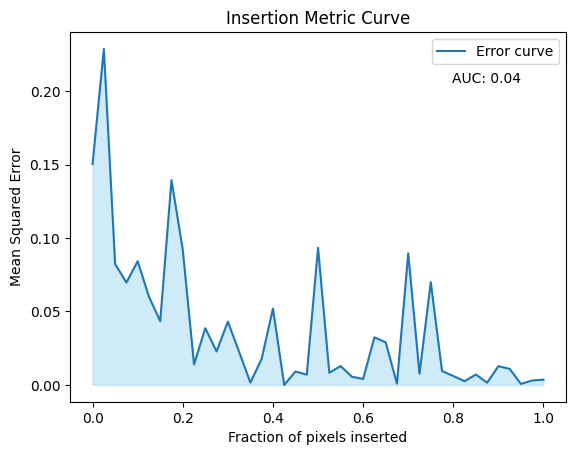

Errors: [0.1504888, 0.22875336, 0.08233592, 0.06968369, 0.08421507, 0.060038555, 0.043422315, 0.13943502, 0.091965415, 0.013988704, 0.038639076, 0.022793159, 0.04310959, 0.022477038, 0.0015758843, 0.017797777, 0.05203241, 1.2622349e-05, 0.009165113, 0.0069553233, 0.09337922, 0.008273054, 0.012853284, 0.0055662245, 0.004060222, 0.032371577, 0.028993689, 0.0009251845, 0.0895739, 0.007581515, 0.06995168, 0.009449562, 0.0060759797, 0.0025444897, 0.0070776846, 0.0015350102, 0.012758853, 0.010922853, 0.0006970151, 0.0030375696, 0.0035746463]
AUC: 0.03782640832650941
############################################################# 

Insertion 8 top pixel for Istance nr 60 
[(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (4, 7), (0, 3), (4, 2), (3, 7), (1, 2), (2, 2), (0, 7), (3, 2), (1, 7), (4, 6), (0, 2), (1, 4), (2, 7), (3, 6), (4, 5), (3, 5), (4, 0), (3, 0), (0, 6), (1, 6), (2, 6), (2, 5), (0, 4), (4, 1), (3, 1), (2, 1), (1, 5), (1, 1), (2, 0), (0, 5), (0, 1), (1, 0), (0, 0)] 

Origi

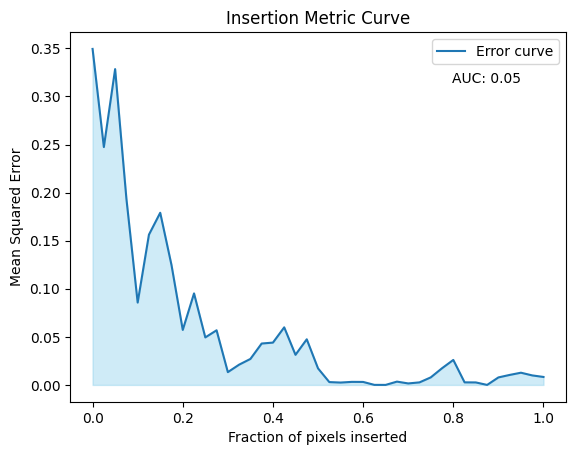

Errors: [0.3493949, 0.24736257, 0.3284088, 0.19372548, 0.085637316, 0.15625826, 0.17901763, 0.12471518, 0.05720141, 0.0951664, 0.04941477, 0.05681, 0.013314784, 0.02107574, 0.02702171, 0.043054312, 0.04400939, 0.059880927, 0.03131079, 0.047441885, 0.017193539, 0.0029506471, 0.0024655205, 0.003165401, 0.0031108558, 4.5965553e-05, 2.3346203e-05, 0.0034400483, 0.0015506776, 0.0026413295, 0.007844075, 0.017354447, 0.02598753, 0.0026739005, 0.0025879329, 7.596191e-08, 0.0077958354, 0.010394688, 0.012700857, 0.009897581, 0.00828568]
AUC: 0.05433729801361552
############################################################# 

Insertion 8 top pixel for Istance nr 61 
[(2, 3), (4, 3), (3, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (2, 2), (4, 2), (1, 2), (1, 4), (3, 2), (1, 7), (3, 5), (4, 5), (0, 2), (0, 7), (4, 6), (2, 5), (3, 6), (2, 7), (2, 6), (4, 0), (3, 0), (4, 7), (1, 6), (0, 4), (3, 7), (4, 1), (2, 1), (1, 5), (3, 1), (2, 0), (1, 1), (0, 6), (0, 1), (1, 0), (0, 0), (0, 5)] 

Original predi

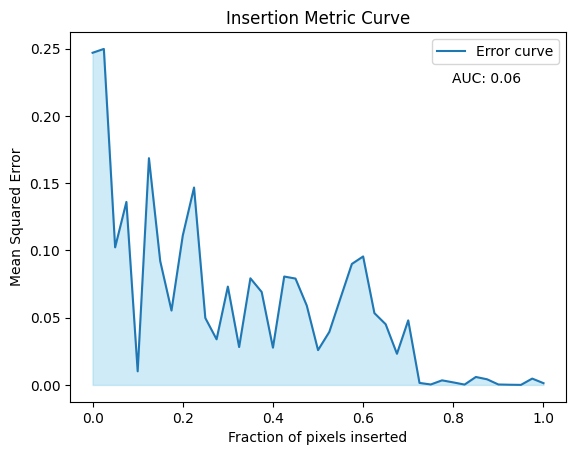

Errors: [0.24693374, 0.24979942, 0.10228265, 0.13605164, 0.010123431, 0.16857617, 0.09202967, 0.055292036, 0.11101603, 0.14675353, 0.04976518, 0.033912007, 0.073116444, 0.028144423, 0.07926526, 0.06909842, 0.027689183, 0.08058907, 0.07907105, 0.058986463, 0.025877992, 0.039408892, 0.06476044, 0.089942046, 0.09550348, 0.053396173, 0.045110453, 0.023160735, 0.047988407, 0.0014907675, 0.0003333232, 0.0034064439, 0.0018803166, 0.0002562796, 0.0059174616, 0.004177642, 0.00032466577, 0.00013907807, 3.0161757e-05, 0.004716916, 0.0013070968]
AUC: 0.05708760430607072
############################################################# 

Insertion 8 top pixel for Istance nr 62 
[(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (4, 7), (4, 2), (1, 2), (3, 2), (2, 2), (0, 2), (4, 6), (3, 7), (1, 4), (1, 7), (3, 5), (4, 5), (3, 6), (0, 7), (2, 7), (3, 0), (0, 4), (2, 5), (4, 0), (2, 6), (1, 6), (3, 1), (4, 1), (0, 6), (2, 1), (2, 0), (1, 1), (0, 1), (1, 5), (0, 5), (1, 0), (0, 0)] 

Origina

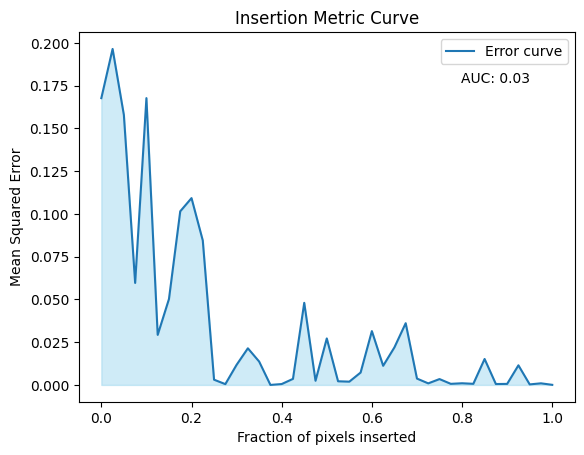

Errors: [0.16772707, 0.19651887, 0.15789835, 0.05964621, 0.16774991, 0.029264448, 0.050245814, 0.10154922, 0.10926761, 0.08447431, 0.0030612943, 0.00046789512, 0.01176113, 0.021424612, 0.01367246, 4.2335216e-08, 0.00051580754, 0.0035374535, 0.04801228, 0.002431673, 0.02718633, 0.0021343664, 0.0019126483, 0.007240518, 0.031472407, 0.011185047, 0.02196226, 0.036099523, 0.003714893, 0.00091183867, 0.0034218377, 0.0006332213, 0.00097249873, 0.00064396363, 0.015171969, 0.0005200397, 0.00060454576, 0.01146985, 0.00030210166, 0.0009374444, 5.250477e-05]
AUC: 0.03309716206495068
############################################################# 

Insertion 8 top pixel for Istance nr 63 
[(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (4, 4), (2, 2), (0, 3), (4, 2), (3, 2), (1, 2), (1, 4), (4, 7), (3, 7), (4, 6), (4, 5), (3, 6), (2, 7), (3, 5), (1, 7), (0, 2), (3, 0), (4, 0), (0, 7), (0, 4), (2, 6), (3, 1), (4, 1), (2, 5), (2, 1), (1, 6), (0, 6), (2, 0), (1, 1), (1, 5), (0, 5), (0, 1), (1, 0), (0, 

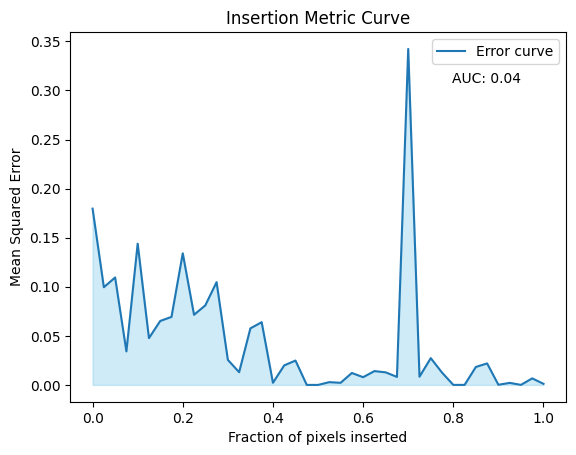

Errors: [0.17959602, 0.09952721, 0.109477736, 0.034168765, 0.1438983, 0.04767961, 0.06514196, 0.06930621, 0.13409919, 0.07145905, 0.08105818, 0.104715995, 0.025529467, 0.0129843345, 0.057617743, 0.06391838, 0.0021953774, 0.019896274, 0.024828719, 2.2856895e-05, 9.184164e-06, 0.002824992, 0.0021562865, 0.012164921, 0.007875252, 0.0140941115, 0.01280813, 0.00817498, 0.34230986, 0.008396031, 0.027281823, 0.0125632845, 4.258859e-05, 1.8057855e-05, 0.018311746, 0.021911906, 0.00015971535, 0.0020822799, 5.4329128e-05, 0.0066717877, 0.0011156674]
AUC: 0.04394481196591187
############################################################# 

Insertion 8 top pixel for Istance nr 64 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (4, 2), (2, 2), (4, 7), (1, 2), (3, 2), (4, 6), (4, 5), (1, 4), (3, 7), (0, 2), (3, 5), (0, 7), (1, 7), (3, 6), (3, 0), (4, 0), (2, 7), (4, 1), (0, 4), (3, 1), (0, 6), (2, 5), (2, 6), (1, 6), (2, 1), (2, 0), (1, 1), (0, 1), (1, 5), (0, 5), (1, 0), (0, 0)] 

O

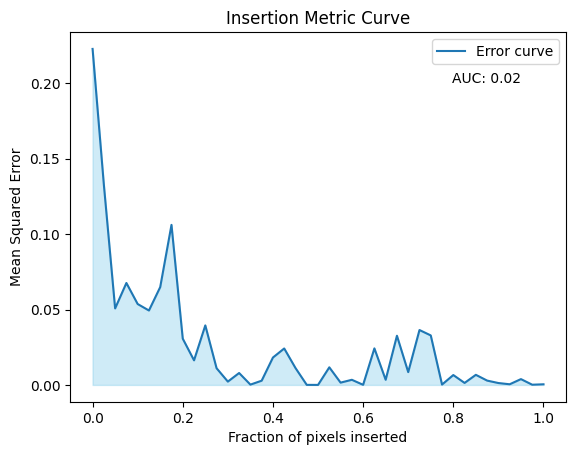

Errors: [0.2228185, 0.13285546, 0.050735176, 0.06760015, 0.05364885, 0.049350344, 0.06488481, 0.10613515, 0.030671356, 0.016310541, 0.03947035, 0.011072018, 0.0022029132, 0.007902315, 0.0001985399, 0.0028070516, 0.018170033, 0.024166329, 0.011209796, 3.337237e-05, 8.52937e-06, 0.011667176, 0.0015214398, 0.0034024932, 6.8052635e-05, 0.024229378, 0.003413851, 0.032607164, 0.008502078, 0.036403485, 0.032834616, 0.00023008122, 0.006554006, 0.0013205002, 0.0066950605, 0.0028712812, 0.0012517533, 0.0004297238, 0.0038584156, 0.00013783807, 0.00041614735]
AUC: 0.02447622018180482
############################################################# 

Insertion 8 top pixel for Istance nr 65 
[(4, 3), (3, 3), (2, 3), (3, 4), (4, 4), (1, 3), (2, 4), (4, 2), (4, 6), (4, 7), (4, 5), (1, 7), (3, 5), (0, 3), (3, 7), (2, 2), (2, 7), (1, 2), (3, 2), (0, 7), (0, 2), (3, 6), (3, 0), (4, 0), (1, 4), (4, 1), (3, 1), (2, 6), (2, 5), (2, 1), (2, 0), (1, 6), (0, 6), (0, 4), (1, 1), (0, 1), (1, 5), (0, 5), (1, 0), (0,

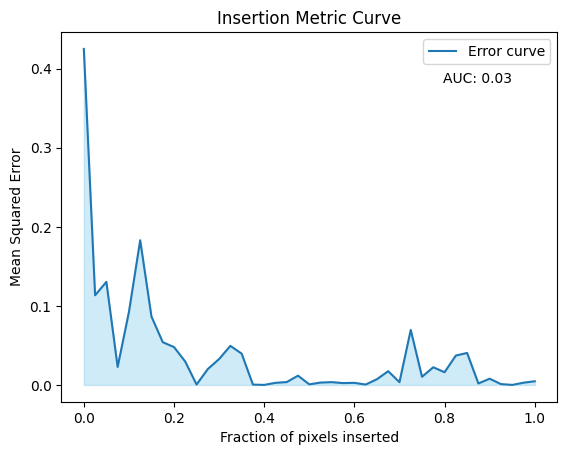

Errors: [0.4249915, 0.11341483, 0.13039279, 0.022778008, 0.09220482, 0.18299943, 0.08652204, 0.05407236, 0.047871854, 0.029454451, 0.0005081848, 0.020086905, 0.032782145, 0.04939336, 0.039600905, 0.0004120477, 1.7166421e-05, 0.0026420157, 0.0036181835, 0.011691113, 0.00072537124, 0.0029921962, 0.0035167804, 0.00232868, 0.002647656, 0.00046737952, 0.0072287563, 0.017384674, 0.0034800172, 0.06955065, 0.010326325, 0.022340203, 0.01605287, 0.037153058, 0.040441733, 0.0018592647, 0.0078644855, 0.0010610304, 1.423929e-06, 0.0027990108, 0.004626135]
AUC: 0.034637324541472475
############################################################# 

Insertion 8 top pixel for Istance nr 66 
[(2, 3), (1, 3), (3, 3), (4, 3), (1, 2), (3, 4), (0, 3), (2, 4), (4, 4), (2, 2), (4, 7), (1, 4), (0, 2), (4, 2), (4, 6), (3, 2), (3, 7), (3, 0), (1, 7), (2, 7), (4, 5), (0, 7), (4, 0), (3, 5), (0, 4), (3, 6), (2, 1), (1, 1), (3, 1), (4, 1), (2, 0), (1, 6), (2, 6), (2, 5), (0, 1), (0, 6), (1, 5), (1, 0), (0, 5), (0, 0)]

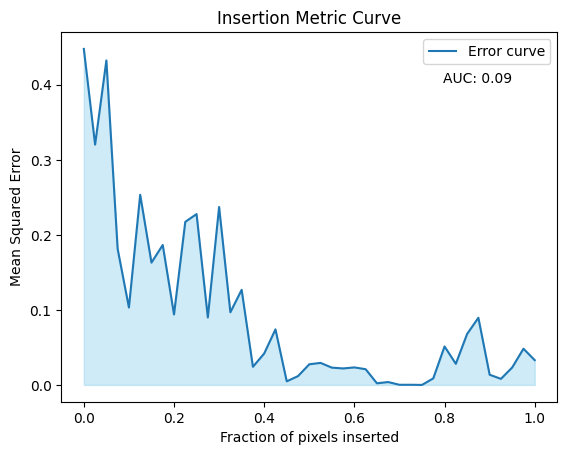

Errors: [0.44775462, 0.32029527, 0.43239596, 0.18124603, 0.10313698, 0.2533892, 0.16296752, 0.18646736, 0.0939138, 0.21733049, 0.22766504, 0.089894146, 0.23711582, 0.096831284, 0.12672697, 0.02415447, 0.041873787, 0.07404053, 0.004805373, 0.011743219, 0.02752166, 0.0293511, 0.023045784, 0.02197576, 0.023336537, 0.020948077, 0.0021765055, 0.0038319372, 0.00017275577, 0.00020170354, 3.0179924e-06, 0.008771547, 0.051252328, 0.028108556, 0.06787035, 0.08949963, 0.013588647, 0.008085378, 0.023262005, 0.048244353, 0.03297262]
AUC: 0.09044011290188791
############################################################# 

Insertion 8 top pixel for Istance nr 67 
[(4, 3), (3, 3), (2, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (4, 7), (4, 2), (4, 6), (3, 7), (4, 5), (1, 2), (3, 2), (1, 7), (1, 4), (2, 2), (3, 5), (0, 7), (0, 2), (3, 6), (2, 7), (3, 0), (4, 0), (0, 4), (2, 6), (1, 6), (4, 1), (3, 1), (2, 5), (0, 6), (2, 0), (2, 1), (1, 1), (0, 1), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original prediction: 

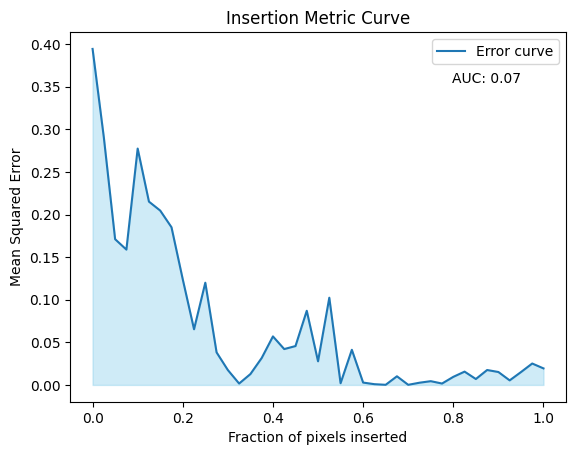

Errors: [0.39440387, 0.29037604, 0.1710529, 0.1588524, 0.27741924, 0.21515794, 0.20465165, 0.18508495, 0.123952426, 0.0653361, 0.11998678, 0.038203385, 0.01746937, 0.0016329811, 0.01273764, 0.03156578, 0.056947604, 0.04209161, 0.045605015, 0.08703335, 0.027718788, 0.1023612, 0.001982202, 0.04122602, 0.002767164, 0.00086947693, 0.00013774852, 0.010140374, 0.00012571142, 0.0025950088, 0.004402969, 0.0016293027, 0.00948401, 0.015611562, 0.0069306097, 0.017511023, 0.01516225, 0.0053401208, 0.015062686, 0.025128888, 0.019404354]
AUC: 0.06645620949129807
############################################################# 

Insertion 8 top pixel for Istance nr 68 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (4, 5), (4, 2), (4, 6), (1, 4), (4, 7), (1, 2), (0, 2), (2, 2), (3, 0), (1, 7), (3, 2), (3, 5), (3, 7), (4, 0), (2, 7), (3, 6), (0, 4), (0, 7), (4, 1), (3, 1), (1, 6), (2, 6), (2, 5), (0, 6), (2, 0), (2, 1), (1, 5), (0, 1), (1, 1), (0, 5), (1, 0), (0, 0)] 

Original predicti

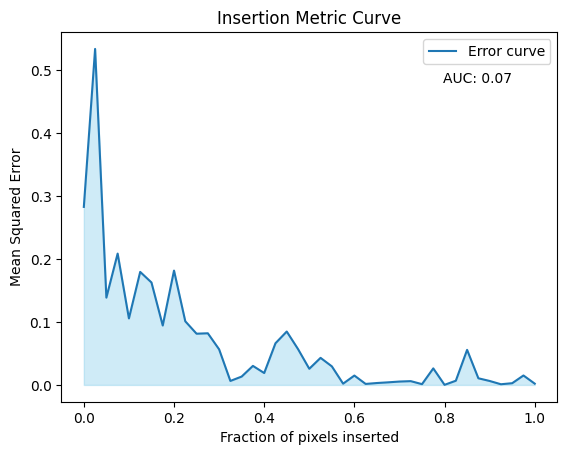

Errors: [0.28306606, 0.53425956, 0.13883722, 0.20884003, 0.10575354, 0.17970754, 0.16289833, 0.09446705, 0.18179308, 0.10118691, 0.081442975, 0.0821192, 0.0566342, 0.006345858, 0.013278, 0.030265473, 0.018916033, 0.06622937, 0.08490087, 0.05704209, 0.02567233, 0.04303972, 0.029560935, 0.0020117678, 0.014898484, 0.0015727814, 0.0030243518, 0.00412532, 0.0053637894, 0.0060170433, 0.0012306117, 0.02628061, 0.00013126481, 0.006668984, 0.05574336, 0.010559168, 0.006285246, 0.0010622889, 0.0027423871, 0.015004016, 0.0020339538]
AUC: 0.06521154421207029
############################################################# 

Insertion 8 top pixel for Istance nr 69 
[(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (4, 7), (0, 3), (4, 2), (4, 6), (0, 7), (2, 2), (4, 5), (3, 2), (1, 4), (1, 7), (3, 0), (1, 2), (4, 0), (3, 7), (3, 5), (4, 1), (2, 7), (0, 2), (3, 6), (0, 6), (3, 1), (0, 4), (1, 6), (2, 5), (2, 0), (2, 1), (2, 6), (0, 5), (1, 5), (1, 1), (0, 1), (1, 0), (0, 0)] 

Original prediction

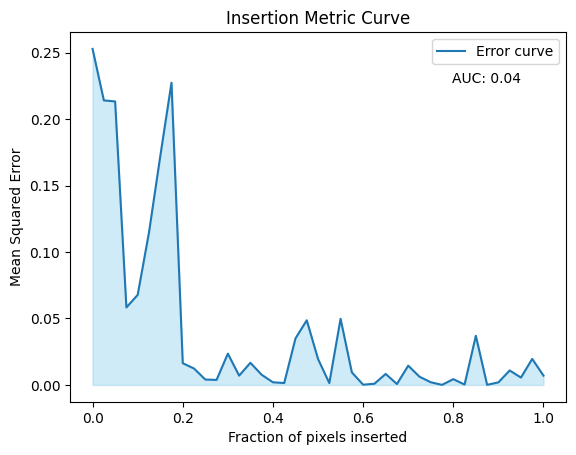

Errors: [0.25277653, 0.21405114, 0.21328014, 0.058308385, 0.067720555, 0.11451836, 0.17180087, 0.22737055, 0.01632906, 0.012339281, 0.004053722, 0.003785148, 0.02354237, 0.007018877, 0.016645754, 0.007638732, 0.0019883954, 0.0014195421, 0.035005983, 0.04863355, 0.019499855, 0.0014034904, 0.049727798, 0.009437074, 0.00018280659, 0.00088802923, 0.008283423, 0.0006764538, 0.014491068, 0.006185222, 0.002003606, 4.8095884e-05, 0.0043503665, 0.00027279695, 0.03695759, 5.8672427e-05, 0.0019321336, 0.010884389, 0.0055416687, 0.019576972, 0.006982292]
AUC: 0.039193283452186735
############################################################# 

Insertion 8 top pixel for Istance nr 70 
[(2, 3), (3, 3), (1, 3), (4, 3), (2, 4), (3, 4), (4, 4), (0, 3), (3, 5), (2, 2), (1, 4), (4, 0), (4, 5), (1, 2), (4, 6), (4, 2), (3, 2), (0, 2), (4, 7), (3, 6), (1, 7), (3, 0), (3, 7), (2, 7), (2, 5), (0, 7), (4, 1), (2, 6), (0, 4), (2, 0), (2, 1), (3, 1), (1, 6), (1, 1), (0, 1), (0, 6), (1, 5), (1, 0), (0, 0), (0, 5)]

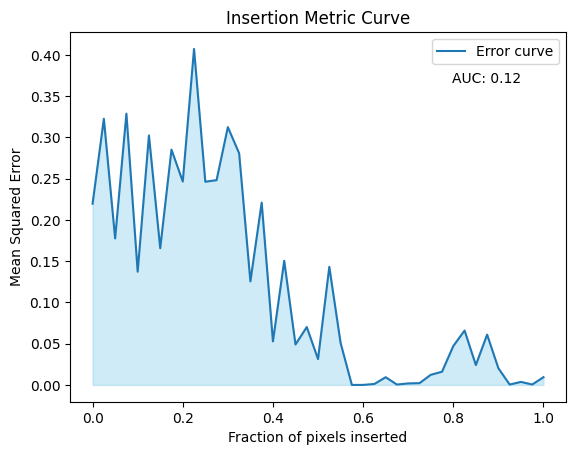

Errors: [0.21957304, 0.32250142, 0.17753232, 0.32878533, 0.13722138, 0.3023453, 0.16569291, 0.28512815, 0.24650729, 0.40718123, 0.24625356, 0.24816987, 0.31240505, 0.2807516, 0.12551245, 0.2209453, 0.052780587, 0.15039751, 0.04898947, 0.07013543, 0.03127089, 0.14309543, 0.050955944, 3.8277467e-06, 1.7725064e-05, 0.0011510308, 0.0093407165, 0.00043783255, 0.0018214523, 0.0021379807, 0.012272579, 0.016003942, 0.04715204, 0.06590372, 0.024094405, 0.060952056, 0.020188406, 0.00045643465, 0.0036536497, 0.0004737409, 0.009389423]
AUC: 0.1183775286091759
############################################################# 

Insertion 8 top pixel for Istance nr 71 
[(2, 3), (3, 3), (3, 4), (1, 3), (2, 4), (4, 3), (4, 4), (0, 3), (4, 5), (4, 7), (2, 2), (4, 6), (1, 4), (1, 2), (3, 5), (3, 7), (3, 2), (4, 2), (0, 2), (2, 7), (1, 7), (3, 6), (2, 5), (4, 0), (0, 7), (3, 0), (0, 4), (2, 6), (1, 6), (4, 1), (0, 6), (2, 0), (3, 1), (1, 5), (2, 1), (1, 1), (0, 1), (0, 5), (1, 0), (0, 0)] 

Original predictio

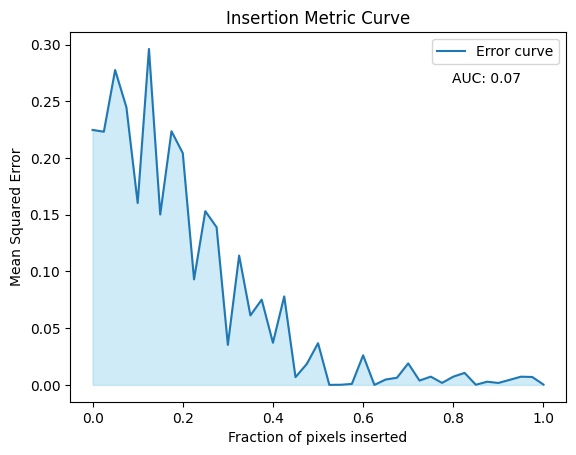

Errors: [0.22480465, 0.22322997, 0.27760965, 0.24476118, 0.16034043, 0.29620722, 0.15022942, 0.22362125, 0.20439525, 0.09306751, 0.15317602, 0.13905063, 0.03530491, 0.11401493, 0.06127481, 0.07519307, 0.037186015, 0.07805556, 0.006846629, 0.018480385, 0.03678038, 4.491928e-05, 0.0001382078, 0.0008731506, 0.02611055, 1.929724e-05, 0.004779114, 0.006328169, 0.019002372, 0.0038312287, 0.0073091905, 0.001789541, 0.007292506, 0.010610262, 0.00015538218, 0.00283811, 0.0017435664, 0.0044818665, 0.007262892, 0.0070059993, 0.00032201203]
AUC: 0.0713251217177458
############################################################# 

Insertion 8 top pixel for Istance nr 72 
[(2, 3), (3, 3), (3, 4), (4, 3), (1, 3), (2, 4), (4, 4), (0, 3), (1, 4), (2, 2), (4, 2), (4, 5), (3, 2), (4, 7), (1, 2), (4, 0), (1, 7), (4, 6), (0, 2), (3, 0), (3, 5), (2, 7), (3, 7), (4, 1), (0, 7), (0, 4), (3, 1), (0, 6), (2, 5), (3, 6), (1, 6), (0, 5), (1, 5), (2, 0), (2, 1), (2, 6), (0, 1), (1, 1), (0, 0), (1, 0)] 

Original pred

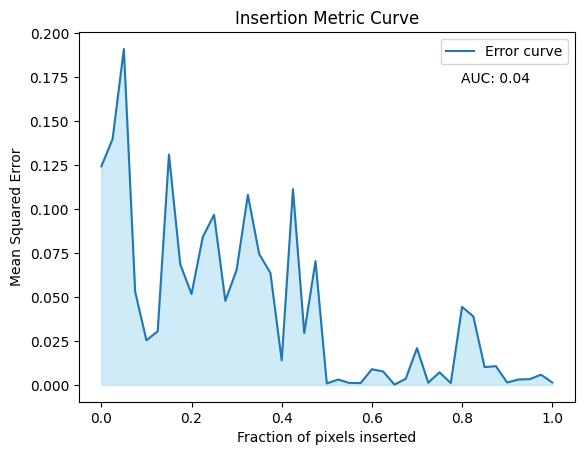

Errors: [0.124255635, 0.13987307, 0.19106959, 0.053041775, 0.02535662, 0.030520223, 0.1310159, 0.06864117, 0.051709164, 0.08412, 0.096759, 0.047808025, 0.06539465, 0.108064696, 0.07447704, 0.063633285, 0.013938626, 0.111341015, 0.029556999, 0.07039796, 0.000835887, 0.003065055, 0.0011392193, 0.0010421503, 0.008922604, 0.007657623, 0.0002117849, 0.003458784, 0.020902999, 0.0012605244, 0.0071784104, 0.0010414654, 0.044381395, 0.038958184, 0.010131061, 0.0106777325, 0.0013663857, 0.0030923728, 0.003283437, 0.0058070407, 0.00143359]
AUC: 0.04234943834599107
############################################################# 

Insertion 8 top pixel for Istance nr 73 
[(3, 3), (2, 3), (3, 4), (4, 3), (2, 4), (4, 4), (1, 3), (2, 2), (3, 5), (4, 5), (1, 2), (1, 4), (0, 3), (3, 2), (4, 7), (4, 6), (2, 5), (3, 7), (3, 6), (4, 2), (2, 7), (0, 2), (1, 7), (2, 6), (2, 1), (0, 4), (3, 0), (0, 7), (2, 0), (1, 1), (1, 6), (1, 5), (3, 1), (0, 6), (4, 0), (0, 1), (1, 0), (4, 1), (0, 5), (0, 0)] 

Original pre

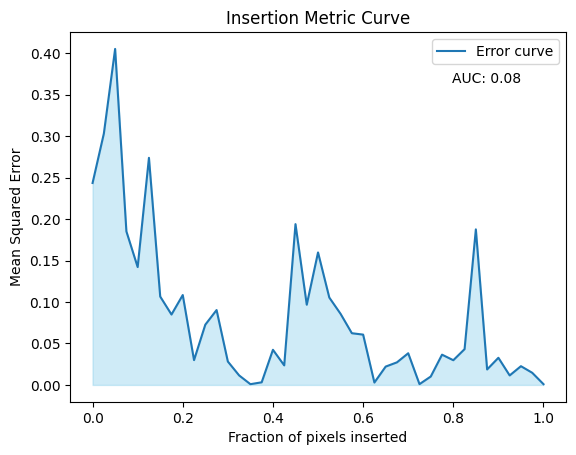

Errors: [0.24358769, 0.30320767, 0.40531513, 0.18518822, 0.1421601, 0.27395436, 0.10659367, 0.08491588, 0.1084385, 0.0299299, 0.07267513, 0.090322144, 0.028215803, 0.011468401, 0.0008965255, 0.0031553889, 0.042380005, 0.023578014, 0.19396459, 0.09673269, 0.15980184, 0.10538833, 0.0857393, 0.06236803, 0.060687996, 0.0028666295, 0.022117974, 0.027227249, 0.038195767, 0.00095360226, 0.010141329, 0.03650035, 0.029804507, 0.04317098, 0.18764389, 0.018667195, 0.032746047, 0.011445255, 0.022606082, 0.01466008, 0.0009147856]
AUC: 0.08245189432054759
############################################################# 

Insertion 8 top pixel for Istance nr 74 
[(2, 3), (3, 3), (3, 4), (1, 3), (2, 4), (4, 3), (4, 4), (2, 2), (3, 2), (1, 4), (1, 2), (0, 3), (4, 2), (0, 2), (3, 5), (4, 5), (4, 7), (4, 6), (0, 4), (2, 5), (3, 7), (2, 1), (1, 1), (3, 6), (3, 1), (1, 7), (2, 7), (3, 0), (2, 0), (0, 7), (0, 1), (1, 5), (0, 6), (4, 1), (2, 6), (1, 6), (1, 0), (0, 5), (4, 0), (0, 0)] 

Original prediction: [-0

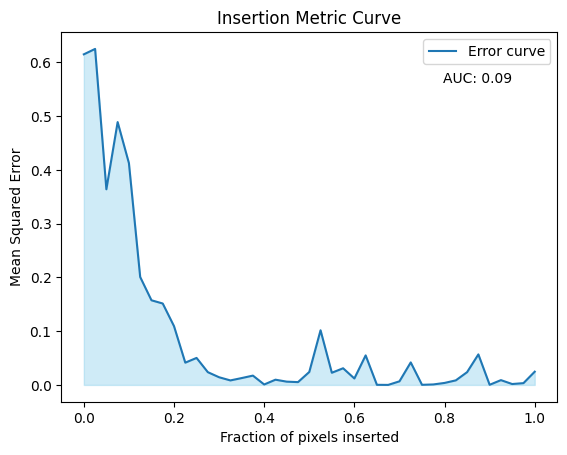

Errors: [0.614986, 0.6250413, 0.36394396, 0.48895454, 0.4125827, 0.20074594, 0.15745004, 0.15145403, 0.10933031, 0.041421678, 0.050228115, 0.023732292, 0.014270117, 0.008378123, 0.012741694, 0.017337412, 0.0008242431, 0.009726652, 0.0060847695, 0.0052263034, 0.024088956, 0.101644024, 0.022649188, 0.030989042, 0.011966462, 0.054930076, 0.00018666478, 3.7077032e-05, 0.0066997237, 0.041878566, 0.00020147463, 0.00088237744, 0.0036982785, 0.008488427, 0.02377108, 0.056792874, 0.00024332965, 0.008924746, 0.0016617222, 0.003324483, 0.024630312]
AUC: 0.08555852330391645
############################################################# 

Insertion 8 top pixel for Istance nr 75 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (2, 2), (4, 4), (1, 2), (0, 3), (1, 4), (3, 2), (0, 2), (4, 7), (3, 5), (4, 2), (4, 5), (4, 6), (1, 1), (0, 4), (2, 1), (3, 7), (3, 6), (2, 5), (1, 7), (3, 0), (2, 0), (3, 1), (2, 7), (1, 0), (0, 1), (0, 7), (4, 0), (4, 1), (2, 6), (1, 5), (1, 6), (0, 0), (0, 6), (0, 5)] 

Ori

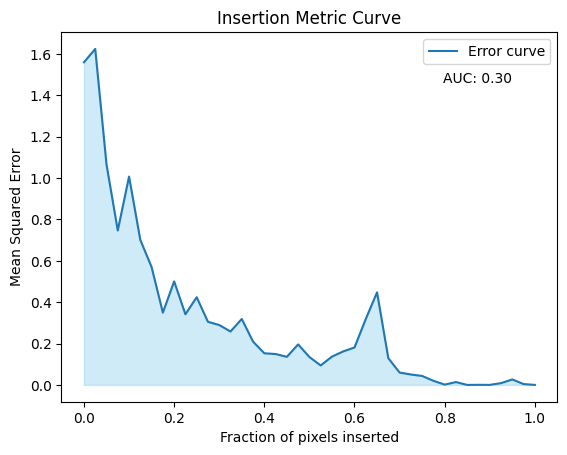

Errors: [1.5598562, 1.6243733, 1.0660393, 0.74659675, 1.00715, 0.70090693, 0.56979656, 0.34944007, 0.50052065, 0.34146756, 0.42399585, 0.30508742, 0.28957754, 0.25833958, 0.31886476, 0.20943747, 0.15294266, 0.14948216, 0.13574344, 0.19591567, 0.13483763, 0.094187275, 0.13684419, 0.16206132, 0.18096252, 0.31859353, 0.44759437, 0.1292501, 0.05985784, 0.050456706, 0.04337839, 0.01996072, 0.0014978526, 0.013882689, 6.4476253e-06, 0.00048206188, 0.00014130252, 0.008731083, 0.026564866, 0.004102928, 7.356832e-05]
AUC: 0.2989759090298321
############################################################# 

Insertion 8 top pixel for Istance nr 76 
[(2, 3), (3, 3), (3, 4), (1, 3), (2, 4), (4, 3), (4, 4), (2, 2), (1, 2), (0, 3), (1, 4), (3, 2), (0, 2), (4, 2), (3, 5), (4, 5), (4, 6), (4, 7), (1, 1), (2, 5), (2, 1), (0, 4), (3, 6), (0, 1), (3, 7), (3, 1), (2, 0), (1, 7), (3, 0), (0, 7), (4, 1), (2, 7), (1, 0), (2, 6), (4, 0), (1, 5), (0, 0), (1, 6), (0, 6), (0, 5)] 

Original prediction: [-0.45039645]


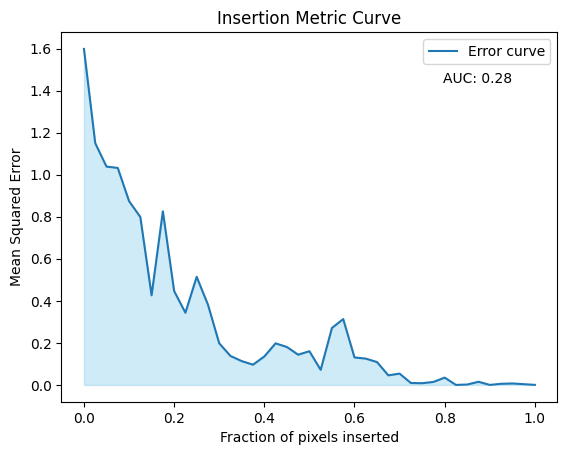

Errors: [1.598034, 1.1501212, 1.0384301, 1.0319797, 0.8743556, 0.7988957, 0.4261418, 0.8256071, 0.44660407, 0.3432518, 0.5141598, 0.38171536, 0.19792551, 0.13764627, 0.1131817, 0.096283585, 0.1352922, 0.19769819, 0.18044315, 0.14378108, 0.16026933, 0.07172152, 0.27098423, 0.31314507, 0.13061216, 0.12518312, 0.108601846, 0.045612324, 0.05371563, 0.009163624, 0.008226042, 0.014237826, 0.034730706, 2.1506772e-05, 0.0018281691, 0.014996548, 1.8181163e-05, 0.0053004404, 0.0069332845, 0.0036229715, 0.00022065412]
AUC: 0.28028914878814254
############################################################# 

Insertion 8 top pixel for Istance nr 77 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (2, 2), (4, 3), (1, 2), (4, 4), (1, 4), (3, 2), (0, 3), (0, 2), (4, 5), (3, 5), (4, 2), (4, 7), (0, 4), (2, 1), (1, 1), (4, 6), (2, 5), (3, 1), (3, 0), (0, 1), (2, 0), (3, 7), (1, 7), (1, 5), (4, 1), (3, 6), (2, 7), (4, 0), (0, 7), (1, 0), (1, 6), (0, 5), (0, 0), (2, 6), (0, 6)] 

Original prediction: [-0.39118665]

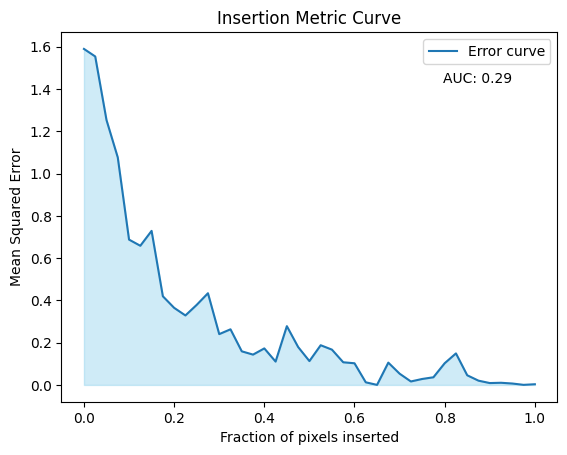

Errors: [1.5894912, 1.5538366, 1.2531247, 1.0761958, 0.6874345, 0.658312, 0.7287606, 0.41934553, 0.3646593, 0.32866427, 0.37864625, 0.43377513, 0.24034616, 0.26309153, 0.15890668, 0.14343353, 0.17276712, 0.11041919, 0.27797502, 0.17936729, 0.112759076, 0.1877779, 0.16691042, 0.10715125, 0.10243065, 0.0123401545, 0.00013699962, 0.105434366, 0.053273264, 0.016373394, 0.028114187, 0.036164977, 0.10259567, 0.14915268, 0.04561059, 0.020135248, 0.008802445, 0.010172529, 0.0066400436, 0.000346402, 0.0032296646]
AUC: 0.28744359662814534
############################################################# 

Insertion 8 top pixel for Istance nr 78 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (2, 2), (1, 2), (0, 3), (4, 4), (1, 4), (3, 2), (0, 2), (4, 2), (3, 5), (4, 5), (0, 4), (4, 6), (4, 7), (2, 1), (2, 5), (3, 1), (3, 0), (1, 1), (3, 6), (2, 7), (3, 7), (1, 7), (2, 0), (0, 7), (1, 5), (0, 1), (2, 6), (4, 0), (1, 6), (4, 1), (0, 6), (1, 0), (0, 5), (0, 0)] 

Original prediction: [-0.19058223]
In

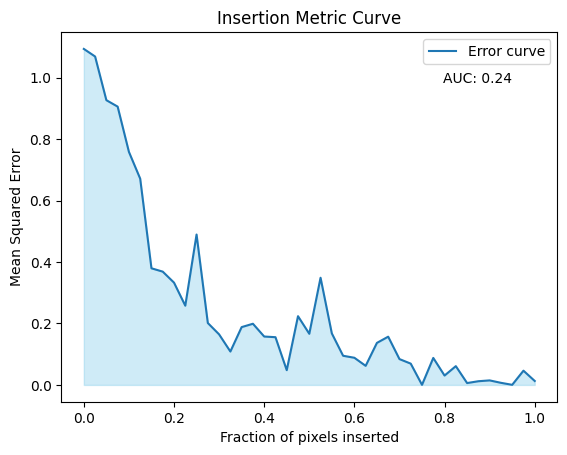

Errors: [1.0932735, 1.0686227, 0.92647284, 0.90557843, 0.75830764, 0.6710725, 0.3794657, 0.36861864, 0.33283967, 0.25781125, 0.48932013, 0.20143847, 0.16447882, 0.10866161, 0.18812032, 0.19904695, 0.15746711, 0.1553017, 0.048024368, 0.2236416, 0.16637042, 0.34874213, 0.16764627, 0.094874516, 0.08838386, 0.06207938, 0.1367365, 0.1569691, 0.084057845, 0.06928487, 0.00023244428, 0.08784479, 0.03049923, 0.061099477, 0.006063386, 0.012018837, 0.014725421, 0.0068585263, 0.00031520147, 0.04632666, 0.0128369]
AUC: 0.24496186219039376
############################################################# 

Insertion 8 top pixel for Istance nr 79 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (2, 2), (0, 3), (1, 2), (1, 4), (4, 4), (3, 2), (0, 2), (4, 2), (4, 5), (3, 5), (0, 4), (2, 5), (4, 6), (4, 7), (1, 1), (2, 1), (0, 7), (1, 7), (0, 1), (1, 5), (3, 7), (2, 7), (3, 1), (0, 6), (3, 6), (1, 6), (3, 0), (2, 0), (0, 5), (2, 6), (4, 1), (4, 0), (1, 0), (0, 0)] 

Original prediction: [0.12661867]
Initia

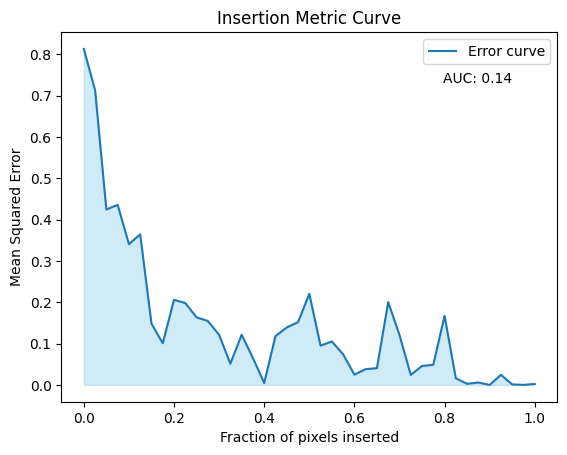

Errors: [0.8134223, 0.7132164, 0.4246638, 0.43598312, 0.34083068, 0.36459473, 0.14869359, 0.100886844, 0.20622571, 0.19813684, 0.16367485, 0.15479785, 0.12123379, 0.051504586, 0.121449515, 0.06508724, 0.004667707, 0.118187666, 0.13901873, 0.15193322, 0.22054097, 0.09509066, 0.10523633, 0.07417943, 0.024917275, 0.038257957, 0.04058029, 0.20042469, 0.120982185, 0.024274196, 0.045773517, 0.04887677, 0.16724081, 0.016044168, 0.0026113258, 0.005874623, 3.3800468e-06, 0.024555385, 0.0011726384, 0.00014262203, 0.002235451]
AUC: 0.14223487501294588
############################################################# 

Insertion 8 top pixel for Istance nr 80 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (2, 2), (1, 2), (4, 4), (0, 3), (1, 4), (3, 2), (0, 2), (3, 5), (4, 2), (4, 5), (0, 4), (4, 6), (4, 7), (0, 7), (1, 1), (1, 7), (2, 5), (0, 1), (2, 1), (2, 7), (3, 7), (3, 6), (0, 6), (1, 5), (1, 6), (2, 6), (0, 5), (3, 1), (2, 0), (1, 0), (3, 0), (0, 0), (4, 1), (4, 0)] 

Original prediction: [0.3

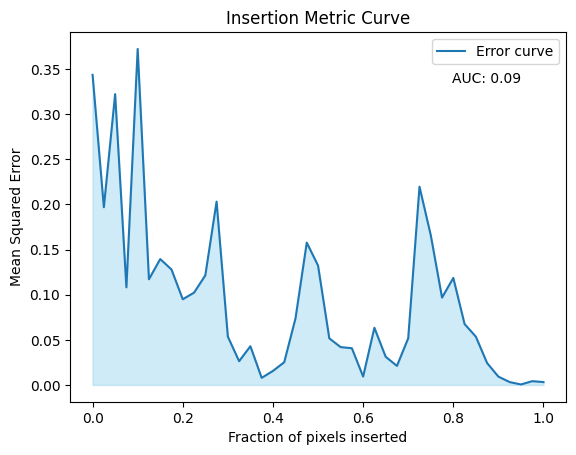

Errors: [0.34361953, 0.19692762, 0.32227865, 0.10812039, 0.3723732, 0.11709173, 0.13950011, 0.1279119, 0.09494118, 0.10224834, 0.12139809, 0.20315707, 0.05349183, 0.026302006, 0.04291035, 0.00784832, 0.015542676, 0.025145974, 0.0737193, 0.1577139, 0.13232107, 0.05164456, 0.04192737, 0.040675137, 0.009291809, 0.06334457, 0.031212484, 0.021087406, 0.051719926, 0.21967107, 0.16594286, 0.09678592, 0.11859029, 0.06748688, 0.05349602, 0.02420836, 0.009202166, 0.0031502147, 0.00050706475, 0.0041794605, 0.003152684]
AUC: 0.09221133454702794
############################################################# 

Insertion 8 top pixel for Istance nr 81 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (2, 2), (1, 4), (1, 2), (4, 3), (0, 3), (4, 4), (3, 2), (0, 2), (0, 4), (4, 2), (3, 5), (4, 5), (3, 1), (4, 1), (2, 5), (2, 1), (4, 6), (0, 1), (3, 0), (1, 1), (1, 5), (0, 5), (4, 0), (4, 7), (0, 7), (0, 6), (1, 7), (2, 0), (3, 6), (1, 6), (0, 0), (1, 0), (3, 7), (2, 6), (2, 7)] 

Original prediction: [0.9141137]


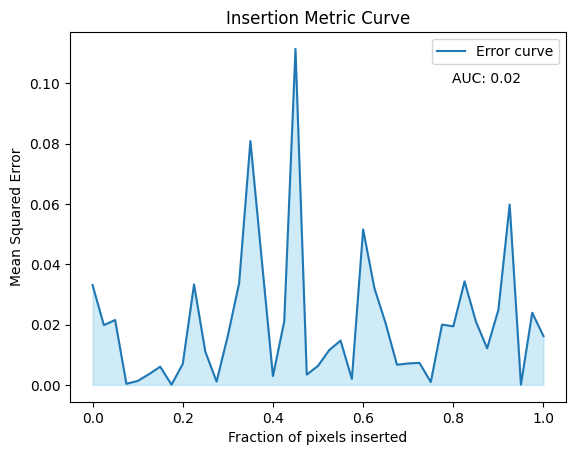

Errors: [0.033107508, 0.019820897, 0.021518957, 0.00037679492, 0.0013098522, 0.0035609964, 0.0060452614, 8.173126e-05, 0.0069475807, 0.0332984, 0.011048511, 0.0011213926, 0.01633785, 0.033706337, 0.08083406, 0.041755363, 0.0029323047, 0.021033015, 0.11136015, 0.0034084062, 0.006338899, 0.011572483, 0.014699446, 0.0019780644, 0.051541366, 0.032074198, 0.020396208, 0.006698592, 0.0071076727, 0.0073061027, 0.000944982, 0.019990955, 0.019413987, 0.034320537, 0.021023525, 0.012136839, 0.024892176, 0.059789803, 8.125453e-05, 0.023918735, 0.016175278]
AUC: 0.020434126998588903
############################################################# 

Insertion 8 top pixel for Istance nr 82 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (0, 2), (0, 4), (3, 2), (3, 5), (4, 5), (2, 5), (4, 2), (1, 7), (4, 6), (0, 7), (4, 7), (1, 5), (1, 6), (0, 6), (1, 1), (0, 5), (2, 7), (0, 1), (2, 6), (3, 6), (2, 1), (3, 7), (3, 0), (2, 0), (3, 1), (4, 0), (1, 0), (4, 1), (0, 0

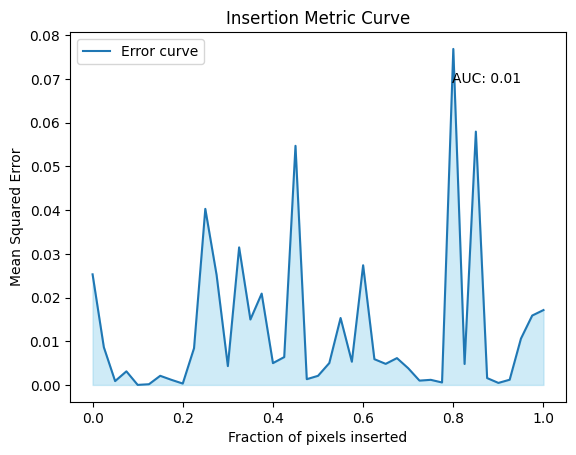

Errors: [0.025310514, 0.008620674, 0.00087652844, 0.0031087818, 7.9236e-06, 0.00015740069, 0.0020882243, 0.0011596858, 0.00031282866, 0.008404466, 0.040293764, 0.025184665, 0.0043056644, 0.03147761, 0.01497331, 0.020900948, 0.0049884054, 0.0063726087, 0.054724857, 0.0013137251, 0.0020826499, 0.0050072493, 0.015318127, 0.0053058704, 0.027387384, 0.005892307, 0.004819382, 0.006135334, 0.0038159702, 0.0009869687, 0.0011661495, 0.00055902044, 0.07689807, 0.0047913683, 0.057977304, 0.0015669246, 0.00045924558, 0.0011906697, 0.010598722, 0.01588106, 0.017133849]
AUC: 0.012458350728957155
############################################################# 

Insertion 8 top pixel for Istance nr 83 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (2, 2), (4, 3), (1, 2), (1, 4), (0, 3), (4, 4), (3, 2), (0, 2), (0, 7), (0, 4), (3, 5), (2, 5), (4, 2), (1, 7), (4, 5), (0, 6), (1, 5), (2, 7), (3, 7), (1, 1), (4, 7), (1, 6), (2, 6), (3, 6), (2, 1), (4, 6), (0, 5), (0, 1), (2, 0), (1, 0), (3, 0), (3, 1), (0, 0), (

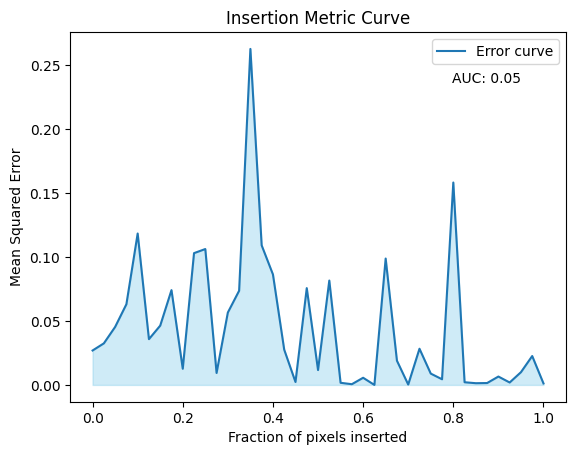

Errors: [0.02691936, 0.032495882, 0.04533846, 0.06307825, 0.118363835, 0.03578529, 0.046352997, 0.074113995, 0.012647202, 0.10303211, 0.10624062, 0.009353209, 0.056607082, 0.073632844, 0.26267767, 0.10911264, 0.08639516, 0.027556993, 0.002282704, 0.07567365, 0.011632127, 0.08159688, 0.0016615558, 0.00056229474, 0.0056007504, 4.134524e-06, 0.098802514, 0.018934073, 0.00029671798, 0.028288718, 0.008860015, 0.004428873, 0.15823343, 0.0020938718, 0.0013473983, 0.0014745275, 0.0065504164, 0.001898816, 0.009951474, 0.022584688, 0.0011480964]
AUC: 0.04548944023845252
############################################################# 

Insertion 8 top pixel for Istance nr 84 
[(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (1, 4), (0, 3), (2, 2), (1, 2), (4, 3), (4, 4), (0, 4), (3, 5), (0, 2), (2, 5), (3, 2), (4, 5), (1, 7), (1, 5), (0, 7), (1, 6), (2, 6), (2, 7), (3, 6), (4, 6), (4, 2), (0, 5), (0, 6), (1, 1), (3, 7), (4, 7), (0, 1), (2, 1), (3, 0), (4, 0), (3, 1), (2, 0), (1, 0), (0, 0), (4, 1)] 

Origi

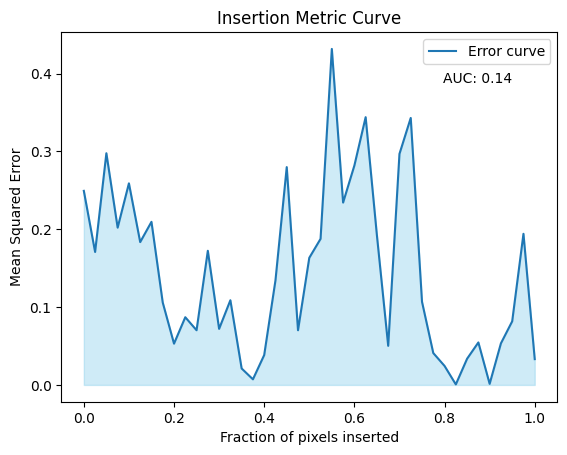

Errors: [0.24927014, 0.17079741, 0.29758993, 0.20199332, 0.25893778, 0.18348104, 0.20949455, 0.10584544, 0.05301605, 0.08696035, 0.070236616, 0.17229444, 0.07201966, 0.10877017, 0.021127136, 0.0072100987, 0.03836087, 0.1342694, 0.27978253, 0.07022594, 0.16327691, 0.18763632, 0.43158323, 0.23420762, 0.2817818, 0.34389743, 0.1920347, 0.050220594, 0.29677358, 0.34292835, 0.10678826, 0.040926285, 0.024387956, 0.0006556935, 0.033666626, 0.054572757, 0.0013826232, 0.0534013, 0.08170071, 0.19410948, 0.033126142]
AUC: 0.14498857846483587
############################################################# 

Insertion 8 top pixel for Istance nr 85 
[(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (0, 3), (1, 4), (4, 3), (2, 2), (1, 2), (4, 4), (0, 2), (3, 2), (0, 4), (3, 5), (2, 5), (4, 5), (1, 7), (4, 7), (4, 2), (0, 7), (4, 6), (1, 5), (1, 1), (2, 7), (3, 7), (1, 6), (0, 6), (2, 1), (0, 5), (3, 6), (0, 1), (2, 6), (3, 0), (4, 0), (3, 1), (2, 0), (4, 1), (1, 0), (0, 0)] 

Original prediction: [1.6060331]
Ini

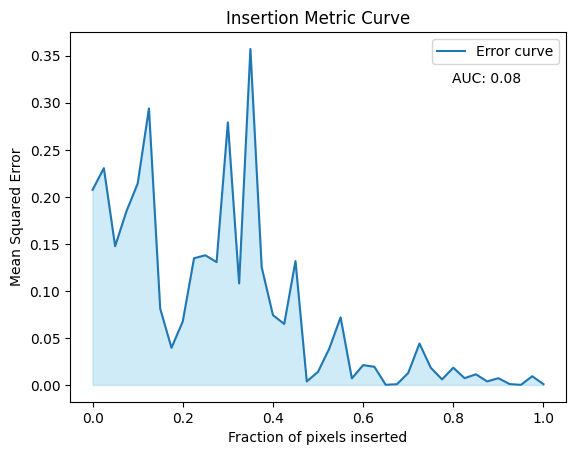

Errors: [0.20743671, 0.23051172, 0.14750339, 0.18451898, 0.21412605, 0.29403692, 0.08105669, 0.039445676, 0.067529224, 0.13469608, 0.13785845, 0.1306042, 0.27913922, 0.10791838, 0.3572634, 0.1252489, 0.07422171, 0.06483308, 0.13171814, 0.0037001725, 0.013954999, 0.03874652, 0.07184829, 0.0069669997, 0.021065531, 0.019291865, 0.00018217853, 0.0007384585, 0.012742189, 0.044044558, 0.018286107, 0.005899703, 0.018330755, 0.0071798447, 0.011317894, 0.0037332836, 0.0071455217, 0.00087838585, 8.69428e-05, 0.009261412, 0.0007968561]
AUC: 0.08054371510152122
############################################################# 

Insertion 8 top pixel for Istance nr 86 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (0, 3), (4, 4), (1, 4), (1, 2), (2, 2), (0, 2), (4, 5), (3, 2), (0, 4), (3, 5), (0, 7), (2, 5), (4, 2), (4, 6), (1, 7), (4, 7), (0, 6), (1, 5), (1, 1), (1, 6), (0, 1), (2, 7), (3, 6), (3, 7), (2, 1), (0, 5), (2, 6), (3, 0), (2, 0), (3, 1), (4, 0), (1, 0), (0, 0), (4, 1)] 

Original predict

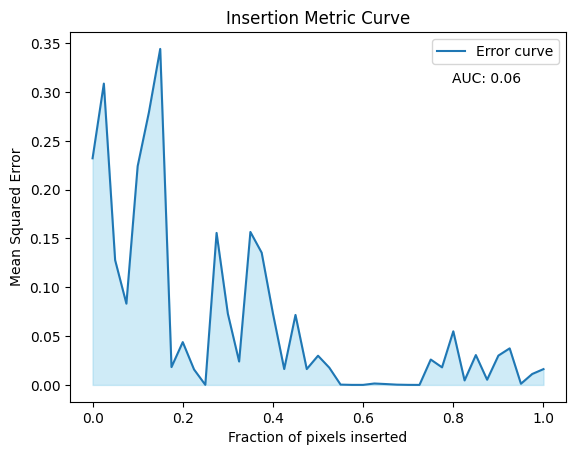

Errors: [0.2321521, 0.30868676, 0.1278607, 0.08325176, 0.22412133, 0.27941906, 0.344199, 0.018269893, 0.04385902, 0.015860094, 8.790359e-05, 0.15572047, 0.0729665, 0.02399226, 0.15670002, 0.13547817, 0.07320279, 0.016269308, 0.07171351, 0.016241191, 0.029913692, 0.017668081, 0.00031677115, 3.9955958e-05, 4.145113e-05, 0.0014573205, 0.0008998767, 0.000273664, 6.0811843e-05, 1.4491043e-05, 0.026005482, 0.018010145, 0.05492583, 0.004600128, 0.030601665, 0.005320729, 0.03005505, 0.03746903, 0.0012091278, 0.011202679, 0.016202778]
AUC: 0.06405407893826123
############################################################# 

Insertion 8 top pixel for Istance nr 87 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (0, 3), (1, 4), (2, 2), (4, 4), (1, 2), (3, 2), (0, 4), (4, 2), (0, 2), (3, 5), (2, 5), (4, 5), (1, 5), (3, 1), (0, 5), (4, 1), (2, 1), (0, 6), (0, 1), (0, 7), (1, 1), (0, 0), (1, 7), (1, 0), (1, 6), (3, 0), (2, 0), (4, 0), (3, 6), (2, 7), (2, 6), (4, 6), (3, 7), (4, 7)] 

Original predic

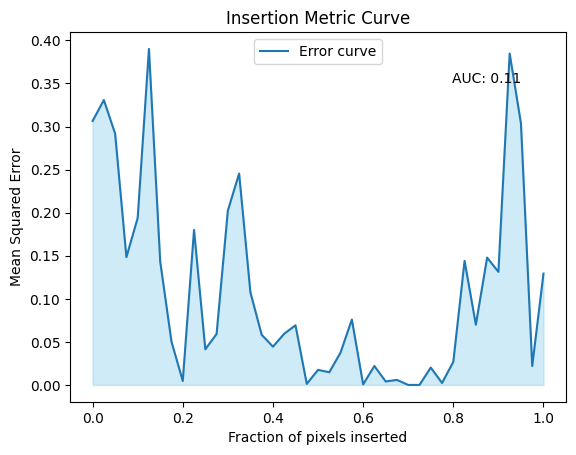

Errors: [0.30640098, 0.33080262, 0.291785, 0.14835766, 0.19383101, 0.390127, 0.14310427, 0.050259553, 0.0045834878, 0.17994387, 0.04140848, 0.059171904, 0.20243064, 0.24542548, 0.10754417, 0.05826717, 0.044434, 0.059444506, 0.06925306, 0.0012202541, 0.017488757, 0.014705445, 0.03768074, 0.07596558, 0.0006466952, 0.021956326, 0.0040332703, 0.005834526, 1.9286767e-07, 3.7724399e-06, 0.020159317, 0.0022503098, 0.026809746, 0.14402308, 0.06989728, 0.14786264, 0.13126901, 0.38475916, 0.30362755, 0.02193471, 0.12930313]
AUC: 0.10675385695901696
############################################################# 

Insertion 8 top pixel for Istance nr 88 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (1, 2), (2, 2), (0, 2), (4, 5), (3, 5), (3, 2), (4, 6), (1, 7), (0, 7), (0, 4), (4, 7), (2, 5), (2, 7), (4, 2), (3, 7), (3, 6), (0, 6), (1, 6), (1, 5), (0, 1), (1, 1), (2, 6), (2, 1), (0, 5), (3, 1), (3, 0), (2, 0), (0, 0), (1, 0), (4, 1), (4, 0)] 

Original prediction: [1.368

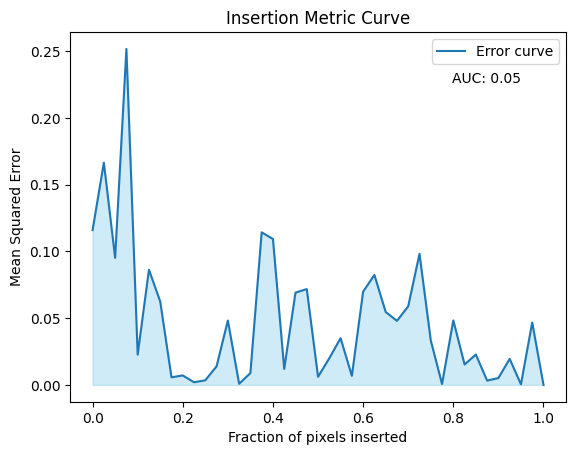

Errors: [0.116001874, 0.16658872, 0.09520215, 0.2517776, 0.022718854, 0.086309895, 0.062508464, 0.0057148053, 0.0071263886, 0.0019828815, 0.0034955337, 0.013956632, 0.04826583, 0.00084937556, 0.008903246, 0.114357695, 0.10933658, 0.01201275, 0.0691956, 0.071826115, 0.0060890326, 0.020013344, 0.035005137, 0.0068094926, 0.06988291, 0.082433164, 0.054643236, 0.04801071, 0.05893054, 0.09824237, 0.03336959, 0.0006591719, 0.048365716, 0.01532645, 0.022773942, 0.0032382098, 0.0051668864, 0.019511776, 0.0004551672, 0.046766307, 1.3715727e-05]
AUC: 0.047145751229254525
############################################################# 

Insertion 8 top pixel for Istance nr 89 
[(2, 3), (3, 3), (3, 4), (2, 4), (1, 3), (4, 3), (0, 3), (4, 4), (2, 2), (1, 4), (1, 2), (3, 2), (0, 2), (3, 5), (0, 4), (4, 5), (4, 2), (0, 7), (1, 7), (4, 6), (4, 7), (2, 5), (0, 6), (1, 6), (2, 7), (1, 5), (3, 6), (0, 1), (3, 7), (1, 1), (3, 1), (2, 1), (3, 0), (2, 6), (0, 5), (4, 0), (4, 1), (2, 0), (0, 0), (1, 0)] 

Origi

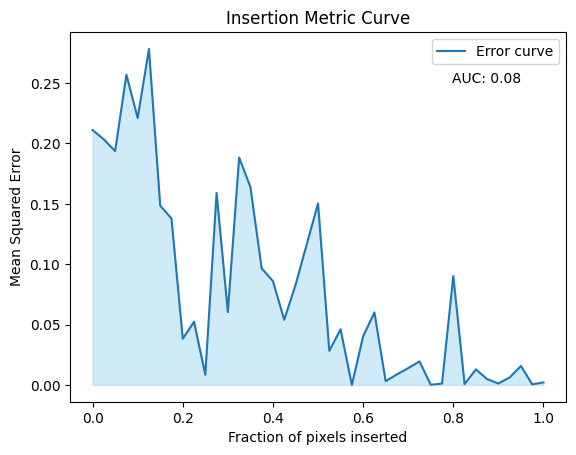

Errors: [0.21115313, 0.20337287, 0.1936856, 0.256959, 0.22112402, 0.27832577, 0.14854772, 0.1378104, 0.038281575, 0.052290678, 0.008444162, 0.15897766, 0.060358416, 0.18839586, 0.16388808, 0.09658231, 0.08596849, 0.053940218, 0.082697324, 0.11650979, 0.15036866, 0.028274726, 0.046119787, 1.2110105e-05, 0.04025936, 0.060040716, 0.003130968, 0.008760855, 0.013943989, 0.01949769, 0.00015738275, 0.0011126673, 0.09018367, 0.00070579187, 0.012886742, 0.004832334, 0.0011855006, 0.0061935503, 0.01567463, 0.00047860012, 0.0020731185]
AUC: 0.07891482002742123
############################################################# 

Insertion 8 top pixel for Istance nr 90 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (1, 4), (2, 2), (4, 3), (4, 4), (1, 2), (0, 2), (3, 2), (0, 4), (4, 5), (3, 5), (0, 7), (1, 7), (4, 2), (4, 7), (4, 6), (2, 5), (1, 5), (0, 6), (3, 7), (2, 7), (1, 1), (0, 1), (1, 6), (0, 5), (2, 1), (3, 6), (3, 1), (4, 0), (4, 1), (3, 0), (2, 6), (0, 0), (2, 0), (1, 0)] 

Original predict

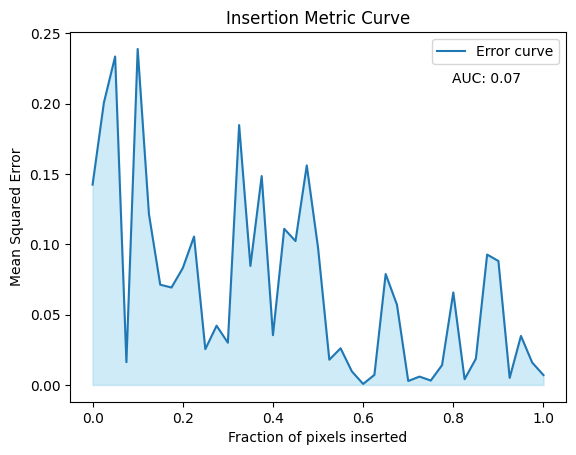

Errors: [0.1424105, 0.20058051, 0.23353478, 0.016191702, 0.23892374, 0.12143124, 0.07127415, 0.06926491, 0.083072305, 0.105519675, 0.025432037, 0.04211813, 0.030020382, 0.1847767, 0.08461011, 0.14852664, 0.03538972, 0.11102763, 0.10229401, 0.15610509, 0.097600974, 0.01793896, 0.026052564, 0.009647752, 0.00069443043, 0.0071635507, 0.07887829, 0.057020053, 0.0027920525, 0.005930215, 0.0031191593, 0.014074136, 0.0657508, 0.004073206, 0.018609347, 0.092698894, 0.088109076, 0.005001481, 0.034843177, 0.015871355, 0.006984902]
AUC: 0.06951651613926516
############################################################# 

Insertion 8 top pixel for Istance nr 91 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (0, 3), (4, 3), (4, 4), (2, 2), (1, 2), (1, 4), (0, 2), (3, 2), (3, 5), (0, 7), (4, 5), (1, 7), (4, 7), (0, 4), (4, 6), (2, 5), (2, 7), (4, 2), (3, 7), (0, 6), (1, 6), (3, 6), (1, 5), (2, 6), (2, 1), (1, 1), (0, 1), (3, 0), (3, 1), (0, 5), (2, 0), (4, 0), (4, 1), (1, 0), (0, 0)] 

Original prediction: 

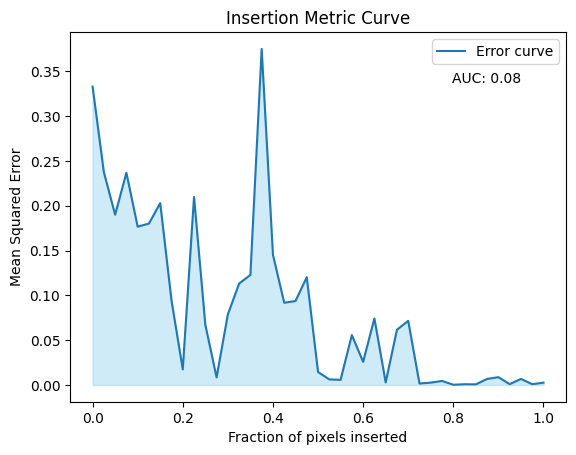

Errors: [0.33293715, 0.23744768, 0.18999034, 0.2366977, 0.17661512, 0.18007876, 0.20286359, 0.09439217, 0.017307993, 0.20977384, 0.06724576, 0.008400205, 0.07868202, 0.11311566, 0.12277471, 0.3749817, 0.14523871, 0.09172376, 0.09363089, 0.12022938, 0.014465077, 0.0061734524, 0.0056743063, 0.055634376, 0.02574282, 0.074225865, 0.0027432488, 0.06155239, 0.07148059, 0.0015800988, 0.0025729998, 0.0044614435, 0.00021724623, 0.00077253976, 0.0006184239, 0.0066959774, 0.008633031, 0.00085554307, 0.006739535, 0.0008090912, 0.0025477258]
AUC: 0.08201451196509879
############################################################# 

Insertion 8 top pixel for Istance nr 92 
[(2, 3), (3, 3), (2, 4), (3, 4), (1, 3), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (0, 2), (3, 2), (3, 5), (0, 4), (4, 5), (0, 7), (1, 7), (4, 2), (2, 5), (4, 6), (4, 7), (0, 6), (3, 7), (1, 5), (1, 1), (2, 7), (3, 6), (1, 6), (0, 1), (2, 1), (0, 5), (2, 6), (3, 1), (3, 0), (4, 0), (2, 0), (4, 1), (1, 0), (0, 0)] 

Original pre

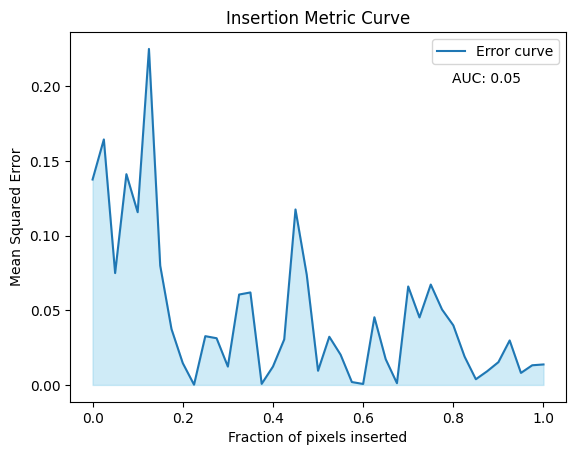

Errors: [0.13755596, 0.16441372, 0.074895374, 0.1411418, 0.1156601, 0.22501627, 0.0798544, 0.03742211, 0.014624891, 0.00014175066, 0.032655314, 0.031275783, 0.012283859, 0.060533065, 0.061933972, 0.00072310626, 0.012276461, 0.030464685, 0.11750715, 0.0736772, 0.009476326, 0.032262627, 0.020263476, 0.0019339576, 0.00063565944, 0.04532988, 0.017285261, 0.0011585819, 0.06593641, 0.045207933, 0.067217074, 0.050506152, 0.039912235, 0.018971754, 0.0038150866, 0.009139179, 0.01524736, 0.029789167, 0.008040805, 0.013161086, 0.013714029]
AUC: 0.04643565027799924
############################################################# 

Insertion 8 top pixel for Istance nr 93 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (3, 2), (0, 2), (0, 4), (4, 5), (0, 7), (3, 5), (4, 7), (4, 2), (4, 6), (1, 7), (2, 5), (3, 7), (0, 6), (2, 7), (1, 5), (3, 6), (0, 5), (1, 6), (3, 0), (4, 0), (0, 1), (4, 1), (3, 1), (1, 1), (2, 6), (2, 1), (2, 0), (1, 0), (0, 0)] 

Original pre

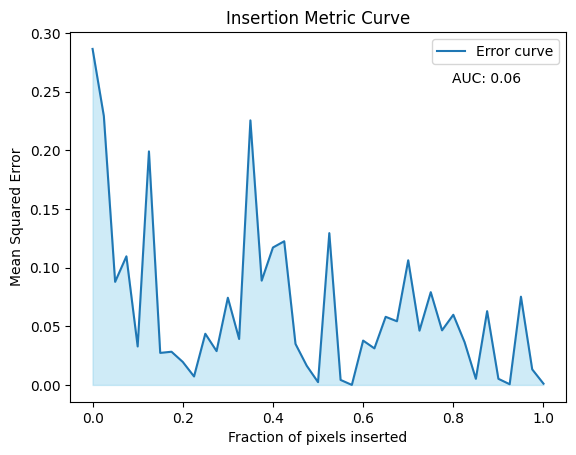

Errors: [0.28631726, 0.22904778, 0.08783682, 0.10959097, 0.032771226, 0.19900191, 0.027284265, 0.028290363, 0.01961011, 0.0072147558, 0.043608524, 0.028817603, 0.074299805, 0.039154526, 0.2254464, 0.088866204, 0.117098995, 0.122427806, 0.03496411, 0.016296688, 0.0023610522, 0.12935649, 0.004265988, 6.920638e-06, 0.037786845, 0.031137174, 0.05804363, 0.054246474, 0.106239304, 0.046250083, 0.07903814, 0.04651874, 0.0597812, 0.03644266, 0.0052021127, 0.06284003, 0.0052194954, 0.00058533245, 0.07518536, 0.013253121, 0.001075071]
AUC: 0.06322712877299637
############################################################# 

Insertion 8 top pixel for Istance nr 94 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (0, 3), (4, 3), (1, 4), (4, 4), (1, 2), (2, 2), (0, 2), (0, 4), (3, 2), (4, 5), (4, 6), (4, 2), (3, 5), (4, 7), (0, 7), (1, 7), (2, 5), (1, 5), (3, 7), (3, 0), (4, 1), (3, 6), (0, 6), (0, 1), (4, 0), (3, 1), (0, 5), (1, 1), (2, 7), (2, 1), (1, 6), (2, 0), (2, 6), (0, 0), (1, 0)] 

Original predict

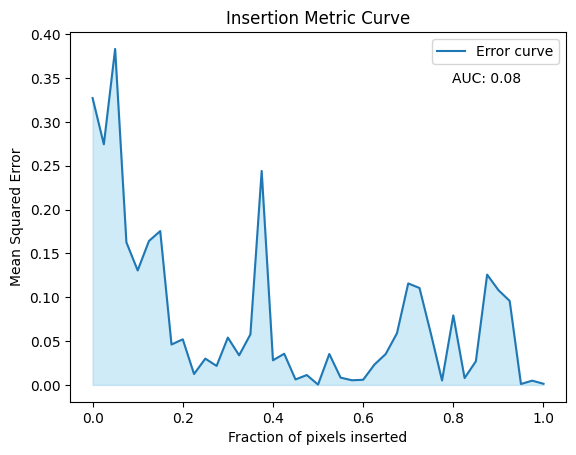

Errors: [0.32723218, 0.2745036, 0.38329482, 0.16267651, 0.13059132, 0.16419347, 0.17550968, 0.046113078, 0.05203127, 0.012466598, 0.030019348, 0.021685492, 0.054019317, 0.03378353, 0.057668746, 0.24412802, 0.028125426, 0.03557709, 0.0062346347, 0.011295381, 0.0004042879, 0.03527629, 0.008346579, 0.005330577, 0.005849724, 0.023194164, 0.035221234, 0.058879443, 0.11578354, 0.11057225, 0.059033893, 0.005051074, 0.07934301, 0.007829553, 0.026962405, 0.12581605, 0.10818986, 0.095833555, 0.0010431511, 0.0048802174, 0.0013215747]
AUC: 0.07502587643684819
############################################################# 

Insertion 8 top pixel for Istance nr 95 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 4), (4, 3), (0, 3), (2, 2), (1, 2), (1, 4), (0, 2), (3, 2), (4, 5), (3, 5), (0, 7), (1, 7), (0, 4), (4, 7), (4, 6), (4, 2), (2, 5), (0, 6), (2, 7), (3, 7), (1, 6), (3, 6), (0, 1), (1, 1), (1, 5), (2, 1), (0, 5), (2, 6), (4, 0), (3, 0), (3, 1), (2, 0), (4, 1), (1, 0), (0, 0)] 

Original predictio

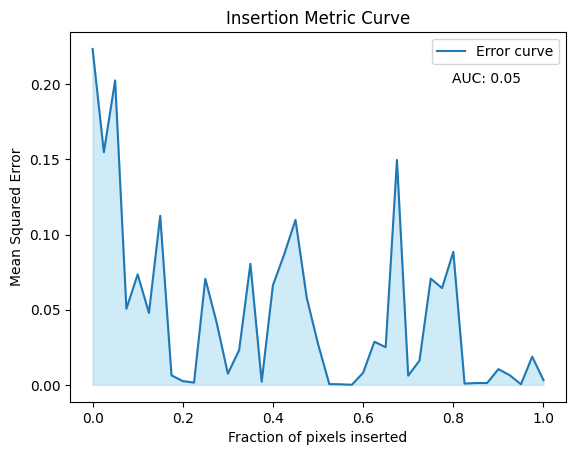

Errors: [0.22338805, 0.15473178, 0.20243514, 0.05063005, 0.0734973, 0.047866087, 0.11245433, 0.006389025, 0.0025374228, 0.0015526685, 0.07057925, 0.04164375, 0.007498725, 0.023131935, 0.08052086, 0.0021055178, 0.06632359, 0.08685313, 0.109735854, 0.05789452, 0.027254382, 0.0005446047, 0.00042500696, 9.383232e-05, 0.008083513, 0.02873328, 0.025074115, 0.14955167, 0.0061437404, 0.01620384, 0.0706632, 0.06440181, 0.088490516, 0.0009202453, 0.001263565, 0.0012772807, 0.010501624, 0.006470102, 0.00046327026, 0.01875539, 0.0031668902]
AUC: 0.04592433510770207
############################################################# 

Insertion 8 top pixel for Istance nr 96 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (1, 4), (4, 4), (2, 2), (1, 2), (0, 2), (3, 2), (4, 5), (0, 4), (3, 5), (4, 7), (4, 6), (0, 7), (4, 2), (1, 7), (2, 5), (3, 7), (2, 7), (3, 6), (0, 1), (1, 5), (0, 6), (2, 6), (1, 6), (1, 1), (0, 5), (2, 1), (3, 1), (3, 0), (0, 0), (4, 0), (4, 1), (2, 0), (1, 0)] 

Original pre

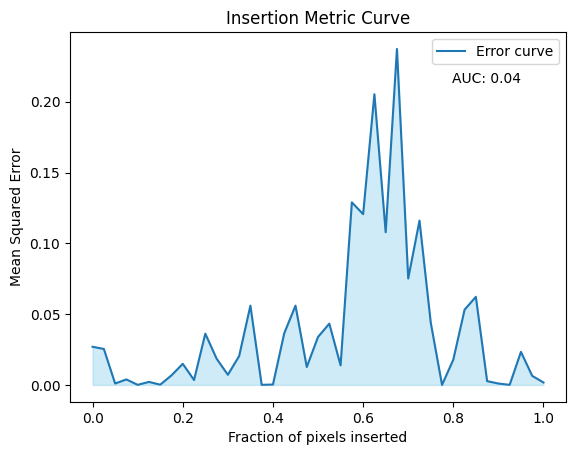

Errors: [0.026937025, 0.025398038, 0.0009978293, 0.003885825, 5.2237334e-05, 0.0021359087, 0.00017106616, 0.0067602196, 0.014912762, 0.003458216, 0.036207937, 0.018581143, 0.007169616, 0.020362971, 0.055981327, 6.775499e-05, 0.0002686173, 0.03642439, 0.055992864, 0.0126694925, 0.03390439, 0.043264993, 0.013833032, 0.12895285, 0.120622255, 0.2052964, 0.10784512, 0.23729667, 0.07517382, 0.11601312, 0.043933123, 1.5616628e-09, 0.017850472, 0.05313472, 0.06221925, 0.002665653, 0.0009820202, 5.6092646e-05, 0.023342328, 0.0063956873, 0.0017228365]
AUC: 0.04021525344724068
############################################################# 

Insertion 8 top pixel for Istance nr 97 
[(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (4, 3), (1, 2), (2, 2), (4, 4), (1, 4), (0, 2), (3, 2), (4, 5), (0, 4), (4, 7), (4, 6), (3, 5), (4, 2), (1, 7), (0, 7), (2, 5), (0, 1), (3, 7), (1, 1), (2, 7), (3, 6), (0, 6), (1, 5), (2, 1), (1, 6), (3, 1), (0, 5), (4, 1), (2, 6), (3, 0), (0, 0), (4, 0), (2, 0), (1, 0)] 


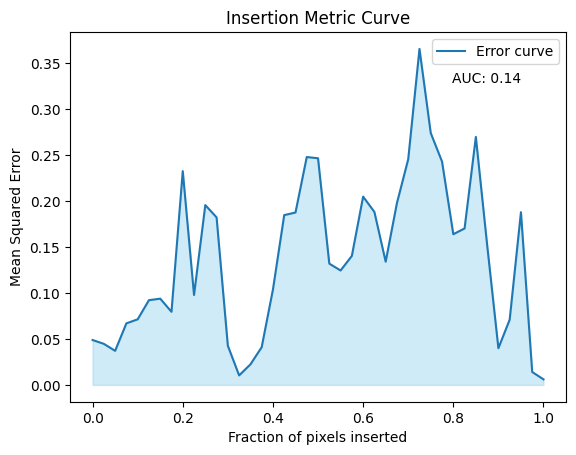

Errors: [0.04883761, 0.04466437, 0.03706956, 0.066968665, 0.07134319, 0.0921569, 0.09380792, 0.07952178, 0.23249957, 0.09780737, 0.19555476, 0.1822101, 0.04258218, 0.01036617, 0.022329032, 0.040991545, 0.103730895, 0.18467474, 0.18748397, 0.24781854, 0.24649575, 0.13189577, 0.12445258, 0.14032167, 0.20476778, 0.18811727, 0.13400984, 0.19778375, 0.24540132, 0.36538723, 0.27384686, 0.24289113, 0.1638892, 0.17017402, 0.26968542, 0.15246679, 0.039924238, 0.07099125, 0.18784049, 0.01405751, 0.0060584485]
AUC: 0.14063573007006197
############################################################# 

Insertion 8 top pixel for Istance nr 98 
[(2, 3), (3, 3), (3, 4), (1, 3), (4, 3), (2, 4), (4, 4), (2, 2), (1, 2), (0, 3), (3, 2), (1, 4), (4, 2), (0, 2), (4, 5), (3, 5), (4, 6), (0, 4), (4, 7), (0, 7), (2, 5), (2, 1), (1, 1), (1, 7), (3, 7), (0, 1), (3, 6), (3, 1), (1, 5), (0, 6), (2, 7), (1, 6), (2, 0), (0, 5), (3, 0), (1, 0), (4, 1), (2, 6), (0, 0), (4, 0)] 

Original prediction: [0.37320784]
Initial 

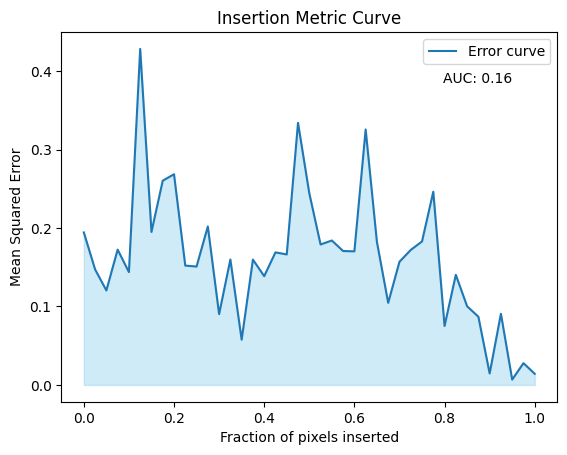

Errors: [0.19433348, 0.14720318, 0.12041999, 0.17242531, 0.1438062, 0.4282311, 0.19501534, 0.2602947, 0.268493, 0.1520712, 0.15089822, 0.20194009, 0.09028589, 0.15985046, 0.05764506, 0.15969779, 0.13863525, 0.16894113, 0.16628493, 0.3340302, 0.2443475, 0.17901777, 0.18406574, 0.17065229, 0.17027704, 0.3255901, 0.18218601, 0.10462908, 0.15695897, 0.17202905, 0.18287276, 0.24620356, 0.075166255, 0.14033501, 0.10025096, 0.08694652, 0.014593062, 0.09067757, 0.0067901323, 0.027744565, 0.014173958]
AUC: 0.1620439167600125
############################################################# 

Insertion 8 top pixel for Istance nr 99 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (4, 4), (0, 3), (2, 2), (1, 2), (1, 4), (0, 2), (3, 2), (0, 4), (4, 5), (4, 2), (3, 5), (4, 7), (4, 6), (1, 7), (0, 7), (2, 5), (2, 7), (3, 7), (0, 1), (1, 1), (3, 6), (1, 5), (2, 6), (2, 1), (1, 6), (0, 6), (0, 5), (3, 1), (3, 0), (2, 0), (1, 0), (0, 0), (4, 0), (4, 1)] 

Original prediction: [0.5090688]
Initial Predictio

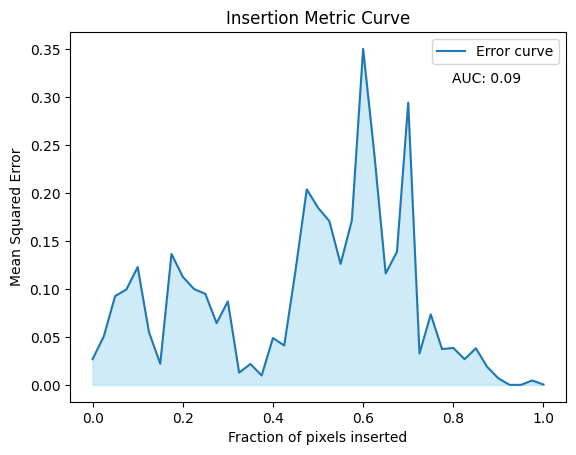

Errors: [0.026850166, 0.0507627, 0.09258145, 0.09942213, 0.12282024, 0.05504508, 0.022086933, 0.136422, 0.11266927, 0.099859945, 0.09486857, 0.064372376, 0.08700957, 0.01282072, 0.021809412, 0.009831526, 0.048872836, 0.04109017, 0.11903707, 0.20378487, 0.18451662, 0.17071629, 0.12603745, 0.17143932, 0.34996462, 0.23980908, 0.11605474, 0.13873383, 0.29405534, 0.03279661, 0.07347019, 0.037286703, 0.038594052, 0.026800787, 0.03819127, 0.018847432, 0.0068383557, 4.0978935e-05, 5.6717563e-05, 0.0046474184, 0.00038953527]
AUC: 0.08944211273701513
############################################################# 

Insertion 8 top pixel for Istance nr 100 
[(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (0, 3), (1, 2), (4, 4), (2, 2), (0, 2), (3, 2), (1, 4), (4, 2), (4, 5), (0, 4), (3, 5), (0, 7), (4, 7), (4, 6), (1, 7), (1, 1), (0, 1), (3, 7), (2, 5), (2, 7), (2, 1), (3, 6), (0, 6), (1, 5), (1, 6), (2, 6), (3, 1), (0, 5), (2, 0), (3, 0), (1, 0), (4, 1), (0, 0), (4, 0)] 

Original prediction: [0.

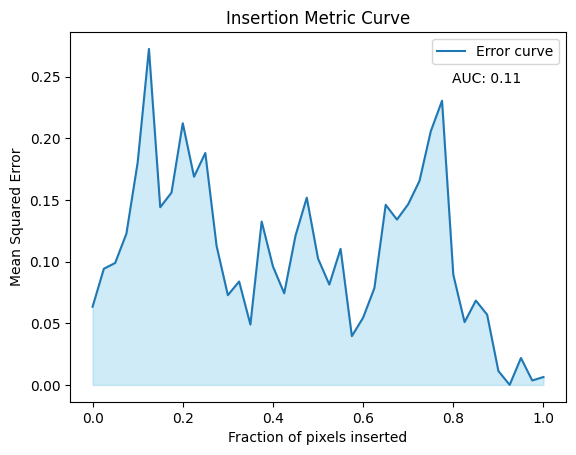

Errors: [0.063393995, 0.094199404, 0.098857194, 0.122624926, 0.18038286, 0.27239922, 0.14405814, 0.15590838, 0.21216029, 0.1687889, 0.18803068, 0.112673745, 0.07277101, 0.08385619, 0.048932467, 0.13246925, 0.09604805, 0.07428301, 0.120976254, 0.1518134, 0.102432154, 0.08137294, 0.11032424, 0.039553974, 0.054565962, 0.07853737, 0.14598678, 0.13405828, 0.14653373, 0.16542682, 0.20557195, 0.23040843, 0.08932956, 0.050906226, 0.068385184, 0.056970138, 0.011266121, 5.2632255e-05, 0.021842048, 0.0036238504, 0.0064140623]
AUC: 0.10908214490627871
############################################################# 

Insertion 8 top pixel for Istance nr 101 
[(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (4, 4), (0, 3), (1, 2), (2, 2), (1, 4), (0, 2), (3, 2), (4, 2), (4, 5), (3, 5), (4, 7), (4, 6), (0, 4), (0, 7), (1, 7), (1, 1), (0, 1), (3, 7), (2, 1), (3, 6), (2, 5), (0, 6), (2, 7), (3, 1), (1, 6), (3, 0), (4, 1), (1, 5), (2, 0), (4, 0), (2, 6), (0, 5), (1, 0), (0, 0)] 

Original prediction: [0.3

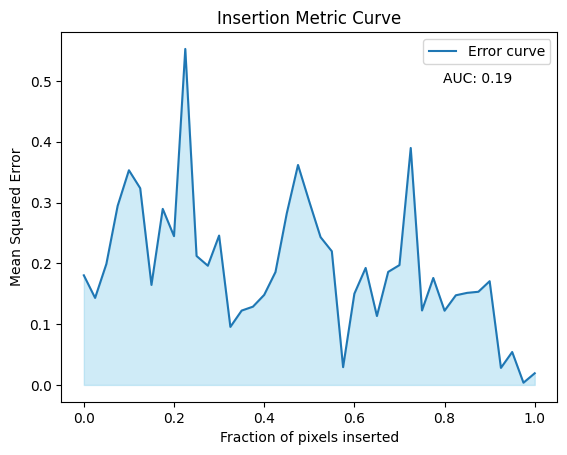

Errors: [0.18026102, 0.14309359, 0.19898255, 0.29446578, 0.3530575, 0.3235368, 0.16445814, 0.2895259, 0.24466011, 0.55259585, 0.21204367, 0.19603936, 0.24564776, 0.09544182, 0.122269854, 0.1286898, 0.14809912, 0.18560818, 0.28191304, 0.36173287, 0.3014496, 0.2430589, 0.21980973, 0.029197313, 0.15004872, 0.19239135, 0.113294065, 0.18590376, 0.1970943, 0.38969713, 0.12244161, 0.17591304, 0.12206069, 0.14741988, 0.15139803, 0.15320738, 0.17061251, 0.028004963, 0.05414005, 0.0036326647, 0.019190747]
AUC: 0.1948090815916657
############################################################# 

Insertion 8 top pixel for Istance nr 102 
[(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (1, 2), (2, 2), (0, 3), (4, 4), (0, 2), (1, 4), (3, 2), (4, 2), (4, 5), (3, 5), (0, 4), (4, 6), (4, 7), (0, 7), (1, 7), (1, 1), (0, 1), (2, 5), (2, 1), (3, 7), (3, 6), (0, 6), (2, 7), (1, 6), (1, 5), (3, 1), (0, 5), (2, 6), (3, 0), (2, 0), (4, 1), (1, 0), (0, 0), (4, 0)] 

Original prediction: [0.51816]
Initial Predict

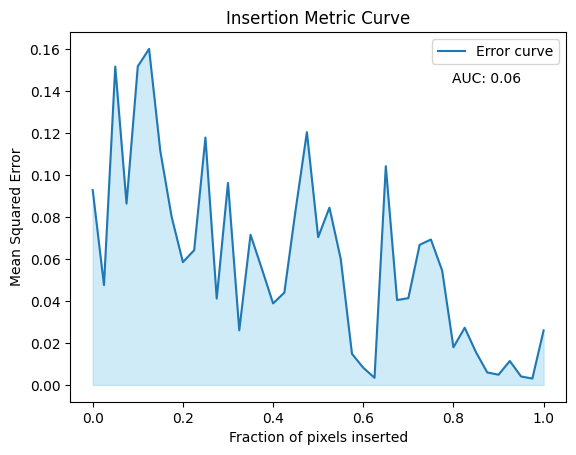

Errors: [0.09273581, 0.04750851, 0.15155272, 0.086309716, 0.15165186, 0.15994924, 0.111220516, 0.08005017, 0.0584488, 0.06415063, 0.117776155, 0.041101675, 0.09616838, 0.02599222, 0.07148607, 0.05535605, 0.038805466, 0.04394237, 0.08332907, 0.12034572, 0.07033589, 0.08439782, 0.06000932, 0.014790062, 0.008197954, 0.003391182, 0.10413431, 0.04039095, 0.041322723, 0.06668685, 0.069232605, 0.05443636, 0.017904425, 0.027238186, 0.015570375, 0.005942091, 0.0048843487, 0.011386659, 0.004029251, 0.0030323092, 0.025950396]
AUC: 0.05929505284875631
############################################################# 

Insertion 8 top pixel for Istance nr 103 
[(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (4, 4), (0, 3), (2, 2), (1, 2), (3, 2), (0, 2), (1, 4), (4, 2), (4, 5), (4, 6), (3, 5), (4, 7), (0, 4), (0, 7), (1, 1), (1, 7), (3, 7), (2, 5), (2, 1), (0, 1), (2, 7), (3, 6), (3, 1), (0, 6), (2, 0), (1, 5), (3, 0), (1, 6), (1, 0), (2, 6), (4, 1), (0, 5), (0, 0), (4, 0)] 

Original prediction: [0.4

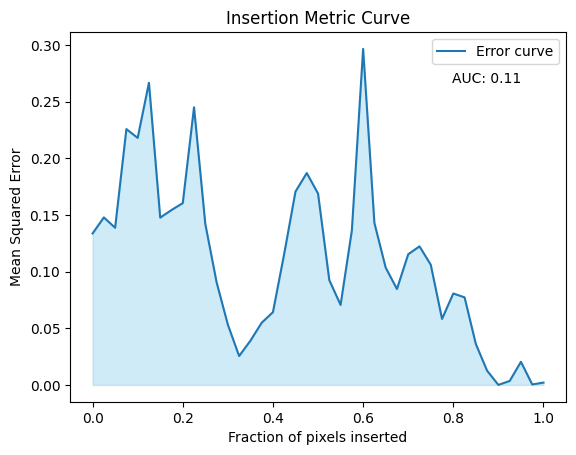

Errors: [0.13372776, 0.14791158, 0.13876098, 0.22589387, 0.2180946, 0.26679367, 0.14771469, 0.15443127, 0.16052113, 0.24516886, 0.14212528, 0.09070428, 0.053221878, 0.025513079, 0.03903068, 0.05488819, 0.06424881, 0.11585931, 0.17071483, 0.18707448, 0.16897798, 0.09252344, 0.07066531, 0.1363358, 0.29667592, 0.14299369, 0.10357992, 0.084684074, 0.115367025, 0.12235393, 0.106107526, 0.058282524, 0.080721155, 0.07731431, 0.036086287, 0.012532498, 8.407951e-06, 0.0035134198, 0.020426719, 0.00041334453, 0.0020568753]
AUC: 0.11115317604271695
############################################################# 

Insertion 8 top pixel for Istance nr 104 
[(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (2, 2), (4, 4), (1, 2), (0, 3), (3, 2), (0, 2), (1, 4), (4, 5), (4, 2), (3, 5), (4, 6), (4, 7), (0, 4), (1, 1), (0, 7), (1, 7), (0, 1), (2, 5), (3, 7), (2, 1), (3, 6), (2, 7), (0, 6), (3, 1), (3, 0), (1, 5), (2, 0), (1, 6), (2, 6), (1, 0), (0, 5), (4, 1), (0, 0), (4, 0)] 

Original prediction: [0.5680

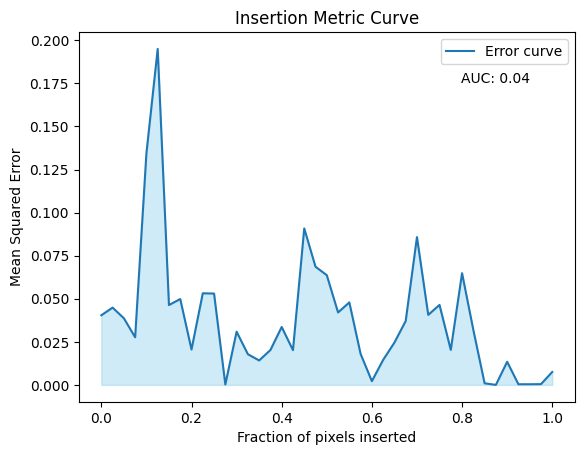

Errors: [0.040426943, 0.044870693, 0.038685326, 0.02764558, 0.13441306, 0.19498694, 0.04635587, 0.049849145, 0.020549873, 0.05316949, 0.053032275, 0.00027945466, 0.030897979, 0.017830681, 0.014195227, 0.020268228, 0.033627637, 0.0201881, 0.09082404, 0.06859205, 0.06369077, 0.042054567, 0.047897443, 0.017995799, 0.00218689, 0.014531707, 0.02458541, 0.0370809, 0.08577991, 0.040654752, 0.04643275, 0.020326108, 0.06487534, 0.03193598, 0.0009535802, 1.6257633e-05, 0.013431057, 0.00038521347, 0.00039030265, 0.0004457327, 0.007524089]
AUC: 0.0384971909072192
############################################################# 



In [ ]:
# INSERTION: Insert the top 40 most important pixels in descending order of importance

# Statistics of the Insertion with elements of the type: [errors, auc]
sm_insertion_stats_vott_norm_all_lstm = []

models = vott_lstm_models_loaded

for i, top_n_pixel_i in enumerate(important_indices):
    initial_blurred_images = np.zeros((104, 5, 8, 3))
    print(f"Inserting 8 top pixels for Instance nr {i} ")  # Note: This statement is incorrect; all 40 pixels are being processed.
    nr_instance = i
    errors, auc = get_errors_from_insertion(vottignasco_test_image, vottingasco_test_OHE, nr_instance, top_n_pixel_i, initial_blurred_images, models)
    sm_insertion_stats_vott_norm_all_lstm.append(np.array([errors, auc], dtype=object))
    print(f"Errors: {errors}")
    print(f"AUC: {auc}")
    print("#############################################################", "\n")


##### ***Deletion***

Deletion 8 top pixel for Instance nr 0 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (3, 2), (4, 4), (1, 2), (4, 2), (1, 4), (0, 3), (1, 7), (0, 7), (0, 2), (3, 5), (2, 7), (2, 5), (4, 5), (4, 7), (1, 6), (2, 1), (0, 4), (1, 1), (0, 6), (4, 6), (2, 6), (3, 7), (3, 6), (3, 1), (1, 5), (0, 1), (3, 0), (4, 1), (2, 0), (1, 0), (4, 0), (0, 5), (0, 0)] 

Original prediction: [0.21692976]
Initial Prediction with Original Images, prediction: [0.21692976], error: 0.0
Removed pixel (2, 3), new prediction: [0.3809945], error: 0.026917237788438797
Removed pixel (3, 3), new prediction: [0.59006786], error: 0.13923203945159912
Removed pixel (4, 3), new prediction: [0.561334], error: 0.11861428618431091
Removed pixel (1, 3), new prediction: [0.61836517], error: 0.16115038096904755
Removed pixel (3, 4), new prediction: [0.7360971], error: 0.2695346772670746
Removed pixel (2, 4), new prediction: [0.8329117], error: 0.3794337511062622
Removed pixel (2, 2), new predicti

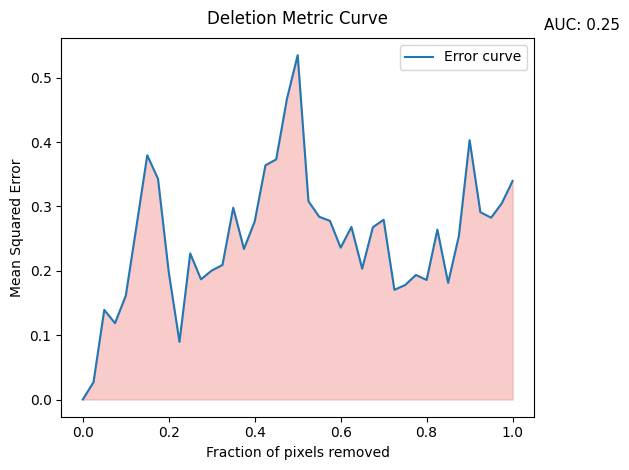

Errors: [0.0, 0.026917238, 0.13923204, 0.118614286, 0.16115038, 0.26953468, 0.37943375, 0.34291285, 0.19797744, 0.08952337, 0.2268799, 0.18672043, 0.20039089, 0.20899376, 0.29793638, 0.23389639, 0.27663475, 0.3639083, 0.37303954, 0.46714038, 0.53502744, 0.30807006, 0.28392395, 0.27759263, 0.23587263, 0.26809114, 0.20325124, 0.2677203, 0.27928323, 0.17043877, 0.17783816, 0.19350268, 0.18572238, 0.2639313, 0.18116598, 0.25406846, 0.4029177, 0.29099593, 0.2824585, 0.30498496, 0.33957335]
AUC: 0.2524370226077735
############################################################# 

Deletion 8 top pixel for Instance nr 1 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (1, 2), (4, 4), (0, 3), (3, 2), (4, 2), (0, 2), (1, 4), (4, 7), (3, 7), (4, 6), (2, 7), (1, 7), (4, 5), (3, 5), (0, 7), (3, 6), (0, 4), (1, 1), (0, 1), (1, 6), (0, 6), (2, 5), (2, 6), (2, 1), (3, 1), (4, 1), (1, 5), (3, 0), (0, 5), (2, 0), (4, 0), (1, 0), (0, 0)] 

Original prediction: [0.26565933]
In

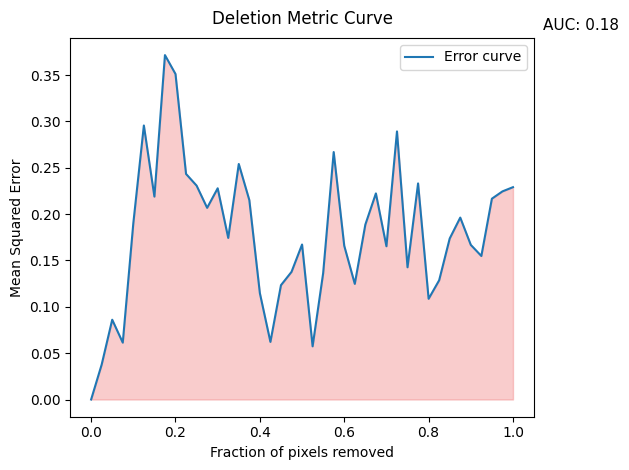

Errors: [0.0, 0.037676312, 0.086083345, 0.061355427, 0.19012365, 0.29568738, 0.21895711, 0.3716347, 0.35124114, 0.24341118, 0.23081098, 0.20682521, 0.22792085, 0.17433165, 0.2541574, 0.21520008, 0.11473622, 0.062150255, 0.123361655, 0.13772513, 0.167245, 0.05737906, 0.13631365, 0.2670321, 0.16585949, 0.12477623, 0.18872844, 0.22238626, 0.16537039, 0.2892943, 0.14267437, 0.23317821, 0.108686954, 0.12865528, 0.17375058, 0.19629677, 0.16683063, 0.15486169, 0.21670346, 0.22457772, 0.22912748]
AUC: 0.18121384941041468
############################################################# 

Deletion 8 top pixel for Instance nr 2 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (1, 2), (0, 3), (4, 4), (3, 2), (0, 2), (4, 2), (1, 4), (2, 7), (1, 7), (3, 7), (4, 7), (4, 6), (3, 5), (4, 5), (3, 6), (0, 7), (0, 4), (2, 6), (1, 1), (2, 1), (2, 5), (3, 1), (1, 6), (3, 0), (0, 1), (4, 1), (0, 6), (4, 0), (2, 0), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original prediction: [0.2621956

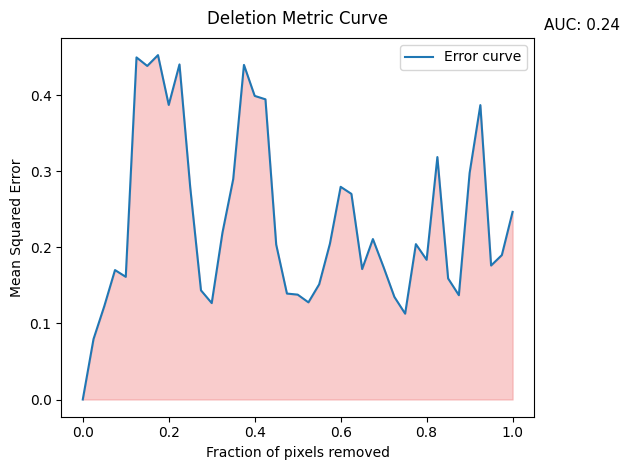

Errors: [0.0, 0.0794233, 0.12255195, 0.17009331, 0.16119963, 0.4495249, 0.4383028, 0.4525382, 0.38707203, 0.44031888, 0.27867296, 0.14343563, 0.12668392, 0.21926299, 0.28960383, 0.43967205, 0.3989374, 0.3944592, 0.20360364, 0.13920557, 0.13780493, 0.12764703, 0.1513506, 0.20469381, 0.2794764, 0.27019137, 0.17140721, 0.21081975, 0.17369282, 0.13480279, 0.11278115, 0.20415342, 0.18357693, 0.31856576, 0.15905626, 0.13706782, 0.297576, 0.38684586, 0.17605825, 0.18977681, 0.24654266]
AUC: 0.23712946195155382
############################################################# 

Deletion 8 top pixel for Instance nr 3 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (2, 2), (3, 2), (0, 3), (4, 2), (4, 4), (1, 2), (1, 7), (1, 4), (0, 2), (4, 7), (2, 7), (3, 7), (4, 6), (0, 7), (4, 5), (3, 5), (3, 6), (0, 4), (1, 6), (2, 6), (0, 6), (2, 5), (2, 1), (1, 1), (3, 1), (4, 1), (0, 1), (3, 0), (1, 5), (2, 0), (0, 5), (4, 0), (1, 0), (0, 0)] 

Original prediction: [0.37217802]
Initial

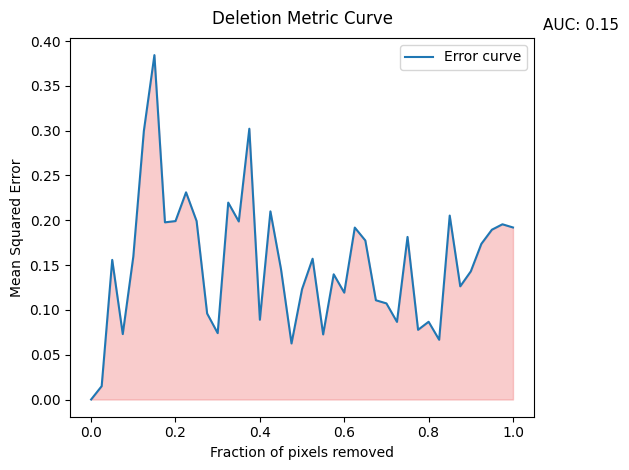

Errors: [0.0, 0.014897312, 0.1557845, 0.0729922, 0.15947518, 0.29970112, 0.38429233, 0.19769873, 0.19908705, 0.23117985, 0.19912222, 0.09594976, 0.07406519, 0.21971533, 0.19866176, 0.30216047, 0.088996455, 0.2099227, 0.14566089, 0.062545665, 0.12315093, 0.1570948, 0.07261776, 0.13969912, 0.11924536, 0.19184548, 0.17740767, 0.11074197, 0.107238285, 0.08659934, 0.18141796, 0.07774603, 0.0867339, 0.06664609, 0.20523925, 0.12629016, 0.14298114, 0.17366846, 0.18946818, 0.19551754, 0.19196247]
AUC: 0.15348098452668635
############################################################# 

Deletion 8 top pixel for Instance nr 4 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 2), (0, 3), (2, 4), (1, 2), (4, 4), (4, 2), (3, 2), (0, 2), (4, 7), (3, 7), (1, 4), (2, 7), (4, 6), (1, 7), (4, 5), (3, 6), (3, 5), (0, 7), (0, 4), (3, 1), (2, 6), (2, 1), (4, 1), (1, 6), (1, 1), (2, 5), (3, 0), (0, 1), (0, 6), (4, 0), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original prediction: [0.46095023

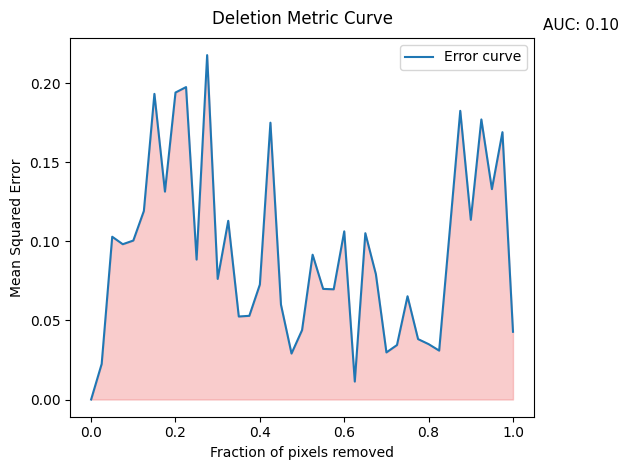

Errors: [0.0, 0.02248981, 0.1029568, 0.09822976, 0.10054887, 0.11923431, 0.1933312, 0.13150033, 0.19418105, 0.19761877, 0.08850802, 0.21785033, 0.076285005, 0.11303455, 0.052502196, 0.052935973, 0.07272045, 0.17510033, 0.059996836, 0.029073566, 0.04389449, 0.091593094, 0.069959395, 0.06970816, 0.10636731, 0.011346135, 0.10518926, 0.07926313, 0.029785082, 0.03444794, 0.06531567, 0.038203374, 0.035029396, 0.030928234, 0.10654961, 0.18260308, 0.11367222, 0.17715347, 0.13307992, 0.16910315, 0.042840876]
AUC: 0.09531776728108526
############################################################# 

Deletion 8 top pixel for Instance nr 5 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (2, 2), (3, 2), (4, 2), (1, 2), (0, 3), (1, 7), (4, 7), (3, 7), (2, 7), (4, 6), (0, 2), (0, 7), (1, 4), (4, 5), (3, 5), (3, 6), (1, 6), (3, 1), (0, 6), (0, 4), (2, 6), (4, 1), (3, 0), (2, 5), (4, 0), (2, 1), (1, 1), (0, 1), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original prediction:

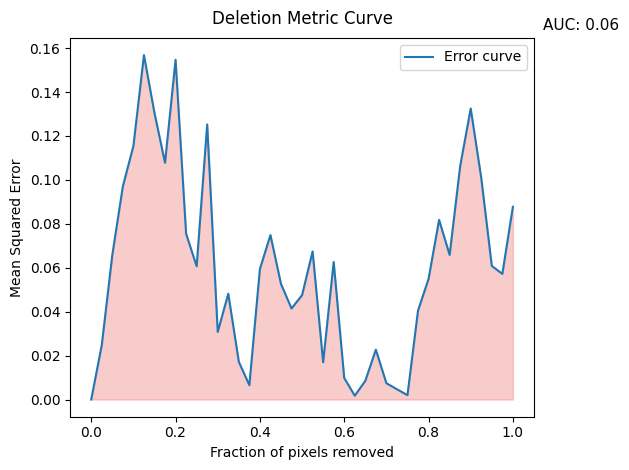

Errors: [0.0, 0.024821188, 0.06585021, 0.09709213, 0.115432404, 0.15682031, 0.13044678, 0.10780613, 0.15470435, 0.07547449, 0.060669143, 0.1252624, 0.030763347, 0.04817782, 0.01720403, 0.006514334, 0.05942027, 0.0748898, 0.052655887, 0.041437183, 0.04751945, 0.06740614, 0.016960802, 0.0626133, 0.009812872, 0.0017375436, 0.008507531, 0.022680437, 0.007430481, 0.0046810997, 0.0019879118, 0.040473122, 0.05492558, 0.08179768, 0.06584042, 0.10629141, 0.13248777, 0.10087639, 0.060832363, 0.057205174, 0.087744705]
AUC: 0.06103455111733638
############################################################# 

Deletion 8 top pixel for Instance nr 6 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (2, 2), (0, 3), (3, 2), (1, 2), (4, 2), (3, 7), (2, 7), (4, 7), (1, 7), (0, 2), (4, 6), (1, 4), (4, 5), (0, 7), (3, 6), (3, 5), (0, 4), (2, 6), (1, 6), (3, 1), (0, 6), (4, 1), (3, 0), (2, 1), (2, 5), (4, 0), (1, 1), (0, 1), (2, 0), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original pre

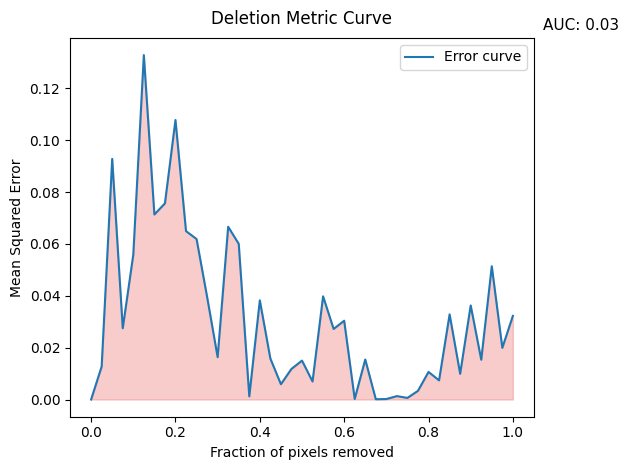

Errors: [0.0, 0.012717925, 0.09282409, 0.027482398, 0.055877354, 0.13285793, 0.0713715, 0.0756524, 0.107829936, 0.06494878, 0.06191629, 0.0395936, 0.016328236, 0.06663803, 0.060040656, 0.0012066626, 0.038240023, 0.015808238, 0.0058968742, 0.011798159, 0.015010807, 0.006946955, 0.039808273, 0.027218457, 0.030388204, 0.00020827095, 0.015435203, 0.00010735065, 0.00017690114, 0.0013134616, 0.00061472383, 0.003345885, 0.010638117, 0.007384291, 0.032837056, 0.009933739, 0.03628331, 0.01534638, 0.051400516, 0.019922178, 0.03225025]
AUC: 0.03248685733324237
############################################################# 

Deletion 8 top pixel for Instance nr 7 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (4, 2), (3, 2), (2, 2), (1, 7), (4, 7), (2, 7), (1, 2), (1, 4), (3, 7), (4, 6), (0, 2), (0, 7), (3, 5), (3, 6), (4, 5), (0, 4), (1, 6), (2, 6), (2, 5), (0, 6), (3, 0), (3, 1), (4, 1), (4, 0), (2, 1), (1, 5), (1, 1), (0, 1), (2, 0), (0, 5), (1, 0), (0, 

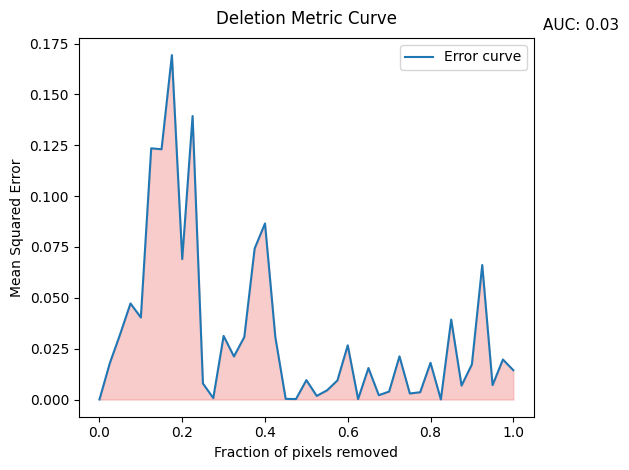

Errors: [0.0, 0.017863136, 0.032139324, 0.047240637, 0.040320784, 0.12352232, 0.1230485, 0.16935416, 0.0690472, 0.13940765, 0.007896149, 0.0006932403, 0.031267665, 0.021175768, 0.030740624, 0.074276835, 0.08656269, 0.030712832, 0.0003074355, 0.00023192748, 0.009532099, 0.0017677417, 0.004512645, 0.009373061, 0.026647419, 0.00020903723, 0.015478701, 0.0021222068, 0.0039152405, 0.021216935, 0.002961646, 0.003576015, 0.018031094, 1.8394254e-05, 0.039308827, 0.006846491, 0.017259331, 0.06613443, 0.0070804227, 0.019661127, 0.014429756]
AUC: 0.03321691534711135
############################################################# 

Deletion 8 top pixel for Instance nr 8 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (2, 2), (3, 2), (0, 3), (4, 2), (4, 7), (1, 2), (3, 7), (2, 7), (1, 7), (3, 5), (4, 5), (4, 6), (1, 4), (0, 2), (3, 6), (0, 7), (2, 6), (0, 4), (1, 6), (2, 5), (3, 1), (2, 1), (0, 6), (4, 1), (3, 0), (1, 1), (1, 5), (2, 0), (0, 1), (4, 0), (0, 5), (1, 0)

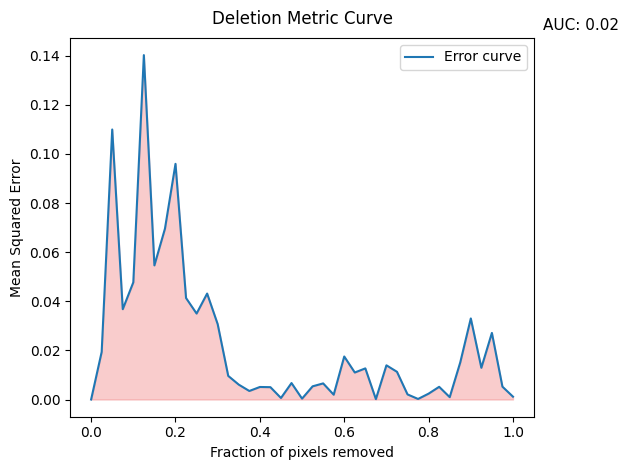

Errors: [0.0, 0.019357437, 0.10993995, 0.036772333, 0.047710538, 0.14023037, 0.05461351, 0.06955174, 0.09595744, 0.041325267, 0.03500072, 0.043139122, 0.030684592, 0.009610238, 0.006053393, 0.0034706565, 0.0050963154, 0.005023188, 0.00061485684, 0.006698953, 0.00035173062, 0.0053641913, 0.006558475, 0.001957884, 0.017513264, 0.010994184, 0.012670445, 0.00015918397, 0.013920829, 0.011277005, 0.0020765015, 0.00021965476, 0.0023879474, 0.0051672803, 0.00095577544, 0.015103299, 0.033004165, 0.012910936, 0.027112594, 0.0052218726, 0.0011517305]
AUC: 0.023658842687655127
############################################################# 

Deletion 8 top pixel for Instance nr 9 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (3, 2), (2, 2), (4, 2), (1, 2), (1, 7), (4, 7), (2, 7), (3, 7), (4, 6), (0, 2), (1, 4), (0, 7), (4, 5), (3, 6), (3, 5), (0, 4), (2, 6), (1, 6), (3, 1), (0, 6), (3, 0), (4, 1), (2, 5), (2, 1), (4, 0), (1, 1), (0, 1), (2, 0), (1, 5), (0, 

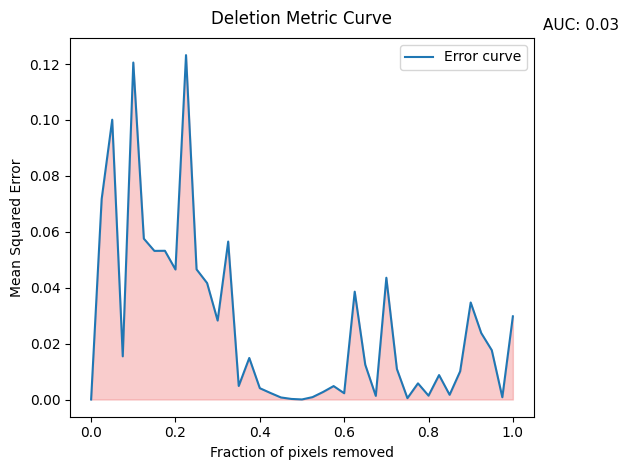

Errors: [0.0, 0.07171865, 0.100099295, 0.015441127, 0.12055221, 0.05754826, 0.053164843, 0.053204156, 0.04650429, 0.1232062, 0.046559423, 0.04165864, 0.028239999, 0.056507997, 0.0048413044, 0.014855983, 0.004047114, 0.002349158, 0.00073509646, 0.0001991787, 2.007204e-05, 0.0008478719, 0.0026974936, 0.004801465, 0.0022396683, 0.03857834, 0.012439647, 0.0012960653, 0.04356114, 0.010918754, 0.00047717203, 0.0057782796, 0.001376084, 0.008739401, 0.0016823059, 0.010079616, 0.034704484, 0.023768548, 0.01763077, 0.0007975192, 0.029755268]
AUC: 0.026968631254612775
############################################################# 

Deletion 8 top pixel for Instance nr 10 
Importants indices ->  [(3, 3), (4, 3), (2, 3), (3, 4), (1, 3), (4, 4), (4, 2), (3, 2), (2, 2), (2, 4), (1, 2), (0, 3), (4, 7), (3, 7), (1, 7), (2, 7), (4, 6), (4, 5), (0, 2), (1, 4), (0, 7), (3, 5), (3, 6), (1, 6), (3, 1), (2, 6), (0, 4), (4, 1), (2, 1), (0, 6), (2, 5), (3, 0), (1, 1), (4, 0), (2, 0), (1, 5), (0, 1), (0, 5), (1,

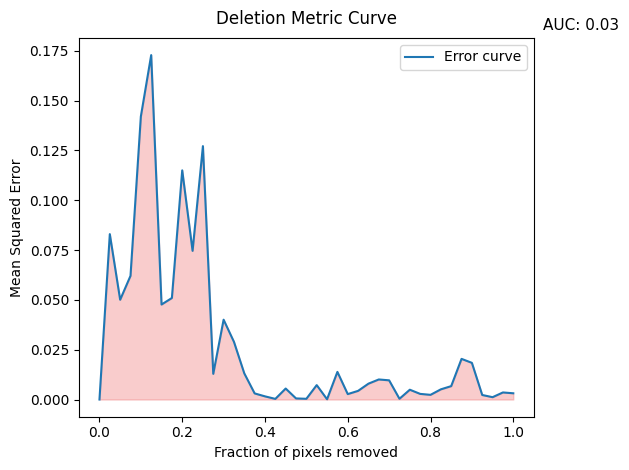

Errors: [0.0, 0.08297596, 0.05006147, 0.06205409, 0.1420105, 0.17280631, 0.047659595, 0.050930545, 0.11497519, 0.07459316, 0.12713498, 0.012879612, 0.040041063, 0.02893246, 0.013098238, 0.0030549525, 0.0015764995, 0.00030855057, 0.0055015595, 0.00054026244, 0.0003520571, 0.0072172973, 0.00013099315, 0.013852934, 0.0027116472, 0.0043326304, 0.007944452, 0.010053613, 0.009621904, 0.0003654938, 0.0049089985, 0.0028181025, 0.0023386367, 0.0050996435, 0.0067092604, 0.020385314, 0.018393964, 0.0022648778, 0.0011622935, 0.0035370565, 0.0031242743]
AUC: 0.028922457390945056
############################################################# 

Deletion 8 top pixel for Instance nr 11 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (4, 2), (3, 2), (2, 2), (4, 7), (1, 2), (3, 7), (0, 3), (4, 6), (1, 7), (2, 7), (4, 5), (3, 6), (3, 5), (0, 7), (1, 4), (0, 2), (2, 6), (1, 6), (3, 1), (3, 0), (4, 1), (4, 0), (2, 1), (2, 5), (0, 6), (0, 4), (1, 1), (2, 0), (0, 1), (1, 5), (1

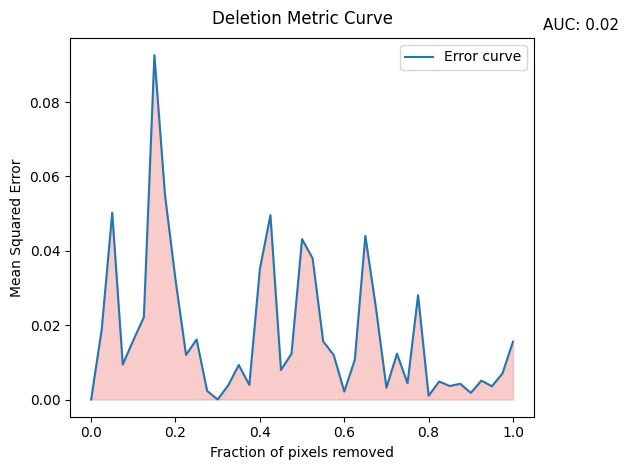

Errors: [0.0, 0.018787058, 0.050225724, 0.009411186, 0.01593001, 0.022134386, 0.092611015, 0.055095825, 0.032204796, 0.011996006, 0.016126238, 0.0023004345, 1.6642489e-05, 0.003820456, 0.009279707, 0.0039097825, 0.03507487, 0.049580637, 0.007932906, 0.01232673, 0.043130927, 0.037958637, 0.015647061, 0.011965863, 0.0021455279, 0.010668052, 0.044016693, 0.02472261, 0.0031707084, 0.012319584, 0.0043626567, 0.028062167, 0.0010078747, 0.0048426483, 0.0036298092, 0.0042337757, 0.0017741028, 0.0050801844, 0.0035717604, 0.00700598, 0.015564173]
AUC: 0.01814657799809538
############################################################# 

Deletion 8 top pixel for Instance nr 12 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (2, 2), (4, 2), (3, 2), (1, 2), (4, 7), (3, 7), (0, 3), (4, 6), (2, 7), (1, 7), (0, 2), (3, 6), (4, 5), (1, 4), (0, 7), (3, 5), (3, 1), (2, 1), (1, 6), (2, 6), (4, 1), (1, 1), (3, 0), (0, 4), (0, 6), (2, 5), (2, 0), (0, 1), (4, 0), (1, 5), (1, 0),

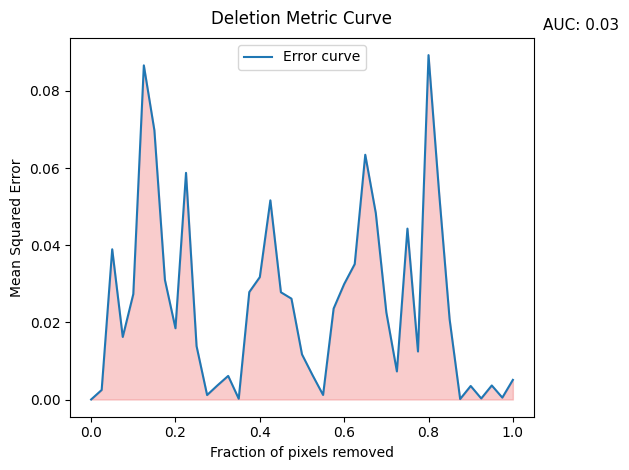

Errors: [0.0, 0.002470418, 0.038942702, 0.016215466, 0.027320705, 0.08662054, 0.06978909, 0.030999964, 0.018473076, 0.058759287, 0.013842035, 0.0011561, 0.0037022685, 0.006118286, 0.00019668315, 0.02785222, 0.031728055, 0.051631447, 0.027799822, 0.026144966, 0.011696862, 0.0063133556, 0.0011795812, 0.023577958, 0.029925754, 0.035100684, 0.063446686, 0.04831361, 0.022573903, 0.0072800713, 0.044302974, 0.0124456305, 0.089280225, 0.053736225, 0.020801194, 0.00012281454, 0.0035099054, 0.0002686056, 0.0036398782, 0.00049100455, 0.005088625]
AUC: 0.025507859151548476
############################################################# 

Deletion 8 top pixel for Instance nr 13 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (4, 2), (4, 7), (4, 6), (2, 2), (2, 4), (3, 7), (3, 2), (1, 2), (4, 5), (3, 6), (2, 7), (0, 3), (1, 7), (3, 5), (0, 2), (0, 7), (1, 4), (2, 6), (3, 1), (2, 1), (3, 0), (4, 1), (1, 6), (0, 6), (1, 1), (4, 0), (2, 5), (0, 4), (2, 0), (0, 1), (1, 5), (1, 0),

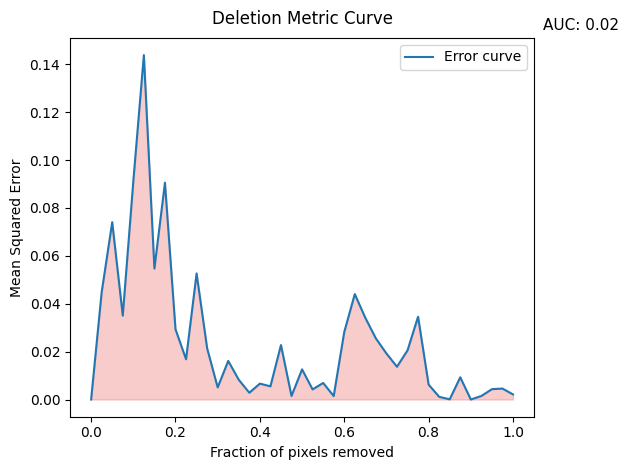

Errors: [0.0, 0.044825833, 0.07406133, 0.035046075, 0.09114179, 0.14383498, 0.05468825, 0.090560995, 0.029322496, 0.016814115, 0.052648198, 0.021383923, 0.0050522606, 0.01612035, 0.00823227, 0.0028301964, 0.0066368775, 0.0054971743, 0.022737652, 0.0014815028, 0.0125877485, 0.0042172624, 0.0069148093, 0.0014478657, 0.028161364, 0.044024497, 0.03409056, 0.025507128, 0.01921308, 0.013679248, 0.020527441, 0.034568664, 0.0062193675, 0.0011202312, 7.909628e-05, 0.009274391, 8.79729e-07, 0.001476524, 0.004312277, 0.004570527, 0.002125179]
AUC: 0.024899295329493046
############################################################# 

Deletion 8 top pixel for Instance nr 14 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (4, 4), (1, 3), (4, 2), (4, 7), (3, 2), (2, 4), (2, 2), (3, 7), (4, 6), (1, 2), (2, 7), (4, 5), (1, 7), (0, 3), (3, 6), (3, 5), (0, 2), (0, 7), (1, 4), (3, 1), (4, 1), (2, 6), (3, 0), (2, 1), (1, 6), (1, 1), (4, 0), (0, 6), (0, 4), (2, 5), (2, 0), (0, 1), (1, 5), (1, 0), (0,

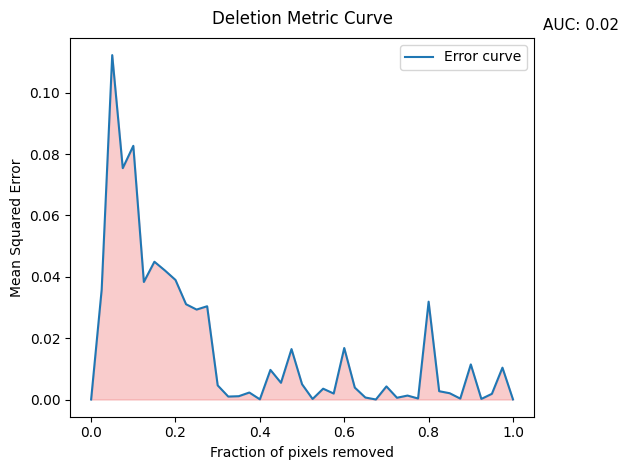

Errors: [0.0, 0.035825554, 0.11226732, 0.075417, 0.08269297, 0.0383179, 0.044910576, 0.04205305, 0.038968984, 0.031060211, 0.029316004, 0.030399406, 0.004608063, 0.0009594201, 0.0010767055, 0.002275465, 5.5895507e-05, 0.009655107, 0.005445494, 0.016434873, 0.0049761957, 0.000170661, 0.0035245328, 0.0019399174, 0.016786132, 0.003885513, 0.00064921076, 3.8084133e-06, 0.0042698663, 0.0005683063, 0.0012851362, 0.00032773384, 0.03189194, 0.0027044325, 0.0020449685, 0.00029575572, 0.011434908, 0.0001908423, 0.0018534968, 0.010377898, 2.6274038e-05]
AUC: 0.017523359859927725
############################################################# 

Deletion 8 top pixel for Instance nr 15 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (3, 4), (1, 3), (2, 4), (4, 4), (4, 7), (2, 2), (4, 2), (3, 7), (3, 2), (1, 2), (4, 6), (2, 7), (0, 3), (4, 5), (3, 5), (1, 7), (3, 6), (1, 4), (0, 2), (0, 7), (2, 6), (2, 5), (3, 1), (3, 0), (1, 6), (2, 1), (4, 1), (0, 4), (0, 6), (4, 0), (1, 1), (2, 0), (1, 5), (0, 1), 

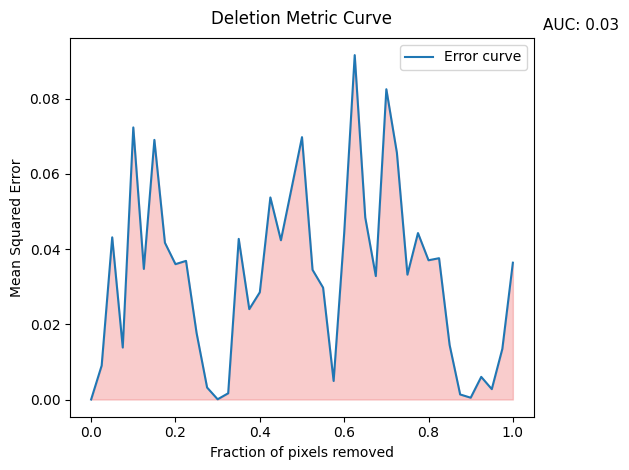

Errors: [0.0, 0.009017748, 0.043127958, 0.0138215935, 0.07235801, 0.034725964, 0.06904184, 0.041687235, 0.035993602, 0.0368652, 0.017709812, 0.003179777, 5.8934784e-05, 0.0016528353, 0.04271825, 0.024031552, 0.02852035, 0.05373769, 0.042353638, 0.056022063, 0.069766544, 0.034486063, 0.029746406, 0.0049292822, 0.044192716, 0.09158572, 0.04838197, 0.03282844, 0.08251139, 0.06562177, 0.03320625, 0.04426128, 0.03702764, 0.037575874, 0.014502996, 0.0013424058, 0.00047732308, 0.0060179033, 0.0027581602, 0.013455515, 0.036382947]
AUC: 0.03348727926186257
############################################################# 

Deletion 8 top pixel for Instance nr 16 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (4, 2), (2, 2), (3, 2), (0, 3), (1, 2), (4, 7), (2, 7), (0, 2), (1, 7), (3, 7), (4, 5), (4, 6), (3, 5), (1, 4), (3, 6), (0, 7), (2, 6), (2, 5), (1, 6), (0, 4), (2, 1), (3, 1), (3, 0), (0, 6), (4, 1), (1, 1), (2, 0), (0, 1), (1, 5), (4, 0), (1, 0), (0, 5), (0, 0

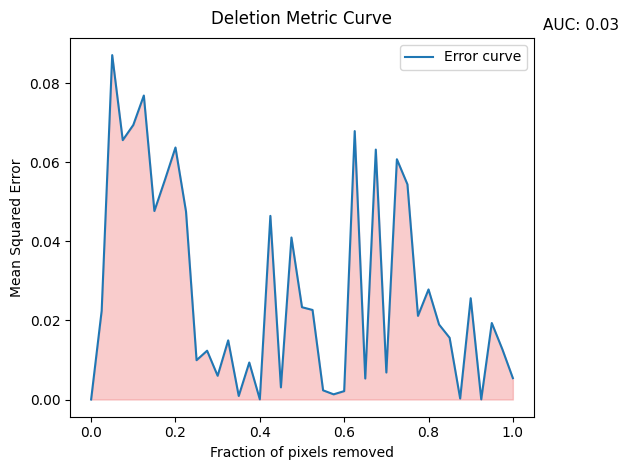

Errors: [0.0, 0.022447417, 0.08714986, 0.065631695, 0.069471, 0.07692399, 0.047697414, 0.055579, 0.06377055, 0.04755485, 0.009947075, 0.012347863, 0.0060030147, 0.014966308, 0.00089562626, 0.009358952, 4.31349e-05, 0.04647054, 0.0030705817, 0.04099811, 0.023352893, 0.022659974, 0.0023216498, 0.0013101673, 0.0021219873, 0.06792561, 0.0053083887, 0.06324455, 0.0068299593, 0.06079858, 0.054444898, 0.021162169, 0.02785029, 0.018974513, 0.015624151, 0.00025132668, 0.025627596, 3.431342e-05, 0.019356344, 0.0127353, 0.0054067164]
AUC: 0.028374124969559485
############################################################# 

Deletion 8 top pixel for Instance nr 17 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (4, 7), (4, 2), (2, 2), (3, 7), (0, 3), (3, 2), (4, 6), (1, 2), (4, 5), (2, 7), (0, 2), (3, 6), (3, 5), (1, 7), (1, 4), (0, 7), (4, 1), (3, 1), (2, 6), (3, 0), (4, 0), (0, 4), (2, 1), (1, 6), (2, 5), (0, 6), (1, 1), (2, 0), (0, 1), (1, 5), (1, 0), (0, 5), (0, 

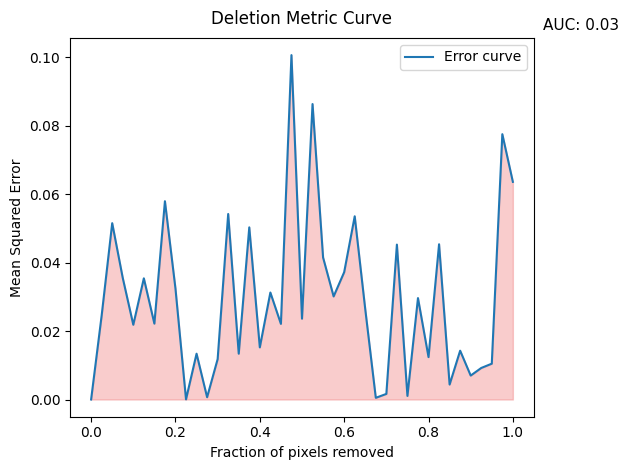

Errors: [0.0, 0.024574438, 0.05154946, 0.03554827, 0.021850117, 0.03542902, 0.022187304, 0.057971966, 0.032433294, 4.1077437e-05, 0.013391899, 0.00066809607, 0.01180365, 0.05423745, 0.013392657, 0.050330076, 0.015241311, 0.031274814, 0.022107506, 0.100688875, 0.023624275, 0.08638247, 0.041519314, 0.030136863, 0.037221957, 0.053562876, 0.026385574, 0.0004909623, 0.0016373292, 0.045288596, 0.0010480697, 0.029645232, 0.0123993, 0.045387715, 0.0043726936, 0.014269464, 0.006997401, 0.009219483, 0.010472874, 0.07756953, 0.063631125]
AUC: 0.02960422055621165
############################################################# 

Deletion 8 top pixel for Instance nr 18 
Importants indices ->  [(3, 3), (4, 3), (2, 3), (3, 4), (4, 4), (1, 3), (4, 2), (4, 7), (3, 2), (2, 2), (1, 2), (2, 4), (0, 3), (4, 6), (3, 7), (4, 5), (0, 2), (1, 7), (2, 7), (3, 6), (3, 5), (1, 4), (0, 7), (4, 1), (3, 1), (2, 1), (3, 0), (1, 1), (0, 4), (4, 0), (1, 6), (2, 6), (2, 0), (0, 6), (0, 1), (2, 5), (1, 0), (1, 5), (0, 5), (

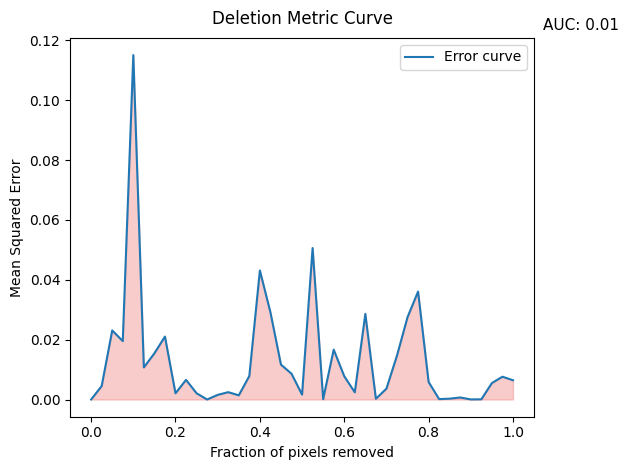

Errors: [0.0, 0.0044916323, 0.023080472, 0.019516205, 0.1151123, 0.010723915, 0.015443216, 0.021030992, 0.002077539, 0.006561497, 0.0020798761, 2.2321856e-06, 0.0015505273, 0.0024523914, 0.0013986491, 0.007843832, 0.04312969, 0.029154105, 0.01165819, 0.008618273, 0.0016330775, 0.05062689, 0.00011034544, 0.016663907, 0.007784346, 0.0024033044, 0.028616138, 0.000250047, 0.0036287392, 0.014677645, 0.02751725, 0.036071148, 0.0058476273, 0.0001308254, 0.0002839424, 0.0006767763, 2.5501331e-05, 7.3524876e-05, 0.0054954244, 0.007619896, 0.006430752]
AUC: 0.013481931538899518
############################################################# 

Deletion 8 top pixel for Instance nr 19 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (4, 7), (4, 2), (3, 2), (2, 2), (1, 2), (0, 3), (4, 6), (3, 7), (0, 2), (4, 5), (3, 5), (1, 4), (1, 7), (2, 7), (3, 6), (3, 0), (3, 1), (4, 1), (0, 7), (4, 0), (1, 1), (2, 1), (0, 4), (0, 1), (2, 0), (1, 6), (2, 5), (2, 6), (0, 6), (1, 0), 

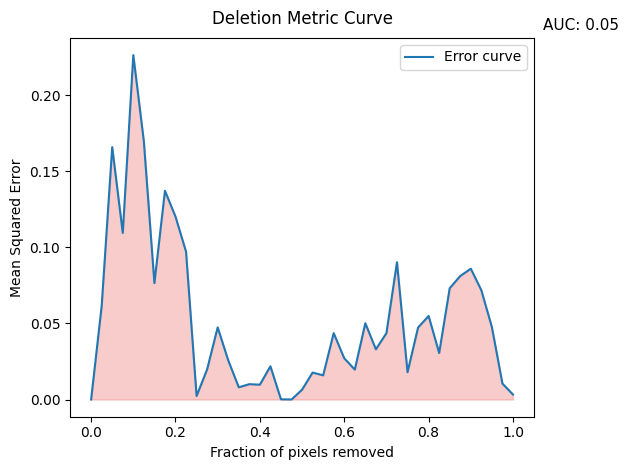

Errors: [0.0, 0.061458435, 0.16590309, 0.1094788, 0.22637314, 0.16967824, 0.076522335, 0.13719432, 0.120231114, 0.09713481, 0.0023223045, 0.019826839, 0.047411226, 0.025738057, 0.008029852, 0.010080346, 0.009746536, 0.021820435, 0.00011899243, 8.367212e-08, 0.006440961, 0.017716808, 0.015881345, 0.043620724, 0.027106373, 0.019656379, 0.050132234, 0.033020172, 0.04361216, 0.09023555, 0.017936582, 0.04730971, 0.054910492, 0.030564973, 0.07317119, 0.081181705, 0.085969955, 0.07181308, 0.04758254, 0.010454193, 0.0032554495]
AUC: 0.0544753453139144
############################################################# 

Deletion 8 top pixel for Instance nr 20 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (3, 4), (1, 3), (4, 4), (2, 4), (2, 2), (1, 2), (0, 3), (3, 2), (4, 7), (4, 2), (0, 2), (4, 6), (3, 7), (4, 5), (1, 4), (2, 7), (3, 5), (1, 7), (3, 6), (0, 7), (0, 4), (1, 1), (2, 1), (0, 1), (2, 6), (3, 0), (2, 5), (3, 1), (1, 6), (0, 6), (4, 1), (4, 0), (2, 0), (1, 5), (1, 0), (0, 5), (0, 0)] 


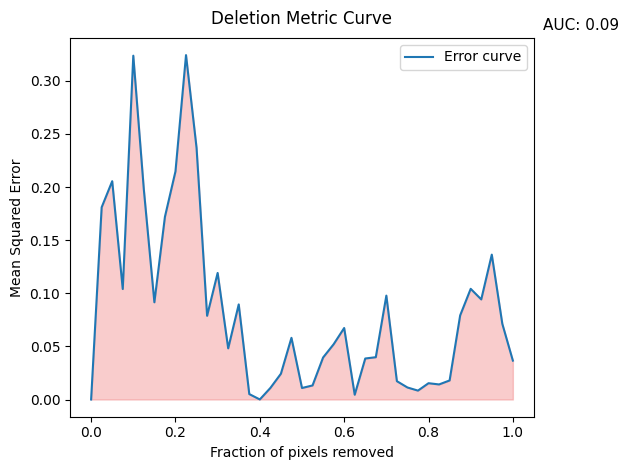

Errors: [0.0, 0.18095164, 0.2055138, 0.10400671, 0.32366464, 0.1976877, 0.09152076, 0.1719775, 0.2147379, 0.32420823, 0.23692046, 0.07881958, 0.11915082, 0.048142765, 0.08953441, 0.0051097195, 4.562391e-05, 0.010857591, 0.024260506, 0.058055606, 0.010831584, 0.013232653, 0.03952086, 0.052002095, 0.067306735, 0.00448914, 0.0385956, 0.039819572, 0.09778515, 0.017256482, 0.011322333, 0.008367667, 0.015342703, 0.014183867, 0.017930243, 0.0791524, 0.10418447, 0.09422063, 0.13639197, 0.071219705, 0.03660731]
AUC: 0.08591563693016724
############################################################# 

Deletion 8 top pixel for Instance nr 21 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (1, 2), (2, 2), (4, 2), (4, 7), (3, 2), (0, 2), (4, 6), (1, 4), (3, 7), (4, 5), (3, 5), (1, 7), (2, 7), (3, 6), (0, 7), (2, 5), (0, 4), (2, 1), (1, 6), (1, 1), (0, 6), (2, 6), (3, 1), (3, 0), (4, 1), (0, 1), (1, 5), (4, 0), (2, 0), (0, 5), (1, 0), (0, 0)] 

Original predict

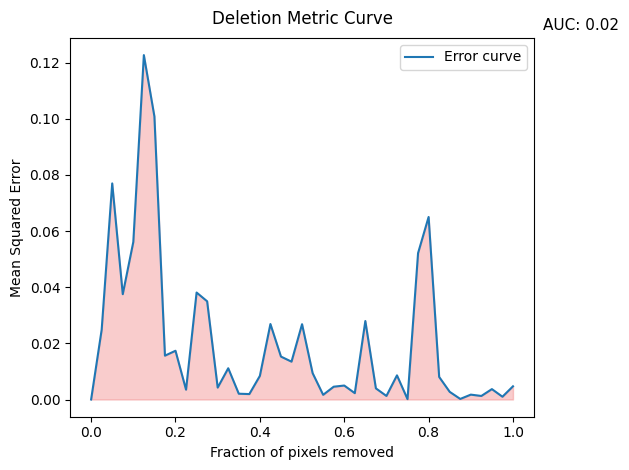

Errors: [0.0, 0.02486055, 0.07698613, 0.03752323, 0.056134675, 0.122691646, 0.10085186, 0.01562196, 0.017363086, 0.0034945472, 0.03810961, 0.034985423, 0.0042488524, 0.011133768, 0.002062916, 0.0019351424, 0.008410085, 0.02688823, 0.015287882, 0.013482479, 0.026829816, 0.009409879, 0.0016650611, 0.0045599677, 0.0049751196, 0.0022610272, 0.027954316, 0.003967298, 0.0012696064, 0.008602454, 0.00013027512, 0.0521616, 0.065029375, 0.008035291, 0.0027264727, 0.00020244578, 0.0017371759, 0.0012635142, 0.0037031535, 0.0009922977, 0.0047010216]
AUC: 0.02104746829354554
############################################################# 

Deletion 8 top pixel for Instance nr 22 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (4, 4), (2, 2), (1, 2), (0, 3), (4, 7), (1, 4), (3, 2), (4, 6), (0, 2), (4, 2), (4, 5), (3, 7), (3, 5), (2, 7), (1, 7), (3, 6), (0, 7), (0, 4), (2, 5), (2, 6), (1, 6), (1, 1), (2, 1), (1, 5), (0, 6), (3, 0), (0, 1), (4, 0), (3, 1), (4, 1), (2, 0), (0, 5),

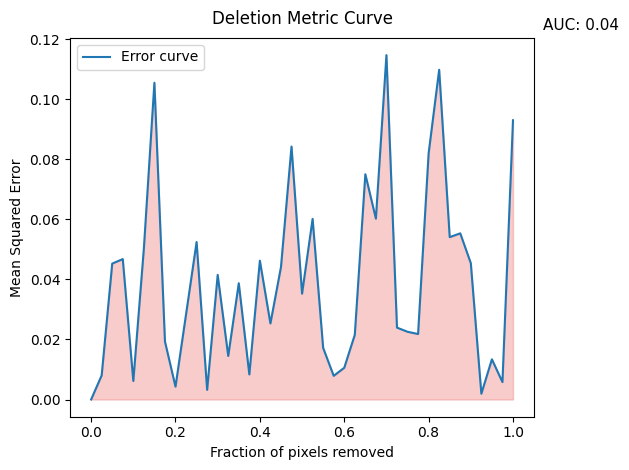

Errors: [0.0, 0.008035387, 0.0452906, 0.046800237, 0.0061693317, 0.050287295, 0.10556437, 0.019331126, 0.0042870753, 0.028388858, 0.05248544, 0.0032167886, 0.041526847, 0.014513995, 0.03874157, 0.0083566345, 0.04625475, 0.0253462, 0.044129185, 0.0843094, 0.03527152, 0.06020329, 0.017202232, 0.007885326, 0.010573186, 0.021552946, 0.07507645, 0.060279336, 0.114775315, 0.023954274, 0.022572292, 0.021821633, 0.08203115, 0.10988774, 0.054109957, 0.05538076, 0.04543085, 0.0019249824, 0.013395817, 0.0058059325, 0.09306308]
AUC: 0.03896754080487881
############################################################# 

Deletion 8 top pixel for Instance nr 23 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (4, 4), (0, 3), (2, 2), (1, 2), (1, 4), (3, 2), (0, 2), (4, 7), (4, 2), (4, 6), (1, 7), (3, 7), (4, 5), (2, 7), (0, 7), (3, 5), (0, 4), (3, 6), (1, 6), (0, 6), (2, 5), (2, 6), (1, 5), (2, 1), (1, 1), (3, 0), (3, 1), (4, 1), (0, 1), (4, 0), (0, 5), (2, 0), (1, 0), (0, 0)] 

Or

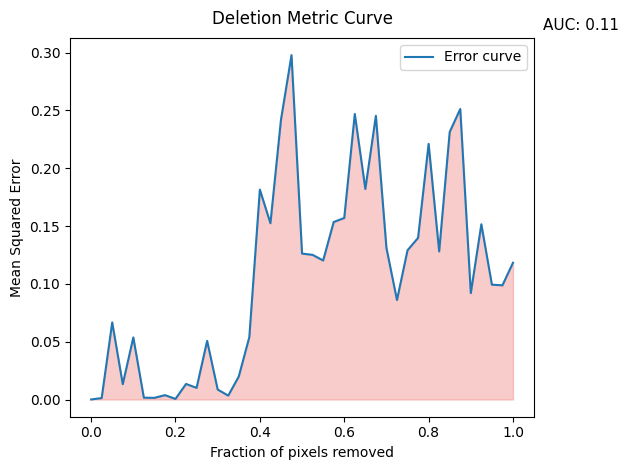

Errors: [0.0, 0.0012532468, 0.0666328, 0.013233037, 0.053684033, 0.0015809424, 0.0014276742, 0.0037627679, 0.0005097823, 0.013449266, 0.0100596985, 0.050689567, 0.0086314585, 0.0033523077, 0.019918544, 0.053938195, 0.18145254, 0.15237898, 0.24180675, 0.29775703, 0.12615098, 0.12505448, 0.1201678, 0.15345202, 0.1569485, 0.24687053, 0.18204817, 0.24525614, 0.1310552, 0.08599124, 0.12901406, 0.13975887, 0.22101271, 0.12803522, 0.23134787, 0.2511578, 0.09199329, 0.15148841, 0.099280134, 0.098734476, 0.11821767]
AUC: 0.10873613396688597
############################################################# 

Deletion 8 top pixel for Instance nr 24 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (2, 4), (3, 4), (0, 3), (1, 2), (4, 4), (1, 4), (2, 2), (0, 2), (4, 7), (1, 7), (2, 7), (3, 7), (3, 2), (4, 6), (4, 2), (0, 7), (4, 5), (0, 4), (3, 5), (3, 6), (2, 5), (1, 6), (2, 6), (0, 6), (1, 5), (1, 1), (3, 0), (2, 1), (0, 1), (4, 0), (0, 5), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original pr

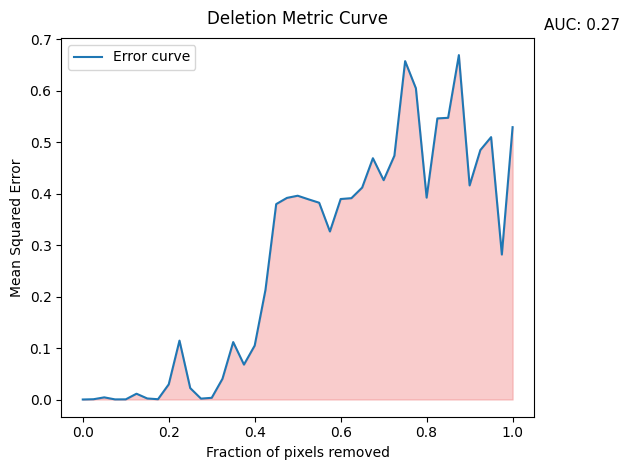

Errors: [0.0, 0.000526891, 0.0041602007, 0.00020145305, 0.00028366526, 0.01123422, 0.0020155658, 0.00054899795, 0.029422257, 0.114360355, 0.022179065, 0.0017145881, 0.0032874686, 0.040227316, 0.11153688, 0.06778417, 0.104773015, 0.21266872, 0.37951437, 0.39155024, 0.3957858, 0.38883555, 0.3821635, 0.3263479, 0.38937178, 0.39104033, 0.41159642, 0.46863046, 0.4259847, 0.47352865, 0.65719765, 0.6044783, 0.39207616, 0.54595834, 0.5471007, 0.66888875, 0.41575822, 0.48448002, 0.5096171, 0.28156996, 0.5289572]
AUC: 0.2730719586135819
############################################################# 

Deletion 8 top pixel for Instance nr 25 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (4, 4), (0, 3), (1, 4), (1, 2), (2, 2), (4, 7), (3, 5), (4, 5), (3, 7), (0, 2), (4, 6), (3, 2), (2, 7), (0, 4), (3, 6), (1, 7), (4, 2), (2, 5), (0, 7), (2, 6), (1, 6), (1, 5), (0, 6), (0, 5), (4, 0), (3, 0), (1, 1), (0, 1), (2, 1), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original predict

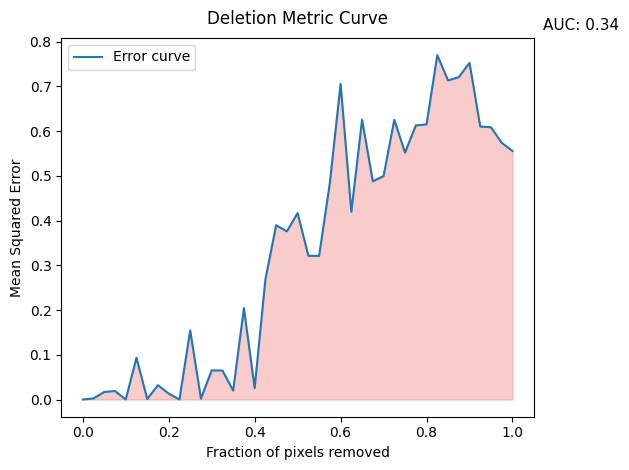

Errors: [0.0, 0.0024940383, 0.016890144, 0.018944867, 0.00023894571, 0.093220025, 0.0011544387, 0.031988665, 0.013131672, 6.2560764e-05, 0.15447384, 0.0018844956, 0.06508794, 0.06478598, 0.019938873, 0.20428582, 0.02539384, 0.2684952, 0.38964692, 0.37589183, 0.4165997, 0.3213105, 0.32101297, 0.48421288, 0.70564824, 0.41971153, 0.6253069, 0.48766392, 0.4995829, 0.6253145, 0.5519165, 0.61265016, 0.6150915, 0.76991326, 0.71331686, 0.72049, 0.75248426, 0.6102742, 0.60866034, 0.57386035, 0.5555677]
AUC: 0.33652038260443073
############################################################# 

Deletion 8 top pixel for Instance nr 26 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (1, 2), (0, 3), (2, 2), (4, 3), (1, 4), (2, 7), (4, 4), (1, 7), (3, 7), (3, 5), (3, 6), (4, 6), (2, 6), (2, 5), (4, 7), (0, 2), (4, 5), (0, 7), (3, 2), (4, 2), (1, 6), (0, 4), (1, 1), (2, 0), (1, 5), (2, 1), (1, 0), (3, 0), (0, 6), (0, 1), (3, 1), (0, 0), (0, 5), (4, 0), (4, 1)] 

Original prediction: [1.9

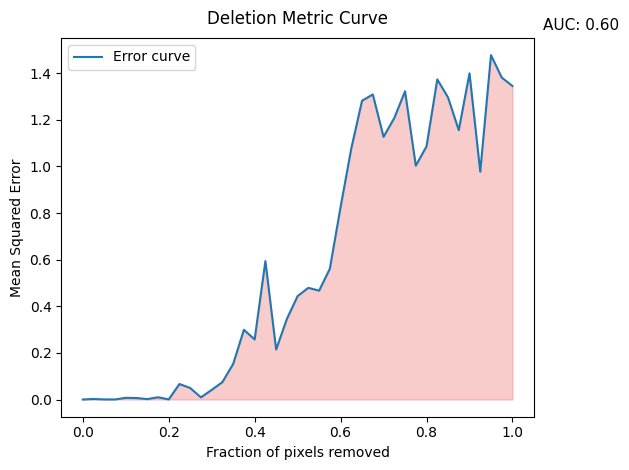

Errors: [0.0, 0.0022352813, 0.00034988634, 0.00019251584, 0.007142539, 0.0064720586, 0.0016878111, 0.009651452, 0.00037752188, 0.0664912, 0.049309306, 0.009199977, 0.04125938, 0.074822836, 0.15253174, 0.29893237, 0.25769076, 0.59384656, 0.21437888, 0.3458049, 0.44362557, 0.47920728, 0.4669108, 0.561251, 0.82608277, 1.078163, 1.2819775, 1.3087721, 1.1267809, 1.2079194, 1.3222233, 1.0031009, 1.0861572, 1.3733732, 1.2960525, 1.1556287, 1.3993806, 0.9771571, 1.4775397, 1.3812878, 1.3448746]
AUC: 0.6014351347534101
############################################################# 

Deletion 8 top pixel for Instance nr 27 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (4, 6), (4, 5), (4, 7), (0, 2), (3, 5), (3, 2), (3, 7), (1, 7), (2, 7), (3, 6), (0, 4), (4, 2), (0, 7), (2, 5), (1, 6), (2, 6), (1, 5), (0, 6), (0, 5), (3, 0), (4, 0), (2, 1), (1, 1), (0, 1), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.22936]
In

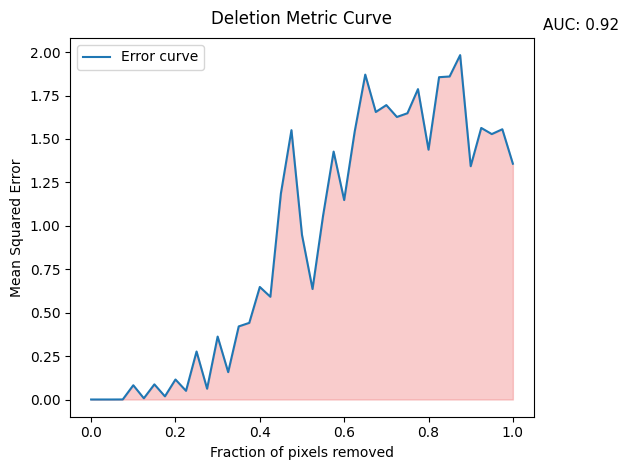

Errors: [0.0, 3.4894597e-06, 3.117841e-05, 0.0002257763, 0.082122, 0.0069788857, 0.08716999, 0.018122917, 0.11516375, 0.04993073, 0.27631107, 0.06204842, 0.36230296, 0.15752502, 0.42075878, 0.44121084, 0.64785063, 0.5913893, 1.186564, 1.5505549, 0.9473627, 0.6361293, 1.0585337, 1.4272728, 1.1481234, 1.543198, 1.870449, 1.6551975, 1.6948633, 1.6265887, 1.6479638, 1.7868372, 1.4382017, 1.8555294, 1.8595858, 1.9826483, 1.3429031, 1.5634049, 1.5280082, 1.5558141, 1.3574747]
AUC: 0.9225904194939516
############################################################# 

Deletion 8 top pixel for Instance nr 28 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (4, 3), (4, 4), (0, 3), (1, 4), (1, 2), (1, 7), (2, 2), (2, 7), (4, 7), (3, 7), (0, 2), (3, 5), (4, 5), (4, 6), (0, 4), (3, 2), (4, 2), (0, 7), (2, 5), (3, 6), (1, 6), (2, 6), (1, 5), (0, 6), (4, 0), (0, 5), (3, 0), (4, 1), (3, 1), (1, 1), (0, 1), (2, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.3856835]
Initial Predictio

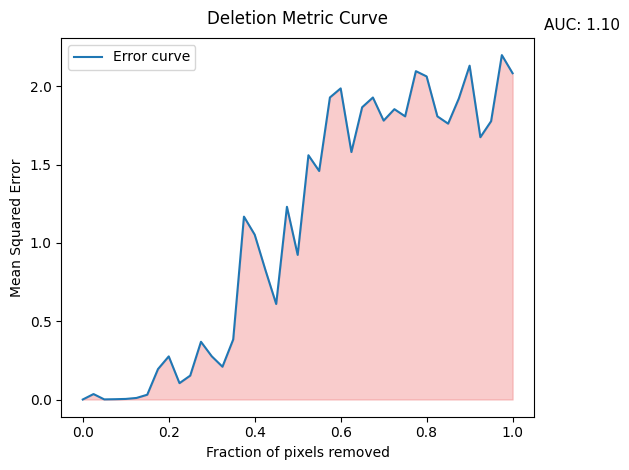

Errors: [0.0, 0.034797043, 0.0007071353, 0.0018827158, 0.00364295, 0.009915189, 0.030498775, 0.19436471, 0.27547017, 0.10445315, 0.15269734, 0.36886925, 0.27634692, 0.20946944, 0.38367856, 1.1684344, 1.0531849, 0.8266987, 0.6101914, 1.2312393, 0.9240826, 1.5606853, 1.4599805, 1.9299617, 1.987834, 1.5810587, 1.8673536, 1.9295692, 1.7819947, 1.8550777, 1.8091406, 2.0979884, 2.064267, 1.8091816, 1.7625186, 1.9238231, 2.1330297, 1.6758262, 1.7782267, 2.2004967, 2.0847514]
AUC: 1.1027753544563892
############################################################# 

Deletion 8 top pixel for Instance nr 29 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (4, 4), (1, 2), (0, 2), (2, 2), (1, 7), (0, 4), (4, 7), (3, 7), (4, 6), (2, 7), (4, 5), (3, 2), (0, 7), (4, 2), (3, 5), (3, 6), (1, 6), (2, 5), (2, 6), (4, 0), (0, 6), (1, 5), (3, 0), (4, 1), (0, 5), (3, 1), (0, 1), (2, 1), (1, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [2.5965407]
Initial Prediction 

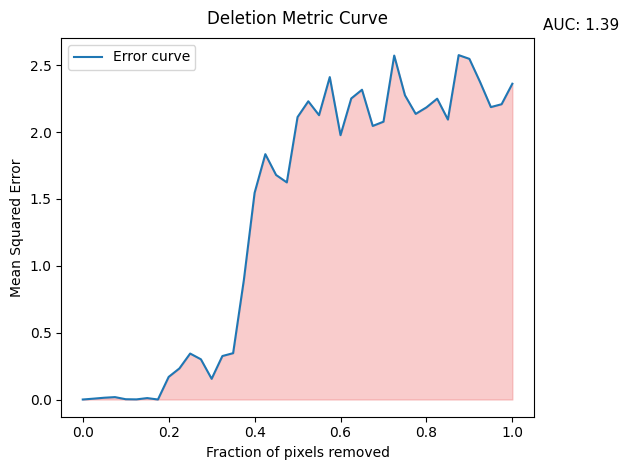

Errors: [0.0, 0.006317022, 0.013242336, 0.017878912, 0.0020502983, 0.0009082138, 0.010576643, 1.7985612e-06, 0.16907685, 0.23257975, 0.34373668, 0.30076942, 0.15467536, 0.3252183, 0.34652704, 0.89373946, 1.5455662, 1.8350244, 1.6794325, 1.6237973, 2.1125314, 2.2304633, 2.1266308, 2.4115705, 1.977004, 2.2517617, 2.3168657, 2.0460637, 2.0779238, 2.5725126, 2.2755682, 2.1362646, 2.184892, 2.2501473, 2.0938292, 2.5759466, 2.5479057, 2.3738048, 2.1871028, 2.2086523, 2.361949]
AUC: 1.3909883444620164
############################################################# 

Deletion 8 top pixel for Instance nr 30 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (1, 4), (0, 3), (2, 2), (1, 2), (4, 4), (0, 2), (3, 2), (1, 7), (3, 5), (3, 7), (4, 7), (2, 7), (4, 6), (3, 6), (2, 5), (0, 4), (4, 5), (2, 6), (4, 2), (0, 7), (1, 6), (1, 5), (3, 0), (0, 6), (4, 0), (1, 1), (2, 1), (2, 0), (0, 5), (3, 1), (0, 1), (4, 1), (1, 0), (0, 0)] 

Original prediction: [2.8591979]
Initial Predicti

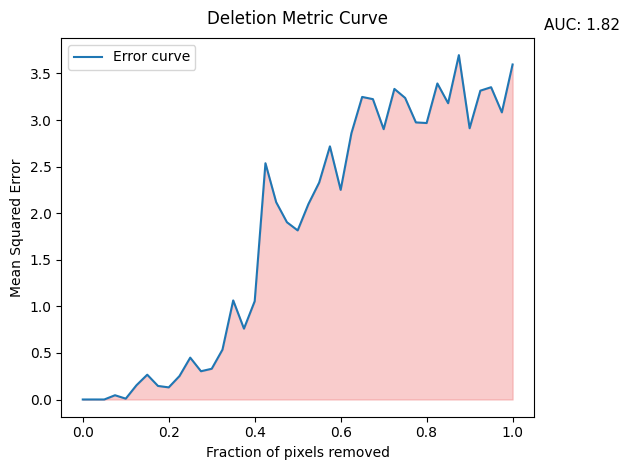

Errors: [0.0, 0.00019488504, 2.8999953e-05, 0.04585826, 0.009108003, 0.15334861, 0.2661323, 0.14550588, 0.13017288, 0.25180736, 0.44934076, 0.30340964, 0.32999283, 0.5349906, 1.0635825, 0.7606979, 1.0551602, 2.5361981, 2.1175063, 1.9026161, 1.814963, 2.098078, 2.328689, 2.717154, 2.25022, 2.8580136, 3.2475142, 3.224049, 2.9016743, 3.3337963, 3.2370398, 2.9742389, 2.967508, 3.3922586, 3.1801577, 3.6965363, 2.9114203, 3.3148787, 3.351895, 3.0819204, 3.5959837]
AUC: 1.8183912400780626
############################################################# 

Deletion 8 top pixel for Instance nr 31 
Importants indices ->  [(2, 3), (1, 3), (2, 4), (1, 4), (3, 3), (3, 4), (0, 3), (1, 7), (1, 2), (2, 2), (2, 7), (2, 5), (3, 5), (2, 6), (4, 4), (3, 6), (0, 4), (4, 3), (0, 2), (1, 5), (3, 2), (1, 6), (4, 5), (0, 7), (4, 6), (3, 7), (2, 1), (1, 1), (3, 0), (0, 6), (4, 7), (3, 1), (4, 0), (0, 5), (2, 0), (4, 2), (0, 1), (1, 0), (4, 1), (0, 0)] 

Original prediction: [2.8937619]
Initial Prediction with Origi

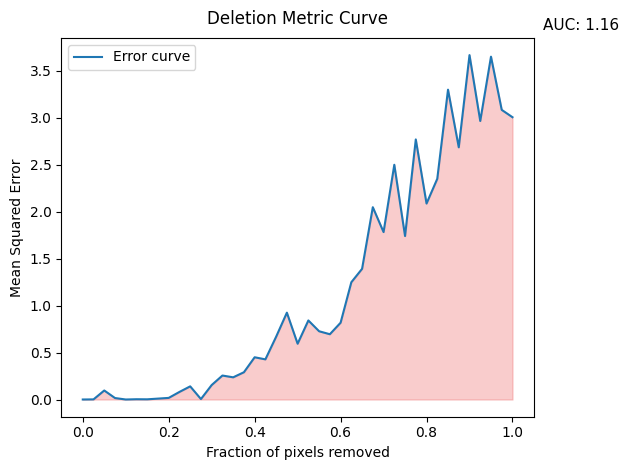

Errors: [0.0, 0.0012629125, 0.09605385, 0.015704673, 2.2776533e-06, 0.0028546206, 0.001981703, 0.00951901, 0.017091308, 0.080746174, 0.14005123, 0.004760803, 0.15403841, 0.25537923, 0.23632933, 0.290382, 0.44996813, 0.427625, 0.6687677, 0.92521536, 0.5943471, 0.84221494, 0.7271156, 0.69548976, 0.8180392, 1.2494099, 1.3922738, 2.0488222, 1.7837739, 2.5007834, 1.7416588, 2.770798, 2.0878694, 2.3516502, 3.3008485, 2.6870446, 3.669266, 2.9675832, 3.6527116, 3.0857933, 3.0076642]
AUC: 1.156226479520825
############################################################# 

Deletion 8 top pixel for Instance nr 32 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (0, 3), (1, 4), (4, 3), (2, 2), (1, 2), (4, 4), (2, 7), (1, 7), (0, 4), (0, 2), (3, 2), (0, 7), (3, 7), (3, 5), (4, 5), (4, 6), (3, 6), (2, 6), (1, 6), (2, 5), (4, 2), (4, 7), (0, 6), (1, 5), (0, 5), (3, 0), (4, 0), (3, 1), (2, 1), (1, 1), (4, 1), (0, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.926362]
Initial Predic

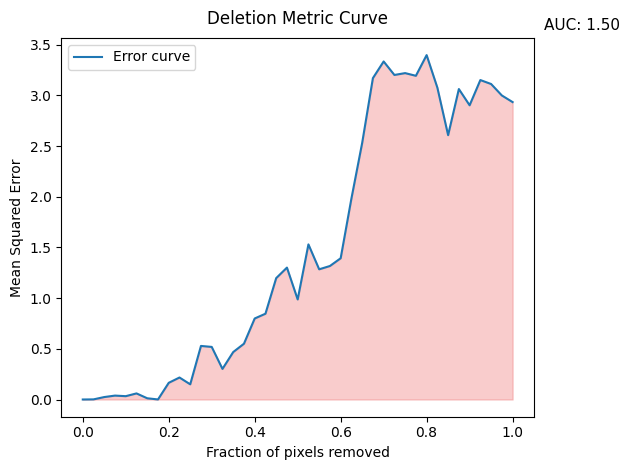

Errors: [0.0, 0.0012011077, 0.0241763, 0.03857181, 0.0328554, 0.0600711, 0.012141397, 0.000470348, 0.16459711, 0.21689306, 0.14970504, 0.5282351, 0.5186936, 0.30182657, 0.46787885, 0.5501768, 0.79902464, 0.84606194, 1.1971229, 1.3007991, 0.9868535, 1.5297532, 1.2840827, 1.316595, 1.3930867, 1.9817343, 2.5294647, 3.1694872, 3.3337936, 3.2007344, 3.21899, 3.192492, 3.3965108, 3.0753129, 2.6070085, 3.0618567, 2.9016304, 3.1504536, 3.1115515, 2.998549, 2.933231]
AUC: 1.5029264620956382
############################################################# 

Deletion 8 top pixel for Instance nr 33 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (1, 4), (2, 2), (1, 2), (4, 3), (4, 7), (4, 6), (2, 7), (0, 4), (3, 7), (1, 7), (0, 2), (4, 4), (3, 5), (3, 2), (3, 6), (4, 5), (0, 7), (2, 5), (2, 6), (3, 0), (0, 6), (1, 6), (1, 5), (4, 0), (4, 2), (0, 5), (2, 0), (1, 1), (2, 1), (3, 1), (0, 1), (4, 1), (1, 0), (0, 0)] 

Original prediction: [2.933412]
Initial Prediction with Origin

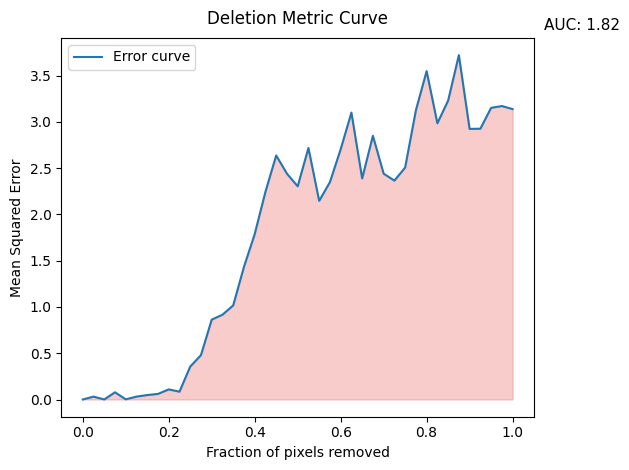

Errors: [0.0, 0.03135105, 0.00040546324, 0.077998884, 0.0018053196, 0.03128, 0.048139885, 0.06036679, 0.10922277, 0.08450924, 0.35557044, 0.47985926, 0.862977, 0.91620225, 1.017123, 1.4332095, 1.7870412, 2.2446449, 2.6369147, 2.439999, 2.303502, 2.7178855, 2.1465046, 2.3488033, 2.7037153, 3.1002069, 2.3885453, 2.8491092, 2.440228, 2.3648493, 2.5063126, 3.124753, 3.54812, 2.984373, 3.2292867, 3.7210467, 2.9236484, 2.9258878, 3.151349, 3.1709003, 3.1378756]
AUC: 1.8209146420929756
############################################################# 

Deletion 8 top pixel for Instance nr 34 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (2, 2), (1, 2), (4, 3), (0, 2), (0, 7), (4, 7), (0, 4), (4, 4), (1, 7), (4, 6), (3, 2), (3, 7), (4, 5), (2, 7), (0, 6), (1, 6), (3, 5), (3, 6), (2, 5), (1, 5), (4, 2), (2, 6), (0, 5), (0, 1), (1, 1), (4, 0), (2, 1), (3, 0), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.8747725]
Initial Prediction with Original

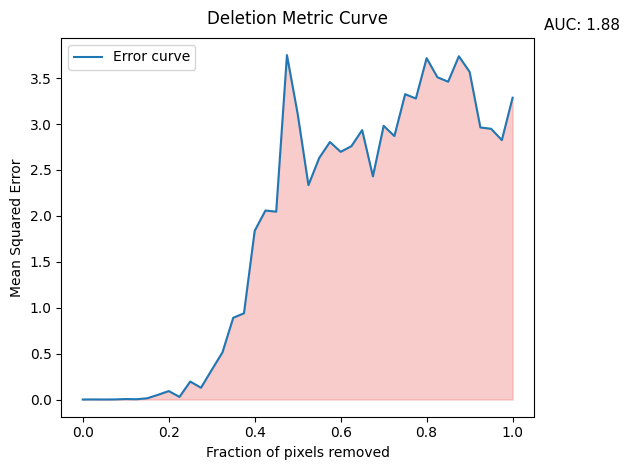

Errors: [0.0, 0.00076562376, 4.6469635e-05, 0.0007614075, 0.00507778, 0.0028259044, 0.013415085, 0.051154625, 0.09185956, 0.028539296, 0.19555555, 0.12822054, 0.3221251, 0.5134762, 0.8897618, 0.93897206, 1.8376387, 2.0578825, 2.045552, 3.7502153, 3.1091275, 2.3346114, 2.6297038, 2.8043044, 2.696742, 2.7590315, 2.9335394, 2.4300492, 2.9800677, 2.8688462, 3.324484, 3.2780113, 3.717057, 3.5095024, 3.4606364, 3.7377577, 3.5680878, 2.9625983, 2.9478786, 2.824727, 3.2865214]
AUC: 1.884846753358215
############################################################# 

Deletion 8 top pixel for Instance nr 35 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (2, 2), (4, 3), (0, 3), (1, 4), (1, 2), (3, 2), (4, 4), (2, 5), (3, 5), (4, 2), (0, 2), (1, 7), (4, 6), (3, 6), (2, 6), (0, 4), (4, 5), (4, 7), (2, 7), (3, 7), (1, 1), (1, 5), (1, 6), (0, 7), (2, 1), (0, 6), (2, 0), (3, 0), (4, 0), (0, 5), (0, 1), (3, 1), (1, 0), (4, 1), (0, 0)] 

Original prediction: [2.8691926]
Initial Prediction 

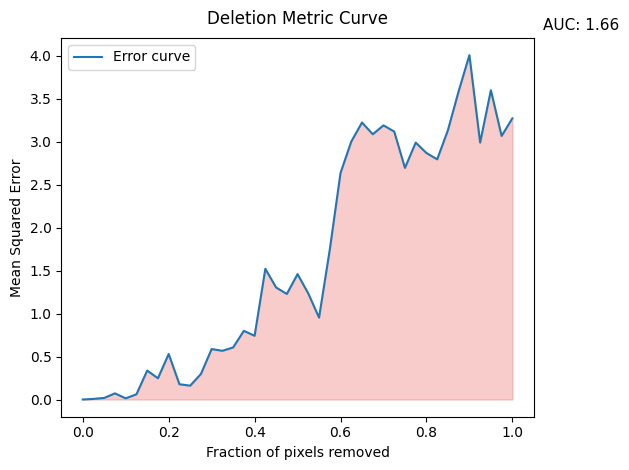

Errors: [0.0, 0.0070319665, 0.018420245, 0.0714435, 0.013420664, 0.06108168, 0.33688104, 0.24698457, 0.5298537, 0.17784578, 0.16098215, 0.29675382, 0.5870136, 0.56673944, 0.6055636, 0.7990413, 0.7413835, 1.5208336, 1.3035557, 1.2282345, 1.4590675, 1.2335764, 0.953157, 1.7438793, 2.6359508, 3.0012372, 3.223043, 3.0862765, 3.189745, 3.1178331, 2.6949162, 2.989058, 2.8684378, 2.7944493, 3.1334476, 3.5873275, 4.0072417, 2.9897168, 3.5983496, 3.0668461, 3.2714849]
AUC: 1.657059080817271
############################################################# 

Deletion 8 top pixel for Instance nr 36 
Importants indices ->  [(2, 3), (1, 3), (0, 3), (3, 3), (2, 4), (3, 4), (1, 2), (1, 4), (0, 2), (2, 2), (4, 3), (0, 7), (4, 4), (0, 4), (1, 7), (3, 5), (4, 7), (3, 2), (4, 6), (2, 5), (4, 5), (2, 7), (3, 7), (0, 6), (3, 6), (1, 6), (4, 2), (1, 5), (2, 6), (0, 5), (1, 1), (0, 1), (4, 0), (2, 1), (3, 0), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.6514237]
Initial Prediction with Origi

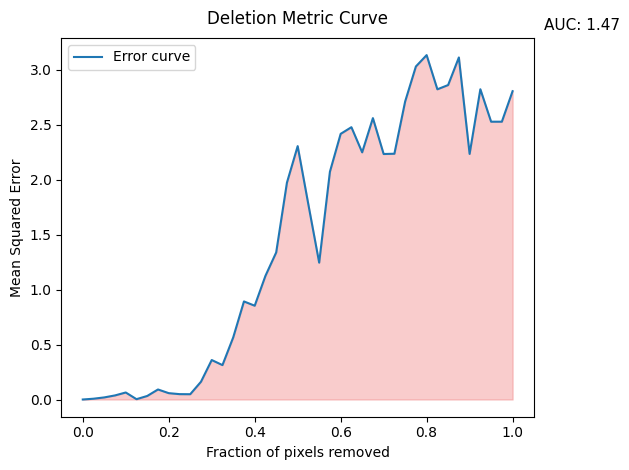

Errors: [0.0, 0.0071297097, 0.018990938, 0.037148416, 0.0637741, 0.0029227652, 0.032244, 0.09119524, 0.057724126, 0.048820645, 0.04804065, 0.16147862, 0.35893095, 0.31286684, 0.56451684, 0.89173615, 0.8528145, 1.1244575, 1.3373786, 1.9718933, 2.3040266, 1.7700863, 1.2445046, 2.0712128, 2.4156055, 2.4761128, 2.2474015, 2.5585885, 2.2322233, 2.234773, 2.7095644, 3.0281274, 3.1315732, 2.820614, 2.8592875, 3.1102588, 2.2330875, 2.8210955, 2.5261183, 2.5260777, 2.803474]
AUC: 1.4676535048231016
############################################################# 

Deletion 8 top pixel for Instance nr 37 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (1, 2), (2, 2), (4, 3), (0, 2), (4, 4), (0, 4), (4, 6), (4, 7), (3, 2), (4, 5), (1, 7), (3, 5), (3, 7), (2, 7), (3, 6), (4, 2), (2, 5), (0, 7), (1, 6), (2, 6), (1, 5), (0, 6), (0, 1), (0, 5), (1, 1), (2, 1), (3, 0), (4, 0), (3, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.4064517]
Initial Prediction wi

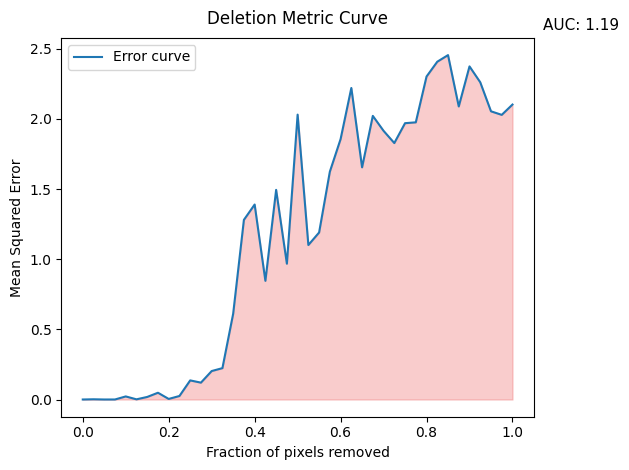

Errors: [0.0, 0.0015240168, 1.411684e-05, 0.000105015504, 0.021902801, 0.0012119897, 0.018230341, 0.048192944, 0.004032665, 0.025033962, 0.13613334, 0.12017308, 0.2028027, 0.22353151, 0.610958, 1.2803246, 1.3894882, 0.8457745, 1.4939189, 0.96781117, 2.0301554, 1.1009543, 1.1900923, 1.6235801, 1.8556718, 2.2201927, 1.654435, 2.021214, 1.9146943, 1.8275672, 1.969162, 1.975227, 2.301583, 2.4072201, 2.454299, 2.0884316, 2.3738263, 2.2606921, 2.0537953, 2.028506, 2.101925]
AUC: 1.1948356474983939
############################################################# 

Deletion 8 top pixel for Instance nr 38 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (1, 4), (3, 4), (4, 3), (2, 2), (1, 2), (0, 4), (0, 2), (4, 4), (4, 7), (4, 6), (3, 2), (0, 7), (1, 7), (4, 5), (3, 5), (3, 7), (2, 5), (4, 2), (0, 6), (2, 7), (1, 6), (3, 6), (1, 5), (0, 5), (2, 6), (1, 1), (0, 1), (2, 1), (3, 1), (4, 0), (4, 1), (3, 0), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.448687]
Initial Prediction w

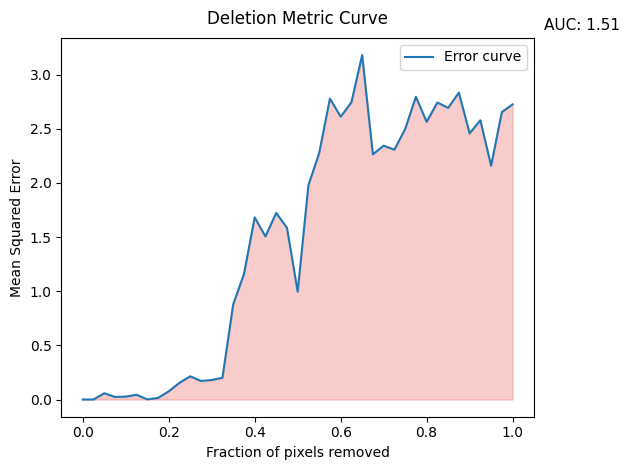

Errors: [0.0, 8.779409e-07, 0.057509173, 0.023476714, 0.02673313, 0.043823175, 0.0012002486, 0.014382754, 0.07548913, 0.15416719, 0.21409196, 0.17118566, 0.17980938, 0.20143479, 0.8789577, 1.1583006, 1.6813413, 1.505619, 1.7228159, 1.5857533, 0.99595624, 1.9795824, 2.2752306, 2.778917, 2.6112154, 2.7440636, 3.1801476, 2.2636728, 2.343591, 2.3068235, 2.4966443, 2.795863, 2.5638971, 2.742579, 2.6929593, 2.8338866, 2.4574692, 2.5784662, 2.1591828, 2.6536765, 2.7255952]
AUC: 1.5128178469558917
############################################################# 

Deletion 8 top pixel for Instance nr 39 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (3, 4), (2, 4), (0, 3), (2, 2), (4, 3), (1, 4), (1, 2), (4, 4), (2, 7), (4, 7), (3, 7), (3, 2), (0, 4), (3, 5), (4, 6), (2, 5), (3, 6), (1, 7), (2, 6), (0, 2), (4, 5), (4, 2), (1, 6), (0, 7), (1, 5), (0, 6), (2, 1), (0, 5), (1, 1), (4, 0), (3, 1), (3, 0), (4, 1), (0, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.3206868]
Initial Prediction wi

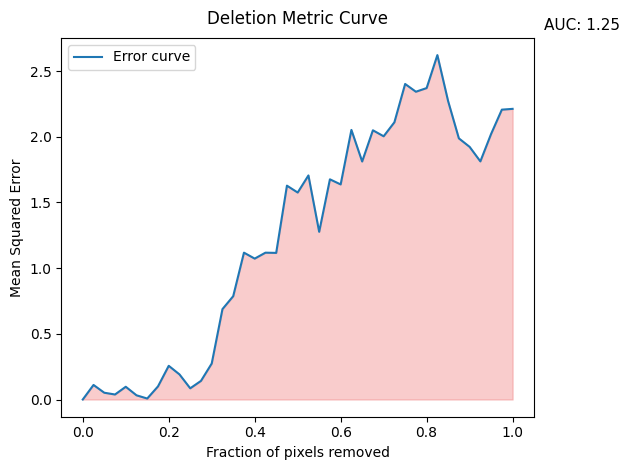

Errors: [0.0, 0.11080959, 0.05159678, 0.038111217, 0.09696131, 0.032009136, 0.007419921, 0.09973081, 0.25648236, 0.19105156, 0.085235074, 0.14168692, 0.27387413, 0.6881928, 0.78646636, 1.1178328, 1.0725114, 1.1176453, 1.1159632, 1.627826, 1.5755106, 1.7055575, 1.2764515, 1.6760377, 1.6371005, 2.0520654, 1.811724, 2.0493164, 2.0037184, 2.1102161, 2.401847, 2.342825, 2.3705506, 2.6215448, 2.2712824, 1.9878192, 1.9232081, 1.8125719, 2.0215085, 2.2063591, 2.2123933]
AUC: 1.2468704430270008
############################################################# 

Deletion 8 top pixel for Instance nr 40 
Importants indices ->  [(2, 3), (1, 3), (0, 3), (3, 3), (2, 4), (3, 4), (1, 4), (1, 2), (4, 3), (0, 4), (2, 2), (0, 2), (4, 4), (4, 6), (4, 7), (4, 5), (3, 2), (4, 2), (1, 7), (0, 7), (3, 5), (3, 7), (1, 5), (2, 5), (3, 6), (0, 5), (0, 6), (2, 7), (1, 6), (3, 1), (4, 1), (3, 0), (4, 0), (2, 1), (1, 1), (0, 1), (2, 6), (2, 0), (1, 0), (0, 0)] 

Original prediction: [2.2714343]
Initial Prediction with O

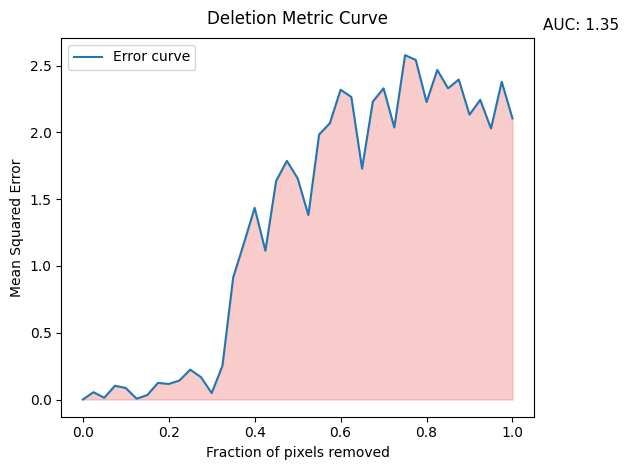

Errors: [0.0, 0.054812346, 0.013299409, 0.10305017, 0.0862629, 0.0066685164, 0.032947253, 0.12444505, 0.11655943, 0.14219128, 0.22379096, 0.16754363, 0.048317384, 0.25217095, 0.9133234, 1.1700021, 1.4353518, 1.1143584, 1.6365398, 1.787337, 1.656587, 1.3817493, 1.9846325, 2.069182, 2.319931, 2.26585, 1.7291619, 2.231089, 2.330294, 2.0373847, 2.5792441, 2.5429103, 2.2275007, 2.4682207, 2.330567, 2.3962822, 2.133421, 2.2443717, 2.0296016, 2.3795822, 2.1048503]
AUC: 1.3454739911714566
############################################################# 

Deletion 8 top pixel for Instance nr 41 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (1, 4), (3, 4), (0, 4), (1, 2), (4, 3), (2, 2), (0, 2), (4, 4), (0, 7), (4, 6), (4, 7), (1, 7), (4, 5), (3, 5), (3, 2), (2, 5), (0, 6), (3, 7), (4, 2), (2, 7), (0, 5), (1, 5), (3, 6), (1, 6), (2, 6), (4, 0), (4, 1), (2, 1), (1, 1), (3, 0), (3, 1), (0, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [2.1817462]
Initial Prediction with Origin

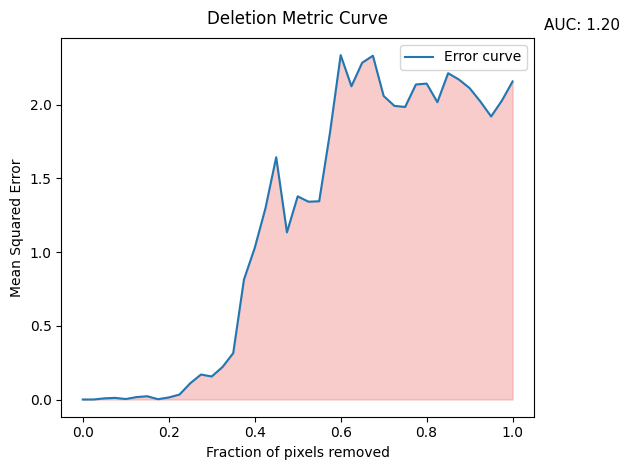

Errors: [0.0, 0.00010628492, 0.0077546723, 0.01123983, 0.0032485018, 0.016385349, 0.02213921, 0.0022104506, 0.013802288, 0.033657134, 0.11014036, 0.16941603, 0.15626061, 0.22033507, 0.31459007, 0.81406206, 1.0277076, 1.2974015, 1.6432607, 1.1338445, 1.3780552, 1.3417512, 1.3447007, 1.8077416, 2.3360665, 2.1246986, 2.2844603, 2.3317943, 2.059025, 1.9916878, 1.9844588, 2.136955, 2.142972, 2.016757, 2.2133796, 2.1705666, 2.112231, 2.0213542, 1.9200736, 2.027056, 2.1574805]
AUC: 1.1955521900221355
############################################################# 

Deletion 8 top pixel for Instance nr 42 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (1, 2), (2, 2), (0, 2), (4, 4), (0, 4), (4, 7), (4, 6), (3, 2), (0, 7), (4, 5), (1, 7), (3, 5), (4, 2), (3, 7), (2, 5), (2, 7), (3, 6), (0, 6), (1, 5), (1, 6), (2, 6), (0, 5), (0, 1), (4, 0), (1, 1), (3, 0), (4, 1), (3, 1), (2, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [2.013617]
Initial Prediction

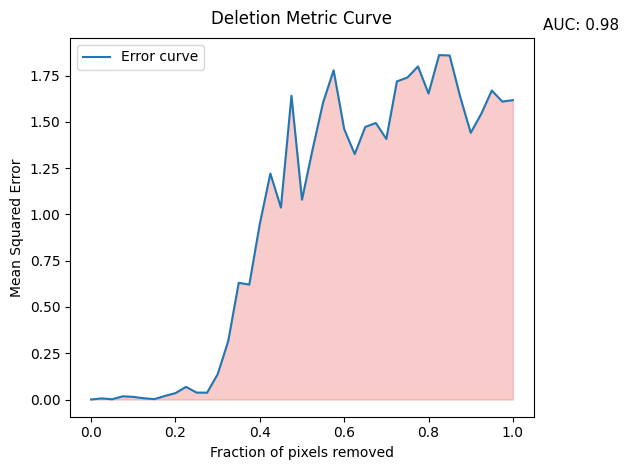

Errors: [0.0, 0.0059484793, 0.001355023, 0.017385053, 0.014281884, 0.006777226, 0.002150622, 0.019281302, 0.03456811, 0.068183824, 0.037441805, 0.03695805, 0.1363611, 0.3149963, 0.63087606, 0.6210144, 0.9500126, 1.221464, 1.0373504, 1.6419795, 1.0800773, 1.3508917, 1.6053587, 1.7795328, 1.4617928, 1.32643, 1.4731818, 1.4945912, 1.4082549, 1.7193333, 1.7403145, 1.8002241, 1.6539083, 1.8613923, 1.8595432, 1.6373503, 1.4413975, 1.5439854, 1.6700436, 1.6102694, 1.6178811]
AUC: 0.9781299844762543
############################################################# 

Deletion 8 top pixel for Instance nr 43 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (0, 3), (2, 2), (1, 4), (1, 2), (4, 3), (4, 4), (0, 4), (0, 2), (3, 2), (3, 5), (4, 5), (4, 6), (4, 7), (2, 5), (3, 7), (3, 6), (4, 2), (2, 7), (1, 7), (0, 7), (2, 6), (1, 5), (2, 1), (1, 6), (1, 1), (0, 5), (4, 0), (3, 0), (3, 1), (0, 6), (0, 1), (4, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.972982]
Initial Prediction w

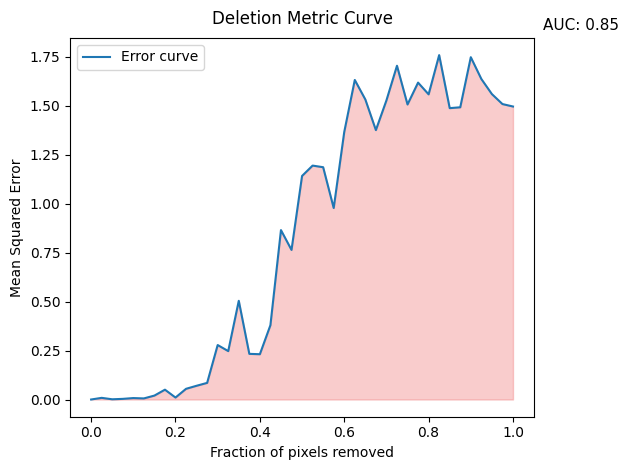

Errors: [0.0, 0.008417214, 0.0011215683, 0.0032356868, 0.007308844, 0.005529855, 0.01998947, 0.050198477, 0.010018324, 0.054595537, 0.07017465, 0.08486663, 0.27816913, 0.24715368, 0.5041392, 0.2331306, 0.23127438, 0.37955534, 0.8652021, 0.7640324, 1.1418177, 1.1947179, 1.1864076, 0.9780002, 1.3664304, 1.6320231, 1.532394, 1.3759812, 1.5277203, 1.7046117, 1.5068047, 1.6185471, 1.5585221, 1.75898, 1.4881121, 1.4924948, 1.7483151, 1.6369866, 1.5598826, 1.5090023, 1.4964453]
AUC: 0.8521021853433921
############################################################# 

Deletion 8 top pixel for Instance nr 44 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (1, 2), (2, 2), (4, 4), (0, 2), (0, 4), (3, 2), (4, 6), (4, 7), (4, 5), (4, 2), (3, 5), (1, 7), (0, 7), (2, 5), (3, 7), (1, 5), (2, 7), (3, 6), (0, 6), (0, 5), (1, 6), (4, 1), (3, 0), (1, 1), (0, 1), (4, 0), (3, 1), (2, 1), (2, 6), (1, 0), (0, 0), (2, 0)] 

Original prediction: [1.8961442]
Initial Predicti

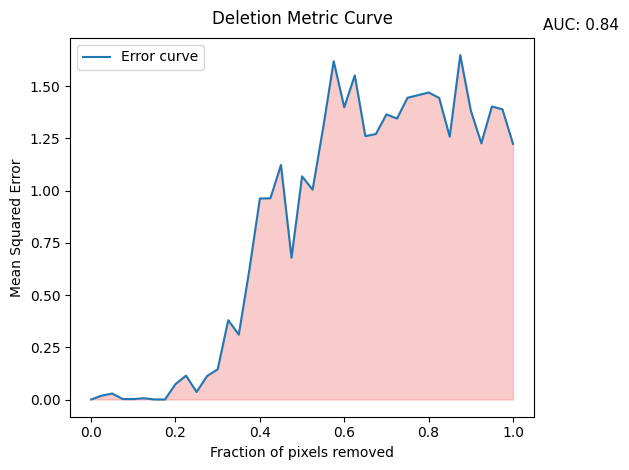

Errors: [0.0, 0.018392105, 0.028667038, 0.0021270697, 0.0021068088, 0.0059870835, 0.00023201645, 8.824817e-05, 0.07394436, 0.11416363, 0.036027625, 0.112672426, 0.14448915, 0.37966657, 0.3104556, 0.6196962, 0.9620333, 0.96326405, 1.122575, 0.6783875, 1.0681818, 1.0045108, 1.3005981, 1.6190692, 1.3988315, 1.5514858, 1.2604972, 1.2708478, 1.3647202, 1.3448524, 1.4443091, 1.4566464, 1.4694952, 1.4434191, 1.2582517, 1.648421, 1.3831549, 1.2262311, 1.4025017, 1.3889261, 1.2238092]
AUC: 0.8372957905292423
############################################################# 

Deletion 8 top pixel for Instance nr 45 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (2, 2), (1, 2), (0, 2), (4, 4), (0, 4), (4, 7), (3, 2), (1, 7), (4, 6), (0, 7), (3, 5), (4, 5), (4, 2), (3, 7), (2, 7), (2, 5), (3, 6), (1, 5), (0, 6), (1, 6), (0, 5), (2, 6), (3, 0), (0, 1), (3, 1), (2, 1), (1, 1), (4, 0), (4, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [1.9402927]
Initial Pre

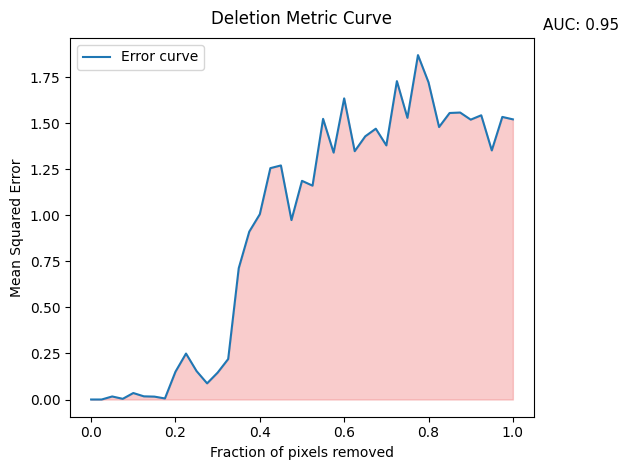

Errors: [0.0, 3.2556854e-06, 0.016524289, 0.0037079356, 0.03516309, 0.017198386, 0.015686752, 0.0056460374, 0.15081194, 0.24937621, 0.1542478, 0.08759243, 0.14596733, 0.21974277, 0.7125114, 0.91103363, 1.0054954, 1.2554959, 1.2701684, 0.97368723, 1.1865966, 1.160427, 1.5229801, 1.3397605, 1.6341802, 1.3475755, 1.4282721, 1.4695625, 1.378954, 1.7277428, 1.5284482, 1.8689083, 1.7211983, 1.4786341, 1.5547931, 1.5573032, 1.5186768, 1.5423605, 1.351714, 1.5334816, 1.5203044]
AUC: 0.9460445538108614
############################################################# 

Deletion 8 top pixel for Instance nr 46 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (1, 4), (4, 3), (4, 4), (1, 2), (0, 4), (0, 2), (2, 2), (4, 6), (4, 7), (0, 7), (1, 7), (4, 5), (3, 5), (3, 2), (3, 7), (4, 2), (2, 7), (2, 5), (3, 6), (1, 5), (0, 6), (0, 5), (1, 6), (0, 1), (2, 6), (1, 1), (3, 0), (4, 0), (3, 1), (2, 1), (4, 1), (0, 0), (2, 0), (1, 0)] 

Original prediction: [1.9556164]
Initial Predictio

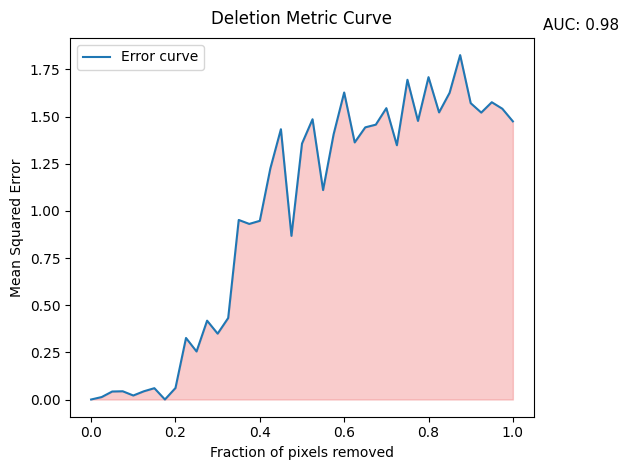

Errors: [0.0, 0.012940821, 0.04236078, 0.04364687, 0.021237794, 0.04354094, 0.060019337, 1.3798853e-05, 0.060935576, 0.3261777, 0.25455576, 0.4179849, 0.34907752, 0.43214062, 0.9519162, 0.9308741, 0.9472662, 1.2252566, 1.4330403, 0.86759645, 1.3568141, 1.48582, 1.1103846, 1.406301, 1.6276686, 1.3629956, 1.4428282, 1.4571133, 1.5445738, 1.3479376, 1.6951594, 1.4768193, 1.7090002, 1.5221105, 1.6260916, 1.825848, 1.5710835, 1.5210574, 1.576083, 1.5415772, 1.474629]
AUC: 0.9841290918506046
############################################################# 

Deletion 8 top pixel for Instance nr 47 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (0, 3), (3, 4), (4, 3), (1, 4), (2, 2), (1, 2), (4, 4), (0, 2), (0, 4), (3, 2), (0, 7), (4, 7), (4, 6), (1, 7), (4, 2), (4, 5), (3, 7), (3, 5), (2, 7), (3, 6), (0, 6), (2, 5), (1, 6), (1, 5), (4, 0), (0, 5), (4, 1), (2, 6), (3, 0), (3, 1), (2, 1), (0, 1), (1, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.7684658]
Initial Prediction with O

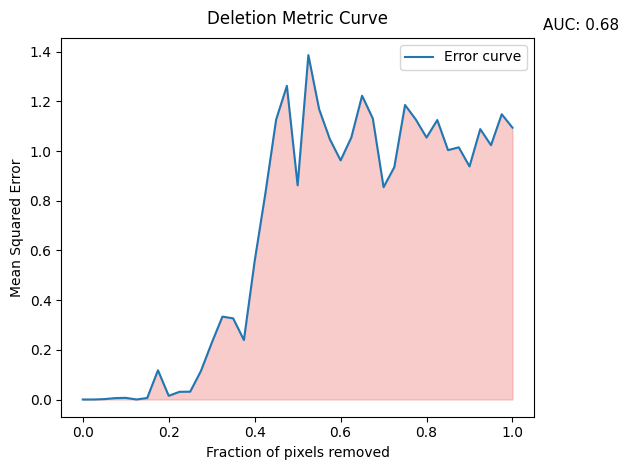

Errors: [0.0, 2.0090738e-05, 0.0016018571, 0.0056039803, 0.006749736, 8.0823134e-05, 0.006135278, 0.1176474, 0.014946131, 0.030958, 0.031497493, 0.11492414, 0.22750944, 0.33362257, 0.3266118, 0.2393907, 0.55707806, 0.83021677, 1.1269237, 1.2624094, 0.86205566, 1.3862865, 1.1688336, 1.0477015, 0.96261597, 1.0548633, 1.2228272, 1.1311452, 0.8546058, 0.9352742, 1.1856192, 1.1271061, 1.0544449, 1.1250247, 1.0037476, 1.0151551, 0.9381635, 1.088466, 1.0236269, 1.148306, 1.0941696]
AUC: 0.6779220303740657
############################################################# 

Deletion 8 top pixel for Instance nr 48 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (4, 3), (0, 3), (3, 4), (1, 4), (4, 4), (2, 2), (1, 2), (3, 2), (4, 2), (0, 4), (1, 7), (0, 7), (4, 7), (0, 2), (4, 5), (4, 6), (3, 5), (2, 7), (3, 7), (3, 6), (2, 5), (0, 6), (1, 6), (2, 6), (3, 0), (1, 5), (4, 1), (3, 1), (4, 0), (0, 5), (2, 1), (1, 1), (2, 0), (0, 1), (1, 0), (0, 0)] 

Original prediction: [1.7581844]
Initial Pred

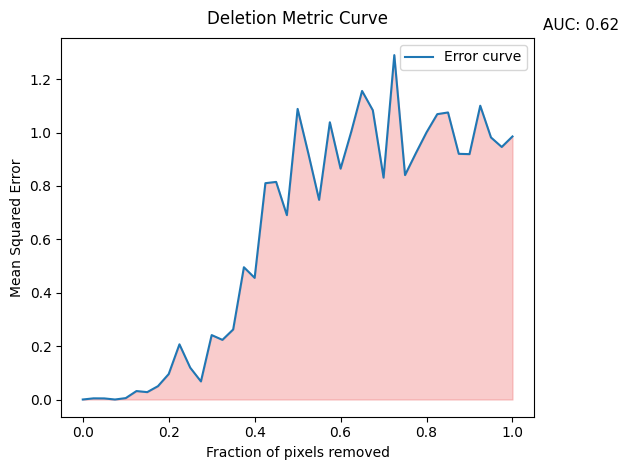

Errors: [0.0, 0.004311079, 0.0040659662, 1.8957635e-08, 0.005232905, 0.03164284, 0.027606368, 0.04997192, 0.095353305, 0.20673744, 0.119369335, 0.067705914, 0.24133433, 0.22337857, 0.26228496, 0.49549147, 0.4556893, 0.810405, 0.8151384, 0.690641, 1.0886227, 0.92138654, 0.7478714, 1.0386866, 0.8647642, 1.0041991, 1.155905, 1.083655, 0.8310982, 1.2901878, 0.8407386, 0.9222761, 1.0008836, 1.0690057, 1.0753279, 0.9203809, 0.9192029, 1.1006037, 0.9816984, 0.9460613, 0.9854708]
AUC: 0.6225412818918844
############################################################# 

Deletion 8 top pixel for Instance nr 49 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (4, 6), (0, 2), (0, 7), (4, 7), (4, 2), (3, 2), (4, 5), (3, 5), (1, 7), (0, 4), (3, 6), (3, 7), (4, 0), (2, 5), (2, 7), (3, 0), (0, 6), (1, 6), (2, 6), (1, 5), (4, 1), (3, 1), (2, 1), (0, 1), (0, 5), (1, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.9128237]
Initial Predict

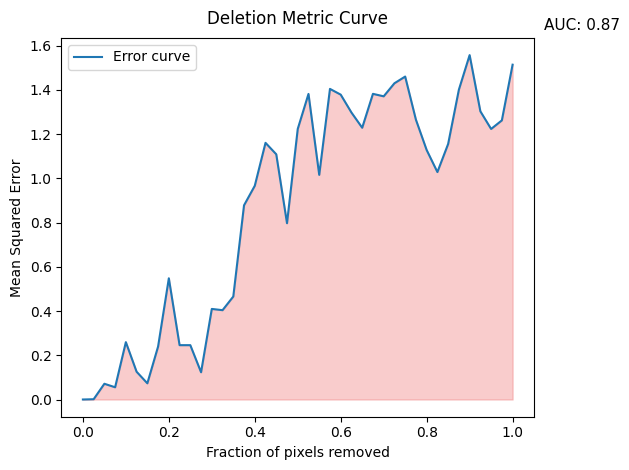

Errors: [0.0, 0.0012210788, 0.07119511, 0.05532153, 0.2593826, 0.12553282, 0.07321331, 0.2394817, 0.54811406, 0.24576482, 0.24575123, 0.12324566, 0.409616, 0.4039908, 0.46568358, 0.87823886, 0.96653646, 1.1607629, 1.1089797, 0.7972621, 1.223642, 1.381971, 1.0159869, 1.4047029, 1.3787103, 1.2977704, 1.2290194, 1.3823396, 1.3711168, 1.4301864, 1.4604726, 1.2654697, 1.1283166, 1.0286248, 1.1556928, 1.4011981, 1.5575156, 1.3033445, 1.2235326, 1.2623334, 1.5141933]
AUC: 0.8709584315161918
############################################################# 

Deletion 8 top pixel for Instance nr 50 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (4, 3), (1, 4), (2, 2), (4, 4), (1, 2), (3, 2), (4, 7), (1, 7), (0, 4), (0, 2), (0, 7), (4, 2), (4, 6), (3, 5), (4, 5), (3, 7), (2, 7), (0, 6), (2, 5), (1, 6), (3, 6), (1, 5), (0, 5), (3, 0), (3, 1), (0, 0), (4, 1), (0, 1), (2, 1), (1, 1), (4, 0), (2, 0), (1, 0), (2, 6)] 

Original prediction: [1.7009264]
Initial Prediction with Ori

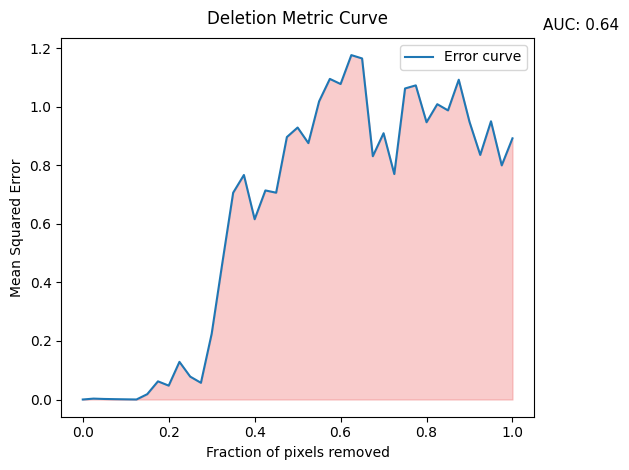

Errors: [0.0, 0.0030346795, 0.0018328971, 0.0011540175, 0.00059335446, 5.388718e-05, 0.018178485, 0.06209291, 0.04746536, 0.12869018, 0.07828727, 0.057064924, 0.2247144, 0.4684836, 0.70691836, 0.76749307, 0.61623645, 0.7146589, 0.706967, 0.89711726, 0.929698, 0.876431, 1.0192155, 1.0959603, 1.0784711, 1.1772722, 1.1658921, 0.8316467, 0.91026837, 0.7706546, 1.0632336, 1.0738168, 0.9477807, 1.0094974, 0.98829424, 1.0931207, 0.9491279, 0.83604026, 0.9510504, 0.8003154, 0.89280635]
AUC: 0.6378806840580182
############################################################# 

Deletion 8 top pixel for Instance nr 51 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (1, 4), (1, 2), (4, 2), (2, 2), (0, 2), (4, 7), (3, 2), (0, 4), (4, 6), (0, 7), (4, 5), (3, 5), (1, 7), (3, 7), (0, 6), (4, 0), (3, 0), (3, 6), (2, 7), (0, 5), (2, 5), (4, 1), (1, 6), (1, 5), (0, 1), (3, 1), (2, 6), (1, 1), (2, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [1.560096]
Initial Pr

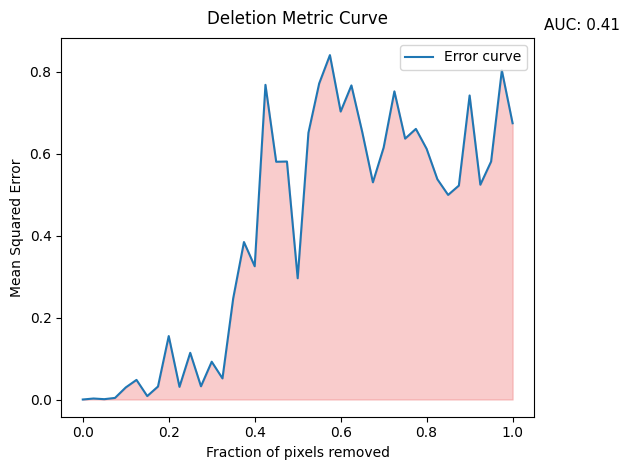

Errors: [0.0, 0.0024171162, 0.0008144304, 0.0038708805, 0.029453551, 0.04787832, 0.008357692, 0.031693116, 0.15490331, 0.03091334, 0.11399412, 0.032276716, 0.09225453, 0.05151363, 0.24704121, 0.38440725, 0.32529667, 0.76823086, 0.58042705, 0.5810437, 0.29599893, 0.65109783, 0.77152807, 0.84080166, 0.7030336, 0.76681906, 0.6539376, 0.53024864, 0.6151483, 0.7522999, 0.6368945, 0.6606955, 0.6119972, 0.5377199, 0.49948204, 0.5222804, 0.74228644, 0.5243857, 0.5809256, 0.8035373, 0.6744333]
AUC: 0.41312805814668535
############################################################# 

Deletion 8 top pixel for Instance nr 52 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (2, 2), (1, 2), (1, 4), (3, 2), (4, 2), (0, 2), (4, 7), (0, 7), (1, 7), (4, 6), (0, 4), (3, 7), (2, 7), (3, 5), (4, 5), (3, 6), (2, 5), (0, 6), (1, 6), (2, 6), (1, 5), (1, 1), (3, 0), (4, 0), (2, 1), (3, 1), (0, 5), (4, 1), (0, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.3626008]
I

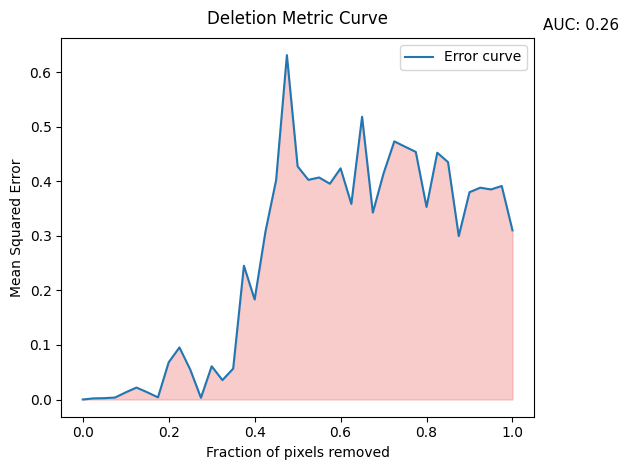

Errors: [0.0, 0.002073922, 0.002481433, 0.003590701, 0.01311056, 0.021904847, 0.013287424, 0.003927931, 0.068260856, 0.09539954, 0.055052407, 0.003185527, 0.060945228, 0.035545256, 0.056612756, 0.24515201, 0.18328817, 0.3070832, 0.40230194, 0.63114536, 0.4272608, 0.40253946, 0.40688476, 0.395443, 0.4236625, 0.35841528, 0.51819974, 0.34254178, 0.4143955, 0.47306168, 0.46335047, 0.4537659, 0.35286403, 0.45230645, 0.4350048, 0.29942167, 0.3799458, 0.38816082, 0.38496494, 0.39128688, 0.3100518]
AUC: 0.26307128119515255
############################################################# 

Deletion 8 top pixel for Instance nr 53 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (1, 2), (1, 4), (4, 2), (0, 2), (2, 2), (4, 6), (3, 2), (0, 7), (4, 7), (4, 5), (1, 7), (3, 5), (0, 4), (3, 7), (2, 7), (3, 6), (4, 0), (0, 6), (3, 0), (1, 6), (2, 5), (2, 6), (1, 5), (4, 1), (3, 1), (0, 5), (0, 1), (1, 1), (2, 1), (2, 0), (1, 0), (0, 0)] 

Original prediction: [1.2835

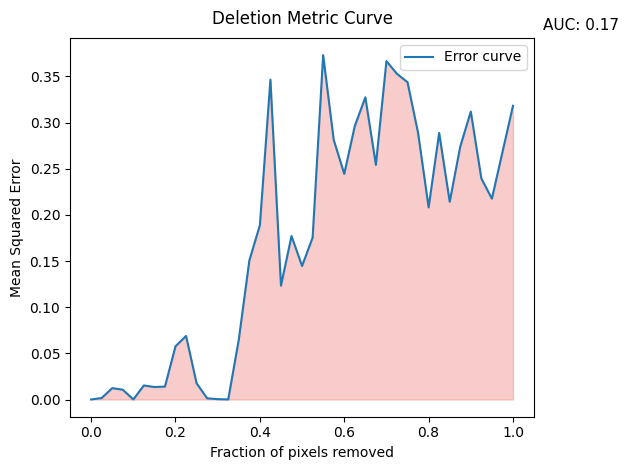

Errors: [0.0, 0.0016452012, 0.012320908, 0.010642827, 4.5501198e-05, 0.015229171, 0.013535449, 0.014001425, 0.05760304, 0.068835825, 0.017569218, 0.0013107627, 0.00038623894, 8.167415e-05, 0.06484328, 0.15048592, 0.18876082, 0.34648642, 0.12335022, 0.17708135, 0.14462735, 0.17533663, 0.37304115, 0.2812926, 0.24440445, 0.29621768, 0.32736453, 0.25419948, 0.36651158, 0.35276517, 0.34364748, 0.28880435, 0.20810267, 0.2887231, 0.21415628, 0.2740008, 0.3118968, 0.23944676, 0.21756062, 0.26791722, 0.31813782]
AUC: 0.17233252140049443
############################################################# 

Deletion 8 top pixel for Instance nr 54 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (4, 3), (2, 4), (3, 4), (1, 2), (0, 3), (2, 2), (4, 4), (1, 4), (0, 2), (4, 7), (3, 7), (4, 6), (3, 2), (3, 5), (3, 6), (4, 2), (2, 7), (1, 7), (0, 7), (2, 5), (2, 6), (4, 5), (0, 4), (1, 6), (0, 6), (1, 1), (1, 5), (3, 0), (2, 1), (4, 0), (0, 1), (3, 1), (4, 1), (2, 0), (0, 5), (1, 0), (0, 0)] 

Original predic

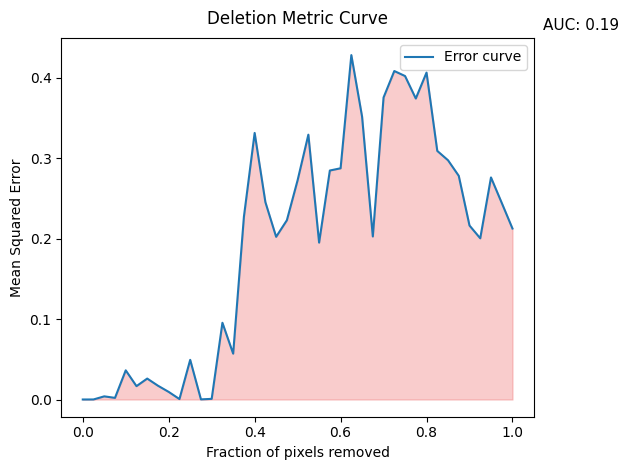

Errors: [0.0, 5.0565657e-05, 0.003914301, 0.0020309766, 0.03624476, 0.016605483, 0.026014788, 0.017137406, 0.009431146, 0.000556003, 0.049271457, 0.00015128449, 0.00080826407, 0.09533777, 0.05697947, 0.22704995, 0.33120438, 0.24523647, 0.20215842, 0.22275408, 0.27250823, 0.3290452, 0.19495031, 0.28453228, 0.28729728, 0.4279339, 0.35147786, 0.20257075, 0.375291, 0.4081579, 0.40193167, 0.37401348, 0.40623558, 0.30889326, 0.29727688, 0.27791524, 0.21616605, 0.20029396, 0.27592045, 0.24432236, 0.2124485]
AUC: 0.1946473722478913
############################################################# 

Deletion 8 top pixel for Instance nr 55 
Importants indices ->  [(2, 3), (1, 3), (4, 3), (3, 3), (2, 4), (3, 4), (0, 3), (4, 4), (1, 4), (1, 7), (1, 2), (4, 5), (4, 6), (4, 2), (0, 7), (2, 2), (2, 7), (3, 5), (4, 7), (2, 5), (0, 2), (0, 4), (3, 2), (3, 7), (3, 6), (3, 0), (4, 0), (2, 6), (1, 6), (0, 6), (1, 5), (0, 5), (2, 0), (4, 1), (1, 1), (2, 1), (3, 1), (0, 1), (1, 0), (0, 0)] 

Original prediction

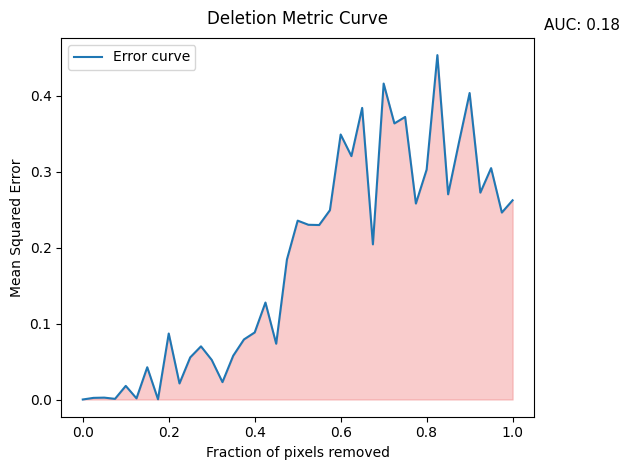

Errors: [0.0, 0.002160241, 0.0024673913, 0.00085074495, 0.017903501, 0.0015136659, 0.042443257, 0.00030803567, 0.086863354, 0.021130394, 0.055424366, 0.06996095, 0.052120335, 0.02285587, 0.057606358, 0.07904994, 0.08825322, 0.12760255, 0.07337629, 0.18427174, 0.23538369, 0.22993745, 0.22962385, 0.24910887, 0.34874249, 0.32029417, 0.38374582, 0.20416147, 0.4157701, 0.36332422, 0.37186888, 0.25789437, 0.30250597, 0.45322764, 0.27003568, 0.3377455, 0.40333247, 0.2722474, 0.30449772, 0.24603084, 0.2621646]
AUC: 0.18291807737768975
############################################################# 

Deletion 8 top pixel for Instance nr 56 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (0, 3), (4, 4), (0, 7), (4, 7), (4, 2), (2, 2), (1, 7), (1, 4), (3, 2), (1, 2), (0, 2), (3, 7), (0, 4), (4, 6), (2, 7), (0, 6), (4, 0), (4, 1), (3, 0), (4, 5), (1, 6), (3, 1), (3, 5), (3, 6), (0, 5), (1, 5), (2, 1), (2, 5), (0, 1), (2, 6), (1, 1), (2, 0), (0, 0), (1, 0)] 

Original predict

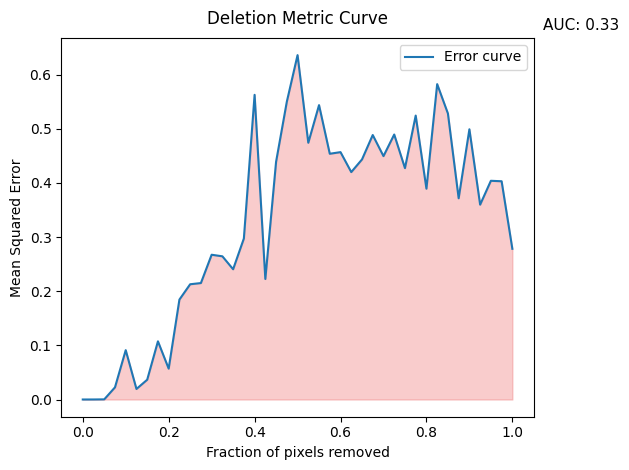

Errors: [0.0, 4.4964032e-05, 0.00025206426, 0.022469997, 0.09111923, 0.019458095, 0.036531422, 0.107430905, 0.05699529, 0.18451494, 0.21282092, 0.21503311, 0.26732126, 0.26442602, 0.24051988, 0.2972401, 0.56262815, 0.22254932, 0.43893504, 0.5498605, 0.63597035, 0.47411054, 0.5436151, 0.45379856, 0.45680162, 0.41996488, 0.4432954, 0.4884017, 0.44943243, 0.4893353, 0.4272622, 0.52434367, 0.38930646, 0.5823894, 0.5281581, 0.37160903, 0.4989878, 0.3598063, 0.40387625, 0.4030242, 0.27827376]
AUC: 0.33181943496920213
############################################################# 

Deletion 8 top pixel for Instance nr 57 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (0, 3), (2, 4), (4, 4), (1, 7), (0, 7), (4, 2), (4, 7), (2, 2), (1, 4), (3, 2), (1, 2), (0, 2), (2, 7), (0, 4), (4, 6), (3, 7), (3, 0), (4, 0), (0, 6), (4, 5), (3, 5), (1, 6), (3, 6), (4, 1), (3, 1), (2, 5), (2, 6), (0, 5), (2, 0), (1, 5), (2, 1), (1, 1), (0, 1), (1, 0), (0, 0)] 

Original prediction: [1.4013785]

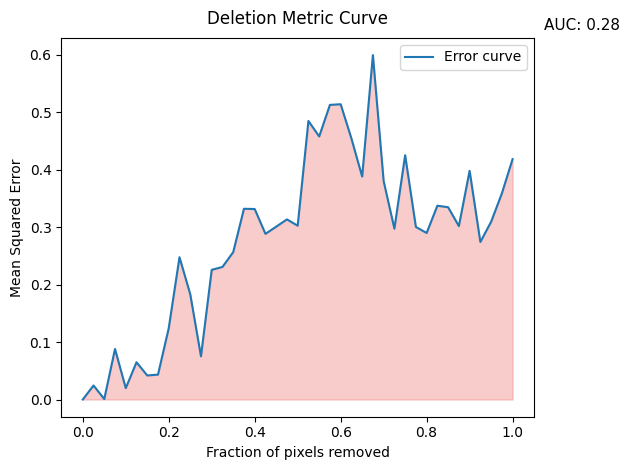

Errors: [0.0, 0.02441682, 0.00083812873, 0.087986186, 0.01979823, 0.06487443, 0.041835494, 0.043364357, 0.12419379, 0.24778786, 0.18349779, 0.07525389, 0.22582552, 0.2309098, 0.2566367, 0.33216664, 0.33172372, 0.2885313, 0.30101645, 0.3137031, 0.30269346, 0.48512363, 0.45810732, 0.5131164, 0.51423174, 0.45464635, 0.38830113, 0.5997947, 0.3803427, 0.29753733, 0.42536226, 0.30056402, 0.29000986, 0.33750805, 0.3348734, 0.3019871, 0.39829254, 0.27436733, 0.30948758, 0.3588975, 0.41864356]
AUC: 0.2782231604185654
############################################################# 

Deletion 8 top pixel for Instance nr 58 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (2, 4), (0, 3), (4, 4), (4, 2), (3, 2), (1, 2), (2, 2), (1, 4), (1, 7), (0, 2), (0, 7), (4, 7), (4, 6), (2, 7), (3, 7), (4, 5), (3, 5), (0, 4), (3, 6), (0, 6), (1, 6), (3, 0), (4, 0), (2, 5), (2, 6), (4, 1), (3, 1), (1, 5), (2, 1), (1, 1), (2, 0), (0, 5), (0, 1), (1, 0), (0, 0)] 

Original prediction: [1.2990439]
In

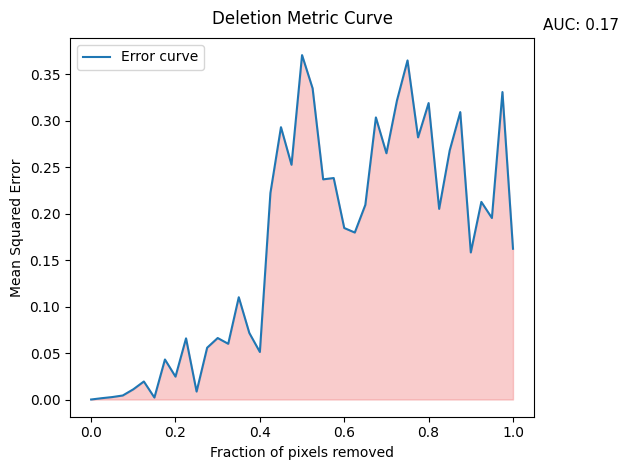

Errors: [0.0, 0.0014014011, 0.0026160507, 0.00431562, 0.010967701, 0.019368602, 0.0020957377, 0.043031015, 0.024597354, 0.06576021, 0.008537333, 0.055672962, 0.06611321, 0.059898373, 0.10996999, 0.071537584, 0.0511026, 0.22207111, 0.29282266, 0.2524055, 0.37033182, 0.33461553, 0.23672913, 0.23814915, 0.1844129, 0.17954035, 0.20930237, 0.30332938, 0.26480228, 0.3215936, 0.36463058, 0.28186297, 0.31877598, 0.20499085, 0.26783183, 0.30907282, 0.15813842, 0.2124819, 0.1951659, 0.33061725, 0.162107]
AUC: 0.16829283856204708
############################################################# 

Deletion 8 top pixel for Instance nr 59 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (0, 3), (2, 4), (4, 4), (4, 2), (3, 2), (2, 2), (1, 7), (1, 2), (4, 7), (0, 7), (1, 4), (4, 6), (0, 2), (4, 5), (4, 0), (3, 0), (2, 7), (3, 7), (3, 5), (3, 6), (0, 4), (4, 1), (3, 1), (1, 6), (0, 6), (2, 6), (2, 5), (2, 1), (2, 0), (1, 5), (1, 1), (0, 1), (0, 5), (1, 0), (0, 0)] 

Original prediction: [1.

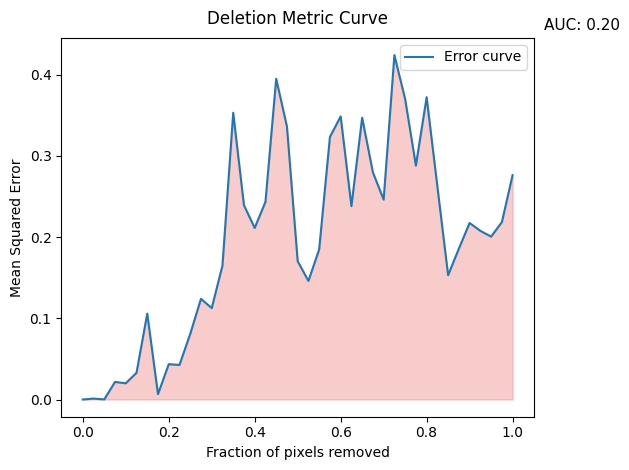

Errors: [0.0, 0.0011325178, 0.00013523885, 0.021650888, 0.019966826, 0.03287234, 0.10576684, 0.006627072, 0.043490954, 0.04259886, 0.080762096, 0.123959266, 0.11255629, 0.1648957, 0.3530757, 0.23919132, 0.21127652, 0.24330133, 0.394971, 0.33616638, 0.17032409, 0.14602108, 0.18487817, 0.32326266, 0.3486091, 0.2380925, 0.34697148, 0.2796858, 0.24613118, 0.42409676, 0.36995322, 0.288022, 0.37228715, 0.26231506, 0.15307172, 0.1857743, 0.21738556, 0.2076936, 0.20059754, 0.21835999, 0.27624354]
AUC: 0.19640129767030884
############################################################# 

Deletion 8 top pixel for Instance nr 60 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (4, 7), (0, 3), (4, 2), (3, 7), (1, 2), (2, 2), (0, 7), (3, 2), (1, 7), (4, 6), (0, 2), (1, 4), (2, 7), (3, 6), (4, 5), (3, 5), (4, 0), (3, 0), (0, 6), (1, 6), (2, 6), (2, 5), (0, 4), (4, 1), (3, 1), (2, 1), (1, 5), (1, 1), (2, 0), (0, 5), (0, 1), (1, 0), (0, 0)] 

Original prediction: [1.419132

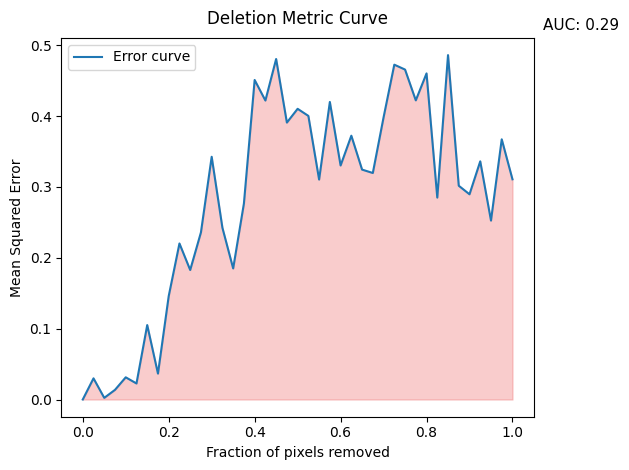

Errors: [0.0, 0.029871235, 0.0023289216, 0.013634766, 0.031322435, 0.02264137, 0.10509453, 0.03654359, 0.1459432, 0.22027095, 0.18284658, 0.2358913, 0.34265524, 0.24239154, 0.18502843, 0.27661997, 0.45108992, 0.4220753, 0.48069483, 0.39095804, 0.4103778, 0.40037012, 0.31052095, 0.42003503, 0.33036846, 0.3724167, 0.32455817, 0.31977788, 0.39825487, 0.47268626, 0.465769, 0.42232594, 0.46035796, 0.28505382, 0.48618633, 0.3017878, 0.2897068, 0.33621976, 0.25259498, 0.36732334, 0.31086615]
AUC: 0.28500067907152693
############################################################# 

Deletion 8 top pixel for Instance nr 61 
Importants indices ->  [(2, 3), (4, 3), (3, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (2, 2), (4, 2), (1, 2), (1, 4), (3, 2), (1, 7), (3, 5), (4, 5), (0, 2), (0, 7), (4, 6), (2, 5), (3, 6), (2, 7), (2, 6), (4, 0), (3, 0), (4, 7), (1, 6), (0, 4), (3, 7), (4, 1), (2, 1), (1, 5), (3, 1), (2, 0), (1, 1), (0, 6), (0, 1), (1, 0), (0, 0), (0, 5)] 

Original prediction: [1.3375661]
I

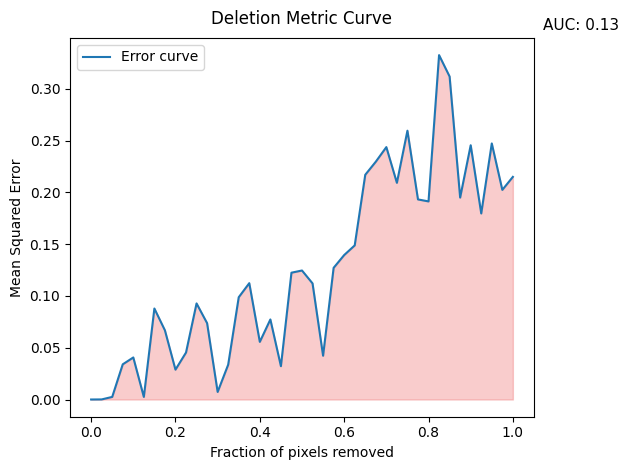

Errors: [0.0, 7.504032e-05, 0.002497683, 0.033975214, 0.040598094, 0.0024809344, 0.08788233, 0.06678976, 0.02883343, 0.045352876, 0.09279031, 0.073715225, 0.0073025264, 0.033626568, 0.09876475, 0.11236236, 0.055676676, 0.07730474, 0.032194488, 0.12246964, 0.124590345, 0.11213088, 0.04227946, 0.12716758, 0.13949743, 0.14883539, 0.21703115, 0.22967389, 0.24376696, 0.20926616, 0.2596226, 0.19325036, 0.19131577, 0.33261544, 0.31192857, 0.19503464, 0.24557859, 0.17968394, 0.24732047, 0.20245498, 0.21501033]
AUC: 0.12688106074183453
############################################################# 

Deletion 8 top pixel for Instance nr 62 
Importants indices ->  [(3, 3), (2, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (0, 3), (4, 7), (4, 2), (1, 2), (3, 2), (2, 2), (0, 2), (4, 6), (3, 7), (1, 4), (1, 7), (3, 5), (4, 5), (3, 6), (0, 7), (2, 7), (3, 0), (0, 4), (2, 5), (4, 0), (2, 6), (1, 6), (3, 1), (4, 1), (0, 6), (2, 1), (2, 0), (1, 1), (0, 1), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original predict

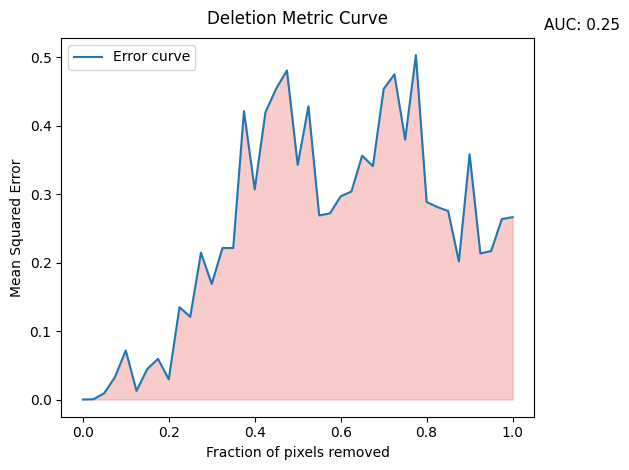

Errors: [0.0, 0.00044760463, 0.009210819, 0.03290144, 0.07164999, 0.012531931, 0.044498, 0.059482995, 0.029474586, 0.13480346, 0.12072392, 0.21437722, 0.16870838, 0.22123756, 0.22112694, 0.4211038, 0.30680278, 0.4195136, 0.4540001, 0.48050275, 0.34262016, 0.42811868, 0.2688444, 0.2717518, 0.2966535, 0.30380112, 0.35606128, 0.34074068, 0.45329648, 0.474888, 0.37961954, 0.5028919, 0.2883738, 0.2810446, 0.27524322, 0.20164907, 0.3580907, 0.21334985, 0.216769, 0.263499, 0.2662868]
AUC: 0.2518387011208688
############################################################# 

Deletion 8 top pixel for Instance nr 63 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (3, 4), (2, 4), (4, 4), (2, 2), (0, 3), (4, 2), (3, 2), (1, 2), (1, 4), (4, 7), (3, 7), (4, 6), (4, 5), (3, 6), (2, 7), (3, 5), (1, 7), (0, 2), (3, 0), (4, 0), (0, 7), (0, 4), (2, 6), (3, 1), (4, 1), (2, 5), (2, 1), (1, 6), (0, 6), (2, 0), (1, 1), (1, 5), (0, 5), (0, 1), (1, 0), (0, 0)] 

Original prediction: [1.2388098]
Initial Pr

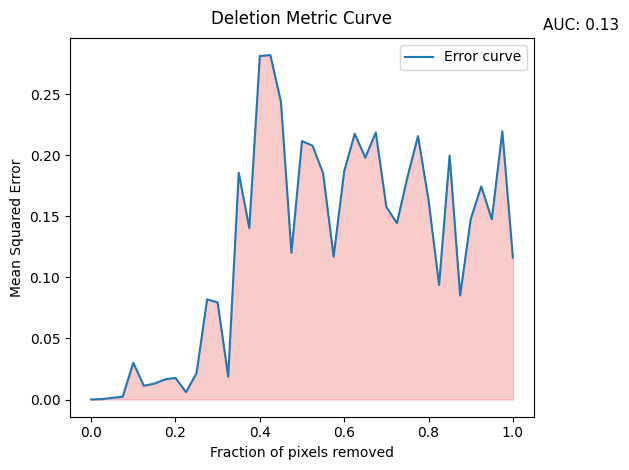

Errors: [0.0, 0.0003203243, 0.0013274056, 0.0023486265, 0.0301122, 0.011206843, 0.013039324, 0.016461734, 0.017725045, 0.0060720774, 0.02162476, 0.08205458, 0.07947281, 0.018759094, 0.18565676, 0.14045548, 0.28135878, 0.2820946, 0.24392655, 0.120211355, 0.21164264, 0.20792288, 0.18539715, 0.11692544, 0.186913, 0.21768269, 0.19807003, 0.21872924, 0.1577575, 0.14444295, 0.18217275, 0.2157344, 0.1634054, 0.093832865, 0.19981419, 0.08526469, 0.14767723, 0.17455092, 0.14765006, 0.2197127, 0.11621643]
AUC: 0.12719088239755366
############################################################# 

Deletion 8 top pixel for Instance nr 64 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (4, 2), (2, 2), (4, 7), (1, 2), (3, 2), (4, 6), (4, 5), (1, 4), (3, 7), (0, 2), (3, 5), (0, 7), (1, 7), (3, 6), (3, 0), (4, 0), (2, 7), (4, 1), (0, 4), (3, 1), (0, 6), (2, 5), (2, 6), (1, 6), (2, 1), (2, 0), (1, 1), (0, 1), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original prediction: [1

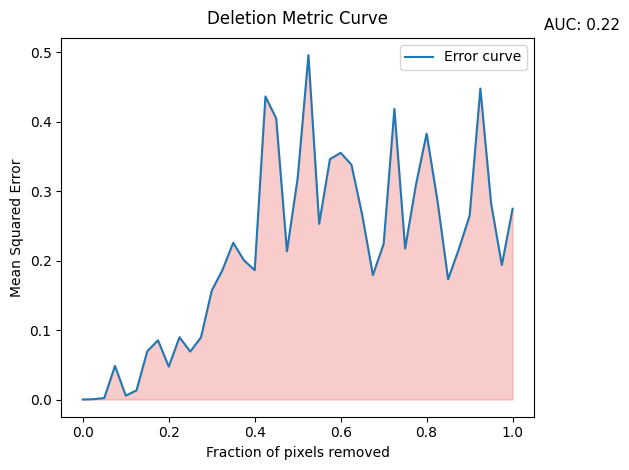

Errors: [0.0, 0.00046439478, 0.0021657406, 0.048308738, 0.005665456, 0.013100435, 0.069389835, 0.08523466, 0.04735344, 0.08963378, 0.06893701, 0.089394815, 0.15655716, 0.18636678, 0.22557849, 0.20025341, 0.18614814, 0.43609735, 0.4043778, 0.21332286, 0.31878063, 0.4955836, 0.25291052, 0.34584993, 0.35500327, 0.33794504, 0.26597875, 0.17910229, 0.2238636, 0.41805542, 0.21738283, 0.30870876, 0.382619, 0.28692338, 0.17303061, 0.21656181, 0.26445574, 0.44750738, 0.28221366, 0.19344813, 0.27455574]
AUC: 0.21578881219829782
############################################################# 

Deletion 8 top pixel for Instance nr 65 
Importants indices ->  [(4, 3), (3, 3), (2, 3), (3, 4), (4, 4), (1, 3), (2, 4), (4, 2), (4, 6), (4, 7), (4, 5), (1, 7), (3, 5), (0, 3), (3, 7), (2, 2), (2, 7), (1, 2), (3, 2), (0, 7), (0, 2), (3, 6), (3, 0), (4, 0), (1, 4), (4, 1), (3, 1), (2, 6), (2, 5), (2, 1), (2, 0), (1, 6), (0, 6), (0, 4), (1, 1), (0, 1), (1, 5), (0, 5), (1, 0), (0, 0)] 

Original prediction: [1.2

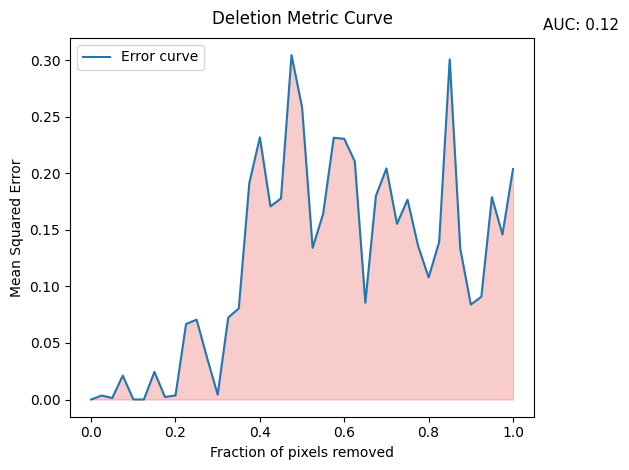

Errors: [0.0, 0.0035366877, 0.0013172099, 0.021161078, 9.7823104e-05, 1.156627e-05, 0.024452075, 0.0022256991, 0.0035959745, 0.0667415, 0.0706903, 0.036676567, 0.0042952513, 0.07256059, 0.08061906, 0.19161972, 0.23198603, 0.17089511, 0.17792355, 0.30475348, 0.25865287, 0.13421912, 0.16440651, 0.2316288, 0.23067339, 0.21072406, 0.08565542, 0.1801247, 0.20445907, 0.15546097, 0.17684014, 0.13603753, 0.10801376, 0.13949245, 0.30100352, 0.13353007, 0.08402809, 0.090934396, 0.17908317, 0.14605206, 0.20399232]
AUC: 0.12295438797027598
############################################################# 

Deletion 8 top pixel for Instance nr 66 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (4, 3), (1, 2), (3, 4), (0, 3), (2, 4), (4, 4), (2, 2), (4, 7), (1, 4), (0, 2), (4, 2), (4, 6), (3, 2), (3, 7), (3, 0), (1, 7), (2, 7), (4, 5), (0, 7), (4, 0), (3, 5), (0, 4), (3, 6), (2, 1), (1, 1), (3, 1), (4, 1), (2, 0), (1, 6), (2, 6), (2, 5), (0, 1), (0, 6), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original predic

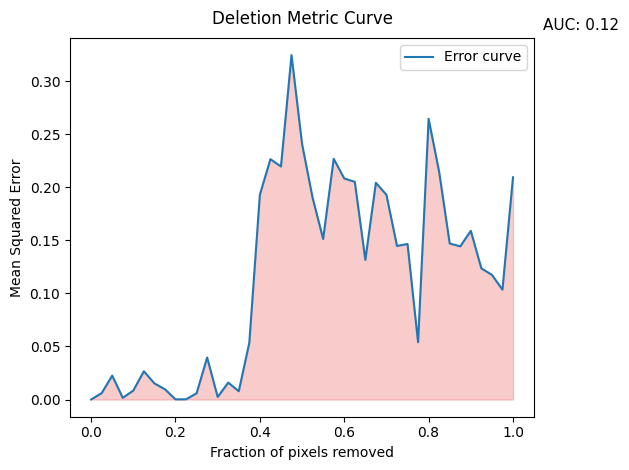

Errors: [0.0, 0.0060205394, 0.022494879, 0.0015798334, 0.008458124, 0.026600134, 0.01518363, 0.009637708, 0.00012983193, 0.00020016581, 0.005867389, 0.039543945, 0.0023870855, 0.015921736, 0.00782021, 0.05353328, 0.19292757, 0.22637513, 0.21945931, 0.3243905, 0.2406863, 0.1899323, 0.15120786, 0.22674248, 0.20818436, 0.20504406, 0.13148686, 0.2041262, 0.19278695, 0.1446289, 0.14648326, 0.053890947, 0.26439235, 0.21430597, 0.14695975, 0.14425834, 0.15887311, 0.123510756, 0.11745506, 0.103492945, 0.20926712]
AUC: 0.11629033256613183
############################################################# 

Deletion 8 top pixel for Instance nr 67 
Importants indices ->  [(4, 3), (3, 3), (2, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (4, 7), (4, 2), (4, 6), (3, 7), (4, 5), (1, 2), (3, 2), (1, 7), (1, 4), (2, 2), (3, 5), (0, 7), (0, 2), (3, 6), (2, 7), (3, 0), (4, 0), (0, 4), (2, 6), (1, 6), (4, 1), (3, 1), (2, 5), (0, 6), (2, 0), (2, 1), (1, 1), (0, 1), (1, 5), (1, 0), (0, 5), (0, 0)] 

Original pred

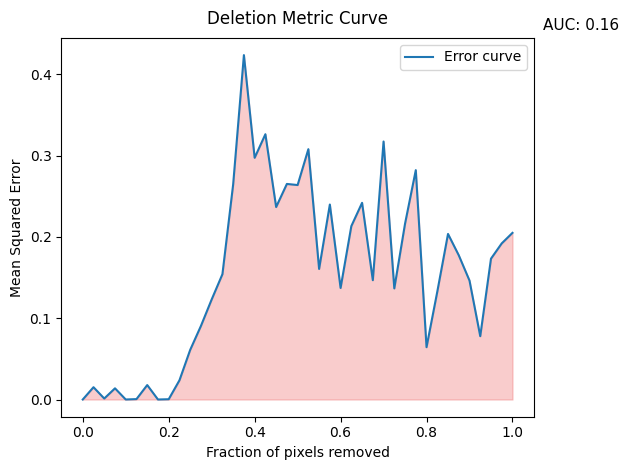

Errors: [0.0, 0.0151215, 0.0012032487, 0.013742914, 1.013533e-05, 0.0004891942, 0.017751718, 6.734447e-07, 0.00033914202, 0.023610681, 0.06103673, 0.09047998, 0.12304766, 0.15407804, 0.26456174, 0.42348826, 0.2972226, 0.32620627, 0.23668535, 0.26506993, 0.2637222, 0.30783755, 0.16054226, 0.2397381, 0.13715175, 0.21319889, 0.24185084, 0.14671157, 0.31725535, 0.13661711, 0.21620713, 0.2820183, 0.06433778, 0.13249116, 0.20357935, 0.17736167, 0.14624925, 0.077880844, 0.17317078, 0.19197123, 0.20491572]
AUC: 0.15616241876389836
############################################################# 

Deletion 8 top pixel for Instance nr 68 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (4, 4), (2, 4), (0, 3), (4, 5), (4, 2), (4, 6), (1, 4), (4, 7), (1, 2), (0, 2), (2, 2), (3, 0), (1, 7), (3, 2), (3, 5), (3, 7), (4, 0), (2, 7), (3, 6), (0, 4), (0, 7), (4, 1), (3, 1), (1, 6), (2, 6), (2, 5), (0, 6), (2, 0), (2, 1), (1, 5), (0, 1), (1, 1), (0, 5), (1, 0), (0, 0)] 

Original prediction:

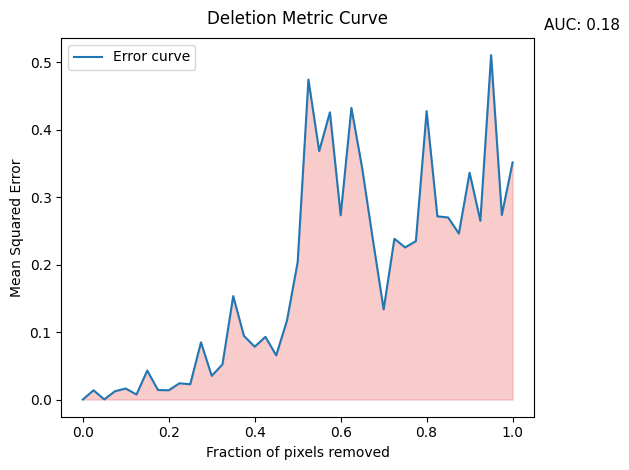

Errors: [0.0, 0.013641839, 0.00017821003, 0.0122796055, 0.016281474, 0.0074089994, 0.042979546, 0.014072382, 0.013692455, 0.024080493, 0.022614077, 0.084796354, 0.035078153, 0.05209862, 0.15342344, 0.09432128, 0.0783588, 0.092991084, 0.065463535, 0.11693384, 0.20394553, 0.4746609, 0.3685584, 0.42609432, 0.27327257, 0.43256953, 0.34325653, 0.23688431, 0.13363868, 0.23848139, 0.22560221, 0.23494665, 0.4279034, 0.27171817, 0.2700578, 0.24620293, 0.33648467, 0.26517466, 0.510937, 0.2737939, 0.35175326]
AUC: 0.18276885985542324
############################################################# 

Deletion 8 top pixel for Instance nr 69 
Importants indices ->  [(2, 3), (3, 3), (4, 3), (1, 3), (3, 4), (2, 4), (4, 4), (4, 7), (0, 3), (4, 2), (4, 6), (0, 7), (2, 2), (4, 5), (3, 2), (1, 4), (1, 7), (3, 0), (1, 2), (4, 0), (3, 7), (3, 5), (4, 1), (2, 7), (0, 2), (3, 6), (0, 6), (3, 1), (0, 4), (1, 6), (2, 5), (2, 0), (2, 1), (2, 6), (0, 5), (1, 5), (1, 1), (0, 1), (1, 0), (0, 0)] 

Original prediction:

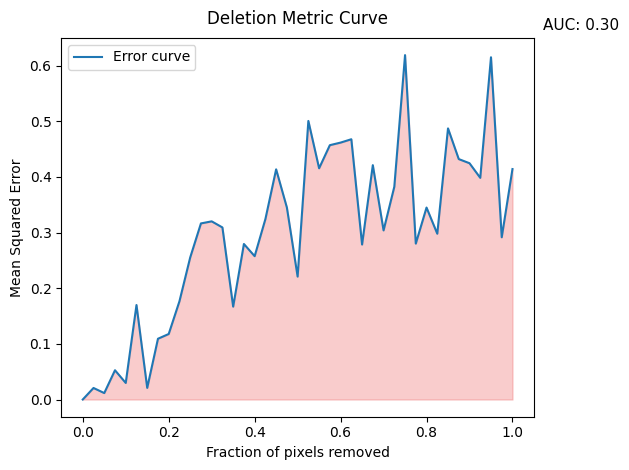

Errors: [0.0, 0.020721393, 0.0115685975, 0.05255341, 0.029740958, 0.16973236, 0.020834735, 0.109151706, 0.117689274, 0.17650272, 0.2551694, 0.3163565, 0.3200887, 0.30912995, 0.16688702, 0.2793922, 0.2575197, 0.32412317, 0.41352943, 0.34498334, 0.22082406, 0.5004512, 0.41545933, 0.4569477, 0.46158552, 0.46760574, 0.2784549, 0.42102787, 0.3038055, 0.38216615, 0.61876506, 0.28007883, 0.34486198, 0.2978693, 0.4870882, 0.43195248, 0.4245191, 0.3982538, 0.61489177, 0.2914706, 0.4140488]
AUC: 0.3000194516265765
############################################################# 

Deletion 8 top pixel for Instance nr 70 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (4, 3), (2, 4), (3, 4), (4, 4), (0, 3), (3, 5), (2, 2), (1, 4), (4, 0), (4, 5), (1, 2), (4, 6), (4, 2), (3, 2), (0, 2), (4, 7), (3, 6), (1, 7), (3, 0), (3, 7), (2, 7), (2, 5), (0, 7), (4, 1), (2, 6), (0, 4), (2, 0), (2, 1), (3, 1), (1, 6), (1, 1), (0, 1), (0, 6), (1, 5), (1, 0), (0, 0), (0, 5)] 

Original prediction: [1.4273126]
Initia

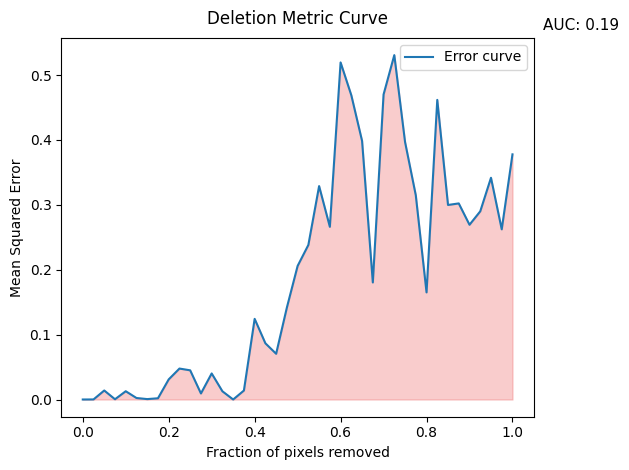

Errors: [0.0, 9.9254954e-05, 0.013894623, 0.0003784211, 0.012753764, 0.0023185203, 0.0006339655, 0.0018875398, 0.031008445, 0.04769929, 0.044973176, 0.009313914, 0.04015877, 0.0126381675, 3.4494917e-06, 0.013836846, 0.124295555, 0.086632185, 0.07048813, 0.14175917, 0.20587803, 0.23822531, 0.32894647, 0.26620418, 0.51954883, 0.46889067, 0.39858678, 0.18040484, 0.47010824, 0.53082484, 0.39696625, 0.3148076, 0.1651024, 0.4618205, 0.29984823, 0.30223474, 0.26933223, 0.29004973, 0.34175274, 0.2622475, 0.37786952]
AUC: 0.18888720205277987
############################################################# 

Deletion 8 top pixel for Instance nr 71 
Importants indices ->  [(2, 3), (3, 3), (3, 4), (1, 3), (2, 4), (4, 3), (4, 4), (0, 3), (4, 5), (4, 7), (2, 2), (4, 6), (1, 4), (1, 2), (3, 5), (3, 7), (3, 2), (4, 2), (0, 2), (2, 7), (1, 7), (3, 6), (2, 5), (4, 0), (0, 7), (3, 0), (0, 4), (2, 6), (1, 6), (4, 1), (0, 6), (2, 0), (3, 1), (1, 5), (2, 1), (1, 1), (0, 1), (0, 5), (1, 0), (0, 0)] 

Original p

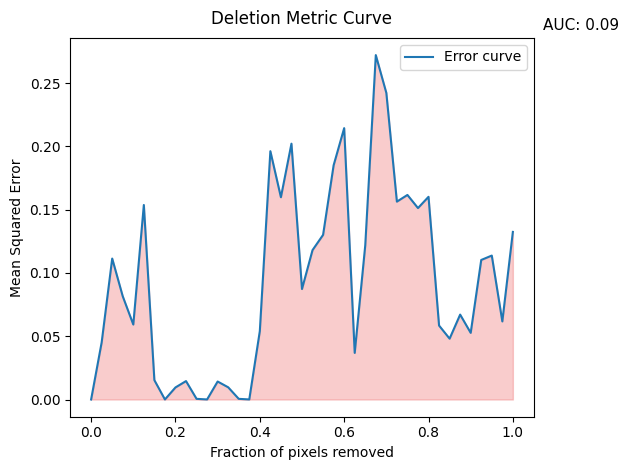

Errors: [0.0, 0.045101743, 0.111341886, 0.08152369, 0.059213318, 0.15364733, 0.015276401, 3.2214622e-05, 0.009531436, 0.014547577, 0.0005204856, 4.0859213e-05, 0.014203267, 0.009645621, 0.0005178292, 4.6122477e-05, 0.053992115, 0.19613142, 0.15977642, 0.20207524, 0.0872872, 0.1180249, 0.13004422, 0.18502223, 0.21433401, 0.036806036, 0.12180735, 0.27203673, 0.2421698, 0.15630594, 0.16157688, 0.15121548, 0.16010757, 0.058414392, 0.048058525, 0.067069575, 0.05264932, 0.11022777, 0.1136972, 0.061685875, 0.1323909]
AUC: 0.09354753613306457
############################################################# 

Deletion 8 top pixel for Instance nr 72 
Importants indices ->  [(2, 3), (3, 3), (3, 4), (4, 3), (1, 3), (2, 4), (4, 4), (0, 3), (1, 4), (2, 2), (4, 2), (4, 5), (3, 2), (4, 7), (1, 2), (4, 0), (1, 7), (4, 6), (0, 2), (3, 0), (3, 5), (2, 7), (3, 7), (4, 1), (0, 7), (0, 4), (3, 1), (0, 6), (2, 5), (3, 6), (1, 6), (0, 5), (1, 5), (2, 0), (2, 1), (2, 6), (0, 1), (1, 1), (0, 0), (1, 0)] 

Original

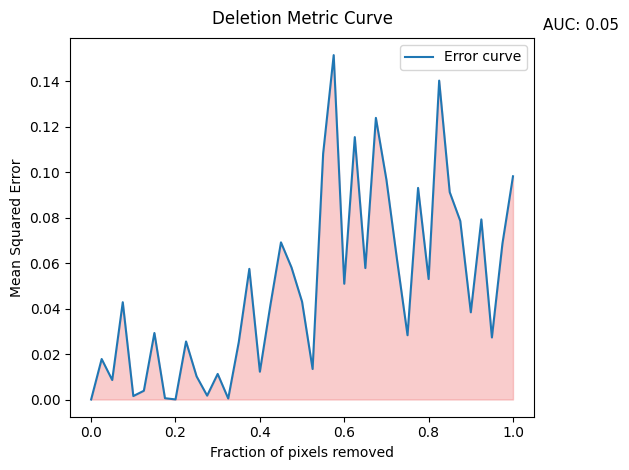

Errors: [0.0, 0.017795265, 0.008567121, 0.042765494, 0.0015194409, 0.0038425708, 0.029243529, 0.0005671446, 3.340819e-05, 0.025512403, 0.010169229, 0.0017010306, 0.011240134, 0.00043323508, 0.025252817, 0.057434015, 0.012225346, 0.04155391, 0.06908056, 0.05803484, 0.043002483, 0.013408597, 0.108145714, 0.15139024, 0.05088229, 0.11534826, 0.057778385, 0.1237984, 0.0965712, 0.06164082, 0.028249856, 0.09301526, 0.05295996, 0.14018309, 0.091153845, 0.07851338, 0.0383305, 0.079170845, 0.027270777, 0.068554185, 0.09812127]
AUC: 0.049635005352774896
############################################################# 

Deletion 8 top pixel for Instance nr 73 
Importants indices ->  [(3, 3), (2, 3), (3, 4), (4, 3), (2, 4), (4, 4), (1, 3), (2, 2), (3, 5), (4, 5), (1, 2), (1, 4), (0, 3), (3, 2), (4, 7), (4, 6), (2, 5), (3, 7), (3, 6), (4, 2), (2, 7), (0, 2), (1, 7), (2, 6), (2, 1), (0, 4), (3, 0), (0, 7), (2, 0), (1, 1), (1, 6), (1, 5), (3, 1), (0, 6), (4, 0), (0, 1), (1, 0), (4, 1), (0, 5), (0, 0)] 



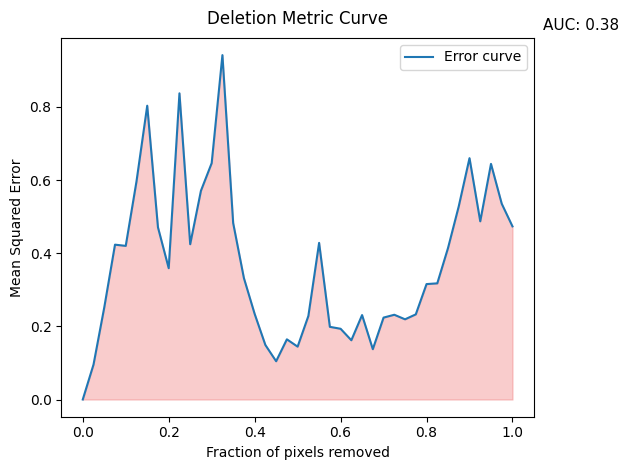

Errors: [0.0, 0.09547265, 0.2515812, 0.4234014, 0.42007938, 0.59619665, 0.8033692, 0.4707752, 0.35910887, 0.8372557, 0.42462426, 0.5708351, 0.6463868, 0.9417351, 0.48260388, 0.3320263, 0.23408411, 0.14899133, 0.104632854, 0.16453907, 0.14455047, 0.22836599, 0.42829582, 0.19870824, 0.19342834, 0.16202761, 0.23088402, 0.1375931, 0.22396441, 0.23174976, 0.2192831, 0.2327947, 0.3156035, 0.31764168, 0.41424242, 0.5283755, 0.65994513, 0.48720136, 0.6443346, 0.53535587, 0.4734111]
AUC: 0.37696875631809235
############################################################# 

Deletion 8 top pixel for Instance nr 74 
Importants indices ->  [(2, 3), (3, 3), (3, 4), (1, 3), (2, 4), (4, 3), (4, 4), (2, 2), (3, 2), (1, 4), (1, 2), (0, 3), (4, 2), (0, 2), (3, 5), (4, 5), (4, 7), (4, 6), (0, 4), (2, 5), (3, 7), (2, 1), (1, 1), (3, 6), (3, 1), (1, 7), (2, 7), (3, 0), (2, 0), (0, 7), (0, 1), (1, 5), (0, 6), (4, 1), (2, 6), (1, 6), (1, 0), (0, 5), (4, 0), (0, 0)] 

Original prediction: [-0.35729226]
Initial Pr

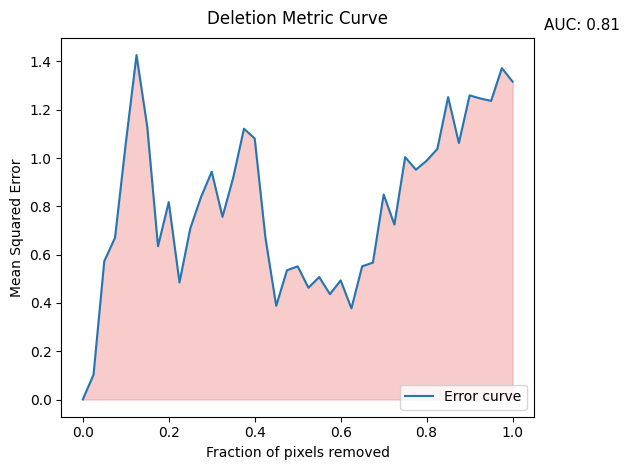

Errors: [0.0, 0.10271524, 0.5725967, 0.6699195, 1.0606563, 1.4260782, 1.1294882, 0.6345497, 0.8175978, 0.48495626, 0.7076704, 0.8380384, 0.94319373, 0.7563701, 0.918686, 1.1212099, 1.0810049, 0.66943145, 0.38790968, 0.5351441, 0.55141246, 0.46280226, 0.50721073, 0.4362864, 0.4931683, 0.37738192, 0.5515409, 0.5668754, 0.84877753, 0.72443753, 1.0037913, 0.95167303, 0.9889044, 1.0378746, 1.2522762, 1.0621275, 1.2593294, 1.2466178, 1.2365098, 1.3722234, 1.3161196]
AUC: 0.8111624281853437
############################################################# 

Deletion 8 top pixel for Instance nr 75 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (2, 2), (4, 4), (1, 2), (0, 3), (1, 4), (3, 2), (0, 2), (4, 7), (3, 5), (4, 2), (4, 5), (4, 6), (1, 1), (0, 4), (2, 1), (3, 7), (3, 6), (2, 5), (1, 7), (3, 0), (2, 0), (3, 1), (2, 7), (1, 0), (0, 1), (0, 7), (4, 0), (4, 1), (2, 6), (1, 5), (1, 6), (0, 0), (0, 6), (0, 5)] 

Original prediction: [-0.36616382]
Initial Prediction with O

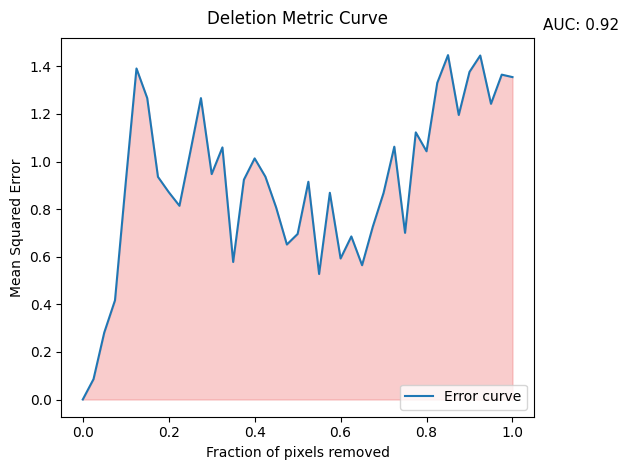

Errors: [0.0, 0.085483596, 0.2813089, 0.41675782, 0.91209227, 1.3911182, 1.2666563, 0.9355859, 0.87164783, 0.81404763, 1.0382911, 1.2664834, 0.94724953, 1.0594432, 0.5778791, 0.92376196, 1.0132232, 0.93640244, 0.80695754, 0.6513191, 0.695625, 0.9150278, 0.5274, 0.8687158, 0.59258425, 0.6852699, 0.5642917, 0.72643304, 0.8679896, 1.0624468, 0.7003455, 1.1225243, 1.0431279, 1.330731, 1.4472448, 1.1956464, 1.3767343, 1.4455837, 1.2425393, 1.3651857, 1.3548589]
AUC: 0.916214631125331
############################################################# 

Deletion 8 top pixel for Instance nr 76 
Importants indices ->  [(2, 3), (3, 3), (3, 4), (1, 3), (2, 4), (4, 3), (4, 4), (2, 2), (1, 2), (0, 3), (1, 4), (3, 2), (0, 2), (4, 2), (3, 5), (4, 5), (4, 6), (4, 7), (1, 1), (2, 5), (2, 1), (0, 4), (3, 6), (0, 1), (3, 7), (3, 1), (2, 0), (1, 7), (3, 0), (0, 7), (4, 1), (2, 7), (1, 0), (2, 6), (4, 0), (1, 5), (0, 0), (1, 6), (0, 6), (0, 5)] 

Original prediction: [-0.30400792]
Initial Prediction with Origin

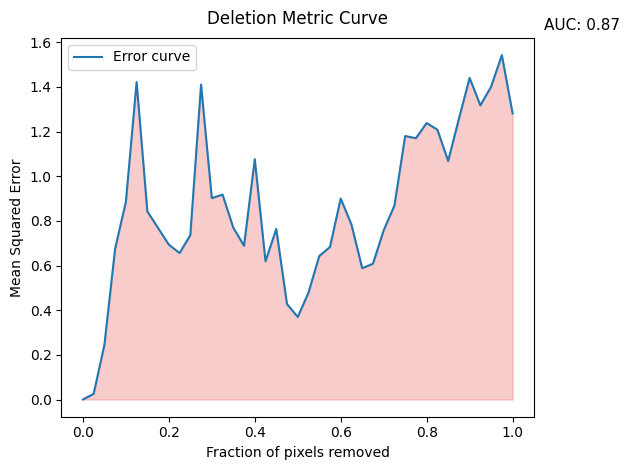

Errors: [0.0, 0.025237303, 0.24400066, 0.67529666, 0.88525414, 1.4220486, 0.84270906, 0.7680874, 0.6936018, 0.65613484, 0.73619616, 1.4107225, 0.9020775, 0.91798204, 0.7696024, 0.6886814, 1.0765265, 0.61898303, 0.7636948, 0.42753816, 0.36972943, 0.47858155, 0.64236504, 0.68327063, 0.90016913, 0.783696, 0.58801997, 0.60831124, 0.7577818, 0.86887455, 1.1801286, 1.1703612, 1.2383305, 1.208512, 1.06829, 1.2568154, 1.4405575, 1.317569, 1.4011806, 1.5426273, 1.2812108]
AUC: 0.8667537941597403
############################################################# 

Deletion 8 top pixel for Instance nr 77 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (2, 2), (4, 3), (1, 2), (4, 4), (1, 4), (3, 2), (0, 3), (0, 2), (4, 5), (3, 5), (4, 2), (4, 7), (0, 4), (2, 1), (1, 1), (4, 6), (2, 5), (3, 1), (3, 0), (0, 1), (2, 0), (3, 7), (1, 7), (1, 5), (4, 1), (3, 6), (2, 7), (4, 0), (0, 7), (1, 0), (1, 6), (0, 5), (0, 0), (2, 6), (0, 6)] 

Original prediction: [-0.4732133]
Initial Prediction with

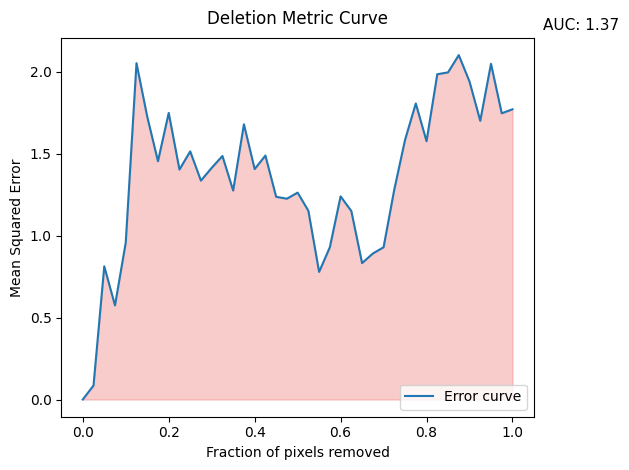

Errors: [0.0, 0.08560512, 0.8132992, 0.57442343, 0.95818657, 2.053547, 1.726857, 1.4549127, 1.7498186, 1.403978, 1.5149676, 1.3364019, 1.4144979, 1.4869037, 1.275765, 1.6804887, 1.4069836, 1.4893708, 1.2377808, 1.2259983, 1.263136, 1.1523801, 0.7790083, 0.92986375, 1.2401934, 1.1504787, 0.8328023, 0.89139396, 0.9294548, 1.2825707, 1.585457, 1.8074442, 1.5769635, 1.985952, 1.9972236, 2.102756, 1.9414591, 1.7015709, 2.04981, 1.7475469, 1.7719989]
AUC: 1.368081256188452
############################################################# 

Deletion 8 top pixel for Instance nr 78 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (2, 2), (1, 2), (0, 3), (4, 4), (1, 4), (3, 2), (0, 2), (4, 2), (3, 5), (4, 5), (0, 4), (4, 6), (4, 7), (2, 1), (2, 5), (3, 1), (3, 0), (1, 1), (3, 6), (2, 7), (3, 7), (1, 7), (2, 0), (0, 7), (1, 5), (0, 1), (2, 6), (4, 0), (1, 6), (4, 1), (0, 6), (1, 0), (0, 5), (0, 0)] 

Original prediction: [-0.22057573]
Initial Prediction with Original Images, p

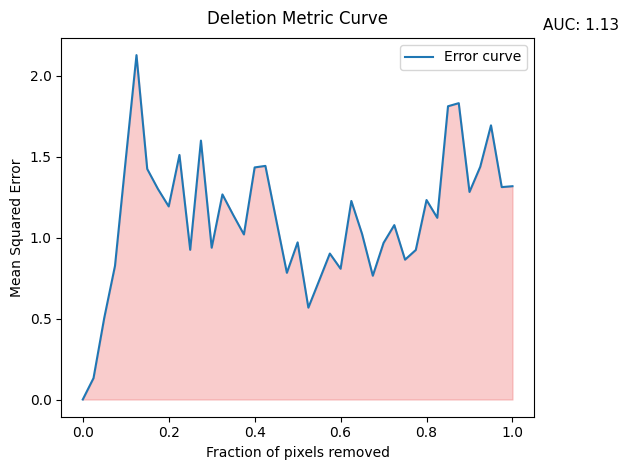

Errors: [0.0, 0.13200255, 0.504461, 0.8259917, 1.4828273, 2.1284966, 1.424855, 1.3009661, 1.1932478, 1.5112844, 0.9252047, 1.6000935, 0.9381311, 1.2675164, 1.1411605, 1.0201347, 1.4343431, 1.4437906, 1.112327, 0.7830854, 0.9711532, 0.5677079, 0.7342937, 0.9020725, 0.8080774, 1.227163, 1.02294, 0.7649785, 0.9678424, 1.0779032, 0.8642506, 0.92412055, 1.2328377, 1.1229317, 1.8124264, 1.8315276, 1.2827667, 1.438326, 1.6944952, 1.3127398, 1.318229]
AUC: 1.1347396973520516
############################################################# 

Deletion 8 top pixel for Instance nr 79 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (2, 2), (0, 3), (1, 2), (1, 4), (4, 4), (3, 2), (0, 2), (4, 2), (4, 5), (3, 5), (0, 4), (2, 5), (4, 6), (4, 7), (1, 1), (2, 1), (0, 7), (1, 7), (0, 1), (1, 5), (3, 7), (2, 7), (3, 1), (0, 6), (3, 6), (1, 6), (3, 0), (2, 0), (0, 5), (2, 6), (4, 1), (4, 0), (1, 0), (0, 0)] 

Original prediction: [0.11921395]
Initial Prediction with Original Images, pr

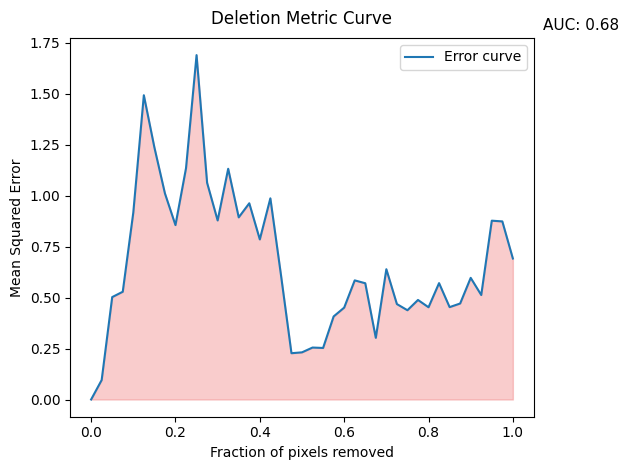

Errors: [0.0, 0.095323086, 0.5022356, 0.5283543, 0.916622, 1.4919438, 1.2363391, 1.0107162, 0.85519737, 1.1343338, 1.6887349, 1.0626189, 0.87800795, 1.1314163, 0.89316297, 0.96224, 0.78495485, 0.9865278, 0.6126899, 0.22697362, 0.23125403, 0.25476897, 0.25272933, 0.40720916, 0.45054924, 0.58412296, 0.57011753, 0.30230978, 0.6389026, 0.46800444, 0.43772316, 0.48812598, 0.4523517, 0.5706796, 0.45298994, 0.4707602, 0.5965281, 0.51237977, 0.87682855, 0.87330467, 0.69135445]
AUC: 0.6808927338570356
############################################################# 

Deletion 8 top pixel for Instance nr 80 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (2, 2), (1, 2), (4, 4), (0, 3), (1, 4), (3, 2), (0, 2), (3, 5), (4, 2), (4, 5), (0, 4), (4, 6), (4, 7), (0, 7), (1, 1), (1, 7), (2, 5), (0, 1), (2, 1), (2, 7), (3, 7), (3, 6), (0, 6), (1, 5), (1, 6), (2, 6), (0, 5), (3, 1), (2, 0), (1, 0), (3, 0), (0, 0), (4, 1), (4, 0)] 

Original prediction: [0.41192898]
Initial Predictio

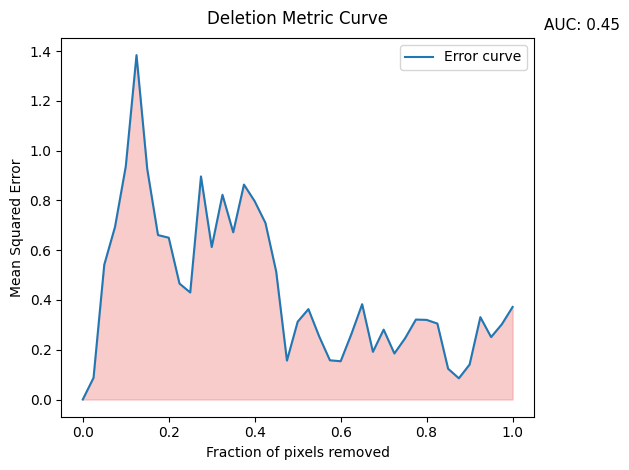

Errors: [0.0, 0.08706811, 0.54164433, 0.6936278, 0.9361925, 1.3836958, 0.9257647, 0.66066986, 0.6500494, 0.46579584, 0.4299806, 0.89623904, 0.61254865, 0.8224588, 0.67183733, 0.86350733, 0.79648954, 0.70930594, 0.5137887, 0.15637064, 0.3126411, 0.36315462, 0.2535133, 0.15751307, 0.15379378, 0.26329046, 0.3829402, 0.19158515, 0.2807587, 0.18490522, 0.2464105, 0.32120562, 0.31982157, 0.30509123, 0.12357383, 0.08519309, 0.14057599, 0.33088586, 0.25078034, 0.30240503, 0.37176356]
AUC: 0.4493238851428033
############################################################# 

Deletion 8 top pixel for Instance nr 81 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (2, 2), (1, 4), (1, 2), (4, 3), (0, 3), (4, 4), (3, 2), (0, 2), (0, 4), (4, 2), (3, 5), (4, 5), (3, 1), (4, 1), (2, 5), (2, 1), (4, 6), (0, 1), (3, 0), (1, 1), (1, 5), (0, 5), (4, 0), (4, 7), (0, 7), (0, 6), (1, 7), (2, 0), (3, 6), (1, 6), (0, 0), (1, 0), (3, 7), (2, 6), (2, 7)] 

Original prediction: [0.8613809]
Initial Pre

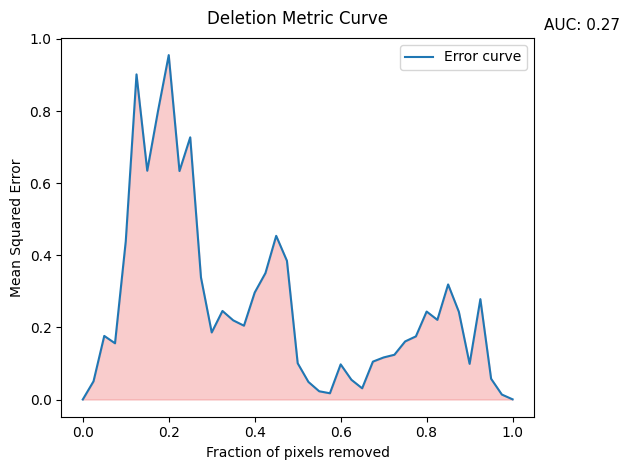

Errors: [0.0, 0.05046691, 0.17633192, 0.15591976, 0.43877274, 0.90179867, 0.6345743, 0.79998475, 0.9552544, 0.6336998, 0.72724295, 0.33845508, 0.18600929, 0.2456259, 0.21956751, 0.20473062, 0.2966909, 0.35068458, 0.4539318, 0.38470495, 0.10060216, 0.048728786, 0.022867136, 0.017300984, 0.097472794, 0.054715686, 0.031010775, 0.105072156, 0.11667452, 0.1240947, 0.16108993, 0.1750823, 0.24399115, 0.22091319, 0.31914902, 0.2432152, 0.09885509, 0.27838403, 0.057584926, 0.013745542, 0.00046230858]
AUC: 0.26713070010373485
############################################################# 

Deletion 8 top pixel for Instance nr 82 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (0, 2), (0, 4), (3, 2), (3, 5), (4, 5), (2, 5), (4, 2), (1, 7), (4, 6), (0, 7), (4, 7), (1, 5), (1, 6), (0, 6), (1, 1), (0, 5), (2, 7), (0, 1), (2, 6), (3, 6), (2, 1), (3, 7), (3, 0), (2, 0), (3, 1), (4, 0), (1, 0), (4, 1), (0, 0)] 

Original prediction: [1.095

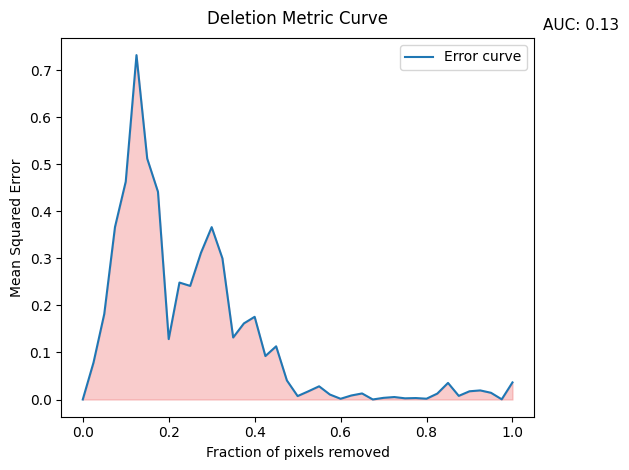

Errors: [0.0, 0.07850463, 0.18162371, 0.36654145, 0.46296754, 0.7318386, 0.5118589, 0.44144493, 0.1283653, 0.2485159, 0.24140777, 0.31159857, 0.36627692, 0.2999274, 0.13178305, 0.16172628, 0.17574349, 0.09232913, 0.11303974, 0.040558856, 0.0072896355, 0.017433623, 0.0280666, 0.010618564, 0.0015566921, 0.008543128, 0.012870657, 7.017938e-05, 0.0035320246, 0.0052476786, 0.00251511, 0.0030870584, 0.0016844629, 0.012525419, 0.035232935, 0.0077236723, 0.01748324, 0.019310346, 0.01427432, 0.00037767013, 0.036314152]
AUC: 0.13284130592091972
############################################################# 

Deletion 8 top pixel for Instance nr 83 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (2, 2), (4, 3), (1, 2), (1, 4), (0, 3), (4, 4), (3, 2), (0, 2), (0, 7), (0, 4), (3, 5), (2, 5), (4, 2), (1, 7), (4, 5), (0, 6), (1, 5), (2, 7), (3, 7), (1, 1), (4, 7), (1, 6), (2, 6), (3, 6), (2, 1), (4, 6), (0, 5), (0, 1), (2, 0), (1, 0), (3, 0), (3, 1), (0, 0), (4, 0), (4, 1)] 

Original

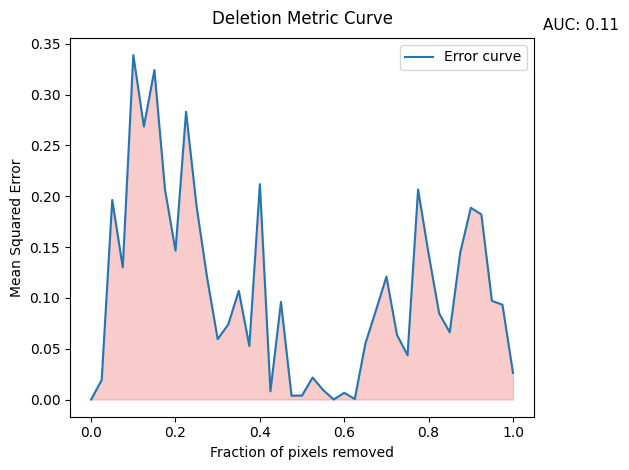

Errors: [0.0, 0.019098133, 0.19633886, 0.13001955, 0.33885586, 0.2686206, 0.32418033, 0.2068502, 0.14646254, 0.28318378, 0.18986715, 0.11953587, 0.059398536, 0.07387449, 0.10693494, 0.052650414, 0.21190986, 0.008106016, 0.09598551, 0.0036760503, 0.0039374405, 0.021605903, 0.009292987, 9.400742e-08, 0.0065940986, 0.0004883982, 0.054977696, 0.08749367, 0.120869346, 0.06355747, 0.043600906, 0.20669603, 0.14320296, 0.084693216, 0.066089675, 0.1446313, 0.18862121, 0.18212986, 0.09700333, 0.093291454, 0.02612604]
AUC: 0.1116847196477977
############################################################# 

Deletion 8 top pixel for Instance nr 84 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (1, 4), (0, 3), (2, 2), (1, 2), (4, 3), (4, 4), (0, 4), (3, 5), (0, 2), (2, 5), (3, 2), (4, 5), (1, 7), (1, 5), (0, 7), (1, 6), (2, 6), (2, 7), (3, 6), (4, 6), (4, 2), (0, 5), (0, 6), (1, 1), (3, 7), (4, 7), (0, 1), (2, 1), (3, 0), (4, 0), (3, 1), (2, 0), (1, 0), (0, 0), (4, 1)] 

Original pre

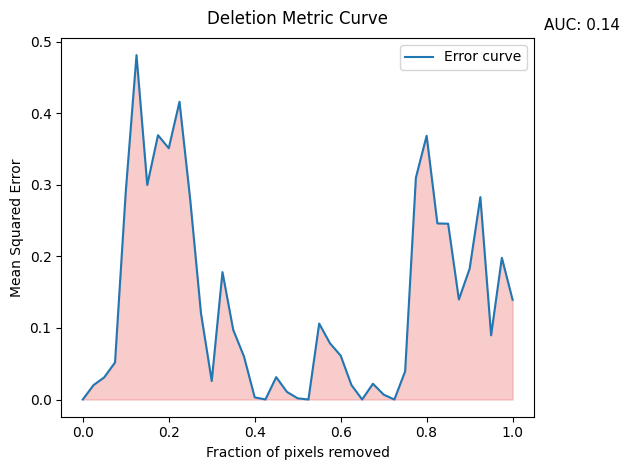

Errors: [0.0, 0.020133598, 0.031046746, 0.051798657, 0.29049432, 0.48140043, 0.29986945, 0.36946663, 0.3512464, 0.41618645, 0.2791425, 0.12044201, 0.025896251, 0.17805578, 0.09735258, 0.06019335, 0.0030069123, 5.622754e-05, 0.031273928, 0.010623552, 0.0016433836, 8.856223e-06, 0.106146924, 0.07869299, 0.06136892, 0.020311868, 1.7924367e-05, 0.022047991, 0.0068245716, 3.3340157e-06, 0.039478213, 0.31004536, 0.36870492, 0.24612355, 0.2457608, 0.13981748, 0.18283403, 0.28293034, 0.08975495, 0.19809009, 0.13937475]
AUC: 0.13969949051795538
############################################################# 

Deletion 8 top pixel for Instance nr 85 
Importants indices ->  [(2, 3), (1, 3), (3, 3), (2, 4), (3, 4), (0, 3), (1, 4), (4, 3), (2, 2), (1, 2), (4, 4), (0, 2), (3, 2), (0, 4), (3, 5), (2, 5), (4, 5), (1, 7), (4, 7), (4, 2), (0, 7), (4, 6), (1, 5), (1, 1), (2, 7), (3, 7), (1, 6), (0, 6), (2, 1), (0, 5), (3, 6), (0, 1), (2, 6), (3, 0), (4, 0), (3, 1), (2, 0), (4, 1), (1, 0), (0, 0)] 

Origina

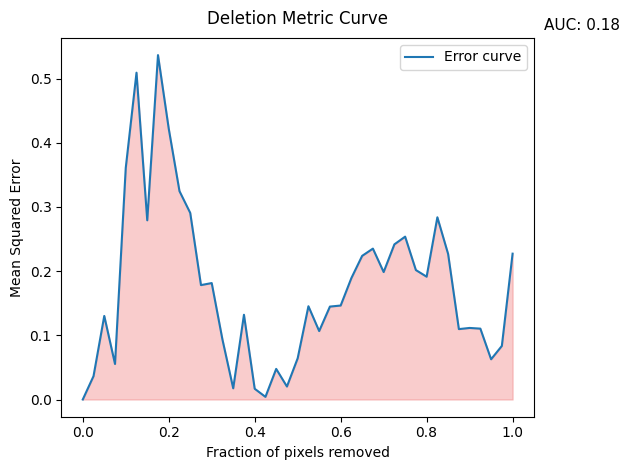

Errors: [0.0, 0.036386244, 0.13021271, 0.055358097, 0.36085454, 0.50918216, 0.27918974, 0.53656006, 0.42199862, 0.32461584, 0.2906993, 0.17823751, 0.18140511, 0.093313955, 0.017410556, 0.13201459, 0.016730607, 0.004109425, 0.04769247, 0.020223754, 0.06424284, 0.14529233, 0.106642924, 0.14476933, 0.14639303, 0.18926768, 0.2237966, 0.23507933, 0.19856523, 0.24171971, 0.25370765, 0.20165977, 0.19133647, 0.28388226, 0.22672862, 0.10967655, 0.11148506, 0.11042397, 0.06267482, 0.08346728, 0.22721966]
AUC: 0.1770154135650955
############################################################# 

Deletion 8 top pixel for Instance nr 86 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (0, 3), (4, 4), (1, 4), (1, 2), (2, 2), (0, 2), (4, 5), (3, 2), (0, 4), (3, 5), (0, 7), (2, 5), (4, 2), (4, 6), (1, 7), (4, 7), (0, 6), (1, 5), (1, 1), (1, 6), (0, 1), (2, 7), (3, 6), (3, 7), (2, 1), (0, 5), (2, 6), (3, 0), (2, 0), (3, 1), (4, 0), (1, 0), (0, 0), (4, 1)] 

Original prediction: [1.7

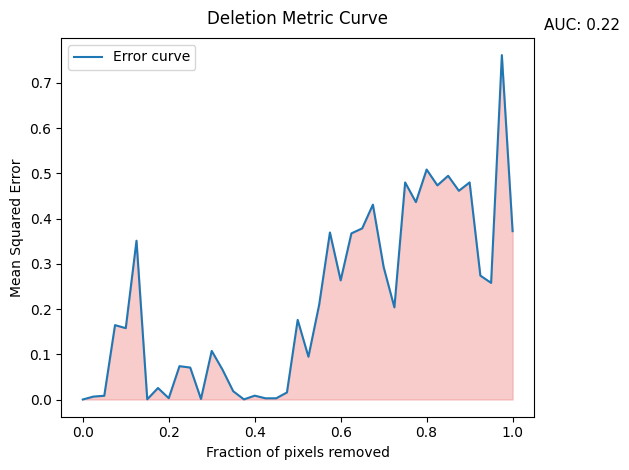

Errors: [0.0, 0.0065001305, 0.008226928, 0.16439173, 0.15771338, 0.35096496, 0.00045744886, 0.025422875, 0.00288169, 0.0737127, 0.070591226, 0.0011628219, 0.1073966, 0.066146694, 0.018263191, 0.00024405123, 0.00851149, 0.0026410967, 0.0026712136, 0.015596701, 0.17597665, 0.09453206, 0.20960881, 0.36922467, 0.2633273, 0.36722654, 0.37816122, 0.43069863, 0.29269996, 0.20360598, 0.4797846, 0.43621653, 0.5083111, 0.47328228, 0.49443337, 0.46128228, 0.4798104, 0.27384108, 0.25775212, 0.761196, 0.37207922]
AUC: 0.21701270354060395
############################################################# 

Deletion 8 top pixel for Instance nr 87 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (4, 3), (0, 3), (1, 4), (2, 2), (4, 4), (1, 2), (3, 2), (0, 4), (4, 2), (0, 2), (3, 5), (2, 5), (4, 5), (1, 5), (3, 1), (0, 5), (4, 1), (2, 1), (0, 6), (0, 1), (0, 7), (1, 1), (0, 0), (1, 7), (1, 0), (1, 6), (3, 0), (2, 0), (4, 0), (3, 6), (2, 7), (2, 6), (4, 6), (3, 7), (4, 7)] 

Original predictio

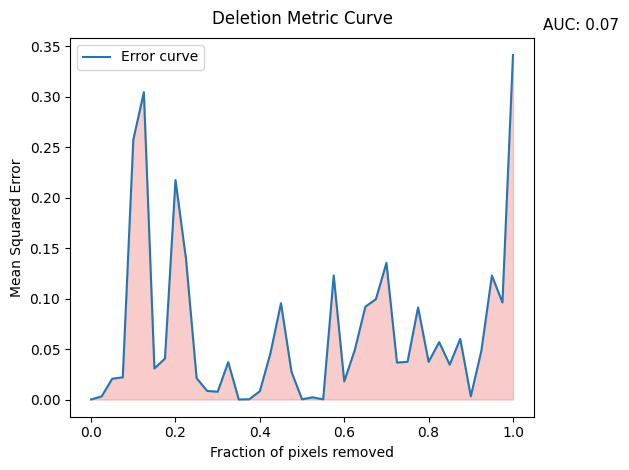

Errors: [0.0, 0.0031251407, 0.02058263, 0.022031002, 0.25753248, 0.30454272, 0.030762658, 0.040612698, 0.21748328, 0.13888074, 0.021165933, 0.008508037, 0.007706814, 0.03700138, 4.3572883e-05, 0.00025087708, 0.008270344, 0.045783035, 0.0954757, 0.027366083, 0.00016509918, 0.0021797768, 0.00013876896, 0.122959904, 0.018007874, 0.049077213, 0.0919609, 0.09938033, 0.13541569, 0.03655804, 0.037372638, 0.0912455, 0.037322875, 0.056888904, 0.0345222, 0.06012604, 0.0031424914, 0.04825635, 0.12283871, 0.09611689, 0.3413118]
AUC: 0.0650364308366079
############################################################# 

Deletion 8 top pixel for Instance nr 88 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (1, 2), (2, 2), (0, 2), (4, 5), (3, 5), (3, 2), (4, 6), (1, 7), (0, 7), (0, 4), (4, 7), (2, 5), (2, 7), (4, 2), (3, 7), (3, 6), (0, 6), (1, 6), (1, 5), (0, 1), (1, 1), (2, 6), (2, 1), (0, 5), (3, 1), (3, 0), (2, 0), (0, 0), (1, 0), (4, 1), (4, 0)] 

Ori

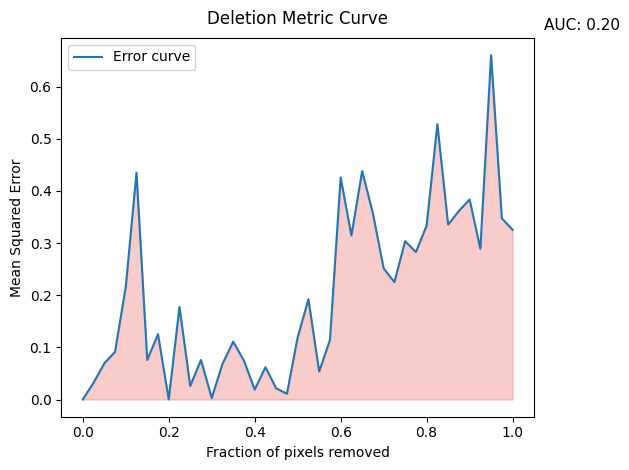

Errors: [0.0, 0.03210125, 0.06924283, 0.09137266, 0.2158877, 0.43526644, 0.07580914, 0.12539321, 0.00021933863, 0.17752427, 0.025976578, 0.07579719, 0.0027450097, 0.06828814, 0.11088571, 0.07459619, 0.018901149, 0.061965067, 0.021443252, 0.01098661, 0.11938828, 0.19233885, 0.053697072, 0.11393569, 0.42597273, 0.31443575, 0.43814653, 0.35708222, 0.25150847, 0.22515664, 0.30373475, 0.28278148, 0.333463, 0.52812445, 0.3354129, 0.36165488, 0.38366148, 0.28909096, 0.6606105, 0.34760493, 0.32547355]
AUC: 0.20437350170250285
############################################################# 

Deletion 8 top pixel for Instance nr 89 
Importants indices ->  [(2, 3), (3, 3), (3, 4), (2, 4), (1, 3), (4, 3), (0, 3), (4, 4), (2, 2), (1, 4), (1, 2), (3, 2), (0, 2), (3, 5), (0, 4), (4, 5), (4, 2), (0, 7), (1, 7), (4, 6), (4, 7), (2, 5), (0, 6), (1, 6), (2, 7), (1, 5), (3, 6), (0, 1), (3, 7), (1, 1), (3, 1), (2, 1), (3, 0), (2, 6), (0, 5), (4, 0), (4, 1), (2, 0), (0, 0), (1, 0)] 

Original prediction: [1.4

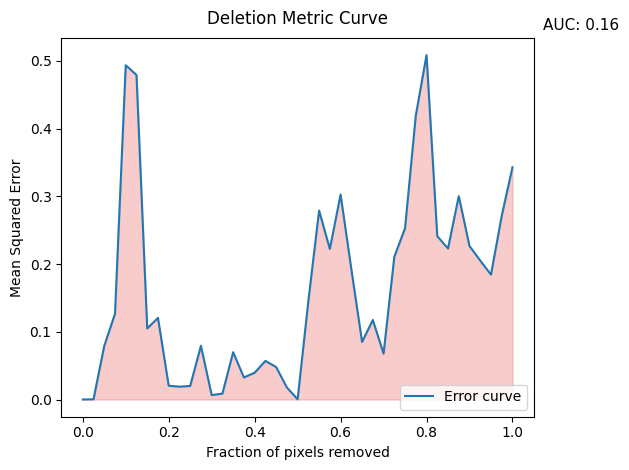

Errors: [0.0, 0.0003050344, 0.07908936, 0.12662114, 0.49363488, 0.47927395, 0.10495337, 0.120494895, 0.02028646, 0.018973462, 0.019994931, 0.079298556, 0.006506918, 0.008712764, 0.06988996, 0.032477878, 0.039557744, 0.05697822, 0.0479718, 0.017773611, 0.0002656344, 0.14567944, 0.27902097, 0.22229525, 0.30261377, 0.19248892, 0.084935546, 0.11744076, 0.067813836, 0.21070157, 0.25296322, 0.41934708, 0.5085749, 0.24113913, 0.22303136, 0.30030632, 0.2265818, 0.20515981, 0.18435147, 0.2713115, 0.3429872]
AUC: 0.16125777028355515
############################################################# 

Deletion 8 top pixel for Instance nr 90 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (1, 4), (2, 2), (4, 3), (4, 4), (1, 2), (0, 2), (3, 2), (0, 4), (4, 5), (3, 5), (0, 7), (1, 7), (4, 2), (4, 7), (4, 6), (2, 5), (1, 5), (0, 6), (3, 7), (2, 7), (1, 1), (0, 1), (1, 6), (0, 5), (2, 1), (3, 6), (3, 1), (4, 0), (4, 1), (3, 0), (2, 6), (0, 0), (2, 0), (1, 0)] 

Original prediction:

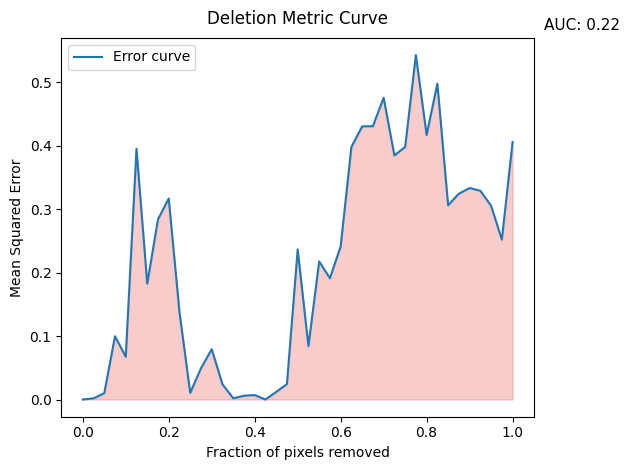

Errors: [0.0, 0.001832795, 0.009982156, 0.09964312, 0.06728088, 0.39490885, 0.18244572, 0.2837281, 0.31660986, 0.13760646, 0.01045752, 0.049243942, 0.07918098, 0.02398576, 0.001958897, 0.005942394, 0.006993692, 2.7761832e-06, 0.011968941, 0.024281029, 0.23639286, 0.08403258, 0.2175143, 0.19099185, 0.24120148, 0.39782143, 0.43015072, 0.4304685, 0.47533724, 0.38443077, 0.3977169, 0.54238784, 0.41669226, 0.49750558, 0.30599436, 0.32408708, 0.33308917, 0.32866442, 0.30513424, 0.2517466, 0.40551507]
AUC: 0.21755428905084384
############################################################# 

Deletion 8 top pixel for Instance nr 91 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (0, 3), (4, 3), (4, 4), (2, 2), (1, 2), (1, 4), (0, 2), (3, 2), (3, 5), (0, 7), (4, 5), (1, 7), (4, 7), (0, 4), (4, 6), (2, 5), (2, 7), (4, 2), (3, 7), (0, 6), (1, 6), (3, 6), (1, 5), (2, 6), (2, 1), (1, 1), (0, 1), (3, 0), (3, 1), (0, 5), (2, 0), (4, 0), (4, 1), (1, 0), (0, 0)] 

Original prediction: [1.

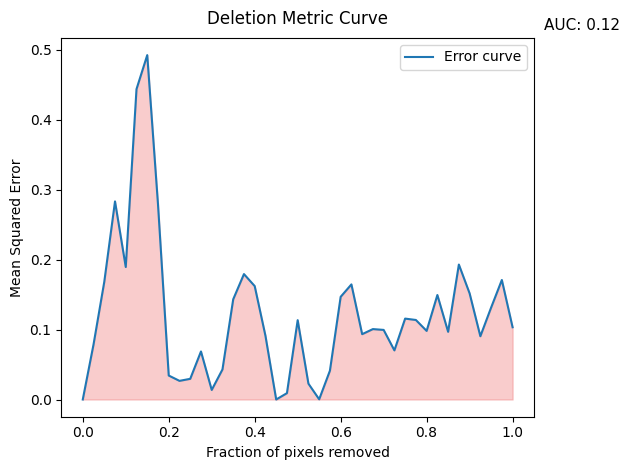

Errors: [0.0, 0.078613214, 0.16818151, 0.28329545, 0.18949033, 0.44389492, 0.49253896, 0.2792123, 0.034280136, 0.026665306, 0.029563107, 0.068693966, 0.0136904465, 0.042967435, 0.14330141, 0.17936149, 0.1622143, 0.09119445, 7.585024e-06, 0.00908106, 0.11344451, 0.022677403, 0.00028366927, 0.041200608, 0.14686887, 0.16461182, 0.09343511, 0.10069871, 0.09953281, 0.070256904, 0.11569805, 0.113734104, 0.09809853, 0.14942046, 0.09681092, 0.19300596, 0.15179218, 0.090481445, 0.13141577, 0.17092139, 0.10334324]
AUC: 0.12380770530830887
############################################################# 

Deletion 8 top pixel for Instance nr 92 
Importants indices ->  [(2, 3), (3, 3), (2, 4), (3, 4), (1, 3), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (0, 2), (3, 2), (3, 5), (0, 4), (4, 5), (0, 7), (1, 7), (4, 2), (2, 5), (4, 6), (4, 7), (0, 6), (3, 7), (1, 5), (1, 1), (2, 7), (3, 6), (1, 6), (0, 1), (2, 1), (0, 5), (2, 6), (3, 1), (3, 0), (4, 0), (2, 0), (4, 1), (1, 0), (0, 0)] 

Original predi

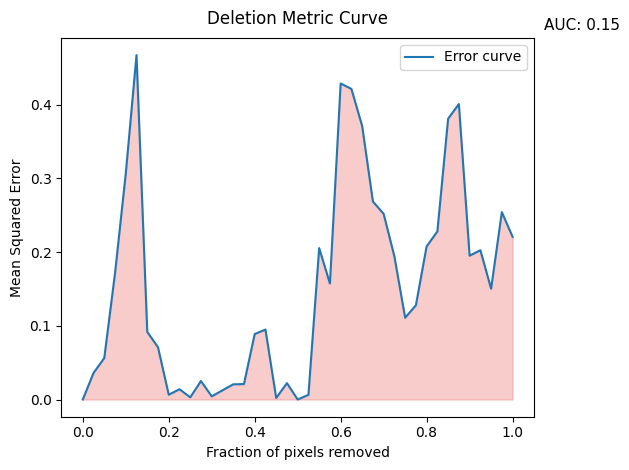

Errors: [0.0, 0.035977636, 0.056288116, 0.17125757, 0.306597, 0.46740523, 0.09178067, 0.07092602, 0.006515383, 0.013936388, 0.0029639625, 0.025086991, 0.00426996, 0.012473095, 0.020602643, 0.020963572, 0.088871494, 0.094922885, 0.0021041613, 0.022207197, 7.4640343e-06, 0.006333689, 0.20550834, 0.15737763, 0.4289429, 0.421513, 0.37122256, 0.26866108, 0.25194192, 0.19414578, 0.11101095, 0.12786427, 0.20784064, 0.22810088, 0.38109758, 0.40098444, 0.19517945, 0.20265645, 0.15041523, 0.25429907, 0.22080457]
AUC: 0.15476638866695108
############################################################# 

Deletion 8 top pixel for Instance nr 93 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (4, 4), (1, 4), (2, 2), (1, 2), (3, 2), (0, 2), (0, 4), (4, 5), (0, 7), (3, 5), (4, 7), (4, 2), (4, 6), (1, 7), (2, 5), (3, 7), (0, 6), (2, 7), (1, 5), (3, 6), (0, 5), (1, 6), (3, 0), (4, 0), (0, 1), (4, 1), (3, 1), (1, 1), (2, 6), (2, 1), (2, 0), (1, 0), (0, 0)] 

Original predict

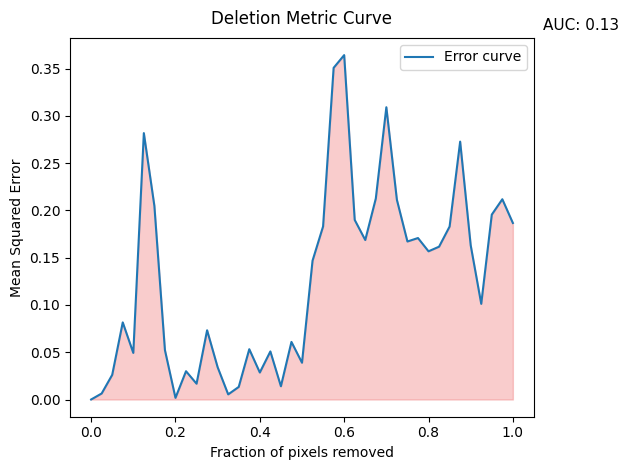

Errors: [0.0, 0.0063797287, 0.026078315, 0.08158415, 0.049292576, 0.28186837, 0.20485906, 0.05228757, 0.0017498439, 0.029929858, 0.016723422, 0.073251635, 0.03413616, 0.0054156343, 0.01330931, 0.053222112, 0.028569795, 0.05086089, 0.01401799, 0.060920157, 0.03890089, 0.14688312, 0.18312572, 0.35092464, 0.36439702, 0.1900066, 0.16876103, 0.21262293, 0.30924118, 0.21130632, 0.16718744, 0.1708516, 0.15680026, 0.16169748, 0.18302467, 0.27286306, 0.16318767, 0.10122036, 0.19564043, 0.21189977, 0.18674853]
AUC: 0.12845932543568778
############################################################# 

Deletion 8 top pixel for Instance nr 94 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (0, 3), (4, 3), (1, 4), (4, 4), (1, 2), (2, 2), (0, 2), (0, 4), (3, 2), (4, 5), (4, 6), (4, 2), (3, 5), (4, 7), (0, 7), (1, 7), (2, 5), (1, 5), (3, 7), (3, 0), (4, 1), (3, 6), (0, 6), (0, 1), (4, 0), (3, 1), (0, 5), (1, 1), (2, 7), (2, 1), (1, 6), (2, 0), (2, 6), (0, 0), (1, 0)] 

Original predictio

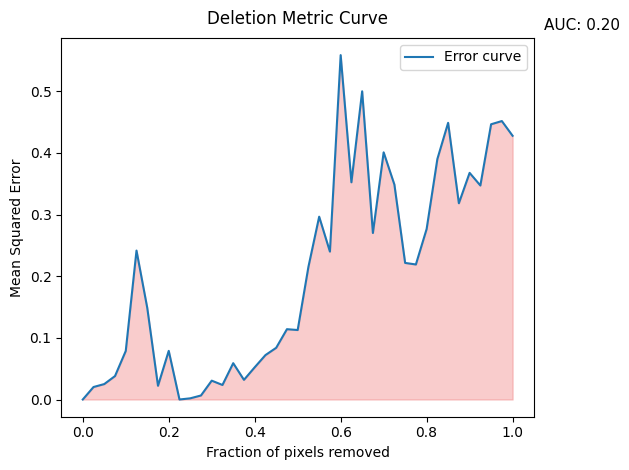

Errors: [0.0, 0.020263443, 0.025036188, 0.038021814, 0.07875098, 0.2415956, 0.14878057, 0.02224761, 0.07891573, 9.585858e-06, 0.0019011335, 0.0065292846, 0.030573227, 0.023580393, 0.058938295, 0.0318701, 0.052249853, 0.07203815, 0.08388543, 0.11406964, 0.11270396, 0.21526213, 0.29657307, 0.23991144, 0.558691, 0.35235918, 0.49998438, 0.27012482, 0.4009497, 0.3486709, 0.2215648, 0.21905363, 0.27657866, 0.39017704, 0.44883245, 0.31837153, 0.3676669, 0.3471606, 0.44650298, 0.45171538, 0.42781875]
AUC: 0.2031505245071912
############################################################# 

Deletion 8 top pixel for Instance nr 95 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 4), (4, 3), (0, 3), (2, 2), (1, 2), (1, 4), (0, 2), (3, 2), (4, 5), (3, 5), (0, 7), (1, 7), (0, 4), (4, 7), (4, 6), (4, 2), (2, 5), (0, 6), (2, 7), (3, 7), (1, 6), (3, 6), (0, 1), (1, 1), (1, 5), (2, 1), (0, 5), (2, 6), (4, 0), (3, 0), (3, 1), (2, 0), (4, 1), (1, 0), (0, 0)] 

Original prediction: [1.095

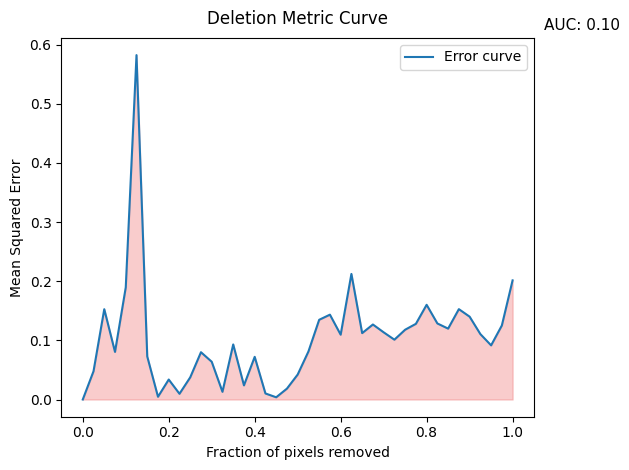

Errors: [0.0, 0.047772948, 0.15274486, 0.08048386, 0.18958531, 0.5824594, 0.07281871, 0.004659454, 0.033774897, 0.009691594, 0.03747166, 0.07997737, 0.06385709, 0.013005152, 0.09312586, 0.023907434, 0.07215504, 0.0102047715, 0.003761832, 0.018403359, 0.042230424, 0.081176, 0.13479812, 0.14348698, 0.10962203, 0.2124059, 0.1122813, 0.12685499, 0.1136351, 0.10118183, 0.11802879, 0.12796353, 0.16015136, 0.12862022, 0.119884565, 0.15281652, 0.14011589, 0.11065491, 0.091576695, 0.12518051, 0.20147085]
AUC: 0.10358154239947909
############################################################# 

Deletion 8 top pixel for Instance nr 96 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (0, 3), (1, 4), (4, 4), (2, 2), (1, 2), (0, 2), (3, 2), (4, 5), (0, 4), (3, 5), (4, 7), (4, 6), (0, 7), (4, 2), (1, 7), (2, 5), (3, 7), (2, 7), (3, 6), (0, 1), (1, 5), (0, 6), (2, 6), (1, 6), (1, 1), (0, 5), (2, 1), (3, 1), (3, 0), (0, 0), (4, 0), (4, 1), (2, 0), (1, 0)] 

Original prediction: [0

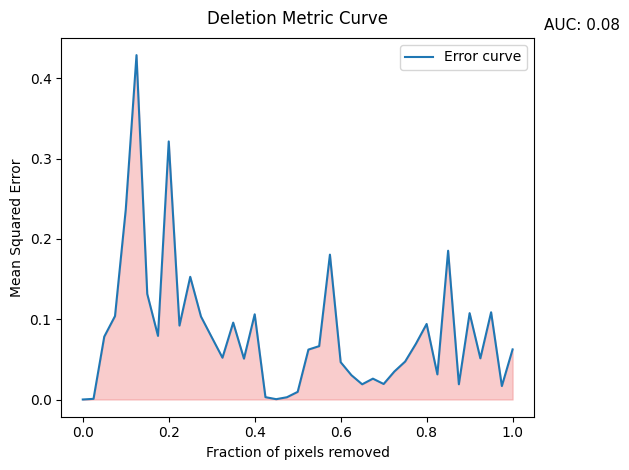

Errors: [0.0, 0.00082817767, 0.07828554, 0.103895396, 0.23654589, 0.42889878, 0.13148288, 0.07925231, 0.32139632, 0.092095494, 0.15279667, 0.10332665, 0.07760659, 0.05205602, 0.09575814, 0.050885573, 0.10612758, 0.0029240027, 0.00040837776, 0.002831395, 0.009507708, 0.062160388, 0.0664663, 0.18042193, 0.046494674, 0.030300075, 0.018946443, 0.02597241, 0.019322889, 0.034914866, 0.04725945, 0.069367416, 0.09406927, 0.031277806, 0.185303, 0.0189809, 0.107558005, 0.051267143, 0.10865882, 0.016764563, 0.062392548]
AUC: 0.0843403032173228
############################################################# 

Deletion 8 top pixel for Instance nr 97 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (2, 4), (3, 4), (0, 3), (4, 3), (1, 2), (2, 2), (4, 4), (1, 4), (0, 2), (3, 2), (4, 5), (0, 4), (4, 7), (4, 6), (3, 5), (4, 2), (1, 7), (0, 7), (2, 5), (0, 1), (3, 7), (1, 1), (2, 7), (3, 6), (0, 6), (1, 5), (2, 1), (1, 6), (3, 1), (0, 5), (4, 1), (2, 6), (3, 0), (0, 0), (4, 0), (2, 0), (1, 0)] 

Original p

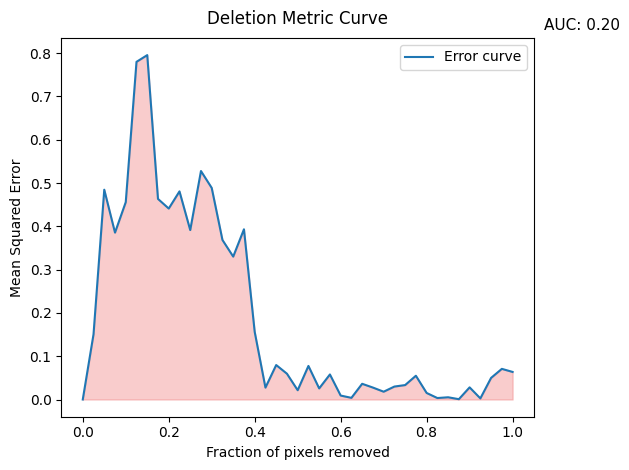

Errors: [0.0, 0.15056838, 0.48449662, 0.38544875, 0.45582917, 0.779829, 0.79538065, 0.46327502, 0.44101351, 0.48066837, 0.3913403, 0.5276639, 0.4886455, 0.3684179, 0.33003926, 0.39311403, 0.15616882, 0.027483959, 0.079612605, 0.059605896, 0.021455752, 0.07751622, 0.025641968, 0.057836395, 0.00911771, 0.003839911, 0.036276337, 0.027582467, 0.018012753, 0.029902354, 0.033325683, 0.054860614, 0.01512411, 0.003377146, 0.005149583, 0.0007393431, 0.028029107, 0.0025519154, 0.049928814, 0.07076255, 0.06368057]
AUC: 0.1965368162462255
############################################################# 

Deletion 8 top pixel for Instance nr 98 
Importants indices ->  [(2, 3), (3, 3), (3, 4), (1, 3), (4, 3), (2, 4), (4, 4), (2, 2), (1, 2), (0, 3), (3, 2), (1, 4), (4, 2), (0, 2), (4, 5), (3, 5), (4, 6), (0, 4), (4, 7), (0, 7), (2, 5), (2, 1), (1, 1), (1, 7), (3, 7), (0, 1), (3, 6), (3, 1), (1, 5), (0, 6), (2, 7), (1, 6), (2, 0), (0, 5), (3, 0), (1, 0), (4, 1), (2, 6), (0, 0), (4, 0)] 

Original predict

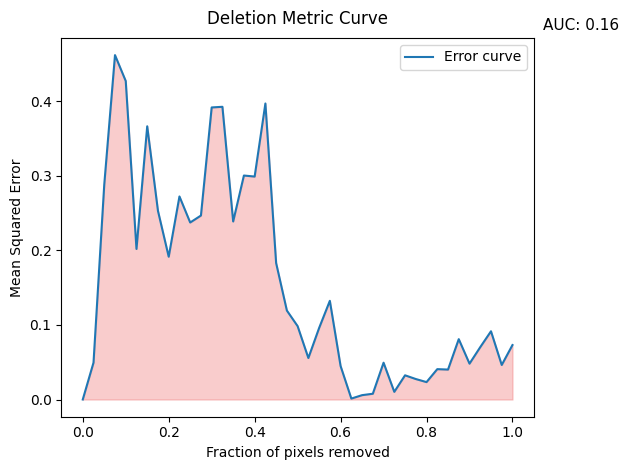

Errors: [0.0, 0.04942978, 0.28824052, 0.46201852, 0.42729032, 0.20196478, 0.36652082, 0.2530684, 0.19154648, 0.2723951, 0.23745346, 0.24679677, 0.39181218, 0.39267763, 0.23885112, 0.30047032, 0.29909417, 0.39711782, 0.18304934, 0.11934893, 0.098427504, 0.055666283, 0.095907584, 0.13237509, 0.044922184, 0.001257126, 0.005832491, 0.007722714, 0.049366802, 0.010279359, 0.032463174, 0.027467253, 0.023352975, 0.040734842, 0.040160768, 0.080972895, 0.048092283, 0.070257396, 0.09154544, 0.04632927, 0.07306696]
AUC: 0.15897033440996894
############################################################# 

Deletion 8 top pixel for Instance nr 99 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (4, 4), (0, 3), (2, 2), (1, 2), (1, 4), (0, 2), (3, 2), (0, 4), (4, 5), (4, 2), (3, 5), (4, 7), (4, 6), (1, 7), (0, 7), (2, 5), (2, 7), (3, 7), (0, 1), (1, 1), (3, 6), (1, 5), (2, 6), (2, 1), (1, 6), (0, 6), (0, 5), (3, 1), (3, 0), (2, 0), (1, 0), (0, 0), (4, 0), (4, 1)] 

Original predic

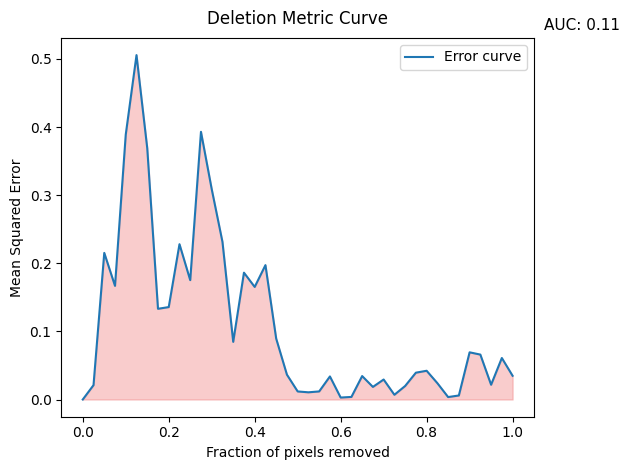

Errors: [0.0, 0.021079998, 0.21523947, 0.16681378, 0.38898477, 0.5055918, 0.3689916, 0.13317105, 0.13567103, 0.22799802, 0.17522164, 0.39298338, 0.30881938, 0.23141725, 0.08464823, 0.18618733, 0.16527359, 0.19727026, 0.089396596, 0.036447532, 0.011813897, 0.010564485, 0.011859732, 0.03385614, 0.0028699655, 0.0037619856, 0.03440597, 0.018486332, 0.029339481, 0.006932555, 0.019840337, 0.03937307, 0.042186927, 0.023994181, 0.003579359, 0.0059044748, 0.06926962, 0.06593491, 0.021658204, 0.060919862, 0.034825932]
AUC: 0.11412927943165416
############################################################# 

Deletion 8 top pixel for Instance nr 100 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (0, 3), (1, 2), (4, 4), (2, 2), (0, 2), (3, 2), (1, 4), (4, 2), (4, 5), (0, 4), (3, 5), (0, 7), (4, 7), (4, 6), (1, 7), (1, 1), (0, 1), (3, 7), (2, 5), (2, 7), (2, 1), (3, 6), (0, 6), (1, 5), (1, 6), (2, 6), (3, 1), (0, 5), (2, 0), (3, 0), (1, 0), (4, 1), (0, 0), (4, 0)] 

Original 

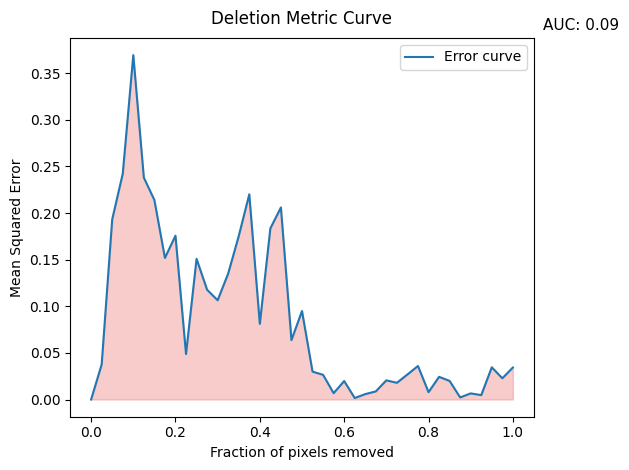

Errors: [0.0, 0.037555173, 0.19322939, 0.24227916, 0.3695165, 0.23810017, 0.21402556, 0.15191612, 0.17576128, 0.04877435, 0.15091106, 0.11772923, 0.10650928, 0.13520187, 0.17533863, 0.22013155, 0.081193425, 0.18361649, 0.20604856, 0.06373921, 0.0949278, 0.029901033, 0.026474413, 0.0067994427, 0.019817054, 0.0015826919, 0.005792642, 0.008704186, 0.020562248, 0.017913105, 0.026859641, 0.035955615, 0.007870174, 0.02432442, 0.019947223, 0.002241903, 0.0065625017, 0.0047019534, 0.034558266, 0.0227797, 0.034309495]
AUC: 0.08867519414052367
############################################################# 

Deletion 8 top pixel for Instance nr 101 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (4, 4), (0, 3), (1, 2), (2, 2), (1, 4), (0, 2), (3, 2), (4, 2), (4, 5), (3, 5), (4, 7), (4, 6), (0, 4), (0, 7), (1, 7), (1, 1), (0, 1), (3, 7), (2, 1), (3, 6), (2, 5), (0, 6), (2, 7), (3, 1), (1, 6), (3, 0), (4, 1), (1, 5), (2, 0), (4, 0), (2, 6), (0, 5), (1, 0), (0, 0)] 

Original

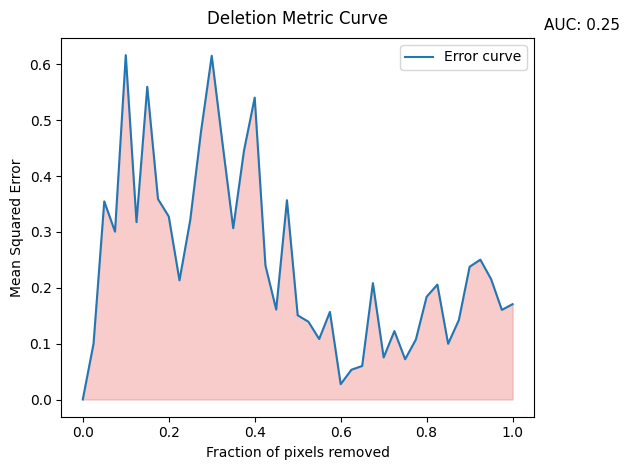

Errors: [0.0, 0.099756114, 0.35474718, 0.30049038, 0.6165644, 0.31754553, 0.5598214, 0.35888937, 0.32773364, 0.21333618, 0.3210805, 0.4792181, 0.6153893, 0.45922604, 0.3066154, 0.44535124, 0.5405055, 0.23990116, 0.16104563, 0.3567902, 0.15073274, 0.13919897, 0.10830168, 0.15681073, 0.027436037, 0.05331453, 0.05999361, 0.20836939, 0.07537028, 0.12251746, 0.072077446, 0.10745345, 0.18400384, 0.20571455, 0.09975156, 0.14232469, 0.23765893, 0.25033462, 0.21546428, 0.16044609, 0.17069249]
AUC: 0.24841571161523465
############################################################# 

Deletion 8 top pixel for Instance nr 102 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (2, 4), (4, 3), (1, 2), (2, 2), (0, 3), (4, 4), (0, 2), (1, 4), (3, 2), (4, 2), (4, 5), (3, 5), (0, 4), (4, 6), (4, 7), (0, 7), (1, 7), (1, 1), (0, 1), (2, 5), (2, 1), (3, 7), (3, 6), (0, 6), (2, 7), (1, 6), (1, 5), (3, 1), (0, 5), (2, 6), (3, 0), (2, 0), (4, 1), (1, 0), (0, 0), (4, 0)] 

Original prediction: [0.35427085]


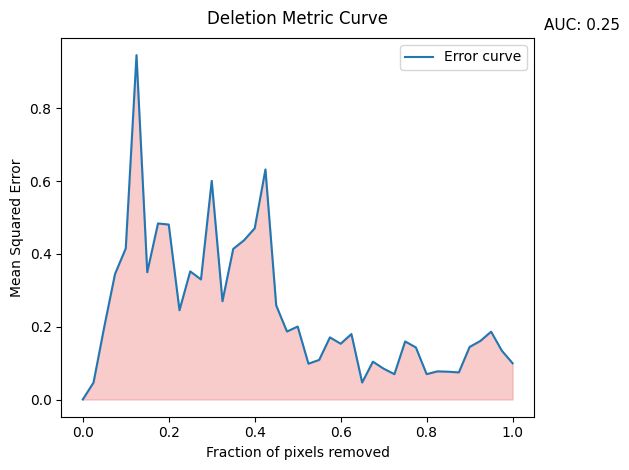

Errors: [0.0, 0.04650371, 0.19981667, 0.34483415, 0.41521633, 0.9464157, 0.3497179, 0.48374084, 0.480814, 0.24531774, 0.35209328, 0.3298771, 0.60095984, 0.27001926, 0.41387054, 0.43736523, 0.47053188, 0.6321959, 0.25863394, 0.18686871, 0.20047152, 0.098390035, 0.10880947, 0.17075704, 0.15322387, 0.17989884, 0.046661686, 0.10393961, 0.084741496, 0.06963479, 0.15958261, 0.14302772, 0.0696648, 0.07732422, 0.07635621, 0.07452144, 0.14442235, 0.16090216, 0.18637978, 0.13409571, 0.099582896]
AUC: 0.24893473889678716
############################################################# 

Deletion 8 top pixel for Instance nr 103 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (4, 4), (0, 3), (2, 2), (1, 2), (3, 2), (0, 2), (1, 4), (4, 2), (4, 5), (4, 6), (3, 5), (4, 7), (0, 4), (0, 7), (1, 1), (1, 7), (3, 7), (2, 5), (2, 1), (0, 1), (2, 7), (3, 6), (3, 1), (0, 6), (2, 0), (1, 5), (3, 0), (1, 6), (1, 0), (2, 6), (4, 1), (0, 5), (0, 0), (4, 0)] 

Original prediction: [0.5229144]

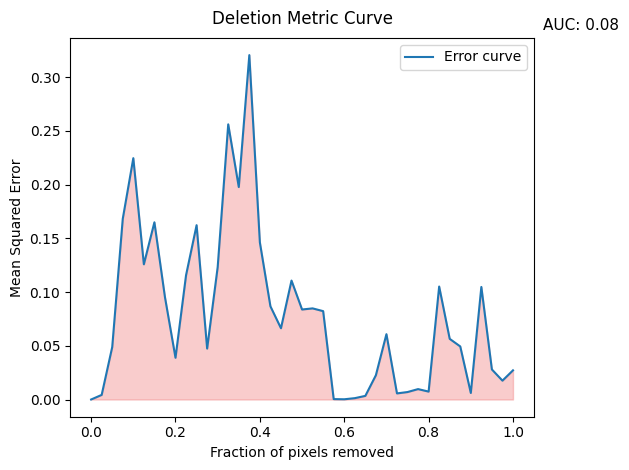

Errors: [0.0, 0.004278182, 0.048790514, 0.16822776, 0.22464405, 0.12583266, 0.16496052, 0.09532176, 0.0388621, 0.11567352, 0.1622529, 0.047417015, 0.12329596, 0.2561298, 0.19778767, 0.32058463, 0.14621606, 0.086754054, 0.066338755, 0.1107033, 0.08377181, 0.08481809, 0.08225494, 0.00036902796, 0.00021045984, 0.0012474676, 0.0033672054, 0.02259266, 0.06081531, 0.0056742793, 0.0069461996, 0.009683685, 0.0073577627, 0.10514706, 0.056448504, 0.04939042, 0.0061085643, 0.104756735, 0.027965, 0.017549315, 0.027150668]
AUC: 0.08135302605005565
############################################################# 

Deletion 8 top pixel for Instance nr 104 
Importants indices ->  [(2, 3), (3, 3), (1, 3), (3, 4), (4, 3), (2, 4), (2, 2), (4, 4), (1, 2), (0, 3), (3, 2), (0, 2), (1, 4), (4, 5), (4, 2), (3, 5), (4, 6), (4, 7), (0, 4), (1, 1), (0, 7), (1, 7), (0, 1), (2, 5), (3, 7), (2, 1), (3, 6), (2, 7), (0, 6), (3, 1), (3, 0), (1, 5), (2, 0), (1, 6), (2, 6), (1, 0), (0, 5), (4, 1), (0, 0), (4, 0)] 

Origina

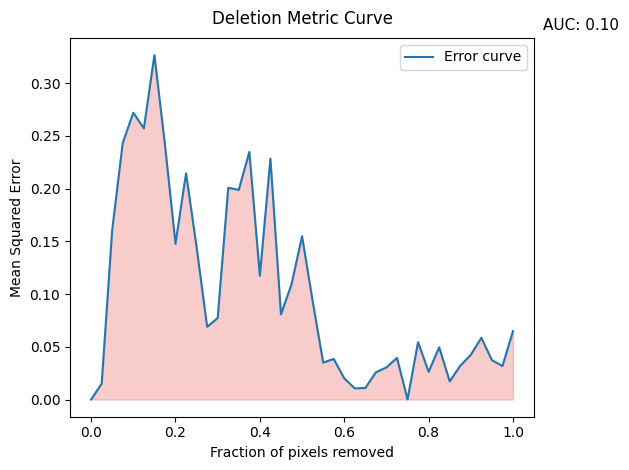

Errors: [0.0, 0.015017994, 0.16092236, 0.24335103, 0.27187887, 0.25699827, 0.32647452, 0.24133861, 0.14769167, 0.21442546, 0.14442265, 0.068902895, 0.0772554, 0.20066263, 0.1987818, 0.23475549, 0.11733914, 0.22833574, 0.08075485, 0.10920965, 0.15477721, 0.09354267, 0.035037998, 0.038468372, 0.020041972, 0.010519968, 0.010964081, 0.025758334, 0.030487536, 0.039421882, 0.00011868185, 0.054394506, 0.026208865, 0.04952271, 0.01715681, 0.031995103, 0.042356826, 0.05845733, 0.03732511, 0.03172948, 0.06480473]
AUC: 0.10448017073013034
############################################################# 



In [ ]:
# DELETION: Remove the top 40 most important pixels in descending order of importance

# Statistics of the Deletion with elements of the type: [errors, auc]
deletion_stats_vott_norm_all_lstm = []

models = vott_lstm_models_loaded

for i, top_n_pixel_i in enumerate(important_indices):
    print(f"Deletion 8 top pixels for Instance nr {i} ")  # Note: This statement is incorrect; all 40 pixels are being processed.
    nr_instance = i
    errors, auc = get_errors_from_deletion(vottignasco_test_image, vottingasco_test_OHE, nr_instance, top_n_pixel_i, models)
    deletion_stats_vott_norm_all_lstm.append(np.array([errors, auc], dtype=object))
    print(f"Errors: {errors}")
    print(f"AUC: {auc}")
    print("#############################################################", "\n")
